In [1]:
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
os.chdir('/Users/Max/Documents/Studium/Master/Semester 2/Programming/Scripts')

(60000, 28, 28)
(60000, 10)


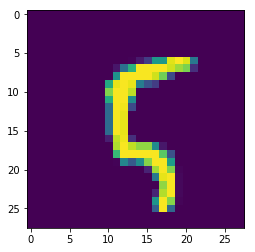

[0.01 0.01 0.01 0.01 0.01 0.99 0.01 0.01 0.01 0.01]


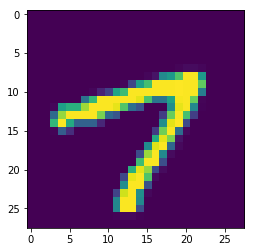

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.99 0.01 0.01]


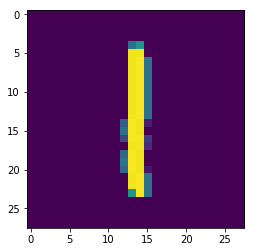

[0.01 0.99 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01]


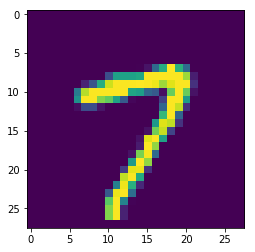

[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.99 0.01 0.01]


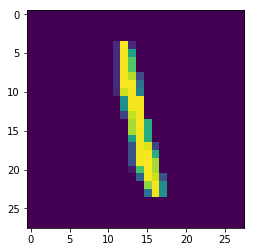

[0.01 0.99 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01]


In [2]:
# Run pre-processing script to import dataset in usable format
%run ./Data_preprocessing.ipynb

In [8]:
@np.vectorize
def sigmoid(x):
    return 1 / (1 + np.e ** -x)
activation_function = sigmoid
from scipy.stats import truncnorm
def truncated_normal(mean=0, sd=1, low=0, upp=10):
    return truncnorm((low - mean) / sd, 
                     (upp - mean) / sd, 
                     loc=mean, 
                     scale=sd)
class NeuralNetwork:
    
    def __init__(self, 
                 no_of_in_nodes, 
                 no_of_out_nodes, 
                 no_of_hidden_nodes,
                 learning_rate):
        self.no_of_in_nodes = no_of_in_nodes
        self.no_of_out_nodes = no_of_out_nodes
        self.no_of_hidden_nodes = no_of_hidden_nodes
        self.learning_rate = learning_rate 
        self.create_weight_matrices()
        
    def create_weight_matrices(self):
        """ 
        A method to initialize the weight 
        matrices of the neural network
        """
        rad = 1 / np.sqrt(self.no_of_in_nodes)
        X = truncated_normal(mean=0, 
                             sd=1, 
                             low=-rad, 
                             upp=rad)
        self.wih = X.rvs((self.no_of_hidden_nodes, 
                                       self.no_of_in_nodes))
        rad = 1 / np.sqrt(self.no_of_hidden_nodes)
        X = truncated_normal(mean=0, sd=1, low=-rad, upp=rad)
        self.who = X.rvs((self.no_of_out_nodes, 
                                         self.no_of_hidden_nodes))
        
    
    def train(self, input_vector, target_vector):
        """
        input_vector and target_vector can 
        be tuple, list or ndarray
        """
        
        input_vector = np.array(input_vector, ndmin=2).T
        target_vector = np.array(target_vector, ndmin=2).T
        
        output_vector1 = np.dot(self.wih, 
                                input_vector)
        output_hidden = activation_function(output_vector1)
        
        output_vector2 = np.dot(self.who, 
                                output_hidden)
        output_network = activation_function(output_vector2)
        
        output_errors = target_vector - output_network
        print(output_errors)
        # update the weights:
        tmp = output_errors * output_network \
              * (1.0 - output_network)     
        tmp = self.learning_rate  * np.dot(tmp, 
                                           output_hidden.T)
        self.who += tmp
        # calculate hidden errors:
        hidden_errors = np.dot(self.who.T, 
                               output_errors)
        # update the weights:
        tmp = hidden_errors * output_hidden * \
              (1.0 - output_hidden)
        self.wih += self.learning_rate \
                          * np.dot(tmp, input_vector.T)
        
        
    
    def run(self, input_vector):
        # input_vector can be tuple, list or ndarray
        input_vector = np.array(input_vector, ndmin=2).T
        output_vector = np.dot(self.wih, 
                               input_vector)
        output_vector = activation_function(output_vector)
        
        output_vector = np.dot(self.who, 
                               output_vector)
        output_vector = activation_function(output_vector)
    
        return output_vector
            
    def confusion_matrix(self, data_array, labels):
        cm = np.zeros((10, 10), int)
        for i in range(len(data_array)):
            res = self.run(data_array[i])
            res_max = res.argmax()
            target = labels[i][0]
            cm[res_max, int(target)] += 1
        return cm    
    def precision(self, label, confusion_matrix):
        col = confusion_matrix[:, label]
        return confusion_matrix[label, label] / col.sum()
    
    def recall(self, label, confusion_matrix):
        row = confusion_matrix[label, :]
        return confusion_matrix[label, label] / row.sum()
        
    
    def evaluate(self, data, labels):
        corrects, wrongs = 0, 0
        for i in range(len(data)):
            res = self.run(data[i])
            res_max = res.argmax()
            if res_max == labels[i]:
                corrects += 1
            else:
                wrongs += 1
        return corrects, wrongs

In [9]:
ANN = NeuralNetwork(no_of_in_nodes = 784, 
                    no_of_out_nodes = 10, 
                    no_of_hidden_nodes = 100,
                    learning_rate = 0.1)
    
    
for i in range(len(train_images)):
    ANN.train(train_images[i].flatten(), train_labels[i])

[[-0.57155209]
 [-0.49324488]
 [-0.45344293]
 [-0.48759685]
 [-0.50467871]
 [ 0.36955952]
 [-0.49255184]
 [-0.36336486]
 [-0.49270319]
 [-0.43318531]]
[[ 0.49985268]
 [-0.3905538 ]
 [-0.36682482]
 [-0.40434187]
 [-0.40751371]
 [-0.66342044]
 [-0.39881514]
 [-0.29303297]
 [-0.39317924]
 [-0.35233002]]
[[-0.5633813 ]
 [-0.34330627]
 [-0.31925534]
 [-0.34407624]
 [ 0.61850016]
 [-0.58006716]
 [-0.34781605]
 [-0.26613515]
 [-0.3605081 ]
 [-0.30447104]]
[[-0.46942917]
 [ 0.69391176]
 [-0.27729739]
 [-0.29095892]
 [-0.44831468]
 [-0.46770001]
 [-0.3012613 ]
 [-0.22922443]
 [-0.2979229 ]
 [-0.26410626]]
[[-0.38887686]
 [-0.36290479]
 [-0.23670127]
 [-0.24671575]
 [-0.37545857]
 [-0.38072694]
 [-0.25231725]
 [-0.19650083]
 [-0.25129889]
 [ 0.75870509]]
[[-0.32173168]
 [-0.2939725 ]
 [ 0.7741476 ]
 [-0.2058993 ]
 [-0.29692507]
 [-0.30529435]
 [-0.2140628 ]
 [-0.16514155]
 [-0.21346435]
 [-0.3052931 ]]
[[-0.27761662]
 [ 0.71485849]
 [-0.28861625]
 [-0.20527969]
 [-0.27039497]
 [-0.28434932]
 [-0

[[-0.09365729]
 [-0.08272515]
 [-0.11214274]
 [ 0.89518518]
 [-0.07559103]
 [-0.06107412]
 [-0.06562264]
 [-0.04893499]
 [-0.05107582]
 [-0.17324455]]
[[-0.05830449]
 [-0.19652054]
 [ 0.8487581 ]
 [-0.09713008]
 [-0.08778394]
 [-0.08049791]
 [-0.08691631]
 [-0.09169407]
 [-0.06351809]
 [-0.19662777]]
[[-0.07004094]
 [-0.07874872]
 [-0.1464808 ]
 [ 0.88631127]
 [-0.07149971]
 [-0.05975348]
 [-0.05024527]
 [-0.06659017]
 [-0.05161054]
 [-0.16955803]]
[[-0.12187498]
 [-0.09151407]
 [-0.16145642]
 [-0.19244905]
 [-0.06730489]
 [ 0.91397786]
 [-0.0958051 ]
 [-0.05757213]
 [-0.05636846]
 [-0.12539283]]
[[-0.04317876]
 [-0.09044983]
 [-0.1296849 ]
 [-0.09547591]
 [-0.09013296]
 [-0.08444585]
 [-0.05441374]
 [-0.08438088]
 [-0.05050282]
 [ 0.77288039]]
[[-0.0493695 ]
 [ 0.80570531]
 [-0.14830897]
 [-0.11888192]
 [-0.07987821]
 [-0.10071923]
 [-0.08077621]
 [-0.07827904]
 [-0.06490546]
 [-0.2339794 ]]
[[-0.05997176]
 [-0.12714696]
 [-0.10336795]
 [-0.08332698]
 [-0.0842322 ]
 [-0.09058363]
 [-0

[[ 0.62980271]
 [-0.13655934]
 [-0.06269551]
 [-0.12144617]
 [-0.07585783]
 [-0.07625602]
 [-0.04039377]
 [-0.09941441]
 [-0.06337429]
 [-0.06341329]]
[[-0.06089897]
 [-0.69024967]
 [ 0.85457549]
 [-0.12576394]
 [-0.05400041]
 [-0.05332575]
 [-0.06617945]
 [-0.05774084]
 [-0.10288163]
 [-0.05122453]]
[[-0.09093293]
 [-0.18107038]
 [-0.10222673]
 [ 0.73868098]
 [-0.07284026]
 [-0.05723267]
 [-0.02824587]
 [-0.08661885]
 [-0.1098397 ]
 [-0.07480737]]
[[-0.05793811]
 [-0.13996035]
 [-0.08682678]
 [-0.12052708]
 [-0.1792432 ]
 [-0.04871333]
 [-0.04975444]
 [-0.20646718]
 [-0.06552434]
 [ 0.81097271]]
[[-0.03619225]
 [-0.27519553]
 [-0.14104844]
 [-0.10145417]
 [ 0.77507731]
 [-0.04935657]
 [-0.05270015]
 [-0.11911682]
 [-0.07530546]
 [-0.2055212 ]]
[[-0.06653237]
 [-0.15032108]
 [-0.10105134]
 [-0.09917565]
 [-0.25460153]
 [-0.04883737]
 [-0.06249344]
 [-0.14665523]
 [-0.08055301]
 [ 0.75473941]]
[[-0.09136892]
 [-0.10275732]
 [ 0.75579274]
 [-0.1455048 ]
 [-0.12123358]
 [-0.04755987]
 [-0

[[-0.04354932]
 [-0.27627818]
 [-0.05058146]
 [-0.04891712]
 [-0.04004108]
 [-0.24991444]
 [-0.07247191]
 [-0.02799394]
 [ 0.79318844]
 [-0.05578308]]
[[-0.16565339]
 [-0.09898469]
 [-0.07812119]
 [ 0.84066616]
 [-0.02457122]
 [-0.339061  ]
 [-0.07827778]
 [-0.0237916 ]
 [-0.16305335]
 [-0.02386175]]
[[-0.03151085]
 [-0.10214592]
 [-0.07644644]
 [-0.03979879]
 [-0.15215968]
 [-0.10589444]
 [ 0.72263334]
 [-0.03294868]
 [-0.20702885]
 [-0.09596386]]
[[-0.28981997]
 [-0.01103761]
 [ 0.88824328]
 [-0.16731357]
 [-0.04950055]
 [-0.16050505]
 [-0.19941607]
 [-0.01623312]
 [-0.12846681]
 [-0.02156888]]
[[-0.07414215]
 [-0.05542624]
 [-0.08666243]
 [ 0.71256493]
 [-0.03687594]
 [-0.18950909]
 [-0.07696856]
 [-0.03901341]
 [-0.18557864]
 [-0.04144022]]
[[-0.03852811]
 [-0.01441827]
 [-0.04184767]
 [-0.13356521]
 [-0.18284961]
 [-0.09586995]
 [-0.19059606]
 [-0.07399412]
 [-0.08649254]
 [ 0.79865749]]
[[-0.15229615]
 [-0.04471279]
 [ 0.74792078]
 [-0.23510959]
 [-0.05423702]
 [-0.13470142]
 [-0

[[-0.01399635]
 [ 0.39637792]
 [-0.17349285]
 [-0.04313015]
 [-0.07104976]
 [-0.03293582]
 [-0.04909104]
 [-0.05272   ]
 [-0.24193717]
 [-0.08945231]]
[[-0.11239125]
 [-0.03314582]
 [-0.02713753]
 [-0.20099068]
 [-0.09858767]
 [ 0.88986017]
 [-0.0404075 ]
 [-0.05976221]
 [-0.12945829]
 [-0.11816796]]
[[-0.06588699]
 [-0.03175647]
 [-0.00311262]
 [-0.01834873]
 [ 0.70046523]
 [-0.06392439]
 [-0.06544092]
 [-0.2004549 ]
 [-0.09745987]
 [-0.32425572]]
[[-0.0428597 ]
 [-0.06230855]
 [-0.00689588]
 [-0.03112841]
 [-0.46544647]
 [-0.07641322]
 [-0.01022876]
 [ 0.53507262]
 [-0.06431373]
 [-0.28156129]]
[[-0.23125016]
 [-0.01890574]
 [-0.0104618 ]
 [-0.17065469]
 [-0.11271118]
 [ 0.8234784 ]
 [-0.03390758]
 [-0.08518218]
 [-0.1217846 ]
 [-0.05442161]]
[[-0.10212813]
 [-0.0699648 ]
 [-0.06899537]
 [ 0.72805912]
 [-0.05412875]
 [-0.25532984]
 [-0.02010219]
 [-0.03572044]
 [-0.1415434 ]
 [-0.01706763]]
[[-0.02289853]
 [-0.07362445]
 [-0.0076163 ]
 [-0.02767271]
 [-0.23713907]
 [-0.06652942]
 [-0

[[ 0.40021918]
 [-0.0014904 ]
 [-0.03558109]
 [-0.18988069]
 [-0.04937343]
 [-0.07811257]
 [-0.22928691]
 [-0.05232396]
 [-0.07227423]
 [-0.01813037]]
[[-0.04070723]
 [-0.05648199]
 [ 0.00342746]
 [-0.12922036]
 [-0.12287942]
 [-0.02739319]
 [-0.00474506]
 [ 0.09617873]
 [-0.03478535]
 [-0.08455285]]
[[-0.01897629]
 [ 0.3812363 ]
 [-0.04401172]
 [-0.2165227 ]
 [-0.02707412]
 [-0.0514194 ]
 [-0.19388763]
 [-0.1749716 ]
 [-0.08595263]
 [-0.0292238 ]]
[[-0.02390107]
 [ 0.16256313]
 [-0.12509145]
 [-0.22034354]
 [-0.01814456]
 [-0.0497498 ]
 [-0.0686794 ]
 [-0.06458542]
 [-0.14714936]
 [-0.010945  ]]
[[-0.01830406]
 [-0.17544048]
 [-0.01406172]
 [-0.34442293]
 [ 0.88284045]
 [-0.09678135]
 [-0.05416586]
 [-0.23058539]
 [-0.0528842 ]
 [-0.09651301]]
[[-0.08012543]
 [-0.0124331 ]
 [-0.00720376]
 [-0.03208324]
 [-0.47931962]
 [-0.02737545]
 [-0.02594068]
 [-0.18442208]
 [-0.0399794 ]
 [ 0.83219402]]
[[-0.01181512]
 [-0.04917462]
 [-0.01840478]
 [-0.03617578]
 [ 0.60743532]
 [-0.02469998]
 [-0

[[-0.05043567]
 [-0.01408324]
 [-0.07578969]
 [ 0.56020842]
 [ 0.00073326]
 [-0.07779234]
 [-0.02011208]
 [-0.01148911]
 [-0.36890294]
 [-0.00346075]]
[[ 0.00132623]
 [ 0.29876444]
 [-0.03345881]
 [-0.16591033]
 [-0.01704416]
 [-0.0339489 ]
 [-0.11159685]
 [-0.09785287]
 [-0.11775951]
 [-0.02949957]]
[[ 0.00787413]
 [ 0.38756502]
 [-0.01990169]
 [-0.12717263]
 [-0.01577292]
 [-0.01775503]
 [-0.08146785]
 [-0.042589  ]
 [-0.18112675]
 [-0.03818693]]
[[-7.16174084e-04]
 [-2.68960623e-02]
 [-5.58249868e-03]
 [ 9.51773539e-01]
 [-3.77834111e-01]
 [-1.99165573e-02]
 [-8.07221417e-02]
 [-1.84509377e-02]
 [-2.90600675e-01]
 [-3.46941986e-01]]
[[-0.11503675]
 [-0.02602334]
 [-0.00105786]
 [-0.26919219]
 [-0.00225614]
 [ 0.90048543]
 [-0.00845783]
 [-0.06710491]
 [-0.26818847]
 [-0.01381708]]
[[ 0.00228895]
 [-0.59886098]
 [ 0.44537867]
 [-0.08075645]
 [-0.01459121]
 [-0.04480014]
 [-0.19202695]
 [ 0.00333372]
 [-0.09403621]
 [ 0.00250174]]
[[-0.01228457]
 [-0.03549619]
 [-0.01356353]
 [-0.1269

[[-0.00817318]
 [-0.01755825]
 [-0.04032069]
 [ 0.0026362 ]
 [-0.20690855]
 [-0.02482567]
 [-0.07104753]
 [-0.03027343]
 [-0.16427277]
 [ 0.49942996]]
[[-0.03038922]
 [-0.02938064]
 [-0.10944915]
 [-0.00092395]
 [ 0.46424334]
 [-0.05397047]
 [-0.08172191]
 [ 0.00082634]
 [-0.03939283]
 [-0.10354559]]
[[-0.04938841]
 [ 0.00267476]
 [-0.0015425 ]
 [-0.04458549]
 [-0.19274216]
 [-0.08612967]
 [ 0.00382597]
 [ 0.65873536]
 [-0.04680765]
 [-0.66481236]]
[[-0.23008504]
 [-0.00538022]
 [-0.03491205]
 [-0.07219346]
 [-0.00943001]
 [ 0.74814741]
 [-0.02681506]
 [-0.07895462]
 [-0.03928796]
 [-0.02694594]]
[[-0.10594316]
 [-0.00274167]
 [-0.06861443]
 [-0.01025207]
 [-0.16871566]
 [-0.07633624]
 [ 0.96394356]
 [-0.12340604]
 [-0.0117236 ]
 [-0.00498464]]
[[-0.10720857]
 [-0.01461438]
 [-0.14677471]
 [-0.02386318]
 [-0.01412413]
 [-0.15387438]
 [ 0.18054916]
 [ 0.00067812]
 [-0.02633012]
 [-0.0092858 ]]
[[-0.04418561]
 [-0.02726338]
 [-0.0049579 ]
 [-0.04188882]
 [-0.0452832 ]
 [-0.09062472]
 [-0

[[-0.00451464]
 [ 0.00081787]
 [-0.02777851]
 [ 0.27639549]
 [-0.0054677 ]
 [-0.22274528]
 [ 0.00736903]
 [-0.05238474]
 [-0.1929057 ]
 [-0.14175088]]
[[-0.02684118]
 [-0.00336397]
 [-0.15293343]
 [-0.00676211]
 [-0.03319654]
 [-0.05693283]
 [ 0.02446935]
 [ 0.00882166]
 [-0.01915749]
 [-0.02743429]]
[[-9.36146888e-03]
 [ 8.54463250e-03]
 [-5.00575817e-02]
 [-2.70890314e-02]
 [ 7.45041384e-01]
 [-4.88401176e-02]
 [-2.16377414e-01]
 [-3.53414871e-02]
 [ 3.37695329e-04]
 [-1.25681217e-01]]
[[ 0.00561449]
 [-0.0095715 ]
 [-0.00395785]
 [-0.01607532]
 [-0.18347369]
 [-0.06331877]
 [-0.010041  ]
 [-0.03972409]
 [-0.08601139]
 [ 0.28248247]]
[[ 0.00239747]
 [-0.01489223]
 [-0.01444563]
 [-0.16180173]
 [-0.00469171]
 [-0.02460169]
 [ 0.0044409 ]
 [ 0.28044242]
 [-0.01344508]
 [-0.38726003]]
[[ 0.304131  ]
 [ 0.00822424]
 [-0.02032311]
 [-0.06500008]
 [-0.02304439]
 [-0.12427241]
 [-0.01773028]
 [-0.09220464]
 [ 0.00091931]
 [-0.00749387]]
[[ 1.59887779e-03]
 [-4.63784892e-01]
 [ 7.60043897e-0

[[-4.57501923e-02]
 [-1.22449787e-03]
 [-8.35093646e-03]
 [ 6.58013492e-03]
 [-2.17048527e-03]
 [-1.34468704e-01]
 [-4.59225288e-02]
 [ 4.58768333e-04]
 [ 3.66569394e-01]
 [-5.37393017e-01]]
[[-0.00267516]
 [ 0.00193379]
 [-0.12179086]
 [-0.05118514]
 [-0.00379634]
 [-0.0824034 ]
 [-0.12237732]
 [ 0.00876541]
 [ 0.37176722]
 [-0.03610071]]
[[-0.00791041]
 [-0.01126106]
 [-0.0412364 ]
 [ 0.00165365]
 [-0.03787768]
 [-0.04281747]
 [ 0.02165126]
 [ 0.00877227]
 [-0.07057515]
 [-0.03587797]]
[[-2.36455040e-04]
 [ 6.68660481e-03]
 [-9.69003877e-03]
 [-2.10345627e-04]
 [ 2.72989292e-01]
 [-9.67256236e-02]
 [-8.68540502e-02]
 [-6.16592202e-03]
 [-1.04548764e-01]
 [-3.10805371e-01]]
[[ 0.00178064]
 [ 0.0030274 ]
 [-0.01175169]
 [ 0.00288289]
 [ 0.32744276]
 [-0.069166  ]
 [-0.05804775]
 [-0.01886447]
 [-0.12163178]
 [-0.23812957]]
[[-0.00093472]
 [ 0.00787311]
 [-0.0635232 ]
 [ 0.00073474]
 [ 0.15380429]
 [-0.03767952]
 [-0.08164406]
 [-0.00747903]
 [-0.05516255]
 [-0.06054845]]
[[ 0.0059989 ]

[[-0.03366073]
 [-0.00279638]
 [-0.01116676]
 [ 0.656671  ]
 [-0.01090975]
 [-0.08145086]
 [ 0.00914561]
 [-0.1501678 ]
 [-0.13692999]
 [-0.06512949]]
[[-0.02350505]
 [ 0.00081751]
 [-0.00738596]
 [-0.00427195]
 [-0.15978708]
 [-0.07866281]
 [-0.00549982]
 [-0.02176225]
 [-0.03917529]
 [ 0.49825722]]
[[ 0.03952662]
 [ 0.00760536]
 [-0.18935421]
 [-0.07078953]
 [ 0.00758249]
 [-0.03379494]
 [-0.02165314]
 [ 0.00020073]
 [-0.03204511]
 [-0.0007107 ]]
[[ 0.02168337]
 [ 0.00885089]
 [-0.03570008]
 [-0.0565085 ]
 [ 0.00647465]
 [-0.07049095]
 [-0.02695439]
 [ 0.00225531]
 [-0.03797974]
 [-0.01425954]]
[[ 0.00654726]
 [-0.26450543]
 [-0.01458782]
 [-0.06602078]
 [ 0.8736504 ]
 [-0.05026866]
 [-0.00255824]
 [-0.03497528]
 [-0.0284442 ]
 [-0.29290423]]
[[-0.3667973 ]
 [-0.00593768]
 [-0.08096688]
 [-0.72830862]
 [ 0.00888625]
 [ 0.85675459]
 [-0.04953152]
 [ 0.00518947]
 [-0.03559132]
 [ 0.00495226]]
[[ 0.21712774]
 [ 0.00595036]
 [-0.03321457]
 [-0.03644475]
 [ 0.0074095 ]
 [-0.14452527]
 [-0

[[-0.07174523]
 [ 0.00180894]
 [ 0.03232536]
 [-0.04934906]
 [-0.02925335]
 [ 0.00137731]
 [-0.01145123]
 [-0.00054309]
 [-0.04683113]
 [ 0.00783647]]
[[-0.01218293]
 [ 0.00571227]
 [-0.02328389]
 [ 0.00204857]
 [ 0.06478862]
 [-0.01259565]
 [-0.00792781]
 [-0.06543281]
 [-0.00460908]
 [-0.07681839]]
[[ 5.79786814e-03]
 [-5.12800648e-02]
 [-2.17398047e-01]
 [ 1.60801172e-01]
 [-9.79515443e-03]
 [-1.82035039e-02]
 [ 7.29774732e-03]
 [-4.15162600e-02]
 [-5.20194572e-02]
 [ 5.69018645e-05]]
[[ 5.32454801e-04]
 [-5.92839167e-01]
 [-2.75093305e-02]
 [-1.55823147e-01]
 [-4.28045570e-03]
 [-1.42891628e-02]
 [ 7.10124008e-03]
 [ 3.78790094e-01]
 [-1.28233179e-02]
 [-1.51878628e-02]]
[[-0.03936829]
 [ 0.00956948]
 [-0.00389324]
 [-0.01964869]
 [ 0.23809248]
 [-0.06686338]
 [-0.01875671]
 [-0.03191544]
 [-0.03064635]
 [-0.14270797]]
[[ 5.05245667e-03]
 [ 2.86547823e-01]
 [-1.46366188e-01]
 [-8.61141555e-02]
 [-4.37384271e-02]
 [-1.52311257e-02]
 [-7.66565191e-05]
 [-5.84755537e-02]
 [-7.03743501

[[ 0.00617981]
 [ 0.00672467]
 [-0.0091452 ]
 [-0.13772402]
 [ 0.34441877]
 [-0.07531515]
 [-0.00757004]
 [-0.16846821]
 [-0.00334337]
 [-0.07811139]]
[[ 0.00897394]
 [ 0.08780179]
 [-0.01134265]
 [-0.17917273]
 [ 0.00158448]
 [-0.04227304]
 [-0.02504292]
 [-0.06562993]
 [-0.02959231]
 [-0.01941855]]
[[ 0.00608263]
 [ 0.00800486]
 [ 0.00184551]
 [-0.04080824]
 [ 0.03016258]
 [-0.05804417]
 [-0.01448191]
 [-0.03901472]
 [-0.00145962]
 [-0.08051891]]
[[ 0.05900907]
 [ 0.00933756]
 [-0.03151266]
 [-0.05079274]
 [-0.00022641]
 [-0.08306501]
 [ 0.00315795]
 [-0.01572519]
 [-0.02144716]
 [-0.00169397]]
[[-0.50279875]
 [ 0.00745905]
 [ 0.00688249]
 [-0.16215332]
 [ 0.00681487]
 [ 0.61734438]
 [-0.0088714 ]
 [-0.05390057]
 [-0.0077692 ]
 [-0.00650285]]
[[ 8.56621007e-03]
 [-1.12516449e-02]
 [-3.57267980e-02]
 [-5.62875808e-05]
 [-1.37838480e-01]
 [-7.55565173e-02]
 [ 1.26295421e-01]
 [ 7.46703199e-03]
 [-3.92031955e-02]
 [-4.17411054e-02]]
[[ 0.00885535]
 [ 0.22644917]
 [-0.01861486]
 [-0.1950

[[ 0.00567816]
 [-0.48652839]
 [ 0.00445329]
 [-0.08457501]
 [-0.04257962]
 [-0.03736138]
 [ 0.00823632]
 [-0.06891406]
 [ 0.93866055]
 [-0.00205322]]
[[ 0.00299143]
 [ 0.00386108]
 [ 0.00938093]
 [ 0.00071763]
 [ 0.33841264]
 [-0.0476328 ]
 [-0.01608593]
 [-0.03112002]
 [-0.04780144]
 [-0.33167234]]
[[ 0.00685828]
 [-0.35754294]
 [ 0.00257304]
 [-0.00566421]
 [-0.03652525]
 [-0.01582588]
 [-0.00475059]
 [-0.005094  ]
 [ 0.59743689]
 [-0.02524909]]
[[-0.02840976]
 [-0.00788909]
 [-0.00618095]
 [-0.10224765]
 [-0.10273986]
 [ 0.58384698]
 [ 0.00634633]
 [-0.00274589]
 [-0.06229379]
 [ 0.00699056]]
[[ 0.0063477 ]
 [ 0.53256408]
 [ 0.00814634]
 [-0.04380544]
 [-0.04456684]
 [-0.19298577]
 [-0.01890172]
 [-0.04327784]
 [-0.06708015]
 [-0.02555993]]
[[-0.02465779]
 [-0.00690277]
 [ 0.00644708]
 [ 0.00257507]
 [-0.04378796]
 [-0.01911985]
 [ 0.00827063]
 [ 0.35558944]
 [-0.13442526]
 [-0.1183427 ]]
[[ 0.00794319]
 [ 0.06855839]
 [ 0.00481353]
 [-0.00878836]
 [-0.00167712]
 [-0.03693148]
 [-0

[[-0.00413546]
 [-0.18782851]
 [ 0.5731851 ]
 [-0.36501232]
 [ 0.00919685]
 [-0.0145183 ]
 [-0.04873293]
 [ 0.00292633]
 [-0.03892128]
 [ 0.00667656]]
[[-0.02021842]
 [ 0.00186668]
 [-0.18138033]
 [ 0.51147349]
 [ 0.00821793]
 [-0.00738765]
 [ 0.00764064]
 [-0.18567455]
 [-0.01601682]
 [-0.04106769]]
[[-4.81689974e-03]
 [-6.57771591e-03]
 [-3.33844256e-01]
 [ 2.50749883e-01]
 [ 4.66278605e-03]
 [-3.92372285e-02]
 [ 1.97070992e-03]
 [-1.96340521e-04]
 [-6.09303406e-02]
 [-9.33601972e-03]]
[[-0.00085623]
 [-0.04020385]
 [-0.00803807]
 [-0.78206515]
 [-0.04869401]
 [ 0.41824164]
 [ 0.00473774]
 [-0.02780383]
 [-0.00755206]
 [ 0.00539813]]
[[ 0.22416495]
 [ 0.00865386]
 [-0.01309643]
 [-0.03578908]
 [ 0.00698016]
 [-0.13711901]
 [-0.12934061]
 [-0.00161371]
 [-0.00355869]
 [ 0.0029128 ]]
[[ 0.03230515]
 [ 0.00937413]
 [-0.00478055]
 [-0.01232427]
 [ 0.00688421]
 [-0.11614159]
 [-0.02017232]
 [-0.01365396]
 [ 0.00386367]
 [ 0.00242329]]
[[-0.06093508]
 [-0.00045567]
 [ 0.00681437]
 [-0.0432

[[ 0.00393925]
 [-0.024288  ]
 [ 0.02528402]
 [-0.08343375]
 [ 0.00104158]
 [ 0.00688899]
 [-0.0262383 ]
 [ 0.00263667]
 [-0.04104135]
 [ 0.0076217 ]]
[[-0.00183676]
 [ 0.0077908 ]
 [-0.00729771]
 [ 0.00121212]
 [ 0.19766758]
 [-0.0008022 ]
 [-0.05411889]
 [-0.02569159]
 [ 0.00320468]
 [-0.02722131]]
[[ 0.00404777]
 [-0.00488752]
 [-0.00531731]
 [-0.0808387 ]
 [-0.00313249]
 [-0.0019187 ]
 [ 0.00670948]
 [ 0.03519068]
 [-0.0022521 ]
 [-0.17934886]]
[[ 0.00926181]
 [ 0.02986883]
 [-0.08204432]
 [-0.1227092 ]
 [ 0.00378742]
 [ 0.00036382]
 [-0.00943435]
 [-0.06215298]
 [-0.04780529]
 [ 0.00077097]]
[[ 0.00084684]
 [-0.06750524]
 [-0.08825486]
 [-0.03915939]
 [ 0.00816214]
 [-0.01722383]
 [-0.01036992]
 [-0.01066634]
 [ 0.27674932]
 [-0.03768178]]
[[ 0.0055889 ]
 [-0.00688773]
 [-0.02270263]
 [ 0.07387129]
 [-0.00203678]
 [-0.03583982]
 [ 0.00788961]
 [-0.02590359]
 [-0.22496323]
 [ 0.00230632]]
[[ 0.00019946]
 [-0.01812667]
 [ 0.07383256]
 [-0.11318187]
 [-0.02281029]
 [ 0.00630711]
 [-0

[[ 0.00689566]
 [ 0.37879064]
 [-0.18909269]
 [-0.02176145]
 [-0.00958884]
 [-0.00379046]
 [ 0.00537717]
 [-0.00116175]
 [-0.64213982]
 [ 0.00762671]]
[[ 0.08834093]
 [ 0.00822026]
 [-0.02212177]
 [-0.00265873]
 [ 0.00613692]
 [-0.02884988]
 [-0.00211198]
 [-0.02071148]
 [-0.07597936]
 [ 0.0076823 ]]
[[-1.86892194e-02]
 [-2.21438487e-02]
 [ 2.14539059e-01]
 [ 8.61898619e-03]
 [-1.02874209e-01]
 [ 5.61800024e-03]
 [-6.60185989e-01]
 [-1.55093731e-04]
 [-6.86858281e-03]
 [ 9.64350107e-03]]
[[ 7.23930361e-03]
 [-1.02190926e-02]
 [ 7.42647026e-03]
 [-1.75852872e-02]
 [ 5.09387123e-01]
 [-2.30053045e-02]
 [ 8.60241175e-03]
 [-5.72315900e-01]
 [-3.10451598e-02]
 [ 4.04800727e-04]]
[[-0.04700447]
 [-0.00793488]
 [-0.00341799]
 [-0.00588135]
 [-0.03253329]
 [ 0.50790351]
 [ 0.00844129]
 [-0.04079576]
 [-0.07005456]
 [ 0.00880409]]
[[ 0.00623587]
 [ 0.40118409]
 [-0.12084366]
 [-0.06006456]
 [ 0.00837627]
 [-0.00684388]
 [ 0.00764984]
 [-0.14267647]
 [-0.03529863]
 [ 0.00490179]]
[[-0.09413541]

[[ 0.00866447]
 [ 0.2277563 ]
 [ 0.00191464]
 [-0.00250467]
 [ 0.00230289]
 [-0.09419779]
 [-0.070714  ]
 [-0.02052534]
 [-0.12187139]
 [-0.02940374]]
[[-0.01476864]
 [ 0.00626768]
 [ 0.00683732]
 [-0.09264695]
 [ 0.00655263]
 [ 0.22376865]
 [-0.00775707]
 [-0.00155724]
 [-0.05062069]
 [-0.06959365]]
[[-0.19603656]
 [ 0.00907746]
 [-0.00478036]
 [ 0.00892472]
 [-0.0349142 ]
 [-0.02049868]
 [-0.01208531]
 [-0.06033831]
 [-0.01157662]
 [ 0.73449327]]
[[ 5.01185144e-01]
 [ 9.20513999e-03]
 [-5.42592306e-04]
 [-8.03816317e-03]
 [ 4.29555141e-03]
 [-1.13749047e-01]
 [-5.98953108e-03]
 [-7.53296289e-05]
 [-1.17287466e-01]
 [-5.23556095e-02]]
[[ 0.00088433]
 [ 0.00727991]
 [ 0.00168325]
 [-0.00098038]
 [-0.06026609]
 [-0.07693731]
 [ 0.00131911]
 [-0.04089917]
 [ 0.83122645]
 [-0.57642477]]
[[-0.0085099 ]
 [-0.02797797]
 [-0.00391633]
 [ 0.00196232]
 [ 0.00389906]
 [-0.14874585]
 [ 0.00158388]
 [ 0.00582095]
 [ 0.02819648]
 [-0.04421118]]
[[ 0.00936476]
 [ 0.07095378]
 [-0.01165819]
 [-0.0176

[[-0.04717434]
 [ 0.00616007]
 [ 0.29846987]
 [ 0.0017876 ]
 [ 0.00737083]
 [ 0.0043833 ]
 [-0.00856538]
 [-0.03147462]
 [-0.13516094]
 [-0.0056855 ]]
[[ 6.84203233e-03]
 [-2.30282639e-02]
 [ 1.99352561e-01]
 [ 2.45490144e-03]
 [-2.00769223e-01]
 [ 1.79631891e-03]
 [-2.36271035e-01]
 [-1.10726706e-04]
 [-4.80645823e-02]
 [ 2.72361153e-03]]
[[-0.00267158]
 [-0.00680858]
 [-0.14711491]
 [-0.01806571]
 [ 0.00745929]
 [ 0.00159931]
 [ 0.00949105]
 [ 0.17962839]
 [-0.10847339]
 [-0.05832225]]
[[-0.00286388]
 [ 0.00679394]
 [ 0.00137836]
 [ 0.00851649]
 [-0.03103242]
 [-0.08032942]
 [ 0.00428641]
 [-0.07854506]
 [ 0.69118757]
 [-0.17914733]]
[[ 7.06972296e-03]
 [ 2.29267272e-04]
 [ 5.97661797e-03]
 [ 1.64890603e-03]
 [-4.84052123e-02]
 [-9.52020597e-02]
 [ 2.21242352e-04]
 [-2.51809356e-02]
 [-3.68699690e-01]
 [ 2.97672653e-01]]
[[-0.02226479]
 [ 0.00636217]
 [ 0.00817142]
 [-0.02353248]
 [ 0.0041567 ]
 [ 0.22724808]
 [-0.01036665]
 [ 0.00542885]
 [-0.50406899]
 [-0.15624378]]
[[-0.00241068]

[[ 0.00835212]
 [ 0.49922753]
 [-0.03812129]
 [-0.01721667]
 [ 0.00643212]
 [-0.140704  ]
 [-0.02681242]
 [-0.03801311]
 [-0.05509066]
 [-0.0318517 ]]
[[-0.01128228]
 [ 0.00767085]
 [-0.00442122]
 [-0.00572529]
 [-0.00075467]
 [ 0.00323078]
 [-0.02087434]
 [ 0.0058761 ]
 [-0.03645103]
 [ 0.00786   ]]
[[ 0.00185709]
 [-0.10968424]
 [ 0.24155643]
 [ 0.00722275]
 [-0.00980714]
 [-0.00259817]
 [-0.20924337]
 [-0.0015527 ]
 [-0.12882367]
 [ 0.00163231]]
[[ 0.02956714]
 [ 0.00986361]
 [-0.0489363 ]
 [-0.00139057]
 [ 0.00776629]
 [-0.13949362]
 [-0.00184008]
 [ 0.00542476]
 [-0.00607355]
 [ 0.00284711]]
[[ 0.00819175]
 [-0.00855578]
 [-0.00274295]
 [-0.01712894]
 [-0.06983022]
 [-0.10420652]
 [-0.00626781]
 [-0.01250929]
 [-0.09009004]
 [ 0.38696348]]
[[ 0.00459538]
 [ 0.00091888]
 [-0.01860578]
 [ 0.0091212 ]
 [-0.02258636]
 [-0.00373634]
 [-0.00395851]
 [-0.0638428 ]
 [-0.02858104]
 [ 0.15806182]]
[[-0.00356169]
 [ 0.00941959]
 [-0.15356568]
 [ 0.00867566]
 [ 0.42452151]
 [-0.01108722]
 [-0

[[-0.0257048 ]
 [ 0.00088595]
 [-0.1906183 ]
 [-0.02111271]
 [ 0.00292838]
 [-0.00681073]
 [ 0.00236508]
 [ 0.00919012]
 [ 0.12571851]
 [-0.01694794]]
[[ 0.00735462]
 [-0.01076131]
 [ 0.00240075]
 [ 0.00553263]
 [-0.14154332]
 [ 0.00427103]
 [ 0.00249052]
 [-0.01452653]
 [-0.07360295]
 [ 0.07797276]]
[[ 0.00851755]
 [-0.01923346]
 [ 0.00591363]
 [-0.00802663]
 [ 0.6529235 ]
 [-0.00554417]
 [ 0.00335899]
 [-0.04766948]
 [-0.01530922]
 [-0.58585583]]
[[-0.00318433]
 [-0.02263079]
 [-0.05951949]
 [ 0.00868063]
 [-0.02680264]
 [-0.00931166]
 [ 0.02015714]
 [ 0.00928438]
 [-0.07825917]
 [-0.02282662]]
[[ 0.00331351]
 [-0.07490381]
 [ 0.20641014]
 [ 0.00117697]
 [-0.23094215]
 [ 0.0055958 ]
 [-0.16498293]
 [ 0.00637498]
 [-0.02525616]
 [ 0.00627488]]
[[ 0.00849959]
 [ 0.06815831]
 [-0.05686322]
 [-0.01625696]
 [-0.02952677]
 [ 0.00380869]
 [ 0.00299663]
 [-0.10556994]
 [-0.01916817]
 [-0.00084767]]
[[ 0.00254516]
 [ 0.0801237 ]
 [-0.01942526]
 [-0.02211224]
 [ 0.0072939 ]
 [-0.02942721]
 [-0

[[ 0.00230797]
 [ 0.00693892]
 [ 0.00772497]
 [ 0.00986712]
 [ 0.78689388]
 [-0.03951518]
 [-0.09245004]
 [ 0.00540761]
 [-0.06726775]
 [-0.75728152]]
[[-0.14941365]
 [ 0.00816835]
 [ 0.00956343]
 [-0.00584395]
 [-0.02686007]
 [ 0.01427007]
 [-0.00630932]
 [ 0.00144201]
 [-0.02769617]
 [ 0.0060108 ]]
[[ 0.00592887]
 [-0.01027956]
 [-0.03469646]
 [ 0.13460726]
 [-0.0094455 ]
 [-0.0463269 ]
 [ 0.00907769]
 [ 0.00522026]
 [-0.09295549]
 [ 0.00683662]]
[[-0.04117818]
 [ 0.0065609 ]
 [-0.02751837]
 [ 0.00987711]
 [-0.02597706]
 [-0.00136976]
 [ 0.16717995]
 [ 0.00884744]
 [-0.04035491]
 [-0.0332647 ]]
[[ 3.52443691e-04]
 [ 1.60430586e-03]
 [ 9.03710027e-01]
 [-1.37812470e-01]
 [ 4.64589241e-03]
 [ 1.43891629e-03]
 [ 9.42372675e-03]
 [-6.14018873e-02]
 [-3.17432176e-01]
 [ 2.51727228e-03]]
[[ 3.04080556e-01]
 [ 9.34952068e-03]
 [ 7.28193315e-03]
 [-1.94167622e-02]
 [ 2.43788859e-04]
 [-3.21424136e-02]
 [ 8.15871410e-03]
 [-2.49257030e-02]
 [-9.51428726e-03]
 [-1.99351655e-02]]
[[ 0.00668148]

[[ 0.00044557]
 [ 0.00803097]
 [-0.05718959]
 [-0.41169138]
 [ 0.00116495]
 [-0.09075765]
 [ 0.0054179 ]
 [ 0.00755141]
 [ 0.43709677]
 [ 0.00540836]]
[[ 0.00496681]
 [ 0.00713716]
 [-0.00258597]
 [-0.00057158]
 [ 0.00474516]
 [-0.00763789]
 [ 0.00842322]
 [ 0.02232778]
 [-0.00143306]
 [-0.12441562]]
[[ 0.00877423]
 [-0.06130403]
 [-0.00490692]
 [ 0.3937675 ]
 [ 0.00949687]
 [-0.09217767]
 [ 0.00860517]
 [-0.31292579]
 [-0.06364889]
 [-0.01513699]]
[[ 0.0060198 ]
 [-0.01208862]
 [-0.01538707]
 [-0.00693622]
 [ 0.00903558]
 [-0.08117284]
 [-0.00772161]
 [ 0.00474743]
 [ 0.08951718]
 [-0.02071855]]
[[ 0.00968086]
 [-0.0104866 ]
 [ 0.00949316]
 [-0.00228941]
 [-0.21944135]
 [-0.01981441]
 [ 0.00160744]
 [ 0.1078677 ]
 [-0.00141824]
 [-0.03313059]]
[[ 0.0095842 ]
 [ 0.00696466]
 [ 0.00730025]
 [-0.00554495]
 [-0.0819877 ]
 [-0.00683028]
 [-0.00146969]
 [-0.10747188]
 [-0.03432978]
 [ 0.13675588]]
[[ 0.00773709]
 [ 0.00837962]
 [ 0.52655782]
 [-0.03062759]
 [-0.20753153]
 [-0.00409255]
 [-0

[[ 0.00365511]
 [-0.0020493 ]
 [ 0.01055951]
 [-0.02479309]
 [ 0.00231824]
 [ 0.00697322]
 [-0.00096526]
 [ 0.0070653 ]
 [-0.00160594]
 [ 0.00557814]]
[[-0.0047576 ]
 [ 0.00580002]
 [-0.00056292]
 [ 0.00976235]
 [-0.05134814]
 [ 0.00219728]
 [-0.00124135]
 [-0.07437478]
 [ 0.00209456]
 [ 0.29574267]]
[[-1.62573161e-02]
 [-9.44763091e-05]
 [-1.13794972e-03]
 [ 6.34095333e-01]
 [ 9.72827463e-03]
 [-2.85433978e-01]
 [ 5.29330945e-03]
 [-3.63752201e-02]
 [ 9.15797594e-03]
 [-2.30013872e-03]]
[[ 0.00628727]
 [-0.0129024 ]
 [ 0.00296727]
 [ 0.00810616]
 [-0.00644164]
 [-0.00280919]
 [ 0.00793416]
 [ 0.04429373]
 [-0.00670194]
 [-0.12516561]]
[[ 0.0044142 ]
 [ 0.00863638]
 [ 0.0028014 ]
 [ 0.00923488]
 [ 0.03795251]
 [-0.05656427]
 [-0.01345077]
 [-0.0011912 ]
 [-0.00159199]
 [-0.09339414]]
[[ 0.00799396]
 [-0.08658174]
 [-0.00197891]
 [-0.00484705]
 [ 0.00804612]
 [-0.0338195 ]
 [ 0.008063  ]
 [-0.02168618]
 [ 0.36979255]
 [-0.11633795]]
[[-0.00622812]
 [-0.01823071]
 [ 0.0082424 ]
 [-0.0042

[[ 0.00109001]
 [ 0.00796051]
 [-0.0542408 ]
 [-0.01558719]
 [-0.03252433]
 [ 0.92379367]
 [-0.02250527]
 [ 0.00306235]
 [-0.02762429]
 [-0.08721759]]
[[ 0.00780655]
 [-0.02237369]
 [ 0.87782685]
 [ 0.00920924]
 [-0.71889528]
 [ 0.00202623]
 [-0.24446006]
 [-0.00493636]
 [-0.00428029]
 [-0.02082041]]
[[ 0.00892278]
 [ 0.04743697]
 [-0.19511211]
 [-0.01195123]
 [ 0.00932628]
 [-0.02320049]
 [-0.01539224]
 [-0.02375245]
 [-0.01903905]
 [-0.00258686]]
[[-0.00362564]
 [ 0.00723967]
 [-0.00579626]
 [-0.02466824]
 [-0.0012509 ]
 [ 0.0074075 ]
 [-0.00639627]
 [ 0.00862432]
 [-0.01671021]
 [ 0.00808018]]
[[ 0.00069642]
 [ 0.00291735]
 [-0.63820992]
 [ 0.00929284]
 [ 0.00178162]
 [-0.00149993]
 [ 0.04786515]
 [ 0.00661222]
 [ 0.00364572]
 [ 0.00911409]]
[[ 3.19549357e-03]
 [ 3.85302986e-03]
 [ 5.19838271e-03]
 [ 3.17167148e-03]
 [ 5.41034523e-03]
 [-6.00623643e-03]
 [ 9.34193685e-03]
 [ 1.73806301e-02]
 [-2.11063490e-05]
 [-5.04227222e-02]]
[[ 0.00812099]
 [ 0.04910777]
 [-0.13827566]
 [-0.0034

[[-0.08425988]
 [ 0.00861304]
 [ 0.00734203]
 [ 0.00764427]
 [-0.10738304]
 [-0.43314705]
 [ 0.00930559]
 [ 0.64153953]
 [ 0.00489155]
 [-0.03066131]]
[[ 0.00873836]
 [ 0.00905223]
 [-0.00427837]
 [ 0.00701355]
 [ 0.08703814]
 [-0.14530489]
 [-0.03457503]
 [-0.01582812]
 [-0.00949698]
 [-0.0513133 ]]
[[ 0.00794119]
 [ 0.0342264 ]
 [-0.1033991 ]
 [ 0.00577969]
 [ 0.00711479]
 [-0.0455935 ]
 [-0.00277611]
 [-0.01617358]
 [-0.01788904]
 [ 0.00471693]]
[[ 0.00946704]
 [-0.00643177]
 [ 0.00749401]
 [-0.00523758]
 [-0.08871717]
 [-0.0605224 ]
 [ 0.00209586]
 [-0.07890929]
 [-0.01445262]
 [ 0.38245934]]
[[ 0.04506183]
 [ 0.00949994]
 [ 0.00575288]
 [-0.01174931]
 [ 0.00859091]
 [-0.2347804 ]
 [-0.00416951]
 [-0.04461208]
 [ 0.0085031 ]
 [ 0.00702587]]
[[-0.00720205]
 [ 0.00222505]
 [ 0.94872804]
 [ 0.00656051]
 [ 0.00859619]
 [-0.0035324 ]
 [ 0.009043  ]
 [-0.33899574]
 [-0.29196995]
 [-0.16315437]]
[[-0.01038605]
 [ 0.00798547]
 [-0.0059186 ]
 [ 0.00916292]
 [-0.08467587]
 [ 0.00797311]
 [ 0

[[ 0.00875767]
 [ 0.00692822]
 [ 0.0077746 ]
 [-0.0128697 ]
 [ 0.82159185]
 [-0.00540281]
 [ 0.00792087]
 [-0.31371659]
 [-0.05857374]
 [-0.7561412 ]]
[[-0.01631953]
 [ 0.00807586]
 [-0.0777964 ]
 [ 0.13442902]
 [ 0.00830729]
 [ 0.00043255]
 [ 0.00966941]
 [-0.01635046]
 [-0.0136302 ]
 [-0.0379547 ]]
[[-0.03986804]
 [ 0.00891794]
 [ 0.00866191]
 [-0.35551635]
 [ 0.0050609 ]
 [ 0.55229084]
 [ 0.00499767]
 [ 0.005623  ]
 [ 0.00106286]
 [ 0.00360868]]
[[-0.01860432]
 [ 0.00605253]
 [-0.11053178]
 [ 0.00983087]
 [-0.00402064]
 [-0.00064797]
 [ 0.06173247]
 [ 0.00692458]
 [-0.00787435]
 [-0.01018343]]
[[ 0.00905421]
 [ 0.00745468]
 [-0.00595505]
 [-0.0041664 ]
 [ 0.09739543]
 [-0.07533848]
 [ 0.00396363]
 [-0.02271624]
 [-0.01928116]
 [-0.03618871]]
[[ 0.03498315]
 [ 0.00954568]
 [ 0.00109372]
 [ 0.00664724]
 [ 0.00971956]
 [-0.05016372]
 [ 0.00423081]
 [-0.0489548 ]
 [ 0.00371029]
 [ 0.0014997 ]]
[[ 0.00066355]
 [ 0.00880923]
 [-0.03051701]
 [ 0.00804909]
 [-0.08613973]
 [ 0.00796729]
 [ 0

[[ 0.00122069]
 [ 0.00261593]
 [-0.00559912]
 [ 0.02424569]
 [ 0.00771802]
 [-0.03707518]
 [ 0.00980144]
 [-0.06441916]
 [ 0.00622998]
 [ 0.00667536]]
[[ 0.03029541]
 [ 0.00978051]
 [-0.00390604]
 [ 0.00655774]
 [ 0.00964377]
 [-0.02701618]
 [-0.00935033]
 [-0.00077837]
 [ 0.00645437]
 [ 0.00543414]]
[[ 0.00842303]
 [ 0.00147572]
 [ 0.00866496]
 [-0.01749597]
 [-0.23653044]
 [-0.0149973 ]
 [ 0.00869261]
 [-0.08063517]
 [ 0.00379045]
 [ 0.63789066]]
[[-0.00638749]
 [ 0.00733244]
 [-0.01532778]
 [ 0.00975741]
 [-0.01212394]
 [-0.02205064]
 [ 0.01245347]
 [ 0.00971054]
 [ 0.00044818]
 [-0.03777014]]
[[-0.00386399]
 [-0.01232219]
 [-0.01120092]
 [ 0.59740598]
 [-0.01158593]
 [-0.29717313]
 [ 0.00924974]
 [-0.00066956]
 [-0.10807236]
 [ 0.00869374]]
[[ 7.53688589e-03]
 [ 9.02769311e-03]
 [ 8.49614500e-03]
 [ 2.65759018e-03]
 [ 4.99407371e-03]
 [-6.68185523e-02]
 [ 4.22043647e-06]
 [-6.10856166e-03]
 [ 5.22659910e-03]
 [-3.37854534e-02]]
[[ 0.00776697]
 [-0.1860898 ]
 [ 0.00714165]
 [-0.0274

[[ 0.00322096]
 [ 0.00834569]
 [-0.13759866]
 [-0.02431532]
 [ 0.00065969]
 [-0.00333207]
 [ 0.00375838]
 [ 0.00417573]
 [ 0.40738921]
 [-0.038864  ]]
[[-0.00308871]
 [ 0.00647931]
 [ 0.00948839]
 [-0.01473944]
 [ 0.00069974]
 [-0.00062491]
 [ 0.00928274]
 [ 0.00787969]
 [-0.01198213]
 [-0.0402712 ]]
[[ 0.04228227]
 [ 0.00934828]
 [-0.0063765 ]
 [-0.11603603]
 [ 0.00980784]
 [-0.03246777]
 [ 0.00666465]
 [ 0.00110229]
 [-0.3596093 ]
 [ 0.00428562]]
[[ 0.00548436]
 [ 0.00816514]
 [ 0.00491732]
 [ 0.00650853]
 [ 0.02272964]
 [-0.01365901]
 [-0.00941355]
 [-0.01001566]
 [-0.00970372]
 [-0.03213024]]
[[ 0.00530222]
 [ 0.00313618]
 [-0.01283341]
 [-0.00534798]
 [ 0.00473906]
 [-0.04707133]
 [ 0.00958808]
 [ 0.00255206]
 [-0.01679171]
 [ 0.00819841]]
[[ 0.02846918]
 [ 0.0097332 ]
 [ 0.00515388]
 [-0.01272953]
 [ 0.00973875]
 [-0.0366037 ]
 [-0.00606057]
 [ 0.00268023]
 [-0.11174954]
 [ 0.00422103]]
[[-0.00809229]
 [ 0.00639876]
 [ 0.0096596 ]
 [-0.03612003]
 [-0.00356661]
 [-0.01639031]
 [ 0

[[ 0.00866849]
 [ 0.06941989]
 [-0.02581726]
 [-0.00028547]
 [ 0.00849043]
 [-0.00772345]
 [-0.00970771]
 [-0.02423331]
 [-0.02466874]
 [-0.0022172 ]]
[[ 0.00962905]
 [-0.02440972]
 [ 0.00359775]
 [-0.00634383]
 [-0.05111204]
 [-0.13068348]
 [-0.01324081]
 [ 0.0039179 ]
 [-0.0384662 ]
 [ 0.69960678]]
[[-0.00549251]
 [ 0.00955972]
 [ 0.00614031]
 [-0.00338721]
 [-0.00062292]
 [-0.0100934 ]
 [ 0.0092915 ]
 [ 0.0217381 ]
 [ 0.00590577]
 [-0.24569719]]
[[-0.01261732]
 [ 0.00840083]
 [-0.05665093]
 [ 0.00979285]
 [-0.03905802]
 [-0.02215703]
 [ 0.01949426]
 [ 0.00559848]
 [ 0.00450396]
 [ 0.00640374]]
[[-0.00849145]
 [-0.00075129]
 [ 0.0083443 ]
 [-0.04498128]
 [-0.15464938]
 [ 0.0717067 ]
 [ 0.00941567]
 [-0.04659037]
 [-0.02070525]
 [ 0.00957952]]
[[-0.0072502 ]
 [ 0.00892696]
 [ 0.00986526]
 [-0.12004502]
 [-0.00075108]
 [ 0.53261002]
 [ 0.00910231]
 [-0.2187336 ]
 [ 0.00066729]
 [-0.1903313 ]]
[[-0.08623894]
 [ 0.00962683]
 [ 0.00653996]
 [-0.05397467]
 [ 0.00139154]
 [-0.05110142]
 [ 0

[[ 0.00890411]
 [ 0.21655618]
 [-0.16370443]
 [ 0.00486182]
 [-0.0082895 ]
 [-0.0046755 ]
 [ 0.00798989]
 [ 0.00559956]
 [-0.23146677]
 [-0.00083508]]
[[-0.04339635]
 [ 0.00832921]
 [ 0.00444958]
 [ 0.00196887]
 [-0.00504596]
 [-0.29631418]
 [ 0.00561665]
 [ 0.00969443]
 [ 0.61144903]
 [ 0.00753896]]
[[-0.00245956]
 [ 0.008224  ]
 [ 0.47192177]
 [ 0.00658179]
 [-0.32155316]
 [ 0.00634793]
 [ 0.00704355]
 [ 0.00971358]
 [-0.33748074]
 [-0.06123003]]
[[ 0.00713041]
 [ 0.00720861]
 [ 0.00624559]
 [ 0.00743545]
 [-0.04854163]
 [ 0.00326784]
 [ 0.00952585]
 [-0.1075034 ]
 [-0.01328565]
 [ 0.11462539]]
[[-0.01483596]
 [ 0.00691162]
 [-0.12600323]
 [ 0.28868157]
 [ 0.00979897]
 [-0.00637591]
 [ 0.0097622 ]
 [-0.01374493]
 [-0.00090867]
 [ 0.00077757]]
[[ 4.07657901e-03]
 [ 9.87277764e-01]
 [ 8.37912778e-03]
 [ 7.97270515e-04]
 [-4.82596955e-02]
 [-4.22862356e-02]
 [ 8.14608154e-03]
 [-1.08941626e-01]
 [ 5.85314233e-03]
 [-4.78853181e-01]]
[[ 0.0088002 ]
 [-0.11369057]
 [ 0.00476548]
 [ 0.0082

[[ 0.00957164]
 [ 0.00098679]
 [ 0.00867435]
 [ 0.00315464]
 [-0.53706846]
 [-0.04652668]
 [-0.03961239]
 [ 0.96325938]
 [ 0.0060923 ]
 [-0.0172546 ]]
[[ 0.00193182]
 [ 0.00252019]
 [-0.05057947]
 [ 0.00850148]
 [-0.03700097]
 [ 0.31362383]
 [-0.00467449]
 [ 0.00304379]
 [-0.05475123]
 [ 0.00875828]]
[[-0.02948114]
 [ 0.00366906]
 [-0.0347774 ]
 [ 0.00910973]
 [ 0.00867713]
 [-0.16917715]
 [ 0.22050261]
 [ 0.00974026]
 [-0.12730107]
 [ 0.00783675]]
[[-0.0198005 ]
 [ 0.00635837]
 [-0.067986  ]
 [ 0.00982216]
 [ 0.00673422]
 [-0.01691956]
 [ 0.00191575]
 [ 0.00971425]
 [ 0.00528639]
 [-0.00026509]]
[[ 0.00104403]
 [ 0.0082614 ]
 [ 0.00923093]
 [ 0.00567696]
 [ 0.0057399 ]
 [-0.01286505]
 [ 0.00855632]
 [ 0.04302476]
 [-0.03240826]
 [-0.01841497]]
[[ 0.00479617]
 [ 0.00644334]
 [ 0.00552783]
 [ 0.00776281]
 [ 0.40581452]
 [-0.05123061]
 [ 0.00402979]
 [-0.07833731]
 [ 0.00972308]
 [ 0.00238169]]
[[-0.03114954]
 [ 0.0005463 ]
 [ 0.17237248]
 [-0.05665022]
 [ 0.00859646]
 [-0.01107873]
 [-0

[[ 0.0085463 ]
 [ 0.00714508]
 [ 0.00966201]
 [ 0.00844072]
 [-0.23662696]
 [-0.15489607]
 [ 0.00929809]
 [-0.1331028 ]
 [ 0.00528325]
 [ 0.17502088]]
[[ 0.00868129]
 [ 0.0004569 ]
 [-0.00408597]
 [ 0.02873036]
 [ 0.00582732]
 [-0.13523707]
 [ 0.00975803]
 [ 0.00167816]
 [-0.02276806]
 [ 0.00389303]]
[[ 0.0091438 ]
 [ 0.00647857]
 [ 0.00917815]
 [ 0.00670937]
 [-0.58253369]
 [-0.01589957]
 [ 0.00748544]
 [-0.04135404]
 [ 0.00475   ]
 [ 0.21583481]]
[[ 0.00743124]
 [-0.00040141]
 [ 0.00701224]
 [ 0.0085177 ]
 [ 0.00805229]
 [-0.0942061 ]
 [-0.00280432]
 [ 0.00808475]
 [ 0.10491564]
 [-0.32442446]]
[[ 0.06999731]
 [ 0.00972273]
 [ 0.00451293]
 [ 0.00581698]
 [ 0.00984816]
 [-0.11680468]
 [-0.03659029]
 [ 0.00653256]
 [ 0.00706535]
 [ 0.00826248]]
[[ 0.21499176]
 [ 0.00962889]
 [ 0.00820899]
 [ 0.00937896]
 [ 0.00945514]
 [-0.09492073]
 [-0.18727395]
 [ 0.00405539]
 [-0.00462354]
 [-0.03643743]]
[[-0.00355473]
 [ 0.00037177]
 [-0.00015634]
 [ 0.00521883]
 [ 0.00949993]
 [-0.09068889]
 [ 0

[[-0.12169948]
 [ 0.00524318]
 [-0.03391906]
 [ 0.00939594]
 [ 0.00593965]
 [-0.20940978]
 [ 0.57015676]
 [ 0.00983781]
 [ 0.00794563]
 [ 0.00651447]]
[[-0.06194893]
 [ 0.00786285]
 [ 0.00540951]
 [ 0.00812392]
 [ 0.00314589]
 [-0.89697438]
 [ 0.80605868]
 [ 0.00996117]
 [-0.0159109 ]
 [-0.00755627]]
[[ 0.0013975 ]
 [-0.0022073 ]
 [-0.00738252]
 [ 0.00843936]
 [ 0.00888096]
 [ 0.00514717]
 [ 0.00762362]
 [ 0.03661347]
 [-0.00404726]
 [-0.04298654]]
[[-0.01166078]
 [ 0.00498663]
 [-0.0149283 ]
 [ 0.00950055]
 [ 0.00019926]
 [-0.02130788]
 [-0.00760712]
 [ 0.00991623]
 [-0.00632402]
 [-0.006205  ]]
[[-0.01817393]
 [-0.00241916]
 [-0.09460635]
 [ 0.00638625]
 [ 0.00918037]
 [-0.01268215]
 [-0.00319305]
 [ 0.00953851]
 [ 0.01660691]
 [-0.04082218]]
[[ 0.00946382]
 [-0.06152549]
 [ 0.00804421]
 [ 0.00662518]
 [-0.00373031]
 [-0.0017567 ]
 [-0.00937063]
 [-0.00820472]
 [-0.03717286]
 [ 0.08541075]]
[[ 0.00864132]
 [-0.03035833]
 [ 0.00864896]
 [ 0.00963287]
 [-0.00686997]
 [-0.00302918]
 [ 0

[[-0.01400674]
 [ 0.00622717]
 [-0.11596616]
 [ 0.00607205]
 [ 0.00945277]
 [-0.0402101 ]
 [ 0.00833837]
 [-0.00158947]
 [ 0.00460116]
 [ 0.009825  ]]
[[ 0.00417957]
 [ 0.00993291]
 [ 0.00149519]
 [-0.01529391]
 [ 0.00973416]
 [-0.03161075]
 [-0.00085826]
 [ 0.00494123]
 [-0.00337945]
 [ 0.00639759]]
[[ 0.00848891]
 [ 0.00937925]
 [ 0.00730996]
 [ 0.00197064]
 [ 0.02349427]
 [-0.04659665]
 [-0.02347922]
 [ 0.0034775 ]
 [ 0.00252486]
 [-0.08147715]]
[[ 0.00828232]
 [-0.03616819]
 [ 0.20029616]
 [-0.00344957]
 [-0.00345598]
 [ 0.00595633]
 [-0.15805852]
 [ 0.00565784]
 [-0.04275467]
 [-0.00726802]]
[[-0.01452726]
 [ 0.00896669]
 [-0.04926097]
 [-0.38514272]
 [ 0.0089672 ]
 [ 0.00157056]
 [ 0.00937218]
 [ 0.00470896]
 [ 0.11980088]
 [-0.02631405]]
[[ 0.00878862]
 [ 0.00782957]
 [ 0.00414997]
 [-0.09149598]
 [ 0.00112272]
 [ 0.00419907]
 [ 0.00877664]
 [ 0.92432821]
 [-0.02621171]
 [-0.53945552]]
[[ 0.01542815]
 [ 0.0098768 ]
 [ 0.00547057]
 [-0.0231073 ]
 [ 0.00932326]
 [-0.08915039]
 [-0

[[ 0.00350572]
 [ 0.00969283]
 [ 0.00924927]
 [-0.04264352]
 [ 0.27472633]
 [-0.04381089]
 [-0.02351681]
 [-0.00357285]
 [ 0.00945738]
 [-0.23597087]]
[[-0.01977461]
 [ 0.00948384]
 [ 0.00853965]
 [-0.00178407]
 [-0.08555067]
 [-0.00386265]
 [ 0.00652767]
 [ 0.16640392]
 [ 0.00919633]
 [-0.03021852]]
[[-0.10441523]
 [ 0.0094966 ]
 [ 0.00971986]
 [-0.12834212]
 [ 0.00847821]
 [ 0.07599669]
 [-0.00201105]
 [ 0.00479434]
 [ 0.00538522]
 [ 0.0042251 ]]
[[ 8.74074840e-03]
 [-2.95205902e-02]
 [-3.08988837e-02]
 [-1.30974208e-01]
 [-3.66017602e-02]
 [ 3.36070921e-01]
 [ 2.65585546e-04]
 [ 2.81450676e-03]
 [-3.30849175e-02]
 [ 9.74018316e-03]]
[[-0.00362637]
 [ 0.00187032]
 [-0.00925814]
 [ 0.00875975]
 [ 0.0078616 ]
 [-0.08392001]
 [ 0.00485342]
 [-0.00114917]
 [ 0.00473369]
 [ 0.00970002]]
[[ 0.00908966]
 [ 0.02329177]
 [-0.03316555]
 [-0.02238046]
 [ 0.00438614]
 [-0.02094061]
 [-0.00220861]
 [-0.00725235]
 [-0.01375391]
 [ 0.00730635]]
[[ 0.00581768]
 [ 0.00785725]
 [ 0.00975009]
 [-0.0562

[[-0.00276335]
 [ 0.00872757]
 [ 0.05756683]
 [ 0.00420443]
 [ 0.00433433]
 [ 0.00905696]
 [-0.01405214]
 [ 0.00699891]
 [-0.00875288]
 [-0.01802614]]
[[ 8.26525661e-03]
 [ 3.59748916e-03]
 [-2.41635346e-01]
 [-4.57952603e-04]
 [-5.80663288e-02]
 [ 2.60211789e-03]
 [-1.01008656e-02]
 [ 6.10599866e-03]
 [ 5.27066381e-01]
 [ 2.22072020e-03]]
[[-0.00198135]
 [ 0.00692189]
 [-0.05649115]
 [ 0.02169504]
 [ 0.00843101]
 [-0.00275774]
 [ 0.00833542]
 [ 0.00521413]
 [-0.00035215]
 [ 0.00892939]]
[[ 0.03004572]
 [ 0.00968915]
 [ 0.00675523]
 [ 0.00279059]
 [ 0.0074997 ]
 [-0.02956083]
 [-0.09399114]
 [ 0.00788869]
 [-0.00978794]
 [ 0.0089749 ]]
[[ 0.00797958]
 [ 0.00850823]
 [ 0.00795428]
 [ 0.00926428]
 [-0.00044389]
 [-0.02044665]
 [-0.00708813]
 [-0.00452027]
 [-0.00079467]
 [-0.04721979]]
[[ 0.00965277]
 [-0.00896129]
 [ 0.00878871]
 [-0.04957586]
 [-0.0573448 ]
 [-0.01809936]
 [ 0.00788775]
 [-0.00771104]
 [-0.18347955]
 [ 0.12709074]]
[[ 0.00470197]
 [-0.06457885]
 [ 0.00705529]
 [-0.0054

[[ 0.00417991]
 [-0.00975668]
 [ 0.00082461]
 [ 0.00530813]
 [ 0.00693768]
 [ 0.00388987]
 [ 0.0094334 ]
 [ 0.02597309]
 [-0.01936235]
 [-0.00969658]]
[[ 0.03560492]
 [ 0.00980921]
 [-0.01533579]
 [ 0.00760304]
 [ 0.00973137]
 [-0.00314338]
 [-0.02366855]
 [ 0.00546626]
 [ 0.0004138 ]
 [ 0.00668149]]
[[-0.00479752]
 [ 0.00834501]
 [ 0.00728441]
 [-0.00242166]
 [-0.06984927]
 [-0.76680533]
 [-0.01182758]
 [ 0.00748681]
 [ 0.96626347]
 [ 0.00995115]]
[[ 0.00855698]
 [ 0.00752124]
 [ 0.0087972 ]
 [ 0.00680552]
 [-0.06122821]
 [ 0.00784541]
 [ 0.00773314]
 [-0.04239193]
 [-0.014535  ]
 [ 0.06953537]]
[[-0.00343421]
 [-0.00153563]
 [ 0.0097287 ]
 [-0.01135036]
 [ 0.0069824 ]
 [ 0.83582251]
 [ 0.00643126]
 [-0.00091018]
 [-0.20153063]
 [-0.20856924]]
[[-0.01336762]
 [ 0.00669209]
 [-0.10263007]
 [ 0.1017239 ]
 [ 0.00864262]
 [-0.01024577]
 [ 0.00944484]
 [ 0.00771425]
 [-0.02832607]
 [ 0.00978886]]
[[ 0.00920364]
 [ 0.01859142]
 [-0.00762363]
 [-0.01021615]
 [ 0.00402694]
 [-0.00350098]
 [ 0

[[ 5.45890015e-03]
 [ 9.62802913e-03]
 [ 2.36970960e-03]
 [ 8.70362046e-03]
 [ 7.17467473e-03]
 [-7.76586620e-05]
 [-7.82068998e-03]
 [-1.55544741e-02]
 [ 7.76018787e-03]
 [-3.90184476e-03]]
[[ 9.24355527e-03]
 [ 8.58107779e-01]
 [ 7.37759156e-03]
 [-8.73515532e-02]
 [-2.70867297e-01]
 [-4.22724921e-02]
 [ 8.24875910e-03]
 [-1.93661001e-01]
 [ 4.30417194e-03]
 [-6.40401343e-04]]
[[-0.02762975]
 [ 0.00870554]
 [ 0.00239819]
 [ 0.00433845]
 [-0.00138351]
 [ 0.22831898]
 [-0.01225789]
 [ 0.00400822]
 [ 0.00461147]
 [ 0.00970136]]
[[-0.00685298]
 [ 0.00963268]
 [-0.00812909]
 [ 0.00841549]
 [ 0.1379926 ]
 [ 0.00288846]
 [-0.02268302]
 [-0.00721792]
 [-0.01208104]
 [-0.0151873 ]]
[[ 0.00366148]
 [ 0.00776021]
 [-0.06867477]
 [ 0.00912676]
 [-0.00971916]
 [ 0.00657627]
 [ 0.02243821]
 [ 0.00871243]
 [ 0.00162588]
 [-0.00160189]]
[[-0.02243058]
 [ 0.00967277]
 [-0.03419527]
 [ 0.00949912]
 [ 0.16604551]
 [ 0.00549593]
 [-0.10468867]
 [ 0.00353435]
 [-0.03412657]
 [-0.03934802]]
[[ 0.00361397]

[[-0.00567146]
 [ 0.00743078]
 [ 0.00972907]
 [-0.02908166]
 [-0.09673381]
 [-0.01696707]
 [ 0.00978904]
 [ 0.03376297]
 [ 0.00730592]
 [-0.03749636]]
[[ 0.00036261]
 [ 0.00142078]
 [-0.03387883]
 [ 0.02004431]
 [-0.01355847]
 [-0.05344096]
 [ 0.00979489]
 [ 0.00402133]
 [-0.01629721]
 [ 0.00957645]]
[[-0.00222233]
 [ 0.00995676]
 [-0.02333015]
 [-0.01472087]
 [ 0.00800078]
 [ 0.00079847]
 [ 0.00836662]
 [-0.00065885]
 [ 0.00515284]
 [ 0.00741517]]
[[ 0.00758756]
 [-0.05997758]
 [-0.01665725]
 [ 0.1232625 ]
 [-0.00674938]
 [-0.06032003]
 [ 0.00983488]
 [-0.00293112]
 [-0.12449613]
 [ 0.00641929]]
[[ 0.00363084]
 [ 0.00734593]
 [-0.1237913 ]
 [ 0.00881489]
 [-0.10370675]
 [ 0.00705398]
 [ 0.18352933]
 [ 0.00902272]
 [-0.04474789]
 [-0.00262397]]
[[-0.02883202]
 [ 0.0074128 ]
 [ 0.02075019]
 [-0.07648471]
 [-0.10933931]
 [ 0.00858358]
 [ 0.00722042]
 [-0.00026103]
 [ 0.00849398]
 [ 0.00903547]]
[[-0.09192272]
 [ 0.00954714]
 [-0.05365148]
 [ 0.00898711]
 [-0.05782488]
 [ 0.00852075]
 [ 0

[[-0.13576813]
 [ 0.0091295 ]
 [ 0.04372959]
 [-0.01296623]
 [ 0.00905645]
 [ 0.00896283]
 [ 0.00617602]
 [-0.00282558]
 [-0.01102193]
 [ 0.00990408]]
[[ 0.00917741]
 [ 0.27577857]
 [-0.08429233]
 [-0.01030943]
 [ 0.00041446]
 [-0.01285853]
 [ 0.00937068]
 [-0.02970772]
 [-0.05082381]
 [ 0.00843543]]
[[ 0.00496973]
 [ 0.00988824]
 [-0.00380154]
 [-0.01150213]
 [ 0.00984145]
 [-0.00075729]
 [ 0.00972281]
 [-0.03350374]
 [-0.02837107]
 [ 0.00709861]]
[[-0.03226858]
 [ 0.00888821]
 [-0.00402813]
 [-0.00421224]
 [-0.01249388]
 [ 0.00725816]
 [ 0.00429183]
 [ 0.00918294]
 [-0.00270977]
 [ 0.00948169]]
[[ 0.30557708]
 [ 0.0098865 ]
 [-0.12353953]
 [-0.03818143]
 [ 0.00970502]
 [ 0.00828847]
 [ 0.00862992]
 [-0.02092553]
 [-0.00166856]
 [ 0.00051497]]
[[-0.00478893]
 [ 0.00488366]
 [-0.03709358]
 [ 0.00335568]
 [ 0.00953803]
 [-0.00795011]
 [ 0.00995032]
 [-0.07447432]
 [ 0.00739696]
 [ 0.00946875]]
[[-0.02905581]
 [ 0.00832934]
 [-0.00734144]
 [ 0.00582637]
 [ 0.87150343]
 [-0.02142836]
 [-0

[[ 0.00635742]
 [-0.03293776]
 [-0.00678437]
 [ 0.00873485]
 [-0.04035102]
 [-0.11026781]
 [ 0.00471431]
 [ 0.00419758]
 [ 0.39363132]
 [ 0.00900411]]
[[ 0.00916386]
 [ 0.0094931 ]
 [ 0.0079517 ]
 [-0.00366672]
 [-0.59276072]
 [ 0.00470197]
 [ 0.00369331]
 [ 0.00264393]
 [-0.01373128]
 [ 0.23019428]]
[[ 0.00938066]
 [ 0.02724376]
 [-0.02024708]
 [ 0.00108723]
 [-0.00697769]
 [-0.00655785]
 [-0.004843  ]
 [ 0.00227395]
 [-0.0098227 ]
 [ 0.00794996]]
[[ 0.00245006]
 [ 0.00902433]
 [-0.12887233]
 [ 0.00498981]
 [-0.00024695]
 [ 0.0088144 ]
 [ 0.00909459]
 [ 0.22531961]
 [-0.00631445]
 [-0.03655038]]
[[ 0.00565379]
 [ 0.00846114]
 [-0.01856702]
 [ 0.00929187]
 [-0.07247542]
 [-0.00728275]
 [-0.00038048]
 [ 0.00972185]
 [ 0.00572745]
 [ 0.00716918]]
[[ 8.38376915e-03]
 [ 6.59122123e-02]
 [-6.91229005e-02]
 [-2.67399585e-03]
 [-1.64425849e-05]
 [-6.46563553e-03]
 [-8.67456946e-03]
 [ 4.65140522e-03]
 [-1.56963641e-02]
 [ 7.52928679e-03]]
[[ 6.73908507e-06]
 [-7.26287440e-04]
 [ 1.75455394e-0

[[ 0.00920929]
 [ 0.00708059]
 [ 0.00716027]
 [-0.00644815]
 [-0.08188155]
 [-0.02483923]
 [ 0.00831875]
 [-0.11614689]
 [-0.01017664]
 [ 0.65956859]]
[[ 0.00718883]
 [ 0.00749404]
 [-0.02822281]
 [ 0.0460485 ]
 [ 0.008083  ]
 [-0.0992585 ]
 [ 0.00990657]
 [-0.00428608]
 [-0.02558729]
 [ 0.00293976]]
[[ 0.04800893]
 [ 0.00994091]
 [ 0.0033585 ]
 [-0.00565745]
 [ 0.00965756]
 [-0.06388278]
 [ 0.00758818]
 [-0.00950376]
 [ 0.00615602]
 [ 0.00406196]]
[[-0.01538781]
 [ 0.00928089]
 [ 0.00576407]
 [-0.3619326 ]
 [ 0.00584867]
 [ 0.70880524]
 [ 0.00947388]
 [-0.14296667]
 [-0.03060195]
 [ 0.00928767]]
[[ 0.00975615]
 [ 0.04303067]
 [-0.00543233]
 [-0.01274744]
 [ 0.00763595]
 [-0.07200663]
 [ 0.00489587]
 [-0.01440161]
 [-0.01016468]
 [ 0.0035127 ]]
[[-0.01928437]
 [ 0.00924479]
 [ 0.00942858]
 [ 0.00715484]
 [ 0.00500793]
 [-0.04905624]
 [ 0.00985719]
 [ 0.02227054]
 [-0.00689397]
 [-0.03818589]]
[[ 0.00698258]
 [ 0.00696861]
 [ 0.00192985]
 [ 0.07115918]
 [ 0.00893802]
 [-0.31181586]
 [ 0

[[ 1.72877779e-04]
 [ 9.42584852e-03]
 [ 9.71176333e-03]
 [-1.72554665e-01]
 [-1.01441821e-02]
 [ 7.73882467e-01]
 [ 9.63377098e-03]
 [-4.38143338e-02]
 [ 3.31291247e-03]
 [-2.69308673e-01]]
[[ 0.00809385]
 [ 0.00860616]
 [ 0.00495874]
 [ 0.00680982]
 [-0.15112451]
 [ 0.00453379]
 [ 0.00831417]
 [-0.07681777]
 [ 0.00260051]
 [ 0.1080312 ]]
[[-0.00590156]
 [ 0.0095914 ]
 [-0.01671307]
 [-0.16291107]
 [ 0.00259278]
 [-0.09574598]
 [ 0.00965836]
 [ 0.00810143]
 [ 0.11782748]
 [ 0.00670528]]
[[ 0.00505225]
 [-0.06897903]
 [-0.18436747]
 [ 0.00777656]
 [ 0.00217575]
 [-0.04722471]
 [ 0.5098608 ]
 [ 0.00852389]
 [-0.00677955]
 [ 0.00962346]]
[[ 0.00924496]
 [ 0.00761499]
 [ 0.00532993]
 [-0.0053638 ]
 [-0.12500102]
 [ 0.0049715 ]
 [ 0.00888959]
 [-0.01542359]
 [-0.00564879]
 [ 0.10605616]]
[[ 0.250003  ]
 [ 0.00986463]
 [ 0.0031587 ]
 [-0.17913647]
 [ 0.00873086]
 [-0.00615109]
 [ 0.00978784]
 [-0.06512528]
 [ 0.00670254]
 [ 0.00251803]]
[[-3.31126845e-02]
 [ 2.60441816e-03]
 [ 5.82803995e-0

[[-0.02066874]
 [ 0.00889008]
 [ 0.00963607]
 [-0.19974369]
 [ 0.00651246]
 [ 0.19605434]
 [ 0.00985699]
 [-0.030698  ]
 [-0.01120145]
 [-0.00251135]]
[[-0.00243263]
 [ 0.00916227]
 [-0.03689591]
 [ 0.00868872]
 [-0.00829349]
 [-0.05859068]
 [ 0.02122503]
 [ 0.00987733]
 [ 0.00473945]
 [ 0.0068211 ]]
[[ 0.00966857]
 [ 0.13373195]
 [-0.03697955]
 [-0.10609679]
 [ 0.00847049]
 [ 0.00210118]
 [ 0.00418908]
 [ 0.00253698]
 [-0.00872013]
 [-0.0120941 ]]
[[ 0.00867607]
 [-0.02239527]
 [-0.05996708]
 [-0.19512122]
 [ 0.00932382]
 [ 0.00527376]
 [ 0.00987129]
 [ 0.32537967]
 [-0.00482457]
 [-0.02351885]]
[[-0.02185644]
 [ 0.00953697]
 [ 0.00092423]
 [ 0.0097953 ]
 [-0.02647052]
 [ 0.00793832]
 [ 0.0066336 ]
 [-0.05741237]
 [-0.0076913 ]
 [ 0.02780461]]
[[-0.00434484]
 [ 0.00890625]
 [-0.03661627]
 [ 0.00827031]
 [ 0.0041166 ]
 [-0.04708078]
 [-0.00366251]
 [ 0.00962649]
 [ 0.05929257]
 [-0.00168767]]
[[-0.11905743]
 [ 0.00916718]
 [-0.00560132]
 [ 0.00790779]
 [ 0.00358197]
 [-0.44502314]
 [ 0

[[-0.02602488]
 [ 0.00293694]
 [-0.0086779 ]
 [-0.2614577 ]
 [ 0.00931611]
 [-0.01317778]
 [-0.006658  ]
 [ 0.00782694]
 [ 0.711708  ]
 [ 0.00699531]]
[[ 0.00808147]
 [ 0.26799925]
 [-0.00115814]
 [-0.03231726]
 [ 0.00707906]
 [ 0.00879862]
 [ 0.00568892]
 [-0.07496183]
 [-0.02785917]
 [-0.03443596]]
[[-0.43154719]
 [ 0.00965633]
 [ 0.00516127]
 [ 0.00191982]
 [ 0.00403462]
 [ 0.14860773]
 [ 0.00978033]
 [-0.0187791 ]
 [-0.16180465]
 [ 0.00932662]]
[[ 0.08231817]
 [ 0.00981413]
 [ 0.00922099]
 [ 0.00706571]
 [ 0.00926285]
 [-0.11443314]
 [-0.00600676]
 [ 0.00812451]
 [-0.12610237]
 [ 0.00782341]]
[[-0.68419431]
 [ 0.0097302 ]
 [ 0.00733135]
 [-0.01300809]
 [ 0.00594712]
 [ 0.88996412]
 [ 0.00900713]
 [-0.10884388]
 [-0.07664511]
 [ 0.00956304]]
[[-0.00930819]
 [-0.00334194]
 [-0.01923024]
 [-0.1907926 ]
 [ 0.00979519]
 [ 0.28899504]
 [ 0.00545082]
 [ 0.0086411 ]
 [-0.00987495]
 [ 0.00858579]]
[[-0.00612763]
 [ 0.00973046]
 [-0.03592762]
 [ 0.00933027]
 [-0.0115721 ]
 [-0.00276396]
 [ 0

 [ 0.00869716]]
[[-0.00018725]
 [-0.00029517]
 [ 0.0074009 ]
 [-0.0211273 ]
 [-0.03790822]
 [ 0.01828946]
 [-0.00069877]
 [ 0.00332507]
 [ 0.00123574]
 [ 0.00984432]]
[[ 0.00866549]
 [-0.01335031]
 [ 0.07440341]
 [-0.03323925]
 [ 0.0040777 ]
 [ 0.00943814]
 [-0.03943127]
 [ 0.00658084]
 [ 0.00092302]
 [ 0.00234588]]
[[ 0.00896327]
 [ 0.00318404]
 [ 0.00957405]
 [ 0.00984992]
 [ 0.07012042]
 [-0.37306821]
 [-0.19373531]
 [ 0.00805201]
 [-0.02949227]
 [-0.04417403]]
[[ 0.00977489]
 [ 0.00779051]
 [ 0.00536894]
 [-0.04003412]
 [ 0.00588014]
 [-0.00072381]
 [-0.01606876]
 [ 0.00683191]
 [-0.01263521]
 [-0.00670574]]
[[-0.01062739]
 [ 0.00822885]
 [ 0.0099676 ]
 [-0.02076761]
 [-0.07775851]
 [ 0.00637118]
 [ 0.0085227 ]
 [ 0.10191904]
 [ 0.00507121]
 [-0.05577337]]
[[ 0.00945192]
 [ 0.00565016]
 [ 0.00266351]
 [ 0.00758276]
 [-0.07550367]
 [ 0.00089293]
 [ 0.02615159]
 [ 0.00982828]
 [-0.01132996]
 [-0.01297276]]
[[ 0.00898718]
 [-0.00232292]
 [ 0.00978762]
 [-0.03798165]
 [-0.03405729]
 [-

[[-0.00973653]
 [ 0.00919699]
 [-0.08447816]
 [ 0.00987626]
 [-0.01070326]
 [-0.03930552]
 [ 0.07468045]
 [ 0.00937464]
 [ 0.00882953]
 [ 0.00853218]]
[[ 0.00907049]
 [ 0.00800829]
 [ 0.00548649]
 [ 0.00954625]
 [-0.13221629]
 [ 0.00588614]
 [ 0.00852381]
 [-0.02700765]
 [-0.00700829]
 [ 0.02058861]]
[[ 0.00896599]
 [ 0.00990989]
 [ 0.00253554]
 [ 0.00851843]
 [ 0.00883288]
 [-0.06061638]
 [ 0.00538263]
 [ 0.00732857]
 [ 0.00428155]
 [ 0.0091909 ]]
[[ 0.00948976]
 [-0.02573225]
 [ 0.0032466 ]
 [-0.03536692]
 [-0.00547327]
 [-0.10718656]
 [ 0.00957791]
 [-0.03237104]
 [ 0.85502209]
 [ 0.00741538]]
[[ 0.15990473]
 [ 0.00906   ]
 [ 0.00605553]
 [ 0.00953273]
 [ 0.00736296]
 [-0.34461619]
 [-0.06522186]
 [ 0.00945196]
 [-0.04978781]
 [ 0.00968005]]
[[-0.00256644]
 [-0.01548335]
 [-0.01310842]
 [ 0.00254979]
 [ 0.00770409]
 [ 0.00256653]
 [ 0.00162258]
 [ 0.00948949]
 [ 0.05151417]
 [-0.00143171]]
[[ 0.00948623]
 [ 0.04092487]
 [-0.00535739]
 [ 0.00523343]
 [-0.01021059]
 [-0.00454507]
 [ 0

[[-0.05761041]
 [ 0.00893409]
 [-0.00362312]
 [ 0.00767291]
 [-0.00126753]
 [-0.04629933]
 [ 0.11705001]
 [ 0.00478723]
 [ 0.00840026]
 [ 0.0097627 ]]
[[ 0.00925339]
 [-0.30348806]
 [ 0.61499235]
 [-0.20648338]
 [ 0.00969889]
 [-0.06068575]
 [-0.11690902]
 [ 0.00704359]
 [ 0.00344812]
 [ 0.0097613 ]]
[[-0.00690145]
 [ 0.00797271]
 [-0.03834598]
 [ 0.0009603 ]
 [ 0.00279437]
 [-0.11674647]
 [ 0.00986072]
 [ 0.00142629]
 [ 0.00642283]
 [ 0.00947604]]
[[ 0.00179406]
 [ 0.00939905]
 [ 0.00701292]
 [ 0.00367812]
 [-0.04460921]
 [-0.19735562]
 [ 0.27050916]
 [ 0.00973885]
 [-0.03891014]
 [ 0.00905944]]
[[-0.01282503]
 [ 0.00844919]
 [-0.01100955]
 [ 0.08696398]
 [ 0.00755642]
 [ 0.00052065]
 [ 0.00968084]
 [-0.02309766]
 [ 0.00675188]
 [-0.04998439]]
[[ 0.00871717]
 [ 0.00970095]
 [-0.00838204]
 [-0.00278177]
 [ 0.16384229]
 [-0.00490916]
 [-0.00973262]
 [-0.01012701]
 [-0.01125207]
 [-0.00616303]]
[[ 0.00374473]
 [ 0.00345685]
 [-0.05361238]
 [ 0.00571387]
 [ 0.00295387]
 [-0.01410986]
 [-0

[[ 0.00878976]
 [ 0.00585646]
 [ 0.00676434]
 [ 0.00787611]
 [-0.08710024]
 [-0.08941288]
 [ 0.00441651]
 [ 0.00441875]
 [-0.14726495]
 [ 0.31635311]]
[[-0.09857853]
 [ 0.00941043]
 [ 0.00185312]
 [ 0.00594248]
 [ 0.00950495]
 [ 0.02867735]
 [ 0.00021573]
 [ 0.00948257]
 [-0.06233843]
 [ 0.00617557]]
[[-1.41954902e-03]
 [ 7.90422150e-03]
 [-3.47069873e-03]
 [ 9.27262073e-01]
 [-1.13686049e-02]
 [-4.77176488e-04]
 [ 9.17358854e-03]
 [ 4.74015466e-03]
 [-2.21823848e-02]
 [-6.82326835e-01]]
[[ 0.00972792]
 [-0.03157824]
 [-0.03212769]
 [-0.01849576]
 [ 0.00231795]
 [-0.01405222]
 [ 0.00766606]
 [ 0.21570525]
 [ 0.00524826]
 [ 0.00150279]]
[[ 0.00858569]
 [ 0.00075632]
 [-0.01641403]
 [ 0.00852186]
 [-0.00184572]
 [-0.07232126]
 [ 0.03053097]
 [ 0.00993495]
 [-0.11413378]
 [ 0.00262212]]
[[ 9.06792433e-03]
 [ 9.40200702e-03]
 [ 5.03467289e-03]
 [ 2.77120023e-03]
 [-2.25813288e-02]
 [-1.57718438e-01]
 [-4.03850637e-04]
 [ 6.16938010e-01]
 [ 8.35142993e-03]
 [ 5.51028749e-03]]
[[ 0.00521832]

[[-0.0023085 ]
 [ 0.00946718]
 [ 0.00633884]
 [ 0.0090284 ]
 [-0.04362257]
 [-0.15384853]
 [ 0.04776568]
 [ 0.00970573]
 [ 0.00822963]
 [ 0.0060576 ]]
[[ 0.00341304]
 [ 0.00836257]
 [ 0.00453693]
 [-0.00441191]
 [ 0.00841218]
 [ 0.00314044]
 [ 0.00956704]
 [ 0.01568537]
 [ 0.00499805]
 [-0.08167698]]
[[ 0.0094335 ]
 [ 0.14963329]
 [-0.01390471]
 [-0.00413766]
 [-0.03050976]
 [ 0.00617371]
 [ 0.00589466]
 [-0.06930036]
 [-0.02140252]
 [-0.01156335]]
[[ 0.00831557]
 [ 0.03941331]
 [-0.01217805]
 [ 0.00013779]
 [ 0.00820637]
 [-0.03080275]
 [-0.0241723 ]
 [ 0.00229776]
 [-0.02692716]
 [ 0.00596187]]
[[ 0.0060141 ]
 [ 0.00722143]
 [-0.0061756 ]
 [ 0.4618443 ]
 [ 0.00311672]
 [-0.01894215]
 [ 0.0096726 ]
 [-0.00302206]
 [-0.14855996]
 [-0.00404837]]
[[ 0.00741389]
 [-0.17759056]
 [ 0.00936719]
 [-0.09919909]
 [-0.01092721]
 [ 0.9439927 ]
 [ 0.0018391 ]
 [-0.01743598]
 [ 0.00553516]
 [-0.08910646]]
[[ 0.23315911]
 [ 0.00994535]
 [-0.10353179]
 [-0.00037018]
 [ 0.00969804]
 [-0.04481315]
 [-0

[[-0.00018627]
 [ 0.00775388]
 [ 0.00443053]
 [ 0.00970014]
 [-0.02222618]
 [-0.01632303]
 [-0.00590635]
 [ 0.00982076]
 [ 0.00069153]
 [ 0.00195896]]
[[-0.14674397]
 [ 0.00886583]
 [ 0.03080409]
 [ 0.0075169 ]
 [ 0.00410341]
 [-0.00315807]
 [-0.04258047]
 [ 0.00806522]
 [ 0.00038884]
 [ 0.009974  ]]
[[-0.01515959]
 [ 0.00846302]
 [ 0.00931535]
 [-0.00051438]
 [-0.00037557]
 [ 0.11572387]
 [-0.10451087]
 [ 0.00970959]
 [-0.0507356 ]
 [ 0.00966765]]
[[-1.12105463e-01]
 [ 9.87625283e-03]
 [-2.82473547e-01]
 [ 8.83833113e-03]
 [ 8.73459214e-01]
 [ 9.27959318e-03]
 [ 8.22622487e-04]
 [ 8.30178354e-03]
 [ 4.15772830e-03]
 [-8.39408341e-02]]
[[ 6.84878849e-01]
 [ 9.88918274e-03]
 [ 3.88170610e-04]
 [-4.27637869e-03]
 [ 8.24026081e-03]
 [ 1.13708848e-03]
 [-8.24613545e-02]
 [-2.33691105e-02]
 [ 8.54127837e-03]
 [ 1.09554967e-03]]
[[-0.02372212]
 [ 0.00937812]
 [-0.08330337]
 [ 0.00989707]
 [-0.18143505]
 [ 0.00509071]
 [ 0.01356971]
 [ 0.00501202]
 [ 0.00858457]
 [ 0.00940698]]
[[-0.01134021]

[[ 0.01477243]
 [ 0.00993156]
 [-0.00685266]
 [ 0.00258122]
 [ 0.00954724]
 [-0.01705284]
 [-0.01906127]
 [ 0.00706005]
 [-0.00427218]
 [ 0.00975891]]
[[ 0.00478926]
 [ 0.00994701]
 [-0.00879435]
 [ 0.00659936]
 [ 0.00993838]
 [-0.00930484]
 [ 0.00653989]
 [-0.0104627 ]
 [ 0.00717385]
 [ 0.0088089 ]]
[[ 0.12725126]
 [ 0.00992878]
 [-0.02495654]
 [ 0.0076649 ]
 [ 0.00937441]
 [-0.03215299]
 [-0.10420281]
 [ 0.00804965]
 [-0.03428014]
 [ 0.00939275]]
[[-0.02969762]
 [ 0.00952429]
 [-0.06409708]
 [ 0.00976707]
 [ 0.00641568]
 [-0.00329301]
 [ 0.00321267]
 [ 0.00946028]
 [ 0.0069784 ]
 [ 0.00831573]]
[[ 0.00102029]
 [ 0.00845667]
 [-0.05231096]
 [-0.00413667]
 [ 0.00636257]
 [-0.08210508]
 [ 0.00716517]
 [ 0.00970743]
 [ 0.01136394]
 [ 0.00747641]]
[[ 0.00504857]
 [ 0.00935948]
 [ 0.00756184]
 [ 0.00875616]
 [-0.04868794]
 [ 0.00833545]
 [ 0.00840149]
 [-0.05300827]
 [-0.01388699]
 [ 0.13726718]]
[[ 0.00807896]
 [ 0.00884417]
 [-0.0011821 ]
 [ 0.00662627]
 [-0.02756072]
 [ 0.00850346]
 [ 0

[[-0.03287734]
 [ 0.00677395]
 [ 0.00934196]
 [ 0.0038749 ]
 [ 0.004935  ]
 [ 0.67873169]
 [ 0.00950445]
 [-0.0765678 ]
 [-0.08018125]
 [ 0.00646301]]
[[-0.09824543]
 [ 0.00798229]
 [-0.00405127]
 [ 0.08731726]
 [ 0.00939882]
 [-0.05847576]
 [ 0.00986935]
 [ 0.00509006]
 [-0.01438418]
 [ 0.0080734 ]]
[[ 0.00935591]
 [ 0.00939637]
 [-0.00253599]
 [-0.01604843]
 [ 0.09737409]
 [-0.00101068]
 [ 0.00516263]
 [ 0.00406011]
 [-0.02354106]
 [-0.06647678]]
[[ 0.00168753]
 [ 0.00913471]
 [ 0.00910201]
 [-0.03320712]
 [-0.00487727]
 [ 0.00774841]
 [ 0.0095234 ]
 [-0.02479391]
 [-0.05235149]
 [ 0.0311938 ]]
[[ 9.75838335e-03]
 [ 3.35749839e-02]
 [-1.10648394e-03]
 [-3.69602858e-02]
 [ 9.33709358e-03]
 [-6.26522123e-02]
 [-7.28143329e-05]
 [ 4.88096805e-03]
 [-9.57001901e-02]
 [-1.93795638e-02]]
[[ 0.07139977]
 [ 0.00984697]
 [ 0.0009678 ]
 [-0.03809828]
 [ 0.00976449]
 [ 0.00363646]
 [ 0.00975558]
 [-0.13975652]
 [ 0.0049895 ]
 [ 0.0042722 ]]
[[ 0.00957062]
 [-0.01385197]
 [-0.01208816]
 [-0.4415

[[ 0.0059374 ]
 [-0.0005077 ]
 [ 0.00312694]
 [ 0.00997381]
 [-0.0248407 ]
 [-0.11124729]
 [-0.09376645]
 [ 0.00894524]
 [ 0.03445381]
 [ 0.00220061]]
[[ 9.69885116e-03]
 [-9.28887531e-05]
 [ 4.39510829e-03]
 [ 6.27627741e-03]
 [ 7.22455343e-03]
 [-1.64065688e-02]
 [ 7.32380569e-03]
 [-3.43608956e-04]
 [-4.12020389e-02]
 [-2.65121847e-03]]
[[ 0.10319717]
 [ 0.0088317 ]
 [-0.00729923]
 [ 0.00978575]
 [ 0.00996113]
 [-0.05777838]
 [-0.00817407]
 [ 0.00650673]
 [-0.00420322]
 [ 0.00960707]]
[[ 0.00978245]
 [ 0.00711163]
 [-0.0012682 ]
 [ 0.00811603]
 [ 0.00234152]
 [-0.01145508]
 [ 0.00505626]
 [-0.00576201]
 [-0.02793098]
 [-0.00018996]]
[[ 0.003317  ]
 [ 0.00628171]
 [ 0.00935889]
 [ 0.00861651]
 [ 0.00865656]
 [-0.00564188]
 [ 0.00993055]
 [ 0.00661942]
 [ 0.003421  ]
 [-0.01597167]]
[[ 0.00938106]
 [ 0.0065855 ]
 [ 0.00499335]
 [ 0.00836076]
 [ 0.04150415]
 [-0.00983873]
 [ 0.00359156]
 [-0.00132657]
 [-0.00224187]
 [-0.02129889]]
[[ 0.00821947]
 [-0.00372924]
 [ 0.0042103 ]
 [ 0.9356

[[ 0.17204792]
 [ 0.00971539]
 [ 0.00329051]
 [-0.00739269]
 [ 0.00967845]
 [-0.07717824]
 [ 0.0009868 ]
 [ 0.00859384]
 [-0.00972388]
 [ 0.00970139]]
[[ 0.00899001]
 [ 0.00269345]
 [-0.09663139]
 [ 0.01818318]
 [ 0.00270085]
 [ 0.00134675]
 [ 0.00936105]
 [ 0.00759914]
 [-0.02372627]
 [ 0.00980092]]
[[ 0.00436246]
 [ 0.00504083]
 [ 0.0094429 ]
 [ 0.018011  ]
 [ 0.00630288]
 [-0.15890614]
 [ 0.00785843]
 [ 0.00286086]
 [ 0.00646854]
 [ 0.00676308]]
[[ 0.29938725]
 [ 0.00965459]
 [ 0.00699853]
 [ 0.00273403]
 [ 0.00971005]
 [-0.00764396]
 [-0.00945581]
 [ 0.0018787 ]
 [ 0.00228345]
 [ 0.00972901]]
[[ 0.0077499 ]
 [-0.00387666]
 [-0.01912658]
 [-0.0104149 ]
 [ 0.00828332]
 [ 0.00417302]
 [ 0.00983545]
 [ 0.02508437]
 [-0.03306396]
 [ 0.00551459]]
[[ 0.52794604]
 [ 0.00954279]
 [ 0.00605601]
 [ 0.00897635]
 [-0.00486425]
 [-0.01038035]
 [-0.24679228]
 [ 0.00925334]
 [-0.00818042]
 [ 0.00971608]]
[[ 0.00087128]
 [ 0.00571235]
 [ 0.00831851]
 [-0.17967284]
 [ 0.00661991]
 [ 0.18621305]
 [-0

[[-0.00163266]
 [ 0.00870922]
 [ 0.00281212]
 [ 0.00870964]
 [ 0.00082991]
 [-0.1697779 ]
 [ 0.00353364]
 [ 0.00913533]
 [ 0.02155972]
 [ 0.00864513]]
[[-0.01718573]
 [ 0.00885183]
 [ 0.0027775 ]
 [ 0.00889029]
 [ 0.00417146]
 [ 0.0071139 ]
 [-0.02038521]
 [ 0.0075717 ]
 [-0.00097401]
 [ 0.00992087]]
[[ 0.03633299]
 [ 0.00997171]
 [ 0.00869051]
 [ 0.00966003]
 [ 0.00950484]
 [-0.1042704 ]
 [ 0.00430157]
 [-0.00326766]
 [-0.17327159]
 [ 0.00692451]]
[[ 0.00304212]
 [ 0.00167595]
 [-0.04811685]
 [ 0.62784793]
 [ 0.00853838]
 [-0.02503707]
 [ 0.00109086]
 [ 0.00768696]
 [-0.00770853]
 [ 0.00993823]]
[[-0.01145685]
 [ 0.00552953]
 [-0.03044058]
 [-0.02190265]
 [ 0.00286819]
 [-0.05311563]
 [ 0.00770189]
 [ 0.00923483]
 [ 0.35037438]
 [ 0.00982913]]
[[ 0.00441411]
 [ 0.00636658]
 [-0.01875451]
 [-0.04027098]
 [ 0.00900629]
 [ 0.00781514]
 [ 0.00986496]
 [ 0.05348216]
 [-0.01764909]
 [-0.00797379]]
[[-0.00374524]
 [ 0.00943894]
 [ 0.00865518]
 [-0.00052806]
 [ 0.00652231]
 [-0.00045912]
 [ 0

[[ 9.38058982e-03]
 [-1.59908764e-02]
 [-5.06174403e-02]
 [ 8.50458856e-03]
 [-3.17134598e-01]
 [ 8.23513984e-01]
 [-7.03714202e-05]
 [-1.29444545e-02]
 [-1.01001112e-01]
 [ 8.89551748e-03]]
[[ 0.00897356]
 [ 0.0094713 ]
 [ 0.00638309]
 [ 0.00781664]
 [-0.11242303]
 [ 0.00578068]
 [ 0.00791524]
 [-0.05596886]
 [-0.00756106]
 [ 0.09701103]]
[[ 0.01433227]
 [ 0.00991719]
 [ 0.003321  ]
 [ 0.00477067]
 [ 0.00787447]
 [-0.00334151]
 [ 0.00186274]
 [ 0.0047976 ]
 [-0.0032837 ]
 [ 0.00942787]]
[[ 0.00082114]
 [ 0.0076335 ]
 [ 0.00207402]
 [ 0.00518738]
 [ 0.00738198]
 [-0.05128563]
 [ 0.00937856]
 [-0.01524962]
 [ 0.07557816]
 [-0.00879014]]
[[ 0.00530659]
 [ 0.00533444]
 [-0.05048793]
 [ 0.00966387]
 [-0.003055  ]
 [-0.03201644]
 [ 0.00410423]
 [ 0.00978491]
 [-0.00957868]
 [ 0.00843788]]
[[ 0.00631514]
 [ 0.0082624 ]
 [-0.00387124]
 [ 0.00823559]
 [-0.02261825]
 [-0.15749634]
 [ 0.03446534]
 [ 0.0099578 ]
 [-0.0436062 ]
 [ 0.00461726]]
[[-0.00088948]
 [ 0.00529089]
 [ 0.00089455]
 [ 0.0072

[[ 0.00499274]
 [ 0.00850617]
 [ 0.00972931]
 [ 0.00062316]
 [ 0.00336876]
 [-0.04754259]
 [ 0.00965707]
 [ 0.01367333]
 [ 0.00561125]
 [-0.20451398]]
[[ 0.00928725]
 [ 0.13593563]
 [-0.17180056]
 [-0.00075528]
 [ 0.0089397 ]
 [-0.03066394]
 [ 0.00884386]
 [ 0.00297202]
 [-0.12746037]
 [-0.00158136]]
[[ 0.00904752]
 [-0.02427556]
 [-0.00479899]
 [ 0.00794622]
 [ 0.00812937]
 [ 0.00836834]
 [-0.14290757]
 [ 0.00784038]
 [ 0.00267034]
 [ 0.00295662]]
[[-0.01733937]
 [ 0.00257413]
 [-0.19863839]
 [ 0.97877361]
 [ 0.00976277]
 [-0.03487097]
 [-0.18411847]
 [ 0.00562193]
 [ 0.00896308]
 [ 0.00982822]]
[[ 0.00907373]
 [ 0.00946357]
 [ 0.00424502]
 [ 0.00561364]
 [-0.02042772]
 [ 0.00483744]
 [ 0.00865084]
 [-0.01385202]
 [-0.01815275]
 [ 0.00818347]]
[[ 0.98941185]
 [ 0.00524309]
 [ 0.00378339]
 [ 0.00777871]
 [-0.03162725]
 [ 0.00549742]
 [-0.00545285]
 [-0.04642007]
 [ 0.00239781]
 [-0.84026604]]
[[ 0.0071269 ]
 [-0.0324777 ]
 [ 0.00331807]
 [ 0.07546173]
 [ 0.00965355]
 [-0.02469023]
 [ 0

[[ 0.00261304]
 [ 0.00758035]
 [-0.20013911]
 [ 0.0095261 ]
 [ 0.00950742]
 [ 0.00968341]
 [ 0.00848315]
 [-0.02739249]
 [-0.15523918]
 [ 0.78006361]]
[[ 0.00738488]
 [ 0.00941548]
 [ 0.00716243]
 [ 0.00990807]
 [ 0.11137629]
 [-0.01455739]
 [ 0.00243519]
 [ 0.00406227]
 [-0.00297436]
 [-0.02781556]]
[[ 0.00638294]
 [ 0.1356646 ]
 [-0.00473386]
 [-0.0007915 ]
 [ 0.00980431]
 [-0.00803345]
 [ 0.00617538]
 [ 0.0052255 ]
 [-0.14042301]
 [-0.01022869]]
[[ 0.00979533]
 [ 0.00767285]
 [-0.02698712]
 [ 0.00163333]
 [ 0.00842275]
 [ 0.00625551]
 [ 0.00810903]
 [-0.0120881 ]
 [-0.00681291]
 [-0.00428003]]
[[ 0.00907758]
 [ 0.00592444]
 [-0.06160053]
 [ 0.00907652]
 [-0.01731396]
 [ 0.00941449]
 [ 0.19161842]
 [ 0.00899255]
 [-0.05124724]
 [-0.02489409]]
[[ 0.00405233]
 [ 0.00683456]
 [ 0.00159924]
 [-0.00573349]
 [ 0.0055956 ]
 [ 0.0077544 ]
 [ 0.00316169]
 [ 0.00978023]
 [ 0.00076684]
 [ 0.00924484]]
[[ 0.00879334]
 [ 0.00755796]
 [ 0.00712357]
 [-0.02184343]
 [-0.00125712]
 [ 0.00673655]
 [ 0

[[ 0.00740251]
 [ 0.00863218]
 [ 0.00955367]
 [-0.30371191]
 [ 0.00877583]
 [-0.25708852]
 [ 0.00993642]
 [-0.00795951]
 [-0.16757846]
 [ 0.65199508]]
[[ 0.00769329]
 [ 0.00980742]
 [-0.00461054]
 [ 0.00995536]
 [ 0.13881244]
 [-0.02433964]
 [-0.01646899]
 [ 0.00519147]
 [-0.04549484]
 [-0.05034895]]
[[ 0.00975447]
 [ 0.05648405]
 [ 0.00465333]
 [ 0.00290237]
 [ 0.00951595]
 [-0.04053238]
 [ 0.00577469]
 [ 0.00345313]
 [-0.01911186]
 [-0.02113674]]
[[ 0.02044529]
 [ 0.00993545]
 [ 0.00832083]
 [ 0.00789964]
 [ 0.00992048]
 [-0.01882882]
 [ 0.00872191]
 [ 0.00151106]
 [-0.0103213 ]
 [-0.00038578]]
[[ 4.11983341e-04]
 [-2.31900454e-03]
 [ 5.92678764e-01]
 [ 9.85081032e-03]
 [ 9.92593403e-03]
 [-6.01804040e-04]
 [-4.39766486e-05]
 [ 2.73505896e-03]
 [-4.02733393e-01]
 [ 5.91464976e-03]]
[[ 0.00485583]
 [ 0.00936519]
 [ 0.00849748]
 [ 0.00749128]
 [ 0.00941853]
 [-0.04413737]
 [ 0.00981461]
 [ 0.21810489]
 [ 0.00718058]
 [-0.51182605]]
[[ 0.00921146]
 [ 0.00887774]
 [ 0.03051767]
 [ 0.0061

[[-0.00327528]
 [ 0.96073685]
 [-0.76608604]
 [-0.35607461]
 [ 0.00927033]
 [ 0.00469231]
 [-0.01918407]
 [ 0.00481763]
 [ 0.00951027]
 [ 0.00998229]]
[[ 0.00822149]
 [-0.00882126]
 [ 0.15045003]
 [-0.00225161]
 [ 0.00941542]
 [ 0.00980026]
 [-0.0216156 ]
 [-0.00319651]
 [-0.00034725]
 [ 0.00935826]]
[[ 0.00880083]
 [ 0.00930048]
 [ 0.00899756]
 [-0.00760811]
 [ 0.02882901]
 [-0.00599892]
 [-0.00263538]
 [ 0.00562571]
 [ 0.00083718]
 [-0.08003621]]
[[ 0.00352953]
 [-0.00309436]
 [ 0.00798878]
 [ 0.00846493]
 [ 0.00788346]
 [-0.01579172]
 [ 0.00942467]
 [ 0.00632793]
 [ 0.0047369 ]
 [ 0.00935675]]
[[ 0.00481307]
 [ 0.00592396]
 [-0.01411757]
 [ 0.00896203]
 [ 0.00565523]
 [-0.00197657]
 [-0.00298593]
 [ 0.00975133]
 [ 0.0040104 ]
 [ 0.00930447]]
[[-0.0118439 ]
 [ 0.00894338]
 [ 0.00910073]
 [-0.53129756]
 [ 0.00858025]
 [ 0.19714964]
 [ 0.00972652]
 [ 0.00589717]
 [-0.09109213]
 [ 0.00686539]]
[[-0.00582822]
 [ 0.008203  ]
 [ 0.00987328]
 [ 0.00892315]
 [-0.02202884]
 [-0.00112197]
 [ 0

[[ 0.00320315]
 [-0.04254635]
 [ 0.24084168]
 [ 0.00815492]
 [-0.01917125]
 [ 0.00928094]
 [-0.14334819]
 [ 0.00990799]
 [-0.03819898]
 [-0.01025038]]
[[ 0.00449043]
 [ 0.0090064 ]
 [ 0.00549137]
 [ 0.04824616]
 [ 0.00463781]
 [-0.04451364]
 [ 0.00998192]
 [-0.04853876]
 [-0.01307868]
 [-0.06030728]]
[[ 0.0111008 ]
 [ 0.00993536]
 [ 0.00392035]
 [ 0.00610211]
 [ 0.0096727 ]
 [-0.01264356]
 [ 0.00682999]
 [ 0.00470627]
 [-0.00474879]
 [ 0.00770276]]
[[ 0.00965756]
 [ 0.03108209]
 [-0.00335335]
 [-0.01591608]
 [ 0.00736397]
 [-0.01118324]
 [ 0.00140754]
 [ 0.00598227]
 [-0.01073676]
 [ 0.00094233]]
[[ 0.00732988]
 [ 0.0099043 ]
 [-0.0051643 ]
 [ 0.00959081]
 [ 0.07747981]
 [-0.0017056 ]
 [ 0.00489424]
 [-0.0056369 ]
 [ 0.00563053]
 [-0.42199948]]
[[ 0.00922925]
 [ 0.00615498]
 [ 0.00921203]
 [-0.0186936 ]
 [-0.20248395]
 [-0.01678674]
 [ 0.0085959 ]
 [-0.0032881 ]
 [-0.06912643]
 [ 0.12899955]]
[[-0.03665184]
 [ 0.00846359]
 [-0.07079033]
 [ 0.00894483]
 [ 0.0059013 ]
 [-0.00777213]
 [ 0

 [-0.06178258]]
[[ 0.01978626]
 [ 0.0099571 ]
 [ 0.00349322]
 [-0.00263865]
 [ 0.00958636]
 [-0.0078829 ]
 [ 0.00545445]
 [-0.00291373]
 [ 0.00859236]
 [-0.00084812]]
[[ 0.00201649]
 [ 0.00964031]
 [ 0.00961128]
 [ 0.00867495]
 [-0.0556952 ]
 [-0.02692733]
 [ 0.00918443]
 [ 0.0703507 ]
 [ 0.00703386]
 [-0.17297527]]
[[ 0.00962703]
 [ 0.10384868]
 [-0.03147869]
 [-0.01089527]
 [ 0.00678302]
 [ 0.00620576]
 [ 0.00508697]
 [-0.00849064]
 [-0.00777241]
 [-0.00958552]]
[[ 0.00892594]
 [-0.7623145 ]
 [ 0.79901495]
 [-0.02155987]
 [ 0.00960843]
 [-0.00948276]
 [-0.0308473 ]
 [ 0.00492091]
 [ 0.00701005]
 [ 0.00923737]]
[[ 0.00221037]
 [ 0.00970502]
 [-0.00827963]
 [ 0.00895183]
 [ 0.00313184]
 [-0.00121053]
 [-0.00118755]
 [ 0.00875006]
 [ 0.00591383]
 [ 0.00944385]]
[[ 0.00972744]
 [ 0.09950852]
 [-0.03826088]
 [-0.00556405]
 [ 0.00775021]
 [-0.0057207 ]
 [ 0.00132916]
 [-0.00172433]
 [-0.0042319 ]
 [-0.0090207 ]]
[[ 0.00596218]
 [ 0.00914685]
 [-0.0021099 ]
 [ 0.30161733]
 [ 0.00701745]
 [-

[[ 0.03011172]
 [ 0.0099577 ]
 [ 0.00698569]
 [ 0.00675876]
 [ 0.00976884]
 [-0.01040125]
 [ 0.00496512]
 [ 0.00611002]
 [-0.1033342 ]
 [ 0.00566138]]
[[ 0.01773528]
 [ 0.00996281]
 [-0.0048258 ]
 [ 0.00741685]
 [ 0.00946305]
 [ 0.00066153]
 [ 0.00315708]
 [ 0.00862923]
 [-0.01206045]
 [ 0.00945694]]
[[ 0.08587459]
 [ 0.00994817]
 [-0.00423764]
 [-0.08845931]
 [ 0.00979017]
 [ 0.00393558]
 [ 0.00924994]
 [-0.01955241]
 [ 0.00193879]
 [ 0.00405389]]
[[ 0.0096614 ]
 [ 0.00327353]
 [-0.04335324]
 [-0.00785746]
 [ 0.0087944 ]
 [ 0.00628789]
 [ 0.0097632 ]
 [ 0.02739305]
 [-0.01261593]
 [-0.02617467]]
[[ 0.00983616]
 [ 0.05751545]
 [-0.0334892 ]
 [-0.03082412]
 [ 0.00888602]
 [ 0.00209133]
 [ 0.00263005]
 [ 0.00225516]
 [-0.02978041]
 [ 0.00212579]]
[[-0.03344426]
 [ 0.00968527]
 [ 0.00382556]
 [-0.03860725]
 [ 0.00955697]
 [ 0.00421117]
 [ 0.00991164]
 [ 0.0331765 ]
 [ 0.00139644]
 [-0.02488331]]
[[ 0.00861154]
 [ 0.00966262]
 [-0.02757683]
 [ 0.00953128]
 [-0.46606696]
 [-0.00877826]
 [ 0

[[ 0.00777814]
 [ 0.00928506]
 [ 0.00863389]
 [-0.16584704]
 [ 0.00867079]
 [ 0.02124531]
 [ 0.00858094]
 [ 0.00921736]
 [-0.011517  ]
 [ 0.00914445]]
[[ 0.00699066]
 [-0.0084125 ]
 [ 0.00450445]
 [ 0.0095809 ]
 [-0.02160949]
 [ 0.00243592]
 [ 0.00300674]
 [ 0.00397535]
 [-0.05017072]
 [ 0.00990294]]
[[-4.70719804e-03]
 [ 9.78566889e-03]
 [ 9.48386444e-03]
 [ 3.50574374e-03]
 [ 7.45861649e-03]
 [ 4.90553253e-01]
 [ 6.64648992e-03]
 [ 8.21470518e-03]
 [-4.22521660e-04]
 [-1.31168342e-03]]
[[-0.01363562]
 [ 0.00911424]
 [ 0.00477534]
 [-0.01895402]
 [ 0.00916986]
 [-0.54760437]
 [ 0.00963183]
 [ 0.00931277]
 [ 0.41758991]
 [ 0.00656066]]
[[ 0.00994152]
 [-0.04006341]
 [ 0.00121659]
 [ 0.0067249 ]
 [ 0.51300415]
 [ 0.00455753]
 [-0.09199343]
 [ 0.00876915]
 [-0.0655258 ]
 [-0.04286194]]
[[-0.02091133]
 [ 0.00928887]
 [ 0.01164949]
 [ 0.00115255]
 [ 0.00967789]
 [ 0.00817934]
 [ 0.00779778]
 [ 0.00862133]
 [-0.01131915]
 [ 0.00984979]]
[[ 0.00508956]
 [ 0.00956193]
 [ 0.00782911]
 [-0.4965

[[-0.00230515]
 [ 0.00993223]
 [-0.00843268]
 [ 0.00950171]
 [ 0.00993038]
 [-0.00257854]
 [-0.00596281]
 [ 0.0066543 ]
 [ 0.00594248]
 [ 0.0093404 ]]
[[ 0.00707071]
 [ 0.00939977]
 [ 0.00805939]
 [-0.00067233]
 [ 0.00432077]
 [-0.00340008]
 [ 0.009571  ]
 [ 0.02760221]
 [ 0.00400824]
 [-0.09207392]]
[[-0.00609595]
 [ 0.00942825]
 [-0.00424734]
 [ 0.00557287]
 [ 0.00484936]
 [ 0.00929393]
 [-0.01688894]
 [ 0.00914811]
 [-0.00543444]
 [ 0.00953713]]
[[ 0.00961091]
 [ 0.00310567]
 [-0.03559653]
 [ 0.00449365]
 [ 0.1446678 ]
 [ 0.00698751]
 [-0.01769574]
 [ 0.00791605]
 [ 0.00381042]
 [-0.0472258 ]]
[[ 0.00860467]
 [ 0.00618541]
 [-0.04050228]
 [-0.00538361]
 [ 0.0091151 ]
 [ 0.00608683]
 [ 0.00981841]
 [ 0.00609943]
 [ 0.0030534 ]
 [-0.01084366]]
[[-0.02490575]
 [ 0.00969725]
 [ 0.00944105]
 [ 0.00657944]
 [ 0.00076981]
 [-0.00101061]
 [ 0.00942212]
 [ 0.0361852 ]
 [ 0.00568169]
 [-0.08220845]]
[[ 0.00973586]
 [ 0.41669811]
 [ 0.00494583]
 [ 0.00656681]
 [ 0.00890768]
 [-0.0016662 ]
 [-0

[[-0.17237355]
 [ 0.00970995]
 [ 0.03177558]
 [-0.02475768]
 [ 0.00996232]
 [ 0.00938015]
 [ 0.00936368]
 [-0.00118197]
 [ 0.00850413]
 [ 0.00853606]]
[[ 0.00743914]
 [ 0.0058865 ]
 [ 0.00634809]
 [ 0.00375503]
 [ 0.00920195]
 [-0.00266477]
 [ 0.00991612]
 [-0.00200183]
 [ 0.00846505]
 [-0.01400054]]
[[ 0.00945688]
 [ 0.0099251 ]
 [ 0.00628054]
 [ 0.00945204]
 [ 0.00990612]
 [-0.03294033]
 [ 0.00920686]
 [-0.01518093]
 [-0.00241386]
 [ 0.00889929]]
[[ 0.00827261]
 [ 0.00924144]
 [ 0.00988338]
 [ 0.00074339]
 [ 0.45347716]
 [-0.03312089]
 [-0.00288693]
 [-0.0269126 ]
 [-0.02548712]
 [-0.30950944]]
[[ 0.00707314]
 [ 0.00918299]
 [-0.01749784]
 [ 0.00991698]
 [-0.00752314]
 [ 0.00674333]
 [ 0.07565138]
 [ 0.00923976]
 [-0.07194654]
 [ 0.00533218]]
[[ 0.0553126 ]
 [ 0.00980665]
 [-0.00299332]
 [ 0.0096003 ]
 [ 0.00827307]
 [ 0.00695774]
 [-0.10509169]
 [ 0.00151749]
 [ 0.00257195]
 [ 0.00958992]]
[[ 0.00854607]
 [ 0.00796756]
 [ 0.02686132]
 [-0.02451734]
 [ 0.00937841]
 [ 0.00954395]
 [ 0

[[ 0.0090992 ]
 [-0.00672591]
 [-0.00150636]
 [ 0.16694946]
 [ 0.00189781]
 [-0.09149408]
 [ 0.00932653]
 [ 0.00973186]
 [-0.00436205]
 [ 0.00867126]]
[[ 0.07649679]
 [ 0.00985012]
 [-0.05381763]
 [ 0.00631972]
 [ 0.0099549 ]
 [-0.00205074]
 [ 0.00886944]
 [ 0.00608522]
 [-0.00247259]
 [ 0.00848818]]
[[ 0.0088528 ]
 [-0.00410101]
 [-0.00592297]
 [ 0.01218481]
 [ 0.00786993]
 [-0.04330737]
 [ 0.00976562]
 [ 0.0088052 ]
 [ 0.00345767]
 [ 0.00926655]]
[[ 0.00812965]
 [ 0.00047951]
 [-0.00895096]
 [ 0.01790662]
 [ 0.0093478 ]
 [-0.08280613]
 [ 0.00982409]
 [ 0.00811353]
 [ 0.00584428]
 [ 0.00973398]]
[[ 0.00666003]
 [ 0.00771926]
 [-0.03099099]
 [ 0.009594  ]
 [ 0.00902852]
 [-0.00421495]
 [ 0.00053364]
 [ 0.00987547]
 [ 0.00600172]
 [ 0.00935836]]
[[ 0.00225742]
 [-0.01070562]
 [-0.0314933 ]
 [ 0.00725563]
 [ 0.00978238]
 [-0.01572929]
 [ 0.0084207 ]
 [ 0.00948128]
 [ 0.03719469]
 [ 0.00345085]]
[[ 0.00867489]
 [-0.04745962]
 [-0.03920622]
 [-0.00361374]
 [ 0.00881913]
 [ 0.08010496]
 [ 0

[[ 0.00846236]
 [-0.00952067]
 [ 0.00997365]
 [ 0.00181664]
 [-0.05681058]
 [-0.00658378]
 [ 0.00816691]
 [-0.36621654]
 [ 0.00065318]
 [ 0.19634683]]
[[ 9.86520203e-03]
 [ 1.85111052e-02]
 [ 2.33501137e-03]
 [-1.10491439e-02]
 [ 9.46626919e-03]
 [-6.43804220e-04]
 [ 1.80042344e-03]
 [-6.08554138e-05]
 [ 7.68735617e-05]
 [ 2.31675543e-03]]
[[-0.05066174]
 [ 0.00761988]
 [ 0.0099435 ]
 [-0.01585784]
 [ 0.00590046]
 [ 0.01143615]
 [ 0.0030403 ]
 [ 0.00967081]
 [ 0.00518282]
 [-0.00972855]]
[[ 0.00865663]
 [ 0.00893335]
 [ 0.00385907]
 [ 0.00090867]
 [-0.07313828]
 [ 0.0093474 ]
 [ 0.00804808]
 [-0.0773228 ]
 [-0.01074064]
 [ 0.22423955]]
[[-0.00036897]
 [ 0.00925762]
 [-0.00417933]
 [ 0.00680692]
 [ 0.00921204]
 [ 0.0094608 ]
 [ 0.00426645]
 [ 0.0090219 ]
 [ 0.00503952]
 [ 0.00712323]]
[[ 0.00986345]
 [-0.00391073]
 [ 0.00879565]
 [-0.06665208]
 [ 0.84443931]
 [ 0.00465681]
 [ 0.00654287]
 [-0.00200013]
 [-0.07608493]
 [-0.51075083]]
[[ 0.00426392]
 [-0.03106972]
 [ 0.0036547 ]
 [-0.0034

[[ 0.00598286]
 [ 0.00462461]
 [ 0.00407168]
 [ 0.00220621]
 [ 0.00805167]
 [ 0.00275254]
 [ 0.00988379]
 [ 0.00901844]
 [ 0.00454451]
 [-0.03504   ]]
[[-0.02468259]
 [ 0.00965026]
 [ 0.00567238]
 [ 0.00998709]
 [ 0.22321196]
 [-0.01325765]
 [-0.58328672]
 [ 0.00621939]
 [-0.04432579]
 [ 0.00651989]]
[[-0.11011807]
 [ 0.0089206 ]
 [-0.15336639]
 [ 0.00977764]
 [ 0.00587589]
 [ 0.00854278]
 [ 0.50321063]
 [ 0.00760868]
 [ 0.00698867]
 [ 0.00780233]]
[[ 0.00700345]
 [-0.0021823 ]
 [ 0.00975426]
 [-0.02635176]
 [-0.01506152]
 [ 0.00560393]
 [ 0.00904452]
 [-0.08157511]
 [-0.00691233]
 [ 0.13513157]]
[[ 0.00941576]
 [ 0.00430954]
 [ 0.00844159]
 [ 0.00050759]
 [-0.06720404]
 [-0.02056007]
 [ 0.00529471]
 [ 0.00232701]
 [ 0.00473878]
 [ 0.01769234]]
[[ 0.00777287]
 [-0.00041845]
 [-0.0435961 ]
 [ 0.0095787 ]
 [ 0.00105537]
 [-0.00488221]
 [ 0.0249525 ]
 [ 0.00991267]
 [ 0.00270176]
 [ 0.00644019]]
[[ 5.13289572e-03]
 [ 4.85363580e-05]
 [ 3.56097032e-01]
 [-2.64916309e-01]
 [ 9.71602192e-03]

[[ 0.00980082]
 [ 0.02282576]
 [ 0.00161103]
 [-0.00259754]
 [ 0.00809101]
 [ 0.00132837]
 [ 0.00043108]
 [ 0.00014085]
 [-0.01641878]
 [ 0.0066579 ]]
[[ 0.00144769]
 [ 0.00992879]
 [ 0.00462163]
 [ 0.00763326]
 [ 0.00971977]
 [-0.02443676]
 [ 0.00553935]
 [ 0.00438656]
 [ 0.00744579]
 [ 0.00940572]]
[[ 2.75209340e-04]
 [ 5.25115433e-03]
 [ 6.14982478e-03]
 [ 3.10138281e-01]
 [ 9.79537114e-03]
 [-3.24169464e-01]
 [ 7.60511376e-03]
 [ 8.28198577e-03]
 [-3.48283178e-03]
 [ 8.79255993e-03]]
[[ 0.00136978]
 [ 0.00993059]
 [ 0.00363763]
 [ 0.00803328]
 [ 0.00991538]
 [-0.01456517]
 [ 0.0059159 ]
 [ 0.00219996]
 [ 0.00714716]
 [ 0.00906152]]
[[-0.00878485]
 [ 0.00837907]
 [-0.00706889]
 [-0.00379837]
 [ 0.00739316]
 [ 0.00897087]
 [-0.02420167]
 [ 0.00938234]
 [ 0.00796488]
 [ 0.00987217]]
[[-0.00541726]
 [ 0.00820211]
 [ 0.00678391]
 [-0.00028868]
 [-0.00502471]
 [-0.05581144]
 [ 0.12455508]
 [ 0.00996074]
 [ 0.00080901]
 [ 0.00598625]]
[[ 0.00845413]
 [ 0.00436832]
 [-0.06857089]
 [-0.0231

[[ 0.00994446]
 [-0.04433474]
 [-0.00528894]
 [ 0.00566257]
 [ 0.19027833]
 [-0.06970448]
 [-0.05448822]
 [ 0.00700878]
 [-0.05368608]
 [ 0.00371239]]
[[ 0.00624736]
 [ 0.00918061]
 [-0.00427031]
 [ 0.00820368]
 [ 0.0092622 ]
 [-0.03407447]
 [ 0.00917399]
 [ 0.00657794]
 [ 0.05508433]
 [-0.16775814]]
[[ 0.009152  ]
 [ 0.0097341 ]
 [ 0.00622954]
 [ 0.00966984]
 [ 0.00935228]
 [-0.11369314]
 [-0.01412176]
 [ 0.0030213 ]
 [ 0.00466383]
 [-0.00485074]]
[[ 0.0099101 ]
 [ 0.00261068]
 [-0.02277119]
 [ 0.00849546]
 [ 0.32220177]
 [ 0.00695183]
 [-0.00279368]
 [-0.00216476]
 [-0.0114649 ]
 [-0.28278923]]
[[-0.00074956]
 [ 0.00416013]
 [-0.15492083]
 [ 0.7415647 ]
 [ 0.00996739]
 [-0.14150834]
 [-0.06586967]
 [ 0.00751205]
 [ 0.00694731]
 [ 0.00997201]]
[[ 0.0096906 ]
 [ 0.00938939]
 [ 0.00622681]
 [-0.00345459]
 [ 0.01931764]
 [-0.09898991]
 [-0.0262577 ]
 [ 0.0081792 ]
 [ 0.00531181]
 [-0.03525052]]
[[ 0.00690466]
 [ 0.00785938]
 [ 0.00958345]
 [ 0.0073548 ]
 [-0.04524184]
 [-0.00491368]
 [ 0

[[ 0.00902164]
 [ 0.00981268]
 [ 0.00627305]
 [ 0.00960826]
 [ 0.03961901]
 [-0.08425317]
 [ 0.00045871]
 [-0.00176823]
 [-0.02079473]
 [ 0.00278743]]
[[ 0.0070877 ]
 [-0.00133585]
 [ 0.00496927]
 [ 0.01210537]
 [ 0.00942543]
 [-0.10152263]
 [ 0.008487  ]
 [ 0.00765944]
 [ 0.00820541]
 [ 0.00932378]]
[[-0.00370745]
 [ 0.00510615]
 [-0.09986903]
 [ 0.00935716]
 [ 0.00482867]
 [ 0.04283085]
 [-0.04944152]
 [ 0.00976937]
 [ 0.00445221]
 [ 0.00992042]]
[[ 0.00850033]
 [ 0.00976586]
 [-0.00933988]
 [ 0.00871203]
 [ 0.05716805]
 [-0.01799031]
 [ 0.00716411]
 [ 0.00179948]
 [-0.00997539]
 [-0.00722372]]
[[ 0.00948271]
 [-0.00487477]
 [-0.09136608]
 [ 0.00967992]
 [-0.00048665]
 [-0.04552114]
 [ 0.07914116]
 [ 0.0097793 ]
 [ 0.00262982]
 [ 0.00909469]]
[[ 0.00992892]
 [ 0.06706312]
 [-0.01508286]
 [-0.01367957]
 [ 0.00961682]
 [ 0.00415143]
 [ 0.00742553]
 [-0.02652518]
 [-0.00376067]
 [-0.00145901]]
[[ 0.00135783]
 [ 0.00932951]
 [ 0.00841942]
 [ 0.00789823]
 [ 0.00962812]
 [-0.00371482]
 [ 0

[[ 0.00918132]
 [ 0.00877838]
 [ 0.00949565]
 [ 0.00830686]
 [ 0.01730695]
 [-0.03735347]
 [ 0.00306123]
 [-0.02514914]
 [-0.01480299]
 [-0.00963669]]
[[ 0.0066156 ]
 [ 0.00686942]
 [ 0.00946734]
 [ 0.01897726]
 [ 0.00818497]
 [-0.21345585]
 [ 0.00934919]
 [ 0.00080559]
 [ 0.0016349 ]
 [ 0.00925239]]
[[ 0.00662462]
 [-0.00134438]
 [-0.06176605]
 [ 0.01996237]
 [ 0.00022818]
 [-0.02203026]
 [ 0.00947644]
 [ 0.00956524]
 [-0.00481823]
 [ 0.00979679]]
[[ 0.0095683 ]
 [-0.00862402]
 [-0.05766736]
 [ 0.01025128]
 [ 0.00315918]
 [ 0.00481643]
 [ 0.00995365]
 [-0.00050019]
 [-0.04338993]
 [ 0.00815536]]
[[-0.00151169]
 [ 0.00801583]
 [-0.00573875]
 [-0.00554492]
 [ 0.00804689]
 [ 0.00969639]
 [-0.00902145]
 [ 0.00701062]
 [ 0.00633848]
 [ 0.00992132]]
[[ 0.00466586]
 [ 0.00995037]
 [-0.00022746]
 [-0.00157297]
 [ 0.00879676]
 [ 0.00698513]
 [ 0.00653806]
 [ 0.00384726]
 [ 0.00659161]
 [ 0.00971458]]
[[ 0.00738485]
 [ 0.00896823]
 [ 0.00913958]
 [-0.06498742]
 [-0.00744973]
 [ 0.00866073]
 [ 0

[[ 0.00934415]
 [-0.01902838]
 [-0.01341195]
 [-0.01354211]
 [-0.00966864]
 [ 0.00600516]
 [ 0.00992032]
 [ 0.11194498]
 [ 0.00356435]
 [ 0.00485058]]
[[ 0.00491158]
 [ 0.00245101]
 [ 0.00311751]
 [ 0.03614424]
 [ 0.00917519]
 [-0.05672495]
 [ 0.00969007]
 [-0.00684974]
 [ 0.00477536]
 [ 0.00984206]]
[[ 0.00409681]
 [ 0.00905073]
 [ 0.00790492]
 [ 0.00884018]
 [ 0.00438684]
 [ 0.0055629 ]
 [ 0.00986702]
 [-0.00284544]
 [-0.0029465 ]
 [ 0.00561837]]
[[-0.00175158]
 [-0.00022065]
 [-0.00882701]
 [ 0.21923451]
 [ 0.00980116]
 [-0.01514924]
 [ 0.00970747]
 [-0.02414805]
 [ 0.00096879]
 [ 0.00974998]]
[[ 0.01455863]
 [ 0.00990989]
 [-0.00243639]
 [ 0.00791211]
 [ 0.00903269]
 [-0.00142877]
 [ 0.00221672]
 [ 0.00746218]
 [ 0.00182335]
 [ 0.0094593 ]]
[[ 0.00121395]
 [ 0.00960302]
 [-0.03970834]
 [ 0.00988071]
 [-0.00559   ]
 [-0.00606634]
 [ 0.04415301]
 [ 0.00900507]
 [ 0.00434884]
 [ 0.00966873]]
[[ 0.00983343]
 [ 0.00574007]
 [-0.01206341]
 [ 0.00916701]
 [-0.1456281 ]
 [ 0.0051241 ]
 [ 0

[[ 0.00712331]
 [ 0.00954071]
 [ 0.00659447]
 [ 0.00134254]
 [ 0.00594101]
 [-0.00385285]
 [ 0.00991519]
 [ 0.01061561]
 [ 0.00459588]
 [-0.00955954]]
[[-0.00283055]
 [ 0.00996239]
 [ 0.00456587]
 [ 0.00938619]
 [ 0.008442  ]
 [-0.01666585]
 [ 0.00367614]
 [ 0.0046001 ]
 [ 0.00292404]
 [ 0.00916971]]
[[-0.04321094]
 [ 0.00809053]
 [-0.08087824]
 [ 0.00957224]
 [ 0.00737183]
 [ 0.00699211]
 [ 0.17598215]
 [ 0.00976237]
 [-0.11692179]
 [ 0.00946709]]
[[ 0.00971419]
 [ 0.03274494]
 [ 0.00017373]
 [ 0.00150112]
 [ 0.00822119]
 [-0.00068946]
 [ 0.00242457]
 [ 0.00017504]
 [-0.00749829]
 [ 0.0046722 ]]
[[-0.0286209 ]
 [ 0.00982276]
 [ 0.0098796 ]
 [-0.06163434]
 [-0.00881284]
 [ 0.40631094]
 [ 0.00962043]
 [ 0.0059895 ]
 [-0.02086524]
 [-0.2266001 ]]
[[ 0.00870945]
 [-0.00172762]
 [ 0.10538749]
 [-0.00357228]
 [-0.00323009]
 [ 0.00950409]
 [-0.0109716 ]
 [ 0.00892802]
 [ 0.00190765]
 [-0.09220183]]
[[ 0.00535895]
 [ 0.00997491]
 [ 0.00136583]
 [ 0.00889995]
 [ 0.00949551]
 [-0.02867552]
 [-0

[[ 0.00981071]
 [ 0.14802307]
 [-0.01036341]
 [-0.00367475]
 [ 0.00407849]
 [ 0.00731792]
 [ 0.00898458]
 [-0.12341013]
 [-0.00766464]
 [-0.00322103]]
[[ 0.00907441]
 [ 0.00785658]
 [ 0.00091529]
 [ 0.00965897]
 [ 0.00031714]
 [ 0.00833353]
 [ 0.00860035]
 [-0.27312821]
 [-0.00948057]
 [ 0.10364957]]
[[ 0.00435162]
 [-0.04867466]
 [ 0.00957361]
 [ 0.23889262]
 [ 0.00390662]
 [-0.15025182]
 [ 0.00837464]
 [ 0.00726921]
 [-0.01292551]
 [ 0.008873  ]]
[[ 0.00814411]
 [ 0.00947211]
 [ 0.0013456 ]
 [-0.0055487 ]
 [ 0.00885926]
 [-0.00855242]
 [ 0.00993062]
 [-0.00493415]
 [ 0.00759227]
 [ 0.00185009]]
[[ 0.02450043]
 [ 0.00987843]
 [-0.00061835]
 [ 0.00535147]
 [ 0.00950207]
 [-0.06138882]
 [ 0.00142978]
 [ 0.00626931]
 [ 0.00513327]
 [ 0.00993506]]
[[ 0.00280993]
 [ 0.00966022]
 [ 0.00596303]
 [-0.08924517]
 [-0.00733223]
 [ 0.31861081]
 [ 0.00894529]
 [ 0.00926769]
 [-0.0921225 ]
 [-0.00930901]]
[[ 0.0097416 ]
 [ 0.02457475]
 [ 0.00059149]
 [-0.00770999]
 [ 0.00937929]
 [-0.00880834]
 [ 0

[[-0.03521706]
 [ 0.00971104]
 [ 0.00998606]
 [-0.27260672]
 [ 0.0084945 ]
 [ 0.05725198]
 [ 0.00743239]
 [-0.00392525]
 [-0.00895303]
 [ 0.00457525]]
[[ 0.00810093]
 [-0.00573512]
 [ 0.00949625]
 [-0.03827076]
 [ 0.00928217]
 [ 0.03851171]
 [-0.09657761]
 [ 0.00970133]
 [-0.04630242]
 [ 0.00989741]]
[[-0.04190252]
 [ 0.00984213]
 [ 0.0009655 ]
 [ 0.84444202]
 [ 0.00979799]
 [-0.03796938]
 [ 0.00999056]
 [-0.14375941]
 [-0.17975879]
 [-0.00843433]]
[[ 0.00970736]
 [ 0.00409016]
 [ 0.00930116]
 [ 0.00400253]
 [ 0.40612393]
 [-0.00581686]
 [-0.00529691]
 [ 0.00222351]
 [-0.08224196]
 [-0.16888164]]
[[ 0.00674612]
 [ 0.00563473]
 [ 0.00871869]
 [-0.00393584]
 [ 0.00855883]
 [-0.2501283 ]
 [ 0.00960362]
 [ 0.00854805]
 [ 0.00269827]
 [ 0.00947964]]
[[ 0.00936997]
 [-0.0300519 ]
 [ 0.98110335]
 [-0.0269837 ]
 [-0.44879624]
 [ 0.00846459]
 [-0.09040924]
 [ 0.00929606]
 [ 0.00134017]
 [-0.08249661]]
[[ 0.02241897]
 [ 0.00998481]
 [ 0.00899069]
 [-0.0127902 ]
 [ 0.00975721]
 [-0.13133379]
 [-0

[[ 0.01515502]
 [ 0.00996514]
 [ 0.00898444]
 [ 0.00896014]
 [ 0.00965654]
 [-0.11196055]
 [ 0.00262644]
 [ 0.00061032]
 [-0.00958466]
 [ 0.00952423]]
[[ 0.00881021]
 [-0.02065194]
 [ 0.0097578 ]
 [-0.07303501]
 [ 0.00600397]
 [ 0.12027963]
 [-0.21780516]
 [ 0.00991603]
 [-0.14978605]
 [ 0.00921125]]
[[ 0.00911209]
 [ 0.00389271]
 [ 0.00316769]
 [-0.00181217]
 [-0.00075785]
 [-0.11863582]
 [ 0.00850537]
 [ 0.00838485]
 [ 0.02332216]
 [ 0.00685622]]
[[ 0.00885077]
 [ 0.008931  ]
 [ 0.00875529]
 [ 0.00463434]
 [-0.27206892]
 [ 0.00609925]
 [ 0.00845116]
 [ 0.00495842]
 [-0.08411345]
 [ 0.0662928 ]]
[[-0.01770602]
 [ 0.00973492]
 [ 0.00396621]
 [ 0.00992748]
 [ 0.00104845]
 [-0.08211332]
 [ 0.01798074]
 [ 0.00992548]
 [-0.03897836]
 [ 0.00816509]]
[[ 0.0079363 ]
 [ 0.00972336]
 [ 0.00340764]
 [ 0.00928584]
 [-0.00036972]
 [-0.00964052]
 [-0.01120622]
 [ 0.00712491]
 [-0.01026122]
 [-0.00461219]]
[[ 0.00867596]
 [ 0.00967215]
 [ 0.00654343]
 [-0.02823743]
 [ 0.0094326 ]
 [-0.04292983]
 [ 0

[[ 0.00665839]
 [ 0.00814155]
 [-0.00315109]
 [ 0.00917405]
 [-0.00353077]
 [ 0.00503782]
 [-0.00136589]
 [ 0.00988435]
 [ 0.00321612]
 [ 0.00193581]]
[[ 0.00743872]
 [ 0.00378766]
 [-0.04062237]
 [ 0.35000575]
 [ 0.00867233]
 [ 0.00939704]
 [ 0.00989176]
 [-0.01164035]
 [-0.46380568]
 [ 0.00861292]]
[[ 0.00651547]
 [-0.01981934]
 [ 0.00552416]
 [-0.09632795]
 [ 0.00803765]
 [ 0.00842195]
 [ 0.08832372]
 [ 0.00956654]
 [ 0.00490048]
 [ 0.00809378]]
[[-0.1002147 ]
 [ 0.00963502]
 [ 0.07886632]
 [-0.20404393]
 [ 0.00996787]
 [ 0.00904757]
 [ 0.00936741]
 [ 0.00418625]
 [ 0.00685392]
 [ 0.00962709]]
[[ 0.00838448]
 [-0.03200578]
 [ 0.00984088]
 [-0.773531  ]
 [ 0.00808758]
 [ 0.51296861]
 [ 0.00701428]
 [ 0.00956202]
 [-0.02456925]
 [ 0.00316471]]
[[ 0.00221945]
 [ 0.00869948]
 [ 0.05531819]
 [-0.08096473]
 [ 0.00994984]
 [ 0.00910604]
 [ 0.00972528]
 [-0.01618706]
 [ 0.00699949]
 [ 0.00776756]]
[[ 0.00723362]
 [-0.00022776]
 [ 0.00911071]
 [ 0.01940835]
 [ 0.00983523]
 [-0.05331749]
 [ 0

[[ 0.00647331]
 [-0.00158404]
 [ 0.05879129]
 [-0.18794344]
 [ 0.00983071]
 [ 0.00895785]
 [ 0.00468379]
 [-0.00659569]
 [ 0.00629817]
 [ 0.00963072]]
[[ 0.00713092]
 [ 0.00941596]
 [ 0.00615751]
 [-0.00058755]
 [ 0.00970052]
 [ 0.00346204]
 [ 0.00993002]
 [-0.00315228]
 [ 0.0053863 ]
 [-0.12139083]]
[[ 0.00957748]
 [-0.04471359]
 [ 0.00673678]
 [-0.00084407]
 [ 0.00650002]
 [-0.04963147]
 [-0.02438221]
 [ 0.00925978]
 [ 0.49006899]
 [-0.01467229]]
[[ 0.00939423]
 [-0.01033001]
 [ 0.00942268]
 [-0.05176545]
 [ 0.00780686]
 [ 0.01961407]
 [-0.04708624]
 [ 0.00984771]
 [-0.01918765]
 [ 0.00388367]]
[[-0.00859477]
 [ 0.00954675]
 [-0.0010232 ]
 [ 0.00933544]
 [ 0.00861468]
 [-0.04995833]
 [ 0.01445255]
 [ 0.0098314 ]
 [-0.00471121]
 [ 0.00756244]]
[[ 0.00913886]
 [ 0.00884653]
 [ 0.00783501]
 [ 0.00971721]
 [ 0.28795649]
 [-0.01567732]
 [-0.00530919]
 [ 0.00466674]
 [-0.0849544 ]
 [-0.46025067]]
[[-0.00418849]
 [ 0.009458  ]
 [ 0.00985178]
 [ 0.00814883]
 [-0.00113891]
 [-0.00282162]
 [ 0

[[-0.0119842 ]
 [ 0.00955626]
 [ 0.00854889]
 [ 0.0098905 ]
 [-0.0894484 ]
 [ 0.04700326]
 [-0.18918878]
 [ 0.00969444]
 [ 0.00640632]
 [ 0.00899606]]
[[ 0.0030794 ]
 [ 0.00978573]
 [-0.01263167]
 [-0.01859119]
 [ 0.00880958]
 [ 0.03790482]
 [ 0.00925984]
 [ 0.00794159]
 [-0.05253416]
 [ 0.00676837]]
[[-0.01261549]
 [ 0.00958646]
 [-0.07945092]
 [ 0.00990216]
 [ 0.00745082]
 [-0.04804316]
 [ 0.00502886]
 [ 0.00990029]
 [ 0.00272725]
 [ 0.00947085]]
[[ 0.00957931]
 [ 0.00908642]
 [-0.33240774]
 [ 0.39765607]
 [ 0.00432291]
 [ 0.00080468]
 [ 0.00962316]
 [ 0.00468382]
 [-0.05667404]
 [ 0.00688739]]
[[ 0.00827671]
 [ 0.00762119]
 [ 0.00748031]
 [ 0.00262665]
 [ 0.00947351]
 [-0.09023713]
 [ 0.00994892]
 [ 0.02194617]
 [ 0.0077041 ]
 [-0.0524759 ]]
[[ 0.00535393]
 [ 0.00933763]
 [ 0.00213256]
 [ 0.00107473]
 [ 0.00950686]
 [-0.05170923]
 [ 0.00991424]
 [ 0.00316774]
 [ 0.00534458]
 [ 0.00605262]]
[[-1.75545574e-03]
 [ 9.67145900e-03]
 [ 7.28068127e-04]
 [-2.81676910e-01]
 [ 2.71435043e-03]

[[ 3.77934072e-03]
 [ 9.93463296e-03]
 [-2.05762892e-05]
 [ 8.65970697e-03]
 [ 9.67304843e-03]
 [-1.69199185e-02]
 [ 5.70927659e-03]
 [ 6.70278041e-03]
 [-6.61198221e-03]
 [ 5.08202682e-03]]
[[ 0.00609303]
 [ 0.00984177]
 [ 0.00527738]
 [ 0.00723974]
 [ 0.00898774]
 [-0.05722755]
 [-0.00541516]
 [ 0.00843951]
 [ 0.00738249]
 [ 0.00981437]]
[[ 0.00909371]
 [-0.1093481 ]
 [-0.01128707]
 [ 0.00446816]
 [ 0.00770072]
 [ 0.81845659]
 [-0.72495373]
 [ 0.00977167]
 [-0.03671916]
 [ 0.00912318]]
[[ 0.00961895]
 [ 0.11260395]
 [-0.05296332]
 [-0.01844808]
 [-0.00415763]
 [-0.02059882]
 [ 0.00960881]
 [-0.00982816]
 [-0.00518654]
 [ 0.00474112]]
[[ 0.00076887]
 [ 0.0091471 ]
 [ 0.00902653]
 [-0.09244411]
 [ 0.00821384]
 [ 0.00567901]
 [ 0.00960541]
 [ 0.00698398]
 [-0.01916673]
 [ 0.00894284]]
[[-0.02754102]
 [ 0.00866713]
 [ 0.0097809 ]
 [ 0.00328625]
 [-0.01222564]
 [-0.00426588]
 [ 0.0053659 ]
 [ 0.0094474 ]
 [ 0.00636513]
 [ 0.005083  ]]
[[ 9.86908450e-03]
 [ 1.55390640e-03]
 [-9.25617676e-0

[[ 0.00947567]
 [-0.00954587]
 [-0.02642558]
 [-0.01643254]
 [ 0.00581355]
 [ 0.00874305]
 [-0.00547157]
 [ 0.00815903]
 [ 0.15747468]
 [-0.11523453]]
[[ 0.00802165]
 [ 0.00910748]
 [ 0.00855715]
 [-0.06002124]
 [ 0.00912156]
 [ 0.03576573]
 [-0.02260094]
 [ 0.00869743]
 [-0.10288678]
 [ 0.00945831]]
[[ 0.00870017]
 [ 0.00826322]
 [ 0.00631095]
 [ 0.00786746]
 [-0.01261649]
 [ 0.00921025]
 [ 0.00900768]
 [-0.32391171]
 [-0.00130881]
 [ 0.06321642]]
[[ 0.00949384]
 [ 0.00830044]
 [-0.0013805 ]
 [-0.00126332]
 [-0.01066813]
 [-0.02211473]
 [ 0.00996473]
 [ 0.00018715]
 [-0.01823557]
 [-0.02653297]]
[[-0.00351285]
 [ 0.00944049]
 [ 0.00976573]
 [ 0.00247302]
 [ 0.00610045]
 [ 0.00367798]
 [ 0.00955703]
 [-0.00293815]
 [-0.01233349]
 [-0.01784791]]
[[ 0.04165241]
 [ 0.00996891]
 [ 0.0061942 ]
 [ 0.00606399]
 [ 0.00879403]
 [-0.06057761]
 [-0.02278148]
 [ 0.00603295]
 [-0.00146423]
 [ 0.0097974 ]]
[[ 0.00756239]
 [-0.24815441]
 [ 0.00676352]
 [-0.15083581]
 [ 0.00985189]
 [ 0.53507993]
 [ 0

[[-0.00205228]
 [ 0.0095261 ]
 [ 0.00968037]
 [-0.00465142]
 [ 0.00649033]
 [ 0.15544108]
 [ 0.00146416]
 [ 0.00818631]
 [-0.31464858]
 [ 0.00781112]]
[[-0.06519042]
 [ 0.0071026 ]
 [-0.30597074]
 [ 0.88488043]
 [ 0.00799728]
 [ 0.00940755]
 [ 0.00286249]
 [ 0.00627741]
 [ 0.00402612]
 [-0.00666774]]
[[-0.031845  ]
 [ 0.00959534]
 [ 0.00995984]
 [-0.0030541 ]
 [-0.00507607]
 [ 0.01534006]
 [-0.0228653 ]
 [ 0.00973777]
 [ 0.00295113]
 [ 0.00833112]]
[[-4.47571375e-03]
 [ 3.71840532e-03]
 [-8.62665964e-04]
 [ 5.63629751e-03]
 [ 9.53825496e-03]
 [-1.86001238e-02]
 [-5.17874466e-04]
 [ 9.18250634e-03]
 [ 8.02208259e-02]
 [ 3.28233563e-05]]
[[-0.17883093]
 [ 0.00986924]
 [ 0.00997427]
 [-0.01997962]
 [ 0.00949767]
 [-0.86529815]
 [ 0.00397556]
 [ 0.00332429]
 [-0.01204087]
 [ 0.96528382]]
[[-0.00349218]
 [ 0.0099737 ]
 [ 0.00846202]
 [ 0.00585952]
 [ 0.00965943]
 [-0.00234827]
 [-0.0334196 ]
 [ 0.00572255]
 [ 0.00912113]
 [ 0.00682578]]
[[-0.00028456]
 [ 0.00994806]
 [ 0.00787233]
 [ 0.0033

[[ 0.00674741]
 [ 0.00763226]
 [ 0.00321089]
 [-0.07054133]
 [ 0.0092328 ]
 [ 0.00904692]
 [-0.00367194]
 [ 0.00809987]
 [ 0.00562014]
 [ 0.0094379 ]]
[[ 0.00988757]
 [ 0.01873151]
 [ 0.00519798]
 [-0.02807986]
 [ 0.00955069]
 [-0.04838452]
 [ 0.00083711]
 [-0.00168768]
 [ 0.00414017]
 [ 0.00326424]]
[[ 0.00986991]
 [ 0.02560005]
 [-0.00976645]
 [-0.00673464]
 [ 0.00721232]
 [-0.00500839]
 [ 0.00685854]
 [-0.00567363]
 [-0.00025204]
 [ 0.00137387]]
[[ 0.00655826]
 [ 0.00860195]
 [ 0.00882697]
 [-0.00035003]
 [ 0.00937769]
 [-0.13174315]
 [ 0.00982028]
 [-0.00196918]
 [ 0.0048232 ]
 [ 0.00909248]]
[[ 0.00597512]
 [ 0.00803883]
 [ 0.0162152 ]
 [-0.02268082]
 [ 0.00947964]
 [ 0.00930631]
 [-0.00158752]
 [ 0.00567398]
 [ 0.0067667 ]
 [ 0.00894075]]
[[-0.03686056]
 [ 0.00969054]
 [ 0.00990145]
 [-0.02893186]
 [ 0.00750468]
 [ 0.135315  ]
 [-0.00486197]
 [ 0.0096959 ]
 [ 0.00318985]
 [ 0.00827826]]
[[ 0.00378384]
 [ 0.00909105]
 [-0.01435151]
 [-0.05177099]
 [ 0.00895687]
 [ 0.00050057]
 [ 0

[[ 0.00668451]
 [-0.00659206]
 [ 0.00478601]
 [-0.03489849]
 [ 0.00882888]
 [-0.01598173]
 [ 0.09253857]
 [ 0.00991062]
 [-0.00352753]
 [ 0.00675937]]
[[-0.01668458]
 [ 0.00858891]
 [ 0.00795877]
 [ 0.00964287]
 [ 0.00564326]
 [-0.53333653]
 [ 0.36032394]
 [ 0.00996517]
 [-0.01910324]
 [ 0.00745219]]
[[ 0.00749763]
 [ 0.00562546]
 [-0.00570258]
 [-0.09263168]
 [ 0.0091966 ]
 [ 0.00980982]
 [-0.02256345]
 [ 0.0081655 ]
 [ 0.00271573]
 [ 0.00916662]]
[[ 0.00188287]
 [ 0.00827466]
 [-0.10345223]
 [ 0.00536249]
 [ 0.00941187]
 [ 0.00672405]
 [ 0.00944637]
 [ 0.00655191]
 [-0.0136276 ]
 [ 0.00943525]]
[[ 0.00485863]
 [ 0.0099565 ]
 [ 0.00538373]
 [ 0.00875211]
 [ 0.00994078]
 [-0.0098701 ]
 [ 0.00642268]
 [ 0.00363468]
 [ 0.00627187]
 [ 0.00929282]]
[[ 0.00150127]
 [ 0.00693968]
 [-0.01174182]
 [-0.02838918]
 [ 0.0086479 ]
 [ 0.008611  ]
 [ 0.00684019]
 [ 0.00885947]
 [ 0.34569937]
 [-0.09725071]]
[[ 0.00884307]
 [ 0.00840106]
 [ 0.00871608]
 [-0.00079534]
 [-0.00330743]
 [ 0.00491366]
 [ 0

[[ 0.00988611]
 [ 0.05185174]
 [-0.00073165]
 [-0.0106307 ]
 [ 0.00870617]
 [-0.01713502]
 [ 0.00363011]
 [ 0.00189762]
 [-0.05829012]
 [ 0.00761687]]
[[ 0.00956906]
 [ 0.09251717]
 [-0.01493147]
 [ 0.00668908]
 [ 0.00920353]
 [-0.0080996 ]
 [-0.01488831]
 [ 0.00751351]
 [-0.13061047]
 [ 0.00751822]]
[[ 1.17862843e-03]
 [ 9.98724303e-03]
 [-7.21007227e-03]
 [ 8.86165594e-03]
 [ 1.65328808e-01]
 [-5.48103451e-02]
 [ 1.63837886e-04]
 [ 9.82223969e-03]
 [-8.58523764e-02]
 [-8.15935949e-03]]
[[ 0.0081909 ]
 [-0.00394952]
 [-0.30870278]
 [-0.00910662]
 [ 0.00341844]
 [ 0.00956282]
 [ 0.00805719]
 [ 0.82928405]
 [-0.01682425]
 [ 0.00732567]]
[[-0.00900748]
 [ 0.00986481]
 [-0.06312335]
 [ 0.00994761]
 [ 0.00660057]
 [ 0.00741967]
 [-0.02137117]
 [-0.07329608]
 [ 0.00444956]
 [ 0.44088872]]
[[-0.00606904]
 [ 0.00995771]
 [ 0.00940426]
 [ 0.00992491]
 [ 0.45880594]
 [-0.05898939]
 [-0.07954556]
 [-0.00233169]
 [-0.03661528]
 [-0.06059316]]
[[ 0.00967397]
 [ 0.00858611]
 [ 0.83622419]
 [-0.1954

[[-0.01380026]
 [ 0.00723292]
 [-0.05252382]
 [ 0.12177945]
 [ 0.00923547]
 [ 0.00875905]
 [ 0.00993078]
 [-0.00486184]
 [-0.0873547 ]
 [ 0.00979117]]
[[ 0.00995415]
 [ 0.05498125]
 [ 0.00243876]
 [-0.02518765]
 [ 0.00885386]
 [ 0.00307988]
 [ 0.00579108]
 [-0.01469152]
 [-0.04078018]
 [ 0.00488364]]
[[ 0.00797685]
 [ 0.00925417]
 [ 0.00713822]
 [ 0.00884734]
 [-0.00209745]
 [-0.00125065]
 [-0.00145527]
 [-0.00500082]
 [-0.00316631]
 [-0.00794091]]
[[ 0.00987083]
 [ 0.00181724]
 [-0.10607043]
 [-0.00576999]
 [ 0.00873027]
 [ 0.00951567]
 [ 0.00948495]
 [ 0.19956605]
 [-0.02446603]
 [-0.03238736]]
[[ 0.00823375]
 [-0.16685904]
 [-0.00041246]
 [ 0.0072005 ]
 [-0.01781664]
 [ 0.13103351]
 [ 0.00077371]
 [ 0.00952553]
 [-0.02369655]
 [ 0.00975528]]
[[ 0.00568031]
 [ 0.00676177]
 [-0.00032989]
 [-0.01642843]
 [ 0.00995674]
 [ 0.00984117]
 [ 0.00578368]
 [-0.0577608 ]
 [ 0.0073946 ]
 [ 0.00976321]]
[[ 0.00573287]
 [ 0.0080605 ]
 [-0.14964663]
 [ 0.00883464]
 [-0.00449047]
 [ 0.00978032]
 [ 0

[[ 0.00651567]
 [ 0.00912987]
 [-0.00716732]
 [ 0.00959748]
 [ 0.00587743]
 [ 0.00966832]
 [ 0.00737172]
 [-0.38135071]
 [ 0.00144761]
 [ 0.16544635]]
[[-0.02998863]
 [ 0.00950305]
 [ 0.00986267]
 [ 0.00921458]
 [-0.0057491 ]
 [ 0.00844491]
 [ 0.00733908]
 [ 0.05591696]
 [-0.00199587]
 [-0.09041367]]
[[ 0.0406465 ]
 [ 0.00995926]
 [-0.00082265]
 [ 0.00958583]
 [ 0.00980868]
 [-0.00265042]
 [ 0.00092284]
 [ 0.00264155]
 [ 0.00697353]
 [ 0.00283318]]
[[ 0.00770515]
 [-0.10240203]
 [-0.03411852]
 [ 0.00873958]
 [ 0.00962512]
 [-0.00534369]
 [ 0.00132952]
 [ 0.0094844 ]
 [ 0.1126249 ]
 [-0.00179034]]
[[ 0.00976573]
 [-0.22999393]
 [-0.02127115]
 [-0.00231848]
 [ 0.00742707]
 [ 0.00737871]
 [ 0.00800867]
 [-0.0026644 ]
 [ 0.33645753]
 [ 0.00586354]]
[[ 0.00898373]
 [ 0.00501949]
 [ 0.00383257]
 [ 0.00995577]
 [-0.00521605]
 [-0.01126649]
 [ 0.005043  ]
 [ 0.00481815]
 [-0.21371716]
 [ 0.15930625]]
[[ 0.00989871]
 [ 0.12843692]
 [-0.01629325]
 [-0.0067164 ]
 [ 0.00825542]
 [ 0.00595256]
 [ 0

[[-0.00665537]
 [ 0.00995278]
 [-0.01173251]
 [ 0.00984266]
 [ 0.05591333]
 [ 0.0070765 ]
 [-0.05052601]
 [ 0.00025143]
 [ 0.00223589]
 [-0.07026461]]
[[ 0.00951137]
 [ 0.00904485]
 [-0.00170747]
 [ 0.19518146]
 [ 0.00823162]
 [-0.00333558]
 [ 0.00997537]
 [-0.24115614]
 [-0.17744675]
 [ 0.00071408]]
[[ 0.00750692]
 [ 0.00965211]
 [-0.02983165]
 [ 0.00996391]
 [ 0.00159935]
 [ 0.00531241]
 [ 0.001227  ]
 [ 0.00924568]
 [-0.01577283]
 [-0.00652112]]
[[ 0.11342324]
 [ 0.00995402]
 [ 0.00668903]
 [ 0.00946373]
 [ 0.00988026]
 [ 0.00831115]
 [ 0.00725362]
 [-0.02400734]
 [-0.00019335]
 [ 0.00540577]]
[[-0.06549902]
 [ 0.00958431]
 [ 0.00462939]
 [ 0.00752723]
 [ 0.00994574]
 [ 0.42988565]
 [ 0.00985047]
 [-0.00479731]
 [-0.27108413]
 [ 0.00629168]]
[[ 0.00995506]
 [ 0.05503832]
 [ 0.00531794]
 [ 0.00452152]
 [ 0.00928633]
 [-0.00667747]
 [ 0.00375696]
 [-0.00581822]
 [-0.06282739]
 [ 0.00268375]]
[[ 0.00970858]
 [ 0.00175295]
 [ 0.00705429]
 [ 0.00968825]
 [-0.04302275]
 [ 0.00755768]
 [ 0

[[ 0.0001248 ]
 [ 0.008931  ]
 [ 0.00364607]
 [ 0.00452712]
 [-0.04940694]
 [ 0.00854996]
 [ 0.00616431]
 [ 0.00996831]
 [-0.03077728]
 [ 0.00261508]]
[[ 0.00887288]
 [ 0.00349265]
 [ 0.00865087]
 [-0.01029578]
 [-0.00480072]
 [ 0.00892344]
 [ 0.00968625]
 [-0.01306624]
 [-0.06445691]
 [ 0.02223072]]
[[ 0.00816508]
 [ 0.00917214]
 [ 0.00784597]
 [-0.06890415]
 [-0.00017535]
 [ 0.0055237 ]
 [ 0.00985858]
 [-0.04771543]
 [-0.01263916]
 [ 0.06224117]]
[[ 0.00986907]
 [ 0.00651272]
 [-0.02750977]
 [ 0.00386826]
 [ 0.00868072]
 [ 0.00646177]
 [ 0.00763668]
 [-0.00600929]
 [ 0.00166549]
 [ 0.00164606]]
[[ 0.00859521]
 [ 0.00474043]
 [-0.79849485]
 [ 0.78954386]
 [-0.01519527]
 [ 0.00916665]
 [-0.02644106]
 [ 0.00991965]
 [-0.01101645]
 [ 0.00845663]]
[[ 0.00258983]
 [ 0.00477863]
 [ 0.00979818]
 [-0.40805685]
 [ 0.00666231]
 [ 0.76156286]
 [ 0.00998054]
 [-0.00128102]
 [-0.04686853]
 [-0.11850324]]
[[ 0.00611605]
 [ 0.00834941]
 [ 0.14114454]
 [ 0.00082614]
 [-0.00145789]
 [ 0.00952758]
 [ 0

[[ 0.0097007 ]
 [ 0.00623321]
 [ 0.00345142]
 [ 0.19098293]
 [ 0.00309854]
 [-0.01150259]
 [ 0.00990512]
 [-0.00683348]
 [-0.17411288]
 [-0.03003705]]
[[ 0.00917599]
 [ 0.00995336]
 [-0.03475596]
 [ 0.0078616 ]
 [ 0.29194268]
 [-0.08431835]
 [-0.03390024]
 [ 0.00625952]
 [ 0.00477226]
 [-0.10824756]]
[[ 0.00939399]
 [-0.0245934 ]
 [ 0.00809896]
 [ 0.06773688]
 [-0.0040107 ]
 [-0.00313064]
 [ 0.00937219]
 [ 0.00889669]
 [-0.08265372]
 [ 0.00605946]]
[[ 0.49461186]
 [ 0.00973085]
 [-0.02589013]
 [ 0.00703438]
 [ 0.00922958]
 [ 0.00685298]
 [-0.00409115]
 [ 0.00913496]
 [-0.110985  ]
 [-0.02785382]]
[[ 0.00971754]
 [-0.29745931]
 [-0.00360281]
 [-0.04637087]
 [ 0.00989408]
 [ 0.00089365]
 [ 0.00978879]
 [ 0.42331784]
 [ 0.00642289]
 [-0.00508371]]
[[ 0.00786379]
 [ 0.0097518 ]
 [ 0.00891227]
 [-0.17958846]
 [ 0.00530271]
 [ 0.00092205]
 [ 0.00936294]
 [ 0.0056888 ]
 [ 0.00753866]
 [ 0.00805709]]
[[ 0.00904649]
 [ 0.00830032]
 [ 0.00036116]
 [ 0.03207213]
 [ 0.00608929]
 [ 0.00208947]
 [ 0

[[ 0.00974357]
 [-0.04042239]
 [ 0.0034273 ]
 [-0.00645349]
 [-0.00325571]
 [ 0.00775765]
 [ 0.0089627 ]
 [-0.00290118]
 [ 0.05331365]
 [-0.01222439]]
[[-0.02138208]
 [ 0.00904855]
 [ 0.00997983]
 [ 0.00939538]
 [-0.00683786]
 [ 0.04823633]
 [ 0.00200484]
 [ 0.00850004]
 [-0.31094279]
 [ 0.00409681]]
[[ 0.0081843 ]
 [ 0.00985195]
 [-0.00456388]
 [ 0.00979098]
 [-0.55033325]
 [ 0.00509978]
 [ 0.12448346]
 [ 0.00234693]
 [ 0.00750539]
 [ 0.00551947]]
[[-0.00406156]
 [ 0.00865365]
 [ 0.00978024]
 [ 0.00913614]
 [-0.00310988]
 [ 0.27031469]
 [-0.48194476]
 [ 0.00990174]
 [-0.01412517]
 [ 0.00534679]]
[[ 0.0016909 ]
 [ 0.00931736]
 [ 0.0091654 ]
 [-0.01587379]
 [ 0.00840887]
 [ 0.04247259]
 [ 0.0007471 ]
 [ 0.0095581 ]
 [-0.09174321]
 [ 0.0096503 ]]
[[ 0.00354795]
 [ 0.00066849]
 [ 0.00271108]
 [ 0.03762354]
 [ 0.00967709]
 [-0.02228228]
 [ 0.00847339]
 [ 0.0080118 ]
 [-0.041974  ]
 [ 0.00969217]]
[[-0.00202126]
 [ 0.00995497]
 [-0.00496874]
 [ 0.00977129]
 [ 0.00998492]
 [-0.00780602]
 [ 0

[[ 0.0067613 ]
 [ 0.0012995 ]
 [ 0.36571798]
 [ 0.00972484]
 [ 0.00983469]
 [ 0.00856338]
 [-0.00330117]
 [-0.03193266]
 [-0.16106991]
 [-0.17136866]]
[[ 0.00802271]
 [ 0.00818562]
 [-0.21128394]
 [ 0.00940768]
 [ 0.00748904]
 [ 0.0032652 ]
 [ 0.00223464]
 [ 0.00951639]
 [ 0.00759987]
 [ 0.00828501]]
[[ 0.00995694]
 [ 0.00467186]
 [-0.05101445]
 [ 0.00511046]
 [ 0.00920483]
 [ 0.00484646]
 [-0.00570921]
 [-0.02496188]
 [ 0.00732153]
 [ 0.00316619]]
[[-0.00109603]
 [ 0.00934938]
 [ 0.00934382]
 [ 0.00816136]
 [ 0.00704025]
 [ 0.00183259]
 [ 0.00987749]
 [ 0.01731084]
 [-0.01203458]
 [-0.01356769]]
[[ 7.78663438e-03]
 [ 5.22185019e-03]
 [-8.52488328e-01]
 [-2.56689817e-02]
 [ 9.05166244e-03]
 [ 8.30938521e-03]
 [ 4.26569587e-04]
 [ 9.68956096e-03]
 [ 6.77760037e-01]
 [ 8.72017032e-03]]
[[ 0.00719162]
 [ 0.00099207]
 [-0.01119771]
 [ 0.00972957]
 [ 0.00897287]
 [-0.07168963]
 [ 0.00039973]
 [ 0.00953598]
 [ 0.00837996]
 [ 0.0019737 ]]
[[ 0.00998466]
 [ 0.00462643]
 [-0.00960824]
 [-0.0041

[[-0.28273178]
 [ 0.0099255 ]
 [ 0.00819847]
 [ 0.0088659 ]
 [ 0.00991033]
 [ 0.04739952]
 [ 0.00909528]
 [ 0.00544027]
 [ 0.00437449]
 [ 0.00771626]]
[[ 0.00560423]
 [ 0.00896571]
 [-0.00418734]
 [ 0.00435337]
 [ 0.00552059]
 [ 0.00882738]
 [ 0.00561042]
 [ 0.009245  ]
 [-0.01689922]
 [ 0.00654407]]
[[ 0.00984609]
 [-0.03827526]
 [-0.00180619]
 [-0.15827237]
 [ 0.00821278]
 [-0.00183387]
 [-0.01118829]
 [ 0.00893489]
 [ 0.59260834]
 [-0.07677666]]
[[ 0.00598158]
 [ 0.00946699]
 [-0.00416278]
 [-0.00151897]
 [ 0.00944585]
 [ 0.00926923]
 [ 0.0058756 ]
 [ 0.00874925]
 [-0.03566194]
 [ 0.00848595]]
[[ 0.00727235]
 [ 0.00975831]
 [-0.07697793]
 [ 0.00990109]
 [ 0.17141383]
 [ 0.00822275]
 [-0.30123434]
 [-0.00456153]
 [-0.00357547]
 [ 0.00559082]]
[[ 0.00968397]
 [ 0.00906061]
 [ 0.00544869]
 [ 0.00906582]
 [-0.00722919]
 [-0.01967725]
 [-0.01013176]
 [-0.00133084]
 [-0.00763934]
 [ 0.00130386]]
[[ 0.04707024]
 [ 0.00996817]
 [-0.02419603]
 [ 0.00142391]
 [ 0.0098803 ]
 [ 0.00440092]
 [ 0

[[-7.36468554e-04]
 [ 9.89826840e-03]
 [-5.40286556e-03]
 [-5.93848394e-02]
 [ 9.77244471e-03]
 [ 5.56001722e-03]
 [ 9.97302449e-03]
 [ 5.81081349e-06]
 [ 8.33735034e-03]
 [ 3.91231624e-03]]
[[ 5.28857769e-03]
 [ 9.71612477e-03]
 [ 9.89391280e-03]
 [ 8.09513584e-01]
 [ 6.74240927e-04]
 [-8.15544245e-01]
 [-8.89870100e-02]
 [ 8.18817726e-03]
 [ 9.08195366e-03]
 [ 9.68092193e-03]]
[[-0.14468181]
 [ 0.00987389]
 [ 0.07707017]
 [-0.00230491]
 [ 0.00962811]
 [ 0.00856065]
 [-0.00574407]
 [ 0.00978174]
 [ 0.00375435]
 [ 0.00956605]]
[[ 0.00829756]
 [ 0.00979033]
 [-0.01780507]
 [-0.01855863]
 [ 0.03804774]
 [ 0.00736495]
 [-0.00033604]
 [ 0.00885475]
 [ 0.0074063 ]
 [-0.02618346]]
[[ 0.00609773]
 [ 0.00927872]
 [ 0.00494563]
 [-0.02825509]
 [ 0.00715447]
 [-0.00113665]
 [ 0.0098667 ]
 [-0.012237  ]
 [ 0.60232802]
 [-0.00648139]]
[[ 0.0062597 ]
 [-0.02223243]
 [-0.0092143 ]
 [-0.03346683]
 [ 0.00857484]
 [-0.00206247]
 [ 0.21193411]
 [ 0.00994606]
 [-0.02614701]
 [ 0.00874425]]
[[ 0.00666829]

[[ 0.00843402]
 [-0.02628342]
 [ 0.00457788]
 [ 0.44162358]
 [ 0.00971135]
 [-0.0701611 ]
 [ 0.00429355]
 [ 0.00933687]
 [-0.13677168]
 [ 0.0079102 ]]
[[ 0.00905801]
 [ 0.00642741]
 [ 0.00929359]
 [ 0.00385294]
 [-0.02066875]
 [-0.0014239 ]
 [ 0.00618478]
 [-0.01503472]
 [-0.02563329]
 [ 0.01074432]]
[[ 0.00827575]
 [ 0.00728446]
 [ 0.00991995]
 [-0.13769894]
 [-0.05428637]
 [-0.00637886]
 [ 0.00023515]
 [-0.00503589]
 [ 0.0043955 ]
 [ 0.15217682]]
[[-0.02161325]
 [ 0.00827349]
 [ 0.00993498]
 [-0.02896967]
 [ 0.0042841 ]
 [ 0.00056726]
 [ 0.00673462]
 [ 0.00956273]
 [ 0.00334429]
 [-0.10324125]]
[[ 0.00885695]
 [ 0.00946109]
 [ 0.00359201]
 [ 0.00125687]
 [ 0.02306085]
 [-0.00126732]
 [-0.01028764]
 [ 0.00554281]
 [-0.03158737]
 [-0.10999656]]
[[ 0.00880342]
 [-0.0010231 ]
 [-0.00444144]
 [ 0.00752937]
 [-0.02227486]
 [ 0.00615233]
 [ 0.00989955]
 [ 0.00951892]
 [ 0.00296394]
 [-0.00555618]]
[[-0.00788901]
 [ 0.00825806]
 [ 0.00146836]
 [-0.01225029]
 [ 0.00989726]
 [ 0.00843198]
 [-0

[[ 0.00935208]
 [ 0.00627667]
 [ 0.00248121]
 [ 0.00653903]
 [-0.00517334]
 [ 0.00984124]
 [-0.04968527]
 [-0.00241027]
 [ 0.00597817]
 [ 0.00972404]]
[[ 0.00997754]
 [ 0.0584938 ]
 [-0.0415302 ]
 [-0.04120542]
 [ 0.00081398]
 [-0.00753656]
 [-0.01508478]
 [ 0.00783619]
 [-0.01613629]
 [ 0.00821245]]
[[ 0.00993723]
 [ 0.02007991]
 [-0.00863793]
 [ 0.00228337]
 [-0.00027987]
 [ 0.00605558]
 [ 0.00687914]
 [-0.03147489]
 [-0.00168668]
 [ 0.00459692]]
[[ 0.008044  ]
 [ 0.00979208]
 [-0.0196095 ]
 [ 0.00963352]
 [ 0.02907173]
 [ 0.00386884]
 [-0.01185637]
 [-0.00120198]
 [-0.01019697]
 [-0.04587524]]
[[ 7.40716956e-03]
 [ 8.76456922e-03]
 [ 7.66089646e-03]
 [ 8.63593809e-03]
 [ 8.91211282e-03]
 [-2.11615109e-03]
 [ 9.95859009e-03]
 [-3.10912995e-05]
 [ 3.32140027e-03]
 [-1.72917614e-02]]
[[ 0.009981  ]
 [ 0.0074951 ]
 [ 0.00515914]
 [ 0.00473686]
 [ 0.00779536]
 [-0.00395173]
 [-0.00300754]
 [-0.01292199]
 [-0.00039187]
 [ 0.00389068]]
[[-0.00582405]
 [ 0.00792667]
 [ 0.00999371]
 [-0.0096

[[ 0.00766829]
 [ 0.00965253]
 [-0.07287167]
 [-0.10320879]
 [ 0.0096007 ]
 [-0.10646779]
 [ 0.0092892 ]
 [ 0.00958556]
 [ 0.2047275 ]
 [ 0.0085103 ]]
[[ 0.0099817 ]
 [ 0.03289811]
 [-0.00400264]
 [-0.02922471]
 [ 0.0096885 ]
 [-0.02283992]
 [ 0.00203099]
 [-0.0063331 ]
 [-0.00871159]
 [ 0.00321857]]
[[ 0.00784886]
 [ 0.00993212]
 [ 0.00181164]
 [-0.00493222]
 [ 0.0099776 ]
 [-0.00483452]
 [-0.00519419]
 [ 0.00383046]
 [ 0.00822731]
 [ 0.00968848]]
[[ 0.00629102]
 [ 0.00979792]
 [-0.03471019]
 [ 0.00788439]
 [ 0.00850154]
 [ 0.33327603]
 [ 0.00304019]
 [ 0.00991949]
 [-0.36200424]
 [-0.0739749 ]]
[[ 7.11930548e-01]
 [ 9.88898061e-03]
 [ 1.80203810e-03]
 [ 9.83575646e-03]
 [-4.30854111e-01]
 [-2.39068773e-04]
 [ 6.95306511e-05]
 [-1.34742696e-01]
 [ 9.14497180e-03]
 [-2.33811468e-02]]
[[-0.00136847]
 [ 0.00976526]
 [-0.06106304]
 [ 0.00753497]
 [ 0.00924627]
 [-0.11513564]
 [ 0.20714021]
 [ 0.00992585]
 [ 0.00049746]
 [ 0.00332425]]
[[-0.27436665]
 [ 0.00959246]
 [ 0.00935181]
 [-0.0716

[[ 0.00973556]
 [ 0.16507954]
 [-0.01233141]
 [-0.02314929]
 [ 0.00967243]
 [-0.01401783]
 [ 0.0069134 ]
 [-0.01126082]
 [-0.04239593]
 [ 0.00433906]]
[[ 0.00954635]
 [-0.00542044]
 [ 0.00957023]
 [-0.67051424]
 [ 0.00957986]
 [ 0.76240504]
 [-0.16413666]
 [ 0.00914106]
 [ 0.00151233]
 [ 0.00816654]]
[[ 0.00758607]
 [ 0.0098936 ]
 [-0.00038936]
 [-0.11789061]
 [ 0.00990642]
 [-0.00769252]
 [ 0.00996031]
 [ 0.0092287 ]
 [ 0.00231374]
 [ 0.00081216]]
[[ 0.00992056]
 [ 0.02327885]
 [-0.00708401]
 [ 0.00542291]
 [ 0.00957674]
 [-0.02206025]
 [ 0.00598659]
 [-0.01124184]
 [-0.02100739]
 [ 0.00392862]]
[[ 0.00867598]
 [ 0.00931092]
 [ 0.00893103]
 [ 0.00924727]
 [ 0.00547587]
 [-0.1644117 ]
 [ 0.00792319]
 [ 0.00986943]
 [ 0.00505834]
 [ 0.00395394]]
[[ 0.0090732 ]
 [ 0.00820061]
 [ 0.00949606]
 [ 0.00966766]
 [ 0.00816591]
 [-0.14563315]
 [ 0.00353421]
 [-0.0040768 ]
 [ 0.06713908]
 [-0.02743308]]
[[ 0.00982224]
 [-0.2038014 ]
 [-0.03314526]
 [ 0.24244619]
 [ 0.00919662]
 [ 0.00037986]
 [ 0

[[ 0.00940447]
 [ 0.00831893]
 [-0.09045626]
 [-0.03018155]
 [-0.01295217]
 [-0.01528728]
 [-0.00054254]
 [ 0.0073512 ]
 [ 0.18158856]
 [ 0.00904657]]
[[-0.0070448 ]
 [ 0.00973118]
 [ 0.00979509]
 [ 0.00907458]
 [ 0.00682605]
 [ 0.12919714]
 [-0.03337188]
 [-0.01174804]
 [-0.01293265]
 [ 0.00571358]]
[[ 0.00984384]
 [ 0.57104798]
 [-0.00158539]
 [-0.5842546 ]
 [ 0.00918787]
 [-0.00494627]
 [ 0.00976167]
 [-0.07199831]
 [-0.00123467]
 [-0.07935212]]
[[ 0.00172708]
 [ 0.00958355]
 [-0.02098452]
 [ 0.00980655]
 [ 0.00709202]
 [-0.0311554 ]
 [ 0.00300614]
 [ 0.00977578]
 [ 0.00677751]
 [ 0.00696268]]
[[ 0.00893625]
 [ 0.00856333]
 [ 0.0066208 ]
 [ 0.00518458]
 [-0.01143081]
 [-0.00545938]
 [ 0.00918836]
 [-0.0114041 ]
 [-0.04531299]
 [ 0.06225955]]
[[ 0.00929349]
 [ 0.00733929]
 [-0.02312544]
 [-0.00375842]
 [ 0.00981426]
 [-0.00670431]
 [ 0.00997858]
 [-0.00472481]
 [-0.00175999]
 [ 0.00684628]]
[[ 0.00602553]
 [-0.00572266]
 [ 0.00778675]
 [ 0.00877968]
 [ 0.00947907]
 [-0.24658137]
 [ 0

[[ 0.00984728]
 [ 0.01471926]
 [ 0.00032398]
 [ 0.0038644 ]
 [ 0.00952461]
 [-0.00018909]
 [ 0.00681676]
 [-0.01240136]
 [-0.01252588]
 [ 0.00231782]]
[[-0.03147947]
 [ 0.00859547]
 [ 0.00620571]
 [ 0.005548  ]
 [ 0.00538284]
 [-0.12149163]
 [ 0.2770771 ]
 [ 0.00966411]
 [ 0.00197229]
 [ 0.00406786]]
[[-0.03707316]
 [ 0.0087202 ]
 [ 0.00992443]
 [-0.02231907]
 [ 0.00850594]
 [ 0.2067208 ]
 [ 0.00540672]
 [ 0.00947393]
 [-0.01757605]
 [-0.0078213 ]]
[[ 0.00993368]
 [ 0.00489206]
 [-0.00101816]
 [ 0.00394734]
 [ 0.00895363]
 [-0.00373065]
 [-0.00137018]
 [-0.009051  ]
 [-0.00199995]
 [ 0.00327288]]
[[ 0.00977507]
 [ 0.00332157]
 [-0.05688939]
 [ 0.00981149]
 [-0.1336191 ]
 [ 0.00761016]
 [ 0.17831434]
 [ 0.00542446]
 [ 0.00173561]
 [-0.01154838]]
[[ 0.00951739]
 [ 0.00113533]
 [-0.01504437]
 [ 0.00949323]
 [-0.00652887]
 [ 0.00931198]
 [ 0.00582688]
 [-0.03259378]
 [-0.04903546]
 [ 0.30554662]]
[[ 0.00074948]
 [ 0.00931612]
 [ 0.00911016]
 [ 0.00856551]
 [ 0.00988441]
 [ 0.0089175 ]
 [ 0

[[-0.04604467]
 [ 0.00987589]
 [-0.28778751]
 [ 0.00979757]
 [ 0.98431142]
 [-0.06930871]
 [-0.70571493]
 [ 0.00957425]
 [ 0.00759478]
 [ 0.00965747]]
[[-0.01835328]
 [ 0.0097706 ]
 [ 0.00985608]
 [-0.03653659]
 [ 0.0094172 ]
 [ 0.01142535]
 [ 0.00990096]
 [ 0.00619673]
 [ 0.00037535]
 [-0.01184729]]
[[ 5.37951665e-03]
 [ 9.55610916e-03]
 [ 6.97288251e-05]
 [-4.33848876e-01]
 [ 8.98327040e-03]
 [ 1.56839446e-01]
 [ 9.85672926e-03]
 [ 9.48644359e-03]
 [-5.49785550e-03]
 [ 9.70282827e-03]]
[[ 0.00928873]
 [ 0.00931405]
 [-0.02832085]
 [ 0.00981396]
 [-0.05108067]
 [ 0.00596063]
 [ 0.04574208]
 [ 0.00655462]
 [ 0.00811433]
 [ 0.00223115]]
[[-0.00919792]
 [ 0.0098308 ]
 [-0.00498734]
 [ 0.00749299]
 [ 0.00987496]
 [ 0.00900739]
 [ 0.00792842]
 [ 0.00690776]
 [-0.01052271]
 [ 0.00988151]]
[[ 0.00447761]
 [ 0.009625  ]
 [ 0.00930454]
 [ 0.0052717 ]
 [ 0.00941992]
 [ 0.00563355]
 [ 0.00991948]
 [-0.00566927]
 [ 0.00106113]
 [-0.00280018]]
[[ 0.00135072]
 [ 0.00981352]
 [-0.00066064]
 [ 0.0087

[[ 0.00784426]
 [ 0.00910606]
 [ 0.00992073]
 [ 0.00312141]
 [-0.00607887]
 [ 0.00724854]
 [ 0.00728272]
 [-0.09494406]
 [-0.03539737]
 [ 0.00676695]]
[[ 8.03233410e-03]
 [ 5.44957718e-03]
 [-7.88806252e-02]
 [ 9.64176195e-03]
 [ 7.22590195e-03]
 [ 9.81994611e-03]
 [-3.47913755e-01]
 [ 2.15389463e-04]
 [ 1.48406566e-01]
 [-5.28823294e-02]]
[[ 0.00760816]
 [ 0.00928868]
 [ 0.00989026]
 [-0.0003637 ]
 [-0.00586595]
 [ 0.00816716]
 [ 0.00813602]
 [-0.15502126]
 [-0.04733427]
 [ 0.02430637]]
[[ 0.00725492]
 [ 0.00725526]
 [-0.00854666]
 [-0.00118851]
 [ 0.00824767]
 [ 0.00651085]
 [ 0.00118114]
 [ 0.00973409]
 [-0.01013508]
 [ 0.00265913]]
[[-0.00349207]
 [ 0.00779466]
 [-0.00196214]
 [ 0.00328363]
 [ 0.00954092]
 [ 0.00540796]
 [ 0.00979063]
 [-0.00110131]
 [-0.00270529]
 [ 0.00948154]]
[[ 0.00572799]
 [ 0.00586921]
 [ 0.00987209]
 [-0.4973244 ]
 [ 0.0088137 ]
 [ 0.93465931]
 [-0.00649249]
 [ 0.00441399]
 [-0.01327068]
 [-0.01780153]]
[[-0.0164246 ]
 [-0.00309811]
 [-0.00415979]
 [ 0.0020

[[ 8.18160170e-03]
 [ 4.74790710e-02]
 [-1.35142982e-02]
 [ 7.12533094e-03]
 [ 7.49997020e-03]
 [ 1.98761129e-03]
 [ 5.68019603e-03]
 [ 8.31046363e-03]
 [-1.49070521e-01]
 [-8.06062108e-06]]
[[-0.01132429]
 [ 0.00908417]
 [-0.01908352]
 [ 0.00887906]
 [ 0.00786986]
 [ 0.00287194]
 [ 0.00152807]
 [ 0.00937809]
 [ 0.00979859]
 [-0.05430099]]
[[ 0.00148611]
 [ 0.00732053]
 [-0.00870936]
 [ 0.0092215 ]
 [ 0.00978856]
 [-0.00374338]
 [ 0.00984393]
 [ 0.00669863]
 [ 0.00218906]
 [ 0.00806961]]
[[ 0.00917198]
 [ 0.00798753]
 [-0.04201637]
 [ 0.04686684]
 [ 0.00544978]
 [ 0.00320109]
 [ 0.0099386 ]
 [ 0.00194986]
 [-0.02443548]
 [ 0.00850855]]
[[-1.20112575e-01]
 [ 9.92561603e-03]
 [ 9.83900043e-01]
 [ 9.98786867e-03]
 [-8.57089088e-01]
 [-1.20415008e-01]
 [-5.69541740e-01]
 [-1.97782812e-04]
 [ 7.19723090e-03]
 [ 6.33986968e-03]]
[[ 0.00776202]
 [-0.00522942]
 [-0.11031355]
 [ 0.11944457]
 [ 0.00435375]
 [-0.00442689]
 [ 0.0063957 ]
 [ 0.00992719]
 [ 0.00102869]
 [ 0.0083987 ]]
[[ 0.0038011 ]

[[-0.0015837 ]
 [ 0.00849726]
 [ 0.009884  ]
 [ 0.00556291]
 [-0.00053494]
 [-0.10126857]
 [ 0.00787862]
 [ 0.00466414]
 [-0.03768495]
 [ 0.19838267]]
[[-0.09528352]
 [ 0.00990189]
 [ 0.00547859]
 [ 0.00997714]
 [-0.16384303]
 [ 0.00841992]
 [ 0.00589323]
 [-0.00764942]
 [-0.01187134]
 [ 0.16851822]]
[[-0.00209127]
 [ 0.00997947]
 [-0.18921645]
 [ 0.00640242]
 [ 0.00994306]
 [-0.00870631]
 [ 0.00962072]
 [ 0.00836396]
 [-0.00189746]
 [ 0.00923407]]
[[ 0.00858048]
 [-0.02758337]
 [-0.02546294]
 [ 0.00798082]
 [-0.02192704]
 [-0.00298072]
 [-0.11666879]
 [ 0.0096761 ]
 [ 0.46179846]
 [ 0.00131355]]
[[-0.00878508]
 [ 0.00995377]
 [-0.02932611]
 [ 0.00994719]
 [ 0.07784727]
 [-0.00786131]
 [ 0.00441232]
 [ 0.00202406]
 [-0.01819424]
 [-0.02683017]]
[[ 0.00893244]
 [-0.00725847]
 [ 0.00871448]
 [ 0.0078591 ]
 [-0.05993729]
 [ 0.84706932]
 [-0.21448262]
 [ 0.00922562]
 [-0.23790705]
 [-0.01180653]]
[[ 0.00748914]
 [ 0.11235153]
 [-0.02151022]
 [ 0.00891521]
 [ 0.00780373]
 [-0.05734661]
 [ 0

[[ 0.00786887]
 [ 0.0097964 ]
 [ 0.0080645 ]
 [ 0.00702743]
 [-0.0285192 ]
 [ 0.00770853]
 [ 0.00849954]
 [-0.00176294]
 [-0.03093507]
 [ 0.06684562]]
[[ 0.00986356]
 [ 0.0173911 ]
 [ 0.00052235]
 [-0.00389441]
 [ 0.00732229]
 [-0.00556826]
 [ 0.0064166 ]
 [ 0.00540265]
 [-0.01489506]
 [ 0.0073347 ]]
[[ 0.00380788]
 [ 0.00956628]
 [-0.00571835]
 [ 0.00790659]
 [ 0.00955247]
 [ 0.00899936]
 [ 0.00874656]
 [ 0.00816398]
 [ 0.0002621 ]
 [ 0.00925299]]
[[ 0.00613919]
 [ 0.00996693]
 [ 0.00908293]
 [-0.00911146]
 [-0.02331884]
 [-0.02332906]
 [ 0.00896218]
 [ 0.41102849]
 [ 0.00904759]
 [-0.04045017]]
[[ 0.0065611 ]
 [ 0.00859626]
 [ 0.00894433]
 [ 0.00676869]
 [ 0.00460009]
 [ 0.00075833]
 [ 0.0099596 ]
 [-0.00658332]
 [ 0.00511569]
 [ 0.00736405]]
[[ 0.00969646]
 [ 0.00411349]
 [-0.028964  ]
 [ 0.01902499]
 [ 0.00862055]
 [ 0.00175606]
 [ 0.00981423]
 [ 0.00417739]
 [-0.11539718]
 [ 0.00954153]]
[[ 0.00498027]
 [ 0.00938005]
 [ 0.00817395]
 [ 0.00590298]
 [ 0.00858994]
 [-0.00123161]
 [ 0

[[ 0.00733272]
 [ 0.00837347]
 [ 0.00996912]
 [-0.08195544]
 [-0.01876992]
 [ 0.00622328]
 [ 0.00949374]
 [-0.06387728]
 [-0.00733901]
 [ 0.40722267]]
[[-0.11068888]
 [ 0.00627408]
 [-0.00326427]
 [ 0.00964464]
 [ 0.00880881]
 [ 0.84528065]
 [-0.0111814 ]
 [ 0.00954094]
 [-0.02476743]
 [-0.00776778]]
[[ 0.00634552]
 [ 0.00678473]
 [ 0.00382646]
 [ 0.0771229 ]
 [ 0.00883558]
 [ 0.00170663]
 [ 0.0099703 ]
 [-0.00042766]
 [-0.19536494]
 [-0.02468489]]
[[-0.00454791]
 [ 0.00931361]
 [-0.01212639]
 [ 0.00952305]
 [ 0.00616212]
 [ 0.00394917]
 [ 0.08524174]
 [ 0.00958242]
 [ 0.00707093]
 [ 0.00813039]]
[[ 0.00885433]
 [ 0.00998483]
 [ 0.00680864]
 [ 0.00737615]
 [ 0.0095589 ]
 [ 0.00419212]
 [ 0.0021327 ]
 [ 0.00869375]
 [-0.00265003]
 [-0.01574388]]
[[ 0.00683209]
 [ 0.0088983 ]
 [ 0.00990543]
 [ 0.0096072 ]
 [-0.00596819]
 [ 0.00175691]
 [ 0.00896107]
 [ 0.13455595]
 [-0.10588223]
 [-0.06046699]]
[[ 0.00993285]
 [ 0.03204044]
 [ 0.00801989]
 [-0.02370698]
 [ 0.0078743 ]
 [-0.00848482]
 [ 0

[[ 0.00998682]
 [ 0.09670389]
 [ 0.00302587]
 [-0.01364344]
 [ 0.00539624]
 [ 0.0045273 ]
 [ 0.00208574]
 [-0.00698584]
 [-0.01463107]
 [-0.0034953 ]]
[[ 0.00997385]
 [ 0.03528647]
 [ 0.00247931]
 [-0.01234332]
 [ 0.00656525]
 [ 0.0019671 ]
 [-0.00071908]
 [-0.01609673]
 [ 0.00518923]
 [-0.00819014]]
[[ 0.00997808]
 [ 0.05285246]
 [ 0.00664109]
 [ 0.00278206]
 [ 0.00812917]
 [-0.05511604]
 [ 0.00256933]
 [-0.00984933]
 [-0.01844325]
 [ 0.00525792]]
[[ 0.00967589]
 [ 0.00950095]
 [ 0.00932917]
 [-0.02915761]
 [-0.02423809]
 [ 0.00566823]
 [ 0.00945772]
 [-0.05796261]
 [ 0.00386113]
 [ 0.02825312]]
[[ 0.00898224]
 [ 0.00900233]
 [ 0.00999366]
 [-0.08627155]
 [-0.29697873]
 [-0.00636833]
 [-0.00430686]
 [ 0.76433526]
 [ 0.00707188]
 [-0.37324723]]
[[ 0.00905284]
 [ 0.00965164]
 [ 0.00865686]
 [ 0.00993835]
 [ 0.02992849]
 [ 0.00812595]
 [-0.01178183]
 [-0.33187313]
 [-0.01030487]
 [-0.01921579]]
[[ 0.00926396]
 [-0.0380038 ]
 [ 0.19856247]
 [-0.11187142]
 [ 0.00994588]
 [ 0.00757705]
 [-0

[[ 0.00897223]
 [ 0.0058276 ]
 [ 0.00631673]
 [-0.00532048]
 [ 0.00720135]
 [-0.00291389]
 [ 0.00976894]
 [ 0.00454022]
 [-0.01197564]
 [ 0.0086166 ]]
[[ 0.00870777]
 [ 0.0040251 ]
 [-0.05484823]
 [ 0.00964167]
 [-0.12971806]
 [-0.05979988]
 [ 0.09259265]
 [ 0.00977064]
 [ 0.00371143]
 [ 0.00973655]]
[[ 0.00775431]
 [ 0.00959005]
 [ 0.00995874]
 [-0.00428499]
 [-0.00092804]
 [-0.08173247]
 [ 0.00900681]
 [ 0.37740508]
 [ 0.00075127]
 [-0.27134689]]
[[ 0.00842267]
 [-0.02135502]
 [-0.00899029]
 [ 0.00765678]
 [ 0.00701125]
 [ 0.00163991]
 [ 0.00416265]
 [ 0.00932504]
 [-0.00128705]
 [ 0.00754767]]
[[ 0.00525242]
 [ 0.00971148]
 [ 0.00996044]
 [-0.00862268]
 [-0.00109331]
 [ 0.00210781]
 [ 0.00750716]
 [-0.00173481]
 [ 0.00122071]
 [ 0.00771751]]
[[ 0.00660096]
 [ 0.00537893]
 [-0.30136334]
 [ 0.94866061]
 [-0.06228314]
 [ 0.00135866]
 [ 0.00926368]
 [-0.01517348]
 [ 0.00306997]
 [ 0.00994851]]
[[ 0.0099879 ]
 [ 0.03585635]
 [-0.00268162]
 [-0.03585767]
 [ 0.00628392]
 [ 0.00021753]
 [ 0

[[ 0.0066218 ]
 [ 0.00973579]
 [-0.00555391]
 [ 0.00527176]
 [ 0.0086662 ]
 [ 0.00984253]
 [ 0.00443525]
 [ 0.0066537 ]
 [-0.02063535]
 [ 0.00994646]]
[[ 0.00856399]
 [ 0.00917946]
 [ 0.00113654]
 [ 0.00962693]
 [ 0.0032394 ]
 [-0.01047733]
 [-0.00521726]
 [ 0.00988752]
 [ 0.00442657]
 [ 0.0087435 ]]
[[ 0.00978211]
 [ 0.00953767]
 [ 0.00985998]
 [ 0.00758924]
 [ 0.0028559 ]
 [-0.02926246]
 [-0.0561935 ]
 [ 0.0044254 ]
 [ 0.00630784]
 [-0.11841224]]
[[ 0.00859488]
 [ 0.00567699]
 [-0.00799788]
 [ 0.00270356]
 [ 0.00942085]
 [ 0.00949755]
 [-0.01979634]
 [ 0.00928467]
 [ 0.00566121]
 [ 0.00991641]]
[[ 0.00958987]
 [ 0.00914899]
 [ 0.00902287]
 [ 0.0039394 ]
 [ 0.04255847]
 [-0.01839458]
 [-0.0054278 ]
 [ 0.00902507]
 [ 0.00954466]
 [-0.1468652 ]]
[[ 0.00968017]
 [ 0.00983044]
 [ 0.00964667]
 [ 0.00641392]
 [ 0.01279383]
 [-0.03822538]
 [ 0.00037414]
 [-0.01185166]
 [-0.00656811]
 [-0.06511439]]
[[ 0.0052922 ]
 [ 0.00976005]
 [-0.01779115]
 [ 0.00309751]
 [ 0.00963763]
 [ 0.00808095]
 [ 0

[[-0.02974469]
 [ 0.00992114]
 [-0.00869618]
 [ 0.00984774]
 [ 0.05775033]
 [ 0.00484824]
 [-0.0853976 ]
 [ 0.00899816]
 [-0.00942941]
 [ 0.00270009]]
[[ 0.00874335]
 [-0.01268039]
 [ 0.0082135 ]
 [ 0.01894067]
 [ 0.00904937]
 [-0.00703476]
 [ 0.00977183]
 [ 0.00449871]
 [ 0.0039699 ]
 [-0.00162281]]
[[ 0.0037094 ]
 [ 0.00796294]
 [ 0.00998347]
 [-0.01984638]
 [ 0.00670188]
 [ 0.01344745]
 [ 0.00607427]
 [ 0.00797658]
 [-0.02086757]
 [-0.02778559]]
[[ 0.00986638]
 [ 0.00348196]
 [ 0.00944077]
 [ 0.00683016]
 [ 0.00592627]
 [-0.01487718]
 [-0.00488047]
 [-0.00027614]
 [-0.08126403]
 [-0.00397165]]
[[ 0.0069136 ]
 [ 0.00922645]
 [ 0.00967704]
 [-0.12889981]
 [-0.01360147]
 [ 0.34489264]
 [-0.00233391]
 [ 0.00859946]
 [ 0.00049087]
 [ 0.00198363]]
[[ 0.00431991]
 [ 0.00952676]
 [-0.00690918]
 [-0.05564609]
 [ 0.00963267]
 [ 0.00686153]
 [ 0.00996284]
 [ 0.0128112 ]
 [ 0.00973937]
 [ 0.00360259]]
[[-0.02089208]
 [ 0.00937423]
 [-0.00837681]
 [ 0.00773871]
 [ 0.00858192]
 [-0.17446868]
 [ 0

[[-0.0294538 ]
 [ 0.00973697]
 [ 0.00081309]
 [-0.13594128]
 [ 0.00415736]
 [ 0.00573806]
 [-0.01193169]
 [ 0.00988197]
 [ 0.00978142]
 [ 0.00992676]]
[[ 0.00998757]
 [ 0.02053591]
 [ 0.00057748]
 [-0.00127307]
 [ 0.00457106]
 [-0.01028068]
 [-0.00256903]
 [ 0.0047592 ]
 [-0.0139346 ]
 [ 0.00459248]]
[[ 0.00993508]
 [ 0.03160717]
 [-0.02533932]
 [-0.00256087]
 [ 0.00871191]
 [ 0.00108273]
 [-0.0012577 ]
 [ 0.00062203]
 [ 0.00578207]
 [ 0.00428337]]
[[-0.01878428]
 [ 0.00977008]
 [ 0.0027912 ]
 [-0.02098993]
 [ 0.00997359]
 [ 0.00945276]
 [ 0.0048862 ]
 [-0.00018161]
 [ 0.00591763]
 [ 0.00958286]]
[[ 0.00220626]
 [ 0.00957122]
 [ 0.00593185]
 [ 0.00896458]
 [-0.01175359]
 [-0.01876151]
 [ 0.01395074]
 [ 0.009442  ]
 [ 0.00895716]
 [ 0.00760089]]
[[-0.00065347]
 [ 0.00739034]
 [-0.00376455]
 [ 0.00433662]
 [ 0.00493244]
 [-0.00023212]
 [ 0.00979577]
 [ 0.00383261]
 [ 0.00789713]
 [ 0.00981981]]
[[ 4.90222015e-03]
 [ 9.27521039e-03]
 [ 9.97610234e-03]
 [-3.43346208e-05]
 [-5.23059171e-03]

[[ 0.00659715]
 [ 0.00984595]
 [ 0.00376061]
 [ 0.0052096 ]
 [ 0.18285347]
 [-0.00113754]
 [ 0.00583688]
 [ 0.00942903]
 [-0.01227606]
 [-0.08771243]]
[[ 0.00226549]
 [ 0.00987932]
 [ 0.00949184]
 [ 0.00298798]
 [ 0.00720872]
 [ 0.00321806]
 [ 0.00887617]
 [-0.01788057]
 [ 0.00399119]
 [ 0.05759084]]
[[ 0.00961455]
 [ 0.00408099]
 [-0.00389806]
 [ 0.00937641]
 [ 0.00430141]
 [-0.052381  ]
 [ 0.00037089]
 [ 0.00993443]
 [-0.00539561]
 [ 0.00878058]]
[[ 0.00758801]
 [ 0.00962662]
 [ 0.00932315]
 [ 0.000355  ]
 [ 0.00701157]
 [-0.00494395]
 [ 0.00793489]
 [ 0.00443577]
 [-0.03709696]
 [ 0.06307915]]
[[ 0.00624277]
 [ 0.00967919]
 [ 0.00985504]
 [ 0.00851051]
 [ 0.00777785]
 [ 0.0023723 ]
 [ 0.00958687]
 [-0.00173057]
 [-0.00681054]
 [ 0.00050874]]
[[ 0.00447858]
 [ 0.00866865]
 [ 0.00477808]
 [ 0.00892302]
 [ 0.00959976]
 [-0.02679804]
 [ 0.00792742]
 [ 0.00694177]
 [-0.00478496]
 [ 0.00995657]]
[[ 0.00961447]
 [ 0.00161247]
 [ 0.00506002]
 [ 0.00857895]
 [ 0.00987685]
 [-0.03659119]
 [ 0

[[ 8.75802390e-03]
 [ 6.62348211e-03]
 [-1.24925833e-02]
 [-4.88391152e-06]
 [ 8.62619898e-03]
 [-1.54188495e-02]
 [ 9.17398162e-03]
 [ 8.51703791e-03]
 [ 9.16082074e-03]
 [ 4.70787849e-03]]
[[-0.00802879]
 [ 0.00669764]
 [ 0.00667064]
 [ 0.00941647]
 [ 0.00928532]
 [-0.00934735]
 [ 0.00984151]
 [ 0.00510036]
 [-0.0026393 ]
 [ 0.00974536]]
[[ 9.19218905e-03]
 [ 9.67941429e-03]
 [ 9.75084854e-03]
 [-8.15074966e-03]
 [ 7.81118947e-03]
 [-7.00277468e-05]
 [ 9.01741644e-03]
 [-9.85632714e-02]
 [ 2.06958714e-03]
 [ 2.42050880e-02]]
[[ 0.01609983]
 [ 0.00993307]
 [ 0.00340807]
 [ 0.00791266]
 [ 0.00998463]
 [-0.00908051]
 [ 0.00828421]
 [ 0.00408871]
 [ 0.00038021]
 [-0.00883445]]
[[ 0.0083545 ]
 [ 0.00994346]
 [ 0.00387086]
 [ 0.00954736]
 [-0.0046473 ]
 [-0.00707304]
 [ 0.00025136]
 [-0.01159411]
 [ 0.0076748 ]
 [-0.00031174]]
[[ 0.00431318]
 [ 0.00977464]
 [-0.0701967 ]
 [-0.03107378]
 [ 0.00857847]
 [ 0.22802201]
 [ 0.00773476]
 [ 0.00967067]
 [-0.00121575]
 [ 0.0030742 ]]
[[-0.00772354]

[[ 0.00943446]
 [ 0.00585566]
 [ 0.00937898]
 [ 0.00793717]
 [ 0.00710144]
 [ 0.15074471]
 [-0.26313798]
 [ 0.00976719]
 [-0.07680997]
 [ 0.00631501]]
[[ 0.00832959]
 [-0.03407325]
 [ 0.00046906]
 [-0.00073135]
 [ 0.00511746]
 [-0.01122003]
 [ 0.00840271]
 [ 0.00960159]
 [ 0.00507428]
 [ 0.00869955]]
[[ 0.00985765]
 [-0.03442476]
 [ 0.03981825]
 [-0.05889958]
 [ 0.00996921]
 [ 0.00814597]
 [ 0.00893384]
 [-0.01990226]
 [ 0.00190722]
 [ 0.0098147 ]]
[[ 0.02812921]
 [ 0.00989743]
 [ 0.0068208 ]
 [ 0.00809174]
 [ 0.00896313]
 [-0.00230816]
 [ 0.00765527]
 [ 0.00578559]
 [ 0.00578871]
 [ 0.00952442]]
[[ 0.00715785]
 [ 0.00274444]
 [ 0.00895782]
 [-0.00314333]
 [ 0.00375938]
 [-0.07446178]
 [ 0.02269885]
 [ 0.00997444]
 [ 0.00236134]
 [ 0.00909996]]
[[0.0073964 ]
 [0.00752957]
 [0.00153861]
 [0.00763878]
 [0.00626478]
 [0.00165092]
 [0.01410624]
 [0.0099229 ]
 [0.00039027]
 [0.00811562]]
[[ 0.00994334]
 [ 0.0080753 ]
 [-0.00127266]
 [ 0.00776085]
 [ 0.00143034]
 [-0.01175497]
 [ 0.00609119]

[[ 0.0089872 ]
 [ 0.00959099]
 [-0.00826268]
 [ 0.00879144]
 [-0.00495247]
 [ 0.00586032]
 [ 0.09112544]
 [ 0.00765311]
 [ 0.00745331]
 [-0.00023611]]
[[ 0.00855503]
 [ 0.00777224]
 [-0.02545288]
 [-0.00368054]
 [ 0.00930301]
 [-0.01432966]
 [ 0.00996538]
 [-0.00223078]
 [ 0.00122244]
 [ 0.00958116]]
[[-0.0007098 ]
 [ 0.00993625]
 [-0.00270586]
 [-0.03506863]
 [ 0.00974731]
 [-0.06011392]
 [ 0.00995562]
 [ 0.20590996]
 [ 0.0080133 ]
 [-0.09475291]]
[[ 0.00787155]
 [ 0.00908442]
 [ 0.00380294]
 [ 0.1022364 ]
 [ 0.00980312]
 [-0.18864465]
 [ 0.00997149]
 [-0.00495316]
 [-0.16634822]
 [ 0.00449201]]
[[ 0.00913949]
 [ 0.00928343]
 [-0.00806499]
 [-0.01213384]
 [ 0.00942309]
 [ 0.00641579]
 [ 0.00401388]
 [ 0.00697831]
 [ 0.00932276]
 [ 0.00997957]]
[[ 0.0065265 ]
 [ 0.00861543]
 [-0.04952359]
 [ 0.05102957]
 [ 0.00990661]
 [-0.02066566]
 [ 0.00997128]
 [-0.02055552]
 [-0.02553203]
 [ 0.00822073]]
[[ 0.00806981]
 [ 0.0086487 ]
 [ 0.00927286]
 [ 0.74350042]
 [ 0.00915337]
 [-0.31949946]
 [ 0

[[ 0.00979597]
 [ 0.00965045]
 [ 0.00511889]
 [ 0.0087544 ]
 [-0.01816796]
 [ 0.00942122]
 [ 0.00885031]
 [-0.09451193]
 [-0.01021479]
 [ 0.0400162 ]]
[[ 9.94627207e-03]
 [ 9.00296128e-03]
 [ 8.11100415e-03]
 [ 6.69141737e-04]
 [-1.23156800e-01]
 [ 2.06778113e-03]
 [ 8.35075054e-03]
 [-2.37165558e-02]
 [ 6.82344004e-01]
 [-3.02857484e-01]]
[[ 0.00609257]
 [ 0.00972253]
 [-0.02216981]
 [ 0.00712026]
 [-0.16342778]
 [ 0.00865231]
 [ 0.00798065]
 [-0.00930466]
 [-0.00460553]
 [ 0.90112093]]
[[ 0.00985375]
 [ 0.00683828]
 [ 0.00754399]
 [ 0.00781713]
 [ 0.00883584]
 [-0.00185219]
 [ 0.0097374 ]
 [-0.51564701]
 [ 0.10064845]
 [-0.07892926]]
[[ 8.53420033e-03]
 [-7.35502749e-02]
 [-4.55231716e-05]
 [-3.69610965e-02]
 [ 9.92985327e-03]
 [ 6.50723335e-03]
 [ 8.86734737e-03]
 [ 6.10332937e-03]
 [ 6.60964737e-02]
 [-9.29475040e-03]]
[[ 0.4711002 ]
 [ 0.00995428]
 [-0.01350817]
 [-0.01193364]
 [ 0.00963099]
 [-0.00713177]
 [ 0.00984279]
 [ 0.00315406]
 [-0.00976284]
 [-0.03358693]]
[[ 0.0482446 ]

[[-3.26576478e-03]
 [ 8.07650540e-03]
 [ 9.92028684e-03]
 [-2.18387577e-05]
 [ 6.48973914e-03]
 [-2.59620737e-03]
 [-6.90766860e-05]
 [ 9.89622379e-03]
 [ 2.60168654e-03]
 [ 3.34369745e-03]]
[[ 0.00998316]
 [ 0.02255872]
 [ 0.00116713]
 [-0.00031075]
 [ 0.00842061]
 [-0.02102181]
 [-0.00399143]
 [-0.00510515]
 [-0.00614031]
 [ 0.00453897]]
[[ 0.00743121]
 [ 0.00972871]
 [ 0.00929923]
 [ 0.00144546]
 [-0.00771613]
 [-0.005291  ]
 [ 0.00934525]
 [-0.01500816]
 [-0.00568863]
 [ 0.01457407]]
[[ 2.61099431e-02]
 [ 9.95609903e-03]
 [-1.02951250e-03]
 [-1.56889697e-05]
 [ 9.96646558e-03]
 [-4.61406616e-02]
 [ 9.85388142e-03]
 [-7.79343430e-03]
 [ 2.92176213e-03]
 [ 8.84418214e-03]]
[[ 0.0086053 ]
 [ 0.00949372]
 [-0.01242192]
 [ 0.00964885]
 [ 0.0027033 ]
 [ 0.00825703]
 [-0.00054789]
 [ 0.00824266]
 [-0.00017759]
 [ 0.00594545]]
[[-0.09249331]
 [ 0.00938492]
 [ 0.00989477]
 [-0.0328981 ]
 [ 0.00962565]
 [ 0.05310901]
 [ 0.00965529]
 [ 0.00740357]
 [-0.0027502 ]
 [ 0.00013746]]
[[ 0.00953787]

[[ 0.0095535 ]
 [ 0.00969987]
 [-0.01153879]
 [ 0.00799973]
 [ 0.07506063]
 [ 0.00234477]
 [-0.01655712]
 [-0.00139492]
 [ 0.00872589]
 [-0.00545231]]
[[ 6.00415177e-03]
 [ 8.88081738e-03]
 [ 9.87013838e-03]
 [-5.48080175e-01]
 [ 8.48192613e-03]
 [ 3.46921867e-01]
 [ 9.09088083e-03]
 [-4.86569472e-05]
 [ 9.70120563e-04]
 [ 8.88106296e-03]]
[[ 0.00748131]
 [ 0.00969661]
 [ 0.00928966]
 [-0.05610038]
 [ 0.00351115]
 [ 0.20867373]
 [ 0.00990092]
 [ 0.00742066]
 [-0.01623868]
 [-0.00955738]]
[[ 0.0096678 ]
 [ 0.00823033]
 [ 0.0038484 ]
 [ 0.00903189]
 [ 0.0035384 ]
 [-0.00172908]
 [ 0.02339769]
 [ 0.00946512]
 [-0.00414451]
 [-0.00918876]]
[[ 0.00983879]
 [ 0.00863027]
 [ 0.00606596]
 [ 0.00846008]
 [ 0.00048558]
 [-0.01147079]
 [ 0.02918641]
 [ 0.00894856]
 [ 0.0010415 ]
 [ 0.0045378 ]]
[[ 9.91048439e-03]
 [-7.52079093e-02]
 [ 9.76634109e-03]
 [ 9.47038432e-03]
 [ 5.58992752e-03]
 [-5.36459455e-02]
 [ 3.21425447e-04]
 [ 1.77275751e-03]
 [ 3.70355977e-01]
 [-6.18642822e-02]]
[[ 0.00824054]

[[ 0.00973897]
 [ 0.09264722]
 [ 0.00689465]
 [ 0.00094788]
 [ 0.00984808]
 [-0.02184574]
 [ 0.00909681]
 [-0.02438144]
 [ 0.00228822]
 [-0.05387081]]
[[ 0.002384  ]
 [-0.01232126]
 [-0.00260181]
 [ 0.03755152]
 [ 0.00898407]
 [-0.01801519]
 [ 0.00981807]
 [ 0.00915333]
 [ 0.00281566]
 [ 0.00911602]]
[[ 0.00610648]
 [ 0.00947658]
 [-0.03033365]
 [ 0.00999163]
 [ 0.00087066]
 [-0.01136683]
 [ 0.07285293]
 [ 0.00971917]
 [-0.08481872]
 [ 0.00318708]]
[[ 0.00953747]
 [ 0.00932249]
 [-0.01048892]
 [ 0.00988882]
 [-0.00529006]
 [-0.02418827]
 [-0.00875503]
 [ 0.00295621]
 [ 0.00175573]
 [ 0.00350339]]
[[ 9.79224983e-03]
 [-3.89411497e-02]
 [-7.81777190e-03]
 [ 6.39670178e-01]
 [-8.50353727e-03]
 [-5.93678885e-02]
 [-1.33394422e-02]
 [ 9.95979911e-03]
 [-1.82312748e-02]
 [-1.12662936e-04]]
[[ 0.00891757]
 [-0.0394899 ]
 [ 0.0065102 ]
 [-0.00365012]
 [ 0.00853373]
 [ 0.086048  ]
 [-0.07466778]
 [ 0.00997842]
 [-0.00899123]
 [ 0.00936333]]
[[ 0.00571677]
 [ 0.00724829]
 [-0.01784893]
 [ 0.0079

[[ 0.08551398]
 [ 0.00995953]
 [-0.00472854]
 [ 0.00940339]
 [ 0.00998329]
 [-0.06470474]
 [-0.05947436]
 [ 0.00494892]
 [ 0.00849653]
 [ 0.00962487]]
[[ 0.00957625]
 [ 0.00282149]
 [-0.00882483]
 [-0.41139297]
 [ 0.00988971]
 [ 0.00745195]
 [ 0.00995967]
 [-0.90297959]
 [ 0.98706345]
 [ 0.00109231]]
[[-0.00235374]
 [ 0.00988891]
 [ 0.009026  ]
 [ 0.00943806]
 [ 0.00996199]
 [-0.0217909 ]
 [ 0.00874729]
 [ 0.00329549]
 [ 0.00138975]
 [ 0.00711456]]
[[ 0.00983772]
 [-0.03474687]
 [ 0.0080591 ]
 [ 0.00238793]
 [ 0.0059817 ]
 [-0.01308196]
 [ 0.00907907]
 [ 0.0067118 ]
 [ 0.07839144]
 [-0.0066381 ]]
[[-0.03302282]
 [ 0.00974553]
 [ 0.00381021]
 [ 0.00991599]
 [ 0.00831863]
 [-0.00932118]
 [-0.00104879]
 [ 0.00993538]
 [-0.0134164 ]
 [ 0.00706441]]
[[ 0.00870557]
 [ 0.0050532 ]
 [-0.05577533]
 [ 0.00915226]
 [ 0.009608  ]
 [ 0.00839274]
 [ 0.00989743]
 [ 0.21826257]
 [-0.03744045]
 [-0.01861311]]
[[ 0.00480608]
 [-0.00114906]
 [ 0.00894372]
 [ 0.00953824]
 [ 0.00942056]
 [-0.0737606 ]
 [ 0

[[ 0.00987272]
 [-0.45234031]
 [-0.10307496]
 [ 0.96496673]
 [-0.05879283]
 [ 0.00148055]
 [ 0.00963642]
 [-0.02429103]
 [ 0.00114806]
 [ 0.0072743 ]]
[[ 0.00589663]
 [-0.00948335]
 [-0.01090265]
 [-0.01090726]
 [ 0.00578089]
 [ 0.00792356]
 [ 0.00515967]
 [ 0.0088283 ]
 [ 0.02178255]
 [ 0.00731949]]
[[ 0.00907066]
 [ 0.00874984]
 [-0.00410377]
 [-0.00183466]
 [-0.00800308]
 [ 0.00556014]
 [ 0.00990107]
 [ 0.00139832]
 [-0.03363373]
 [ 0.00871239]]
[[ 0.00839931]
 [ 0.00883371]
 [-0.00187753]
 [ 0.00504003]
 [-0.04003955]
 [ 0.00136869]
 [ 0.03196886]
 [ 0.00934508]
 [ 0.00958984]
 [ 0.00780211]]
[[-0.008077  ]
 [ 0.00988442]
 [-0.00172992]
 [-0.00909756]
 [ 0.00966293]
 [ 0.00982782]
 [ 0.00910118]
 [ 0.00475686]
 [-0.0017983 ]
 [ 0.00914919]]
[[ 0.00790409]
 [ 0.0090143 ]
 [-0.03107147]
 [ 0.00948565]
 [-0.01074033]
 [ 0.00182817]
 [ 0.00061115]
 [ 0.00925864]
 [ 0.00675583]
 [ 0.00798258]]
[[ 0.00526326]
 [ 0.00759791]
 [-0.00748827]
 [ 0.00552741]
 [ 0.00780132]
 [ 0.00423883]
 [ 0

[[ 0.00958213]
 [ 0.00265278]
 [ 0.00550983]
 [ 0.01049284]
 [ 0.00349397]
 [-0.00272116]
 [ 0.00888032]
 [ 0.00948154]
 [-0.03685102]
 [ 0.00088367]]
[[ 0.00951799]
 [ 0.00993899]
 [ 0.02750004]
 [ 0.00894199]
 [ 0.00771205]
 [ 0.00992979]
 [ 0.00637184]
 [-0.05654333]
 [-0.00726405]
 [-0.03791952]]
[[ 0.0098616 ]
 [ 0.00955556]
 [-0.01999495]
 [ 0.00111264]
 [ 0.00164651]
 [ 0.00976417]
 [ 0.00922659]
 [ 0.3370024 ]
 [ 0.0039884 ]
 [-0.34081505]]
[[ 0.00959749]
 [ 0.00961651]
 [ 0.00700124]
 [ 0.0098512 ]
 [-0.00773221]
 [-0.00768846]
 [-0.00088328]
 [-0.02183869]
 [-0.01427776]
 [ 0.00254991]]
[[ 0.00874903]
 [ 0.00968251]
 [ 0.01344876]
 [ 0.00069801]
 [ 0.00954313]
 [ 0.00957844]
 [ 0.00584434]
 [-0.01461693]
 [-0.04055468]
 [ 0.00992431]]
[[ 0.00895631]
 [-0.0679693 ]
 [ 0.0070549 ]
 [-0.00809541]
 [ 0.00876273]
 [ 0.00125487]
 [ 0.00536557]
 [ 0.00892525]
 [ 0.0389319 ]
 [ 0.00478599]]
[[ 0.00958099]
 [ 0.00945043]
 [-0.00117947]
 [ 0.00965726]
 [-0.02002954]
 [ 0.00796074]
 [ 0

[[-0.05797763]
 [ 0.00863182]
 [-0.10228365]
 [ 0.27913114]
 [ 0.00997561]
 [-0.002586  ]
 [ 0.00444998]
 [ 0.00859423]
 [-0.07520181]
 [ 0.00992109]]
[[ 0.00962797]
 [-0.00571775]
 [ 0.00881502]
 [-0.00329812]
 [ 0.00555423]
 [-0.02055071]
 [ 0.00592359]
 [ 0.00891481]
 [ 0.27563187]
 [ 0.00387996]]
[[-0.37075128]
 [ 0.00922922]
 [-0.28960974]
 [ 0.85902037]
 [ 0.00997239]
 [ 0.0056359 ]
 [ 0.00157295]
 [ 0.00720296]
 [ 0.00599638]
 [ 0.00995165]]
[[ 0.00399655]
 [ 0.00965213]
 [-0.1130175 ]
 [ 0.00990447]
 [ 0.0075059 ]
 [ 0.00182598]
 [ 0.01713967]
 [ 0.00886963]
 [ 0.00801824]
 [ 0.00931274]]
[[ 0.00761996]
 [ 0.00748184]
 [-0.13519897]
 [ 0.08645079]
 [ 0.00998962]
 [ 0.00896165]
 [ 0.0090149 ]
 [-0.00288477]
 [-0.00978016]
 [-0.00988596]]
[[ 0.0091781 ]
 [ 0.00862751]
 [ 0.0099515 ]
 [ 0.9185278 ]
 [ 0.00370142]
 [-0.59986918]
 [-0.01274351]
 [ 0.0091488 ]
 [-0.02226147]
 [-0.0095844 ]]
[[ 0.00852077]
 [ 0.00954475]
 [ 0.00730032]
 [ 0.00686251]
 [-0.0469657 ]
 [ 0.00960588]
 [ 0

[[ 0.00810723]
 [ 0.48510043]
 [-0.03707689]
 [ 0.00799685]
 [ 0.00830113]
 [-0.00961882]
 [ 0.00497387]
 [ 0.00914749]
 [-0.18748793]
 [ 0.00818465]]
[[ 0.00801473]
 [ 0.00283697]
 [-0.00357054]
 [ 0.00600405]
 [-0.00982209]
 [ 0.00481523]
 [ 0.00529079]
 [ 0.00888719]
 [ 0.24008261]
 [ 0.00386168]]
[[ 0.00994753]
 [ 0.05209611]
 [-0.01259435]
 [-0.0009158 ]
 [ 0.00947757]
 [-0.00767386]
 [ 0.00337399]
 [-0.0118066 ]
 [ 0.00509164]
 [ 0.00748047]]
[[ 0.00936881]
 [ 0.00923836]
 [ 0.00773853]
 [ 0.00745697]
 [-0.00763028]
 [ 0.00912246]
 [ 0.00882033]
 [-0.02204192]
 [ 0.00771313]
 [ 0.03432801]]
[[ 0.00011441]
 [ 0.0024823 ]
 [ 0.00745176]
 [ 0.02278067]
 [ 0.00952838]
 [-0.02906165]
 [ 0.00904605]
 [ 0.00680968]
 [ 0.00827742]
 [ 0.00890024]]
[[-0.03243709]
 [ 0.00363454]
 [ 0.00998088]
 [-0.06135328]
 [ 0.00956309]
 [ 0.02449353]
 [ 0.00903306]
 [ 0.00709891]
 [ 0.00617745]
 [ 0.00201113]]
[[ 0.00995487]
 [ 0.04486862]
 [-0.01461249]
 [ 0.00464355]
 [ 0.00346288]
 [ 0.007516  ]
 [ 0

[[ 0.00614611]
 [ 0.00978517]
 [-0.07654926]
 [ 0.00994333]
 [ 0.00710862]
 [-0.00635181]
 [ 0.04493017]
 [ 0.00969692]
 [ 0.00697553]
 [ 0.00539713]]
[[ 0.00997381]
 [ 0.02879697]
 [-0.00577325]
 [-0.00664696]
 [ 0.0057279 ]
 [ 0.00168556]
 [ 0.00255963]
 [-0.01108953]
 [-0.00193158]
 [ 0.00628695]]
[[-0.00878702]
 [ 0.00970855]
 [ 0.00992981]
 [ 0.00966138]
 [ 0.00475214]
 [-0.01367867]
 [ 0.0097138 ]
 [ 0.00100305]
 [-0.0393621 ]
 [ 0.00035522]]
[[ 0.00423237]
 [ 0.00804435]
 [-0.02389815]
 [ 0.00882557]
 [ 0.00595482]
 [ 0.00908979]
 [ 0.00397443]
 [ 0.00969021]
 [-0.00609119]
 [ 0.00397443]]
[[-0.01699649]
 [ 0.00978122]
 [ 0.00858554]
 [-0.0149713 ]
 [ 0.00585079]
 [-0.43653951]
 [ 0.00988036]
 [ 0.00890568]
 [ 0.73532843]
 [-0.02468951]]
[[ 0.00870655]
 [ 0.00995297]
 [-0.01557839]
 [ 0.00985671]
 [-0.00224907]
 [ 0.00606029]
 [ 0.00384546]
 [-0.02285441]
 [-0.00486225]
 [ 0.00135997]]
[[ 0.00538554]
 [ 0.00851785]
 [ 0.00545252]
 [ 0.00889604]
 [-0.19042523]
 [ 0.00973151]
 [ 0

[[ 0.00116243]
 [ 0.00519181]
 [ 0.00510519]
 [ 0.41399848]
 [ 0.00982911]
 [-0.33527688]
 [-0.00449039]
 [ 0.00914754]
 [ 0.00623171]
 [ 0.00208125]]
[[ 0.00069856]
 [ 0.00982793]
 [-0.00102209]
 [ 0.00945682]
 [ 0.00872906]
 [-0.00663587]
 [ 0.00891035]
 [ 0.00878871]
 [ 0.14706999]
 [-0.26703374]]
[[ 0.00985991]
 [-0.05786238]
 [ 0.00080158]
 [ 0.14010192]
 [-0.00262412]
 [-0.00616237]
 [ 0.00774815]
 [ 0.00957322]
 [-0.07455252]
 [-0.01655477]]
[[ 0.00820683]
 [ 0.00995938]
 [-0.00352122]
 [ 0.00876541]
 [ 0.00997953]
 [ 0.00115115]
 [ 0.00688492]
 [ 0.00288675]
 [ 0.00873975]
 [ 0.00858726]]
[[ 0.00989328]
 [-0.01266862]
 [ 0.01559597]
 [ 0.00123392]
 [ 0.00861798]
 [ 0.00987959]
 [-0.08062129]
 [-0.01111986]
 [ 0.00843185]
 [ 0.00698907]]
[[ 3.92286670e-03]
 [ 9.91349916e-03]
 [-5.77398240e-03]
 [ 9.86718159e-03]
 [-8.00795137e-02]
 [ 9.73399192e-03]
 [ 8.21712379e-05]
 [-5.43437139e-03]
 [-3.67767917e-02]
 [ 9.14669536e-02]]
[[ 0.00331654]
 [ 0.00996621]
 [-0.20904058]
 [ 0.0099

[[ 0.00958302]
 [ 0.00926294]
 [ 0.00979262]
 [ 0.0062252 ]
 [ 0.07877536]
 [-0.02315085]
 [-0.01100679]
 [ 0.0027615 ]
 [-0.02197625]
 [-0.17123975]]
[[-0.0047715 ]
 [ 0.0099873 ]
 [ 0.0034153 ]
 [ 0.00901616]
 [ 0.00996089]
 [-0.00883388]
 [ 0.00643964]
 [ 0.00796466]
 [ 0.00232768]
 [-0.00380121]]
[[-0.01563748]
 [ 0.00054042]
 [-0.0426289 ]
 [-0.01896398]
 [ 0.00959715]
 [ 0.00595622]
 [ 0.00056623]
 [ 0.00981086]
 [ 0.02585516]
 [-0.00193054]]
[[ 0.02225303]
 [ 0.00998768]
 [-0.09270191]
 [ 0.00777487]
 [ 0.00997684]
 [ 0.00270002]
 [ 0.00780445]
 [ 0.00760935]
 [ 0.00174351]
 [ 0.00675176]]
[[ 0.00757432]
 [ 0.00919512]
 [ 0.11832635]
 [-0.01309571]
 [-0.14016759]
 [ 0.00702502]
 [-0.1359456 ]
 [ 0.00995309]
 [-0.00055022]
 [ 0.00952547]]
[[ 0.00979684]
 [ 0.00853884]
 [ 0.00486043]
 [-0.04399978]
 [-0.03812643]
 [ 0.00749992]
 [ 0.00755931]
 [ 0.0080727 ]
 [-0.0012653 ]
 [ 0.10670424]]
[[ 0.00536458]
 [ 0.00942097]
 [-0.0072473 ]
 [ 0.00662257]
 [ 0.00503395]
 [ 0.00875947]
 [-0

[[-0.00192355]
 [ 0.00997588]
 [ 0.00091878]
 [ 0.00885697]
 [ 0.0099767 ]
 [ 0.00289762]
 [ 0.00855137]
 [-0.00079767]
 [ 0.00453176]
 [ 0.00771064]]
[[ 0.00902463]
 [ 0.00992896]
 [-0.01054919]
 [ 0.00958459]
 [ 0.00410043]
 [ 0.00377102]
 [-0.01594981]
 [-0.00085332]
 [-0.00120948]
 [-0.02287665]]
[[ 0.00997104]
 [ 0.05058815]
 [-0.02298355]
 [-0.01849161]
 [ 0.00778045]
 [ 0.00759643]
 [-0.01602775]
 [ 0.0014114 ]
 [-0.00533539]
 [-0.00602613]]
[[-0.26992155]
 [ 0.00995097]
 [-0.02834996]
 [ 0.00998448]
 [ 0.0063991 ]
 [-0.04479015]
 [ 0.19880099]
 [ 0.00907296]
 [ 0.0064056 ]
 [ 0.00797485]]
[[ 0.00955791]
 [ 0.00784725]
 [ 0.00140927]
 [-0.12898407]
 [ 0.0061055 ]
 [ 0.00974678]
 [-0.01109808]
 [ 0.00913617]
 [-0.00184389]
 [ 0.00692691]]
[[ 0.00914081]
 [ 0.00984454]
 [ 0.00833127]
 [ 0.00727409]
 [-0.03781623]
 [ 0.00332321]
 [ 0.00704652]
 [ 0.00134904]
 [-0.00523781]
 [ 0.00953477]]
[[ 0.00864323]
 [ 0.00253435]
 [-0.01788284]
 [-0.00038574]
 [ 0.00949299]
 [-0.00963964]
 [ 0

[[-0.03095407]
 [ 0.00903368]
 [ 0.00990018]
 [ 0.0045775 ]
 [ 0.00839959]
 [ 0.062569  ]
 [ 0.0080716 ]
 [ 0.00964446]
 [-0.00524838]
 [-0.00073413]]
[[ 9.95683602e-03]
 [ 4.23135931e-05]
 [-3.07839966e-03]
 [-8.39523796e-03]
 [ 8.43801828e-03]
 [ 6.90443556e-04]
 [ 1.71735084e-03]
 [ 4.63414895e-03]
 [-1.19806394e-02]
 [ 8.03145298e-03]]
[[ 0.00736912]
 [ 0.00882053]
 [-0.02955018]
 [ 0.00484217]
 [ 0.00890022]
 [ 0.0057107 ]
 [ 0.00392091]
 [ 0.00952365]
 [-0.00681382]
 [ 0.00817656]]
[[ 0.00697157]
 [-0.00175744]
 [ 0.00578629]
 [-0.00308357]
 [ 0.00790801]
 [-0.00077945]
 [ 0.00922485]
 [ 0.00923353]
 [-0.02137227]
 [ 0.00903735]]
[[ 0.00937537]
 [ 0.00912881]
 [-0.01548201]
 [ 0.009303  ]
 [-0.01215136]
 [ 0.00967462]
 [ 0.01006068]
 [ 0.00911284]
 [-0.00150106]
 [-0.00070367]]
[[ 0.0016696 ]
 [ 0.00914796]
 [-0.07610508]
 [ 0.00272932]
 [ 0.04205131]
 [ 0.00971928]
 [-0.01621295]
 [ 0.00968739]
 [ 0.00701301]
 [-0.02165719]]
[[ 0.00498705]
 [ 0.00975604]
 [ 0.0060042 ]
 [ 0.0096

[[ 0.00980963]
 [ 0.00855883]
 [-0.00499375]
 [ 0.00963759]
 [-0.01670285]
 [ 0.008499  ]
 [ 0.0034489 ]
 [ 0.0082702 ]
 [ 0.00857496]
 [-0.00064292]]
[[ 0.00998593]
 [ 0.00028758]
 [-0.00354821]
 [-0.00170073]
 [ 0.00815714]
 [-0.00322234]
 [-0.00080777]
 [ 0.00227956]
 [ 0.0057063 ]
 [ 0.00439472]]
[[ 0.00933747]
 [ 0.00884962]
 [ 0.00886058]
 [-0.01374895]
 [-0.02570565]
 [ 0.00135883]
 [ 0.00926698]
 [ 0.00741104]
 [ 0.00435066]
 [ 0.01867186]]
[[ 0.07765157]
 [ 0.00999148]
 [-0.01973762]
 [ 0.00971268]
 [ 0.00995423]
 [-0.01458745]
 [-0.00949681]
 [ 0.00927512]
 [ 0.00901935]
 [-0.00326067]]
[[ 0.00352022]
 [ 0.00996983]
 [-0.00821559]
 [ 0.00427129]
 [ 0.00989139]
 [ 0.0092982 ]
 [ 0.00924084]
 [ 0.00497777]
 [ 0.00793091]
 [ 0.00364293]]
[[ 0.00671518]
 [ 0.00835038]
 [-0.00471525]
 [ 0.00038245]
 [ 0.00863582]
 [ 0.00957886]
 [-0.00703765]
 [ 0.00954193]
 [ 0.00908869]
 [ 0.00971846]]
[[ 0.00994484]
 [ 0.00417425]
 [-0.00089201]
 [ 0.00299918]
 [ 0.00492964]
 [ 0.00291865]
 [ 0

[[ 0.00267845]
 [ 0.00804419]
 [ 0.0019489 ]
 [ 0.00051416]
 [ 0.00649575]
 [-0.00419218]
 [ 0.00997632]
 [-0.00986844]
 [ 0.00730629]
 [ 0.00276766]]
[[-0.00767957]
 [ 0.00997405]
 [-0.00209919]
 [ 0.00960979]
 [ 0.00989532]
 [-0.00132752]
 [ 0.00889887]
 [ 0.00720077]
 [ 0.00178751]
 [ 0.00703361]]
[[-0.0082163 ]
 [ 0.00995528]
 [ 0.00237818]
 [ 0.00944728]
 [ 0.00929048]
 [-0.0044975 ]
 [ 0.0088255 ]
 [ 0.0054292 ]
 [ 0.00840743]
 [ 0.00951523]]
[[ 0.00765748]
 [ 0.00759495]
 [-0.0094897 ]
 [-0.00424035]
 [ 0.00304501]
 [ 0.00972185]
 [ 0.00348871]
 [ 0.00732223]
 [ 0.00963152]
 [ 0.00967449]]
[[ 0.00680002]
 [-0.00328789]
 [ 0.00960354]
 [-0.00951943]
 [-0.00763098]
 [-0.00336848]
 [ 0.00986033]
 [-0.12671482]
 [-0.02395167]
 [ 0.3836415 ]]
[[ 0.00875969]
 [-0.00732948]
 [-0.08669072]
 [ 0.00816255]
 [-0.02355432]
 [ 0.00102299]
 [ 0.04099754]
 [ 0.00991242]
 [-0.00114604]
 [ 0.00517921]]
[[-0.00402525]
 [ 0.00492794]
 [-0.0132087 ]
 [ 0.00715299]
 [-0.00533636]
 [ 0.00134151]
 [ 0

[[ 0.00263023]
 [ 0.00880783]
 [ 0.00922613]
 [-0.03045301]
 [ 0.00526179]
 [ 0.0079464 ]
 [ 0.00875449]
 [ 0.0038671 ]
 [-0.68133072]
 [ 0.76956224]]
[[ 0.00804989]
 [ 0.00972057]
 [-0.00611405]
 [ 0.00989764]
 [ 0.0024801 ]
 [ 0.00938398]
 [-0.0042763 ]
 [ 0.00554665]
 [ 0.0075222 ]
 [-0.00135446]]
[[-0.02786181]
 [ 0.00987847]
 [-0.00156589]
 [ 0.00859961]
 [ 0.93616356]
 [ 0.00987695]
 [-0.01487067]
 [-0.00781488]
 [ 0.0090413 ]
 [-0.36568827]]
[[ 0.00441124]
 [ 0.00946752]
 [ 0.00500907]
 [ 0.00400958]
 [ 0.00967659]
 [ 0.00818365]
 [ 0.00997014]
 [-0.00704223]
 [ 0.00972077]
 [-0.00599984]]
[[-2.90947393e-05]
 [ 7.71492693e-03]
 [ 9.39382541e-03]
 [ 7.29161103e-01]
 [ 9.28757169e-03]
 [-3.45894898e-01]
 [ 6.22398668e-03]
 [ 8.54429831e-03]
 [ 8.15298200e-03]
 [-2.94796403e-03]]
[[-0.00288673]
 [ 0.00996779]
 [ 0.00413702]
 [ 0.00838778]
 [ 0.00998049]
 [ 0.00711788]
 [ 0.0057626 ]
 [-0.01057465]
 [ 0.00985824]
 [ 0.00715446]]
[[ 0.00648059]
 [ 0.00967771]
 [-0.00609903]
 [ 0.0095

[[ 0.00925321]
 [ 0.00157228]
 [ 0.00983923]
 [ 0.00901642]
 [-0.03770254]
 [ 0.00316643]
 [ 0.00868628]
 [ 0.01150365]
 [-0.02411965]
 [-0.0200495 ]]
[[ 0.00958295]
 [ 0.00592114]
 [-0.00437147]
 [ 0.00923516]
 [ 0.0006641 ]
 [ 0.00310249]
 [ 0.00024416]
 [ 0.00842516]
 [ 0.00842609]
 [ 0.00190407]]
[[ 0.00877976]
 [ 0.00077578]
 [ 0.00334447]
 [ 0.00840142]
 [ 0.00650929]
 [-0.03862159]
 [ 0.0032006 ]
 [ 0.00944381]
 [ 0.01631875]
 [ 0.0016401 ]]
[[ 0.00574825]
 [ 0.0099443 ]
 [ 0.00772795]
 [ 0.00969625]
 [ 0.0099531 ]
 [-0.02850401]
 [ 0.0043206 ]
 [ 0.00558092]
 [ 0.0037531 ]
 [ 0.00211896]]
[[ 0.0088909 ]
 [ 0.0079309 ]
 [ 0.00971278]
 [ 0.00361484]
 [-0.02021535]
 [-0.01491662]
 [ 0.00764602]
 [-0.01186521]
 [ 0.00683264]
 [ 0.00673638]]
[[ 0.00170588]
 [ 0.00978257]
 [ 0.00988183]
 [ 0.00783296]
 [ 0.00085945]
 [ 0.00619951]
 [ 0.0089897 ]
 [-0.00215115]
 [ 0.00877666]
 [-0.01564165]]
[[ 0.00951736]
 [ 0.00976268]
 [ 0.00913721]
 [ 0.00886369]
 [ 0.00988792]
 [-0.04659963]
 [ 0

[[ 0.00612615]
 [-0.00062143]
 [ 0.00281943]
 [-0.00952764]
 [ 0.00867182]
 [-0.00200549]
 [ 0.00919067]
 [ 0.00926384]
 [ 0.02182521]
 [-0.01666809]]
[[ 0.00683917]
 [ 0.00691505]
 [ 0.00479418]
 [ 0.00530468]
 [ 0.00995525]
 [ 0.0088675 ]
 [ 0.0097312 ]
 [-0.03503592]
 [-0.01399219]
 [ 0.00992419]]
[[ 0.00813823]
 [ 0.00948715]
 [ 0.00619857]
 [ 0.00814126]
 [ 0.02712599]
 [ 0.00734317]
 [-0.00024719]
 [-0.00124896]
 [-0.00464879]
 [-0.10558552]]
[[ 0.00975023]
 [ 0.00321926]
 [ 0.00827363]
 [ 0.0016191 ]
 [-0.02009939]
 [ 0.00321783]
 [ 0.00676473]
 [ 0.00410549]
 [-0.0195564 ]
 [ 0.03958679]]
[[ 0.00118554]
 [ 0.00958139]
 [ 0.00351647]
 [ 0.00680641]
 [ 0.03623544]
 [ 0.00638666]
 [ 0.00381138]
 [ 0.0085181 ]
 [-0.04284197]
 [-0.09890657]]
[[ 0.00981052]
 [-0.01194551]
 [-0.47949924]
 [-0.00109752]
 [-0.0290161 ]
 [ 0.00905   ]
 [-0.00348758]
 [ 0.00953315]
 [ 0.91602022]
 [-0.01442466]]
[[-0.19402372]
 [ 0.00918355]
 [ 0.03263749]
 [ 0.00917662]
 [ 0.00999193]
 [ 0.00833971]
 [ 0

[[ 0.00780114]
 [-0.07867018]
 [ 0.00763149]
 [-0.23576559]
 [ 0.00959154]
 [ 0.00251333]
 [ 0.0095175 ]
 [ 0.00476432]
 [ 0.72697389]
 [-0.01476274]]
[[ 0.00700336]
 [ 0.00959462]
 [ 0.00706532]
 [ 0.00767777]
 [ 0.00913442]
 [-0.00130222]
 [ 0.00998897]
 [-0.00710782]
 [ 0.00680395]
 [ 0.00718827]]
[[-0.01051213]
 [ 0.00789832]
 [ 0.00373084]
 [ 0.00985388]
 [ 0.00633761]
 [-0.04681284]
 [ 0.01129813]
 [ 0.00988516]
 [-0.00055588]
 [ 0.00883986]]
[[ 0.00828699]
 [ 0.00951417]
 [ 0.00894348]
 [ 0.00955793]
 [-0.04710789]
 [ 0.00728513]
 [ 0.00904379]
 [-0.07399845]
 [ 0.00472793]
 [ 0.09099163]]
[[ 0.00964914]
 [ 0.00842912]
 [ 0.00967907]
 [ 0.00612429]
 [ 0.0182456 ]
 [-0.00877525]
 [ 0.00099594]
 [-0.02156035]
 [ 0.00030688]
 [-0.07331738]]
[[ 0.00385441]
 [ 0.00489818]
 [ 0.00423178]
 [ 0.03408517]
 [ 0.00740256]
 [-0.00961331]
 [ 0.00997751]
 [ 0.00190781]
 [-0.05053997]
 [ 0.00375331]]
[[ 0.00934944]
 [-0.00018608]
 [ 0.00657796]
 [ 0.00627612]
 [-0.00201474]
 [-0.03890052]
 [ 0

[[ 9.54327566e-03]
 [ 2.84215031e-03]
 [ 7.60864812e-03]
 [ 5.10191437e-03]
 [-2.81872464e-02]
 [-4.18485615e-03]
 [ 9.51059606e-03]
 [ 1.02258039e-03]
 [-6.11968920e-05]
 [ 5.19512208e-02]]
[[ 0.00443899]
 [ 0.00862606]
 [ 0.00250023]
 [-0.04276123]
 [ 0.00703574]
 [ 0.00990756]
 [ 0.00688156]
 [ 0.00952229]
 [ 0.0010425 ]
 [ 0.00733671]]
[[ 0.00833655]
 [-0.00295118]
 [ 0.00647647]
 [ 0.49798376]
 [ 0.00756228]
 [-0.22432112]
 [ 0.00976742]
 [ 0.00905905]
 [-0.54194628]
 [ 0.00795439]]
[[-0.04359711]
 [ 0.00672906]
 [ 0.00977625]
 [ 0.046738  ]
 [ 0.00939661]
 [-0.03200543]
 [ 0.0086984 ]
 [ 0.00040625]
 [ 0.00882943]
 [ 0.00880207]]
[[ 0.00624861]
 [ 0.00946953]
 [ 0.00551009]
 [-0.00257687]
 [-0.00125052]
 [-0.01142993]
 [ 0.00844365]
 [ 0.00191319]
 [ 0.00753317]
 [ 0.00106018]]
[[ 0.00839414]
 [ 0.00880586]
 [-0.04554752]
 [ 0.00956978]
 [-0.0205248 ]
 [ 0.00965479]
 [ 0.04872467]
 [ 0.00677641]
 [ 0.00892133]
 [ 0.00663778]]
[[ 0.00687061]
 [ 0.00973419]
 [-0.58109621]
 [-0.0061

[[ 0.0099079 ]
 [-0.09515584]
 [ 0.00861728]
 [ 0.00473383]
 [-0.6831312 ]
 [-0.02377093]
 [ 0.00543027]
 [-0.00192213]
 [-0.08057145]
 [ 0.92716947]]
[[ 5.29303294e-05]
 [ 9.69986830e-03]
 [ 9.44945326e-03]
 [ 5.33051088e-04]
 [ 7.72061896e-04]
 [-2.76814373e-02]
 [ 9.94705169e-03]
 [ 9.22017581e-02]
 [ 7.20728336e-03]
 [-1.13547612e-01]]
[[ 9.77811665e-03]
 [-3.34706151e-03]
 [-3.76268659e-02]
 [ 5.39220896e-02]
 [-1.81924196e-01]
 [ 1.93421875e-05]
 [ 9.25131379e-03]
 [ 9.55516175e-03]
 [-5.71570376e-02]
 [ 7.64065279e-03]]
[[ 9.78303043e-03]
 [ 4.08134611e-03]
 [ 5.68705478e-03]
 [ 9.30915399e-04]
 [ 6.81543937e-03]
 [-1.35912534e-02]
 [ 1.47102436e-03]
 [ 5.35423811e-05]
 [-1.29396995e-02]
 [ 7.31741975e-03]]
[[ 0.00825732]
 [ 0.00995298]
 [-0.00774287]
 [ 0.00996239]
 [ 0.0097101 ]
 [ 0.00184903]
 [ 0.00208398]
 [-0.20497223]
 [ 0.00622153]
 [ 0.00626124]]
[[-0.00705977]
 [ 0.00982339]
 [ 0.00925958]
 [ 0.00762925]
 [-0.01602241]
 [-0.08201819]
 [ 0.00997187]
 [ 0.01911975]
 [ 0.

[[-1.12734734e-05]
 [ 9.83582748e-03]
 [ 7.04009105e-03]
 [ 7.16438952e-04]
 [ 9.67873696e-03]
 [-7.25550367e-03]
 [ 9.95665460e-03]
 [ 3.34499357e-02]
 [ 6.21782747e-03]
 [-8.95168227e-03]]
[[ 0.00996346]
 [ 0.08287203]
 [-0.00353961]
 [-0.01446586]
 [ 0.00932717]
 [ 0.00683003]
 [-0.01023756]
 [-0.00750194]
 [ 0.00222658]
 [-0.0133765 ]]
[[ 0.00928104]
 [ 0.69726948]
 [-0.00456011]
 [ 0.00194112]
 [ 0.00975236]
 [ 0.00808977]
 [ 0.00994688]
 [-0.61194038]
 [ 0.00738428]
 [-0.154131  ]]
[[-0.00818597]
 [ 0.00796131]
 [ 0.00752779]
 [-0.31343189]
 [ 0.00997723]
 [ 0.50795   ]
 [ 0.00992703]
 [-0.00588754]
 [ 0.00722871]
 [ 0.00345603]]
[[-0.0009746 ]
 [ 0.00972884]
 [-0.03476296]
 [ 0.00994602]
 [ 0.01640897]
 [ 0.00521901]
 [-0.03003203]
 [ 0.00101016]
 [ 0.00916837]
 [ 0.00215285]]
[[ 0.02842802]
 [ 0.00994416]
 [-0.00011341]
 [ 0.00968124]
 [ 0.00974999]
 [-0.049953  ]
 [-0.00663037]
 [ 0.00885767]
 [ 0.00526245]
 [ 0.00830694]]
[[-0.00177357]
 [ 0.00838046]
 [-0.02880023]
 [ 0.0095

[[ 0.00405814]
 [ 0.00946196]
 [-0.0361446 ]
 [ 0.0085479 ]
 [ 0.00856286]
 [ 0.14223146]
 [-0.03145863]
 [ 0.0098881 ]
 [ 0.0007089 ]
 [ 0.00771339]]
[[ 0.13034098]
 [ 0.00979716]
 [-0.00901615]
 [ 0.00339332]
 [ 0.00999315]
 [-0.01266443]
 [ 0.00968772]
 [ 0.00573559]
 [ 0.00801215]
 [ 0.00951116]]
[[ 0.00946911]
 [ 0.00391783]
 [-0.00618007]
 [ 0.00824766]
 [ 0.00674924]
 [ 0.00420171]
 [-0.00276208]
 [ 0.00994135]
 [ 0.00254753]
 [ 0.00494035]]
[[ 9.98117187e-03]
 [-3.54825739e-03]
 [ 4.70568956e-03]
 [ 4.56435571e-03]
 [ 9.37092250e-03]
 [ 1.39568722e-04]
 [ 1.67266942e-05]
 [ 9.67614682e-04]
 [ 6.88755939e-03]
 [-1.36526353e-02]]
[[ 0.06709864]
 [ 0.0097063 ]
 [ 0.00966426]
 [-0.01484183]
 [ 0.00992375]
 [ 0.00797045]
 [-0.0023981 ]
 [ 0.00705504]
 [-0.03746766]
 [ 0.0061627 ]]
[[ 0.0093199 ]
 [ 0.00832146]
 [ 0.00987443]
 [-0.01685938]
 [-0.02976675]
 [-0.01333016]
 [ 0.00949495]
 [-0.04273152]
 [ 0.00162126]
 [ 0.17256549]]
[[ 0.00996346]
 [ 0.00096926]
 [ 0.00689715]
 [ 0.0024

[[ 0.00996165]
 [ 0.00181435]
 [ 0.00147991]
 [-0.00519176]
 [ 0.00894036]
 [ 0.00449845]
 [ 0.00909788]
 [-0.00923979]
 [ 0.00314828]
 [-0.03903816]]
[[ 0.0011767 ]
 [ 0.00964036]
 [ 0.00254429]
 [-0.0289611 ]
 [ 0.00981931]
 [ 0.00867488]
 [ 0.00995457]
 [-0.00073889]
 [ 0.00934235]
 [ 0.00650522]]
[[ 0.00760968]
 [ 0.0076571 ]
 [ 0.02535809]
 [-0.01653509]
 [ 0.00995007]
 [ 0.00983793]
 [ 0.00969128]
 [-0.00012473]
 [-0.00049011]
 [-0.01449088]]
[[ 0.00730778]
 [ 0.00964566]
 [-0.01400735]
 [ 0.0099221 ]
 [-0.00750104]
 [ 0.00943325]
 [ 0.00799079]
 [-0.03930582]
 [ 0.00723277]
 [ 0.01955713]]
[[ 0.00305074]
 [ 0.00851699]
 [ 0.00379446]
 [ 0.05187697]
 [ 0.00912727]
 [ 0.00746449]
 [ 0.00998697]
 [-0.01080504]
 [-0.05968505]
 [-0.04375386]]
[[ 0.00304594]
 [ 0.00390041]
 [ 0.00998992]
 [-0.13369742]
 [ 0.00949268]
 [ 0.02053325]
 [ 0.00920728]
 [ 0.00892663]
 [-0.01721494]
 [-0.08550748]]
[[ 0.00936283]
 [ 0.00744729]
 [ 0.00781447]
 [ 0.00927677]
 [ 0.00033975]
 [-0.00157322]
 [ 0

[[ 0.00924569]
 [ 0.00972115]
 [-0.01180138]
 [-0.117727  ]
 [ 0.00863854]
 [ 0.0045276 ]
 [ 0.00995855]
 [ 0.00083355]
 [ 0.06425203]
 [ 0.00708335]]
[[0.00633801]
 [0.00629336]
 [0.00288445]
 [0.0036202 ]
 [0.00496017]
 [0.00295591]
 [0.00967844]
 [0.0099471 ]
 [0.00264266]
 [0.00662188]]
[[-2.36560932e-03]
 [ 9.83201378e-01]
 [ 9.97716662e-03]
 [-4.30008013e-03]
 [ 3.07694824e-04]
 [-3.95858553e-02]
 [ 8.13887727e-03]
 [-5.82538200e-02]
 [-8.70660217e-02]
 [ 5.35340932e-03]]
[[ 0.00835521]
 [-0.07346525]
 [ 0.12809321]
 [-0.01125366]
 [ 0.0098158 ]
 [ 0.00943014]
 [-0.00295407]
 [ 0.00899514]
 [-0.0043087 ]
 [ 0.0094906 ]]
[[-0.03434088]
 [ 0.0086029 ]
 [ 0.00998512]
 [-0.6845321 ]
 [ 0.00948877]
 [ 0.9131927 ]
 [ 0.00997554]
 [-0.21825883]
 [ 0.00587039]
 [-0.09171194]]
[[ 0.00861505]
 [-0.01706835]
 [ 0.01268207]
 [-0.00438119]
 [ 0.00990528]
 [ 0.00824764]
 [ 0.00725974]
 [ 0.00868127]
 [ 0.00808334]
 [ 0.0098233 ]]
[[ 0.00799587]
 [ 0.00745073]
 [-0.00176058]
 [ 0.00937333]
 [ 0

[[ 0.0093247 ]
 [ 0.00902875]
 [ 0.00549491]
 [-0.07346144]
 [ 0.10813073]
 [-0.03539644]
 [ 0.00775129]
 [ 0.00692213]
 [ 0.00377601]
 [-0.05969808]]
[[ 0.00588909]
 [ 0.00959084]
 [-0.05977689]
 [-0.02034616]
 [ 0.00990057]
 [ 0.00825155]
 [ 0.0099966 ]
 [-0.0083106 ]
 [ 0.00623199]
 [ 0.00787337]]
[[-0.10987045]
 [ 0.00957149]
 [ 0.00910812]
 [-0.10181596]
 [ 0.00998709]
 [ 0.11846467]
 [ 0.00972074]
 [ 0.00532906]
 [-0.00284296]
 [ 0.0073935 ]]
[[ 0.00805838]
 [ 0.00828575]
 [ 0.00811466]
 [-0.00192847]
 [ 0.00972284]
 [ 0.00662972]
 [-0.01768679]
 [ 0.00904946]
 [ 0.0088782 ]
 [ 0.00738779]]
[[ 0.00721832]
 [ 0.00909397]
 [ 0.00978578]
 [-0.03096462]
 [ 0.00920142]
 [-0.00502777]
 [ 0.00983491]
 [ 0.0131375 ]
 [-0.00384102]
 [-0.01611808]]
[[ 0.00224886]
 [ 0.00810639]
 [ 0.00981839]
 [-0.11007212]
 [ 0.00873059]
 [-0.00554788]
 [ 0.00958779]
 [ 0.00923823]
 [ 0.00200021]
 [-0.01173777]]
[[ 0.00374821]
 [ 0.00985236]
 [-0.00896898]
 [ 0.00907904]
 [ 0.00993078]
 [ 0.00887848]
 [ 0

[[ 0.00776376]
 [ 0.00954079]
 [-0.00621934]
 [-0.00383413]
 [ 0.00930882]
 [ 0.00235167]
 [ 0.00999292]
 [-0.00719182]
 [ 0.00946261]
 [ 0.00636991]]
[[ 0.00770587]
 [ 0.00974806]
 [-0.00709227]
 [-0.00301247]
 [ 0.00964131]
 [ 0.00012307]
 [ 0.00999115]
 [-0.00740946]
 [ 0.00911165]
 [ 0.00814153]]
[[ 0.00833232]
 [ 0.00766505]
 [ 0.00960212]
 [-0.03920571]
 [-0.15130222]
 [-0.01186948]
 [ 0.00948174]
 [-0.01156636]
 [-0.00587658]
 [ 0.12272475]]
[[ 0.00870592]
 [ 0.00781314]
 [-0.26739155]
 [ 0.00075346]
 [ 0.00959685]
 [ 0.00968622]
 [ 0.00993039]
 [ 0.18528029]
 [ 0.00749892]
 [-0.06215488]]
[[ 0.00979368]
 [-0.00089507]
 [ 0.00953553]
 [-0.04308675]
 [ 0.67511226]
 [ 0.00650589]
 [ 0.00906764]
 [-0.00502005]
 [-0.20815503]
 [-0.32557537]]
[[-0.00898985]
 [ 0.00996154]
 [-0.00300583]
 [ 0.00998694]
 [-0.37903568]
 [ 0.00373375]
 [-0.01329131]
 [ 0.00468009]
 [-0.01106078]
 [ 0.39425762]]
[[ 0.00926243]
 [ 0.00745467]
 [-0.02322231]
 [ 0.00320979]
 [ 0.00943   ]
 [ 0.00850612]
 [ 0

[[-0.00801486]
 [ 0.00917547]
 [ 0.00992338]
 [-0.12147264]
 [ 0.00827317]
 [ 0.07704662]
 [ 0.00945229]
 [ 0.00370035]
 [ 0.00182305]
 [-0.01210828]]
[[ 0.00843523]
 [ 0.00911535]
 [ 0.00189079]
 [ 0.00816911]
 [ 0.11385456]
 [ 0.00823145]
 [ 0.00095463]
 [ 0.00377576]
 [-0.01886932]
 [-0.10172703]]
[[ 0.11697243]
 [ 0.00995225]
 [-0.00852948]
 [-0.00866316]
 [ 0.0099726 ]
 [-0.0014485 ]
 [ 0.00989389]
 [-0.05147186]
 [ 0.00265449]
 [ 0.00459336]]
[[ 0.00896582]
 [ 0.00140755]
 [ 0.00852903]
 [-0.00436651]
 [ 0.00572489]
 [-0.02259525]
 [ 0.00932691]
 [ 0.00782778]
 [ 0.02463472]
 [-0.00636704]]
[[0.01935637]
 [0.00996388]
 [0.00363764]
 [0.00698772]
 [0.00998892]
 [0.00774735]
 [0.00078304]
 [0.00343488]
 [0.00867074]
 [0.00467643]]
[[ 0.00865473]
 [-0.06379298]
 [ 0.00711145]
 [ 0.00441927]
 [-0.00064921]
 [ 0.00252798]
 [ 0.0094741 ]
 [ 0.00871451]
 [-0.03932788]
 [ 0.0094538 ]]
[[ 0.00993208]
 [ 0.00967231]
 [ 0.00671255]
 [-0.00895561]
 [-0.68757655]
 [-0.03694616]
 [ 0.00606284]

[[ 1.55386633e-04]
 [ 9.54277481e-03]
 [ 7.92955049e-03]
 [-3.43578998e-01]
 [ 9.82278881e-03]
 [ 1.36438557e-01]
 [ 9.96161086e-03]
 [ 7.60206234e-03]
 [-2.68863095e-02]
 [-5.24320419e-03]]
[[ 0.00980611]
 [ 0.21074554]
 [-0.02158646]
 [-0.0059525 ]
 [ 0.00252238]
 [ 0.00791458]
 [ 0.00904178]
 [-0.01027018]
 [-0.01987631]
 [-0.00384613]]
[[-0.01877273]
 [ 0.00918597]
 [ 0.10848515]
 [-0.00348226]
 [ 0.00990968]
 [-0.00670222]
 [-0.01439878]
 [ 0.00993715]
 [ 0.00785796]
 [ 0.00987487]]
[[-0.00465036]
 [ 0.00998606]
 [-0.00258061]
 [ 0.00225594]
 [ 0.00995425]
 [ 0.00811669]
 [ 0.00818789]
 [ 0.00827603]
 [ 0.00610756]
 [ 0.00048161]]
[[ 0.00617058]
 [ 0.00989162]
 [-0.00049305]
 [ 0.00953568]
 [-0.00263131]
 [ 0.00591998]
 [-0.010571  ]
 [ 0.00356581]
 [ 0.00086791]
 [-0.0143527 ]]
[[-0.03399101]
 [ 0.00851304]
 [ 0.00998432]
 [ 0.19853218]
 [ 0.00842537]
 [-0.14419382]
 [ 0.00752607]
 [ 0.00503335]
 [ 0.00580366]
 [ 0.00288587]]
[[ 0.00892726]
 [ 0.00814678]
 [ 0.00487881]
 [-0.0164

[[ 0.00990656]
 [ 0.04453826]
 [-0.00438868]
 [-0.00785706]
 [ 0.00531397]
 [ 0.00240384]
 [ 0.00894054]
 [-0.02564371]
 [-0.02433636]
 [ 0.00522476]]
[[ 0.00562644]
 [ 0.00302513]
 [ 0.00964667]
 [ 0.00612284]
 [ 0.00928805]
 [-0.05000697]
 [ 0.00988533]
 [ 0.00222897]
 [ 0.00313337]
 [ 0.00593151]]
[[ 0.00820052]
 [ 0.00957229]
 [-0.01215198]
 [ 0.00983422]
 [-0.00703434]
 [ 0.00524879]
 [ 0.0111266 ]
 [ 0.00885189]
 [-0.0017727 ]
 [ 0.00813389]]
[[-2.17041677e-03]
 [ 9.91209110e-03]
 [ 5.56139195e-03]
 [ 5.35475456e-03]
 [ 9.97060873e-03]
 [-4.53485989e-05]
 [ 9.47562718e-03]
 [ 6.08650770e-03]
 [-4.77678418e-04]
 [ 8.64903425e-03]]
[[-0.00597317]
 [ 0.00998847]
 [-0.001825  ]
 [ 0.00777574]
 [ 0.00996167]
 [ 0.00556946]
 [ 0.00914192]
 [ 0.00163152]
 [ 0.00440541]
 [ 0.00514769]]
[[ 0.0073658 ]
 [ 0.00946505]
 [ 0.00976629]
 [-0.13783131]
 [-0.00640524]
 [-0.06120374]
 [ 0.00983144]
 [ 0.00401675]
 [-0.10008691]
 [ 0.65414275]]
[[ 0.00827093]
 [ 0.00977712]
 [ 0.00436098]
 [ 0.0087

[[ 0.00328999]
 [ 0.00995484]
 [-0.20150864]
 [ 0.00989333]
 [ 0.82448486]
 [-0.00609631]
 [-0.01702451]
 [-0.00299002]
 [ 0.00143275]
 [ 0.00186628]]
[[ 0.00446778]
 [ 0.00942303]
 [ 0.00897256]
 [-0.15851869]
 [ 0.00961227]
 [ 0.09205053]
 [ 0.00978506]
 [ 0.00831585]
 [-0.12911672]
 [ 0.00591036]]
[[ 0.0099943 ]
 [ 0.00706892]
 [-0.04324532]
 [ 0.00499155]
 [ 0.00562172]
 [-0.00066769]
 [-0.00663437]
 [-0.01079592]
 [ 0.00258255]
 [-0.00632144]]
[[ 0.00452671]
 [ 0.00989581]
 [-0.00530844]
 [ 0.00992699]
 [-0.0022201 ]
 [-0.03654252]
 [ 0.02537473]
 [ 0.00965775]
 [-0.00308381]
 [ 0.00584054]]
[[ 0.00975012]
 [ 0.00848275]
 [-0.07544282]
 [ 0.00992847]
 [-0.02725772]
 [ 0.00545572]
 [ 0.03882955]
 [-0.00073291]
 [ 0.00355798]
 [ 0.00770269]]
[[ 0.00943984]
 [ 0.00955938]
 [ 0.00749128]
 [ 0.00704286]
 [ 0.00919933]
 [ 0.0009021 ]
 [ 0.00998089]
 [-0.00879732]
 [ 0.00709477]
 [ 0.00697119]]
[[ 0.00888218]
 [ 0.00970468]
 [-0.03541149]
 [ 0.0099805 ]
 [-0.03032675]
 [-0.02156935]
 [ 0

[[ 0.00871471]
 [-0.0350195 ]
 [ 0.00983729]
 [-0.01537547]
 [ 0.00986469]
 [ 0.3782333 ]
 [ 0.00910932]
 [-0.01352116]
 [-0.01425505]
 [-0.12233362]]
[[ 0.00880437]
 [ 0.00962158]
 [-0.00033271]
 [ 0.00079191]
 [ 0.0091577 ]
 [ 0.00510051]
 [ 0.0099863 ]
 [-0.06854813]
 [-0.00794155]
 [ 0.00416397]]
[[ 0.0088707 ]
 [ 0.00287458]
 [ 0.01843787]
 [-0.07475194]
 [ 0.00976577]
 [ 0.00882709]
 [ 0.00989573]
 [-0.0184142 ]
 [-0.00577712]
 [ 0.0099648 ]]
[[ 0.00843091]
 [ 0.0087004 ]
 [ 0.00997481]
 [ 0.00692742]
 [ 0.00379652]
 [-0.01700366]
 [ 0.0094369 ]
 [ 0.07326666]
 [ 0.00293457]
 [-0.19931797]]
[[ 0.01067511]
 [ 0.00996892]
 [ 0.00751699]
 [ 0.00955821]
 [ 0.00926317]
 [-0.05754615]
 [ 0.00226213]
 [ 0.0092506 ]
 [ 0.00390262]
 [ 0.00747472]]
[[ 0.00998451]
 [ 0.08541676]
 [ 0.00089354]
 [-0.02274706]
 [ 0.00325245]
 [-0.01719524]
 [-0.00367794]
 [ 0.00824444]
 [-0.03031586]
 [-0.00305217]]
[[ 0.00845642]
 [ 0.00978064]
 [-0.01019431]
 [ 0.00758745]
 [-0.03703178]
 [-0.0032992 ]
 [ 0

[[ 5.21626009e-04]
 [ 8.03586798e-03]
 [-1.86651367e-02]
 [ 8.22920528e-03]
 [-2.37544914e-03]
 [ 2.27619207e-05]
 [ 7.52193141e-02]
 [ 9.95840961e-03]
 [-7.59839733e-03]
 [ 9.52597141e-03]]
[[ 0.00932375]
 [ 0.0094214 ]
 [ 0.00667047]
 [ 0.00499862]
 [ 0.00949853]
 [ 0.0034611 ]
 [ 0.0099585 ]
 [ 0.00686275]
 [ 0.00842279]
 [-0.0557805 ]]
[[ 5.46773483e-03]
 [ 9.83786495e-03]
 [ 7.43166960e-03]
 [ 3.35716216e-04]
 [ 2.57591532e-02]
 [-7.03524509e-03]
 [ 7.93293775e-03]
 [ 4.51880016e-03]
 [ 9.43813808e-05]
 [-6.57872117e-02]]
[[ 0.00895792]
 [ 0.00497457]
 [-0.00831279]
 [ 0.007822  ]
 [ 0.00810964]
 [ 0.00859206]
 [ 0.00413638]
 [ 0.00912805]
 [ 0.0040059 ]
 [ 0.00849223]]
[[ 0.00826506]
 [ 0.00879104]
 [-0.06549238]
 [ 0.0099025 ]
 [ 0.00196521]
 [ 0.000114  ]
 [ 0.06834678]
 [ 0.00942482]
 [-0.02131667]
 [ 0.00178542]]
[[ 8.07732731e-03]
 [ 4.63515116e-03]
 [ 7.08590818e-03]
 [ 7.98283798e-06]
 [ 8.53208452e-03]
 [-3.21248626e-02]
 [ 9.76818702e-03]
 [ 9.19944156e-03]
 [ 1.77112254

[[ 0.00942161]
 [ 0.00940232]
 [-0.00131626]
 [-0.06889072]
 [ 0.00894266]
 [ 0.00758722]
 [ 0.00982393]
 [ 0.21448526]
 [ 0.00886138]
 [-0.45671096]]
[[-0.00136089]
 [ 0.00760095]
 [-0.0102404 ]
 [ 0.15333549]
 [ 0.00922366]
 [-0.26720265]
 [ 0.00994523]
 [ 0.00426032]
 [-0.00815102]
 [ 0.00996401]]
[[-0.00227118]
 [ 0.00975873]
 [ 0.00438354]
 [ 0.00973321]
 [-0.0135962 ]
 [ 0.0097851 ]
 [ 0.00878258]
 [-0.16824754]
 [ 0.00090037]
 [ 0.11721446]]
[[ 0.0084923 ]
 [ 0.00937699]
 [ 0.00662712]
 [ 0.00789839]
 [-0.00630378]
 [ 0.00350075]
 [-0.00140974]
 [-0.0128819 ]
 [ 0.0034979 ]
 [-0.00387185]]
[[ 0.00996699]
 [ 0.01528237]
 [-0.00518904]
 [ 0.003716  ]
 [ 0.00895088]
 [-0.03011856]
 [-0.00818639]
 [-0.00809457]
 [-0.00359424]
 [ 0.00846343]]
[[ 0.00293652]
 [ 0.00794213]
 [ 0.00767424]
 [ 0.00572973]
 [-0.00167307]
 [ 0.05709822]
 [ 0.00775504]
 [ 0.00751581]
 [-0.44034204]
 [ 0.0099783 ]]
[[-0.00082782]
 [ 0.00998177]
 [ 0.00196881]
 [ 0.00859252]
 [ 0.00994297]
 [-0.00516758]
 [ 0

[[ 0.00998267]
 [ 0.01193448]
 [-0.00184952]
 [ 0.00737741]
 [ 0.00881464]
 [-0.09652565]
 [-0.03051973]
 [-0.00015497]
 [ 0.00661134]
 [ 0.00156137]]
[[ 0.00946805]
 [-0.00215836]
 [ 0.00654168]
 [ 0.00935839]
 [ 0.5984731 ]
 [ 0.00678274]
 [ 0.00257393]
 [-0.01092483]
 [ 0.00589724]
 [-0.88904159]]
[[ 0.00173818]
 [ 0.00979555]
 [-0.00799804]
 [ 0.0076824 ]
 [ 0.00881371]
 [ 0.00891753]
 [ 0.00883828]
 [ 0.00793178]
 [ 0.00539757]
 [ 0.00980405]]
[[ 0.00998042]
 [ 0.01093342]
 [-0.01775239]
 [ 0.0029674 ]
 [ 0.00587788]
 [ 0.00099609]
 [-0.01682557]
 [-0.00448585]
 [ 0.00566252]
 [-0.00702026]]
[[ 0.00848893]
 [ 0.00831419]
 [ 0.00071495]
 [ 0.01357424]
 [ 0.00808042]
 [-0.01418072]
 [ 0.00998465]
 [-0.0329802 ]
 [ 0.00371848]
 [ 0.00467388]]
[[ 0.00640577]
 [ 0.00996006]
 [-0.0053856 ]
 [ 0.00767817]
 [ 0.00997151]
 [-0.01115393]
 [ 0.00936832]
 [ 0.00278499]
 [ 0.00825294]
 [ 0.00854582]]
[[ 0.00947945]
 [ 0.00945892]
 [-0.00376342]
 [ 0.00986297]
 [-0.03412904]
 [ 0.00554665]
 [ 0

[[-0.01825903]
 [ 0.00931167]
 [ 0.00760242]
 [-0.06977406]
 [ 0.00968682]
 [-0.15966767]
 [ 0.00269047]
 [ 0.00640576]
 [ 0.75735478]
 [ 0.00976049]]
[[ 0.00467431]
 [ 0.00994123]
 [ 0.00853178]
 [ 0.00234248]
 [ 0.00941783]
 [-0.00412691]
 [ 0.00996372]
 [ 0.00362481]
 [ 0.00412105]
 [-0.00615564]]
[[ 0.00968109]
 [ 0.00941912]
 [-0.00710304]
 [ 0.00980587]
 [-0.05097008]
 [ 0.00629727]
 [ 0.08205828]
 [ 0.00390983]
 [ 0.003871  ]
 [ 0.00090049]]
[[ 0.00814869]
 [ 0.00897576]
 [-0.00846423]
 [-0.00591381]
 [ 0.00766624]
 [ 0.00980875]
 [ 0.00558452]
 [ 0.00746535]
 [ 0.00556696]
 [ 0.00986199]]
[[ 0.00471922]
 [ 0.00487602]
 [ 0.00952906]
 [-0.0299617 ]
 [ 0.00908023]
 [ 0.01333478]
 [ 0.0095132 ]
 [ 0.00926507]
 [-0.10157248]
 [ 0.00251969]]
[[-0.00055669]
 [ 0.00996799]
 [ 0.00031798]
 [ 0.00927801]
 [ 0.00993796]
 [-0.01163543]
 [ 0.00944464]
 [ 0.00830196]
 [ 0.00649968]
 [ 0.00862937]]
[[ 0.00994876]
 [ 0.0382198 ]
 [-0.01718371]
 [-0.01326111]
 [ 0.00752797]
 [ 0.00267356]
 [ 0

[[ 0.0324286 ]
 [ 0.00991389]
 [ 0.0091616 ]
 [ 0.00991548]
 [ 0.00895169]
 [-0.10600225]
 [-0.04075197]
 [ 0.00864458]
 [ 0.00930736]
 [ 0.00961987]]
[[ 0.00037289]
 [ 0.00991182]
 [ 0.00531413]
 [ 0.0079706 ]
 [ 0.00867474]
 [-0.01051025]
 [ 0.0074242 ]
 [ 0.00255051]
 [ 0.00705569]
 [ 0.00941878]]
[[ 0.00973836]
 [ 0.06153565]
 [-0.01924308]
 [ 0.00445064]
 [ 0.00630165]
 [ 0.00543054]
 [ 0.00492647]
 [-0.00739194]
 [-0.01919086]
 [ 0.00428245]]
[[ 0.00358149]
 [ 0.00993553]
 [-0.01310778]
 [ 0.00946785]
 [ 0.01233897]
 [ 0.00210492]
 [ 0.00544616]
 [ 0.00731125]
 [ 0.00049333]
 [-0.00535344]]
[[ 0.00971188]
 [-0.00528447]
 [ 0.0329354 ]
 [ 0.00961715]
 [ 0.00982099]
 [ 0.00895406]
 [-0.01000162]
 [-0.01023496]
 [ 0.00790156]
 [ 0.00057959]]
[[ 0.00958341]
 [ 0.00905239]
 [ 0.00981757]
 [ 0.00899709]
 [-0.85332328]
 [ 0.00709427]
 [-0.12535193]
 [ 0.93473466]
 [ 0.00763368]
 [-0.08173483]]
[[ 0.00651301]
 [ 0.0095425 ]
 [-0.04949014]
 [ 0.08687996]
 [ 0.009306  ]
 [ 0.00648045]
 [ 0

[[-0.19365951]
 [ 0.0097034 ]
 [ 0.4026809 ]
 [ 0.00730093]
 [ 0.0088294 ]
 [ 0.00578891]
 [-0.22071478]
 [ 0.00924005]
 [ 0.00972183]
 [ 0.00989999]]
[[ 7.82191956e-03]
 [-6.53986274e-03]
 [ 9.49884731e-03]
 [-9.21032880e-01]
 [ 8.89140746e-03]
 [ 8.88119895e-01]
 [ 7.93385293e-03]
 [ 9.50732349e-03]
 [-4.22376767e-02]
 [ 6.72737396e-04]]
[[ 0.00333156]
 [ 0.00576925]
 [ 0.00369548]
 [ 0.00279093]
 [ 0.00915155]
 [-0.00281756]
 [ 0.00986887]
 [ 0.00771524]
 [-0.00625981]
 [ 0.00875979]]
[[-0.00155427]
 [ 0.00079569]
 [ 0.22783526]
 [-0.00161939]
 [ 0.00999688]
 [-0.02601375]
 [-0.03306437]
 [ 0.00947405]
 [ 0.00213405]
 [ 0.00992232]]
[[ 0.00425333]
 [ 0.00988351]
 [ 0.00687705]
 [ 0.00853618]
 [ 0.01807833]
 [-0.01865901]
 [-0.00441733]
 [-0.00784854]
 [ 0.00665472]
 [-0.00128107]]
[[ 0.00451136]
 [ 0.00971915]
 [ 0.00490822]
 [-0.00456512]
 [ 0.00997991]
 [-0.00831453]
 [ 0.0094375 ]
 [-0.00092947]
 [ 0.00894865]
 [-0.00567297]]
[[-0.03417115]
 [ 0.00899284]
 [ 0.00987673]
 [ 0.0044

[[ 0.02338233]
 [ 0.00996694]
 [-0.00501655]
 [ 0.00770454]
 [ 0.00999343]
 [-0.00591442]
 [ 0.00464804]
 [ 0.00696744]
 [ 0.00922685]
 [ 0.00906718]]
[[ 0.00150758]
 [ 0.00985044]
 [ 0.00346653]
 [ 0.00989286]
 [-0.00233402]
 [ 0.0093323 ]
 [ 0.00737528]
 [-0.06440634]
 [ 0.00371847]
 [ 0.0118878 ]]
[[ 0.00987491]
 [ 0.03475312]
 [-0.00024427]
 [ 0.00389396]
 [ 0.00936893]
 [-0.01054565]
 [ 0.00325388]
 [-0.01443422]
 [ 0.00441076]
 [ 0.00164431]]
[[ 0.00079292]
 [ 0.00196021]
 [ 0.00092164]
 [ 0.00943132]
 [ 0.00185426]
 [-0.01177369]
 [-0.05867031]
 [ 0.00951273]
 [ 0.1335026 ]
 [ 0.00621362]]
[[ 0.00935891]
 [ 0.00620621]
 [ 0.009907  ]
 [-0.00454889]
 [-0.29936615]
 [-0.00747422]
 [ 0.00765803]
 [-0.010613  ]
 [-0.02588389]
 [ 0.11556588]]
[[ 0.00892319]
 [ 0.00896442]
 [ 0.95812977]
 [ 0.00764736]
 [-0.03164009]
 [-0.19039439]
 [-0.22402849]
 [ 0.00973344]
 [-0.09171409]
 [ 0.00956078]]
[[ 0.00943995]
 [ 0.00877322]
 [-0.01070331]
 [ 0.00985902]
 [-0.03598216]
 [ 0.00845792]
 [ 0

[[ 0.00949856]
 [ 0.00957365]
 [ 0.00074126]
 [-0.01823227]
 [ 0.00930322]
 [ 0.00992507]
 [ 0.0081404 ]
 [-0.03507659]
 [ 0.00930224]
 [ 0.00915453]]
[[ 0.00980067]
 [-0.01213175]
 [ 0.05065899]
 [ 0.00711348]
 [ 0.00998588]
 [ 0.00614463]
 [ 0.0045827 ]
 [-0.01727712]
 [-0.00361178]
 [ 0.00985156]]
[[ 0.00753832]
 [ 0.00845417]
 [-0.00900295]
 [ 0.00265955]
 [ 0.00931063]
 [ 0.00995712]
 [-0.00577791]
 [ 0.00277544]
 [ 0.00929743]
 [ 0.00977052]]
[[ 0.00745768]
 [-0.02427392]
 [-0.01647956]
 [ 0.10152776]
 [ 0.00984592]
 [ 0.00750476]
 [ 0.00347596]
 [ 0.00815998]
 [-0.04488493]
 [ 0.00939635]]
[[ 0.00547603]
 [ 0.0053746 ]
 [ 0.00317127]
 [-0.0016748 ]
 [ 0.00872117]
 [-0.00096498]
 [ 0.00974242]
 [ 0.00768689]
 [ 0.00743505]
 [ 0.00756112]]
[[ 0.00964374]
 [ 0.00534437]
 [ 0.00978172]
 [ 0.00611869]
 [ 0.11468993]
 [ 0.00791529]
 [-0.00822707]
 [-0.05963724]
 [-0.23370849]
 [-0.04393429]]
[[-1.84857853e-02]
 [-3.33304639e-04]
 [-7.36675875e-01]
 [ 9.34317665e-01]
 [ 9.64250279e-03]

[[ 0.00907257]
 [ 0.00690701]
 [ 0.0098412 ]
 [ 0.00432366]
 [-0.11862553]
 [ 0.00550344]
 [ 0.00669802]
 [-0.02944081]
 [-0.06878816]
 [ 0.40840662]]
[[ 9.71324541e-03]
 [ 4.30114075e-03]
 [ 8.34703311e-03]
 [ 1.36101775e-03]
 [-8.53919161e-06]
 [ 8.29999486e-03]
 [ 5.50901849e-03]
 [ 1.92251365e-03]
 [ 3.48365184e-02]
 [-6.03487446e-02]]
[[ 0.00794652]
 [ 0.00986965]
 [ 0.00094712]
 [ 0.00823872]
 [ 0.03640442]
 [ 0.00413293]
 [ 0.00040018]
 [-0.0079322 ]
 [ 0.00128578]
 [-0.00615594]]
[[ 0.00877327]
 [ 0.00046658]
 [-0.00076024]
 [ 0.01776767]
 [ 0.00967256]
 [ 0.00746072]
 [ 0.0093368 ]
 [ 0.00751901]
 [-0.14675661]
 [ 0.00841989]]
[[ 0.00978093]
 [ 0.00622195]
 [-0.00368724]
 [ 0.00952793]
 [ 0.00857243]
 [ 0.00963957]
 [ 0.01611638]
 [-0.00369219]
 [-0.0270372 ]
 [-0.00206023]]
[[ 0.00765776]
 [ 0.00984233]
 [ 0.0098845 ]
 [ 0.00661156]
 [ 0.00907127]
 [ 0.00322964]
 [ 0.00955642]
 [ 0.00286222]
 [-0.00942333]
 [-0.00093142]]
[[ 0.0099795 ]
 [ 0.03386945]
 [ 0.00529817]
 [ 0.0031

[[ 0.00961952]
 [-0.02320125]
 [ 0.00078418]
 [ 0.00937331]
 [-0.01759981]
 [-0.01960515]
 [ 0.0121201 ]
 [ 0.00943224]
 [ 0.00716904]
 [-0.00151333]]
[[ 0.00992608]
 [ 0.03971099]
 [ 0.00149267]
 [-0.01476782]
 [ 0.00844429]
 [ 0.00704951]
 [-0.00553449]
 [-0.01079229]
 [ 0.0002704 ]
 [ 0.00151827]]
[[-0.01307053]
 [ 0.00968876]
 [ 0.00676254]
 [ 0.00664727]
 [ 0.15666203]
 [ 0.00943942]
 [-0.00020731]
 [-0.02811484]
 [ 0.00938389]
 [-0.03153885]]
[[ 0.00975794]
 [ 0.04769379]
 [ 0.00202725]
 [-0.00065873]
 [ 0.00873552]
 [ 0.00585286]
 [-0.00752825]
 [-0.00388836]
 [-0.02529981]
 [-0.00837624]]
[[ 0.00909223]
 [ 0.0069436 ]
 [-0.00094822]
 [ 0.00459705]
 [ 0.00849381]
 [-0.0013275 ]
 [ 0.00497841]
 [ 0.00940856]
 [ 0.0132145 ]
 [ 0.00436894]]
[[ 0.00990415]
 [ 0.00975333]
 [-0.09671265]
 [ 0.00940774]
 [-0.00184173]
 [ 0.00137122]
 [ 0.11194643]
 [-0.01394416]
 [ 0.00886847]
 [ 0.00819687]]
[[ 0.0061569 ]
 [ 0.00703079]
 [ 0.00289446]
 [ 0.0006215 ]
 [ 0.00947691]
 [-0.00031456]
 [ 0

[[ 0.00953041]
 [ 0.00770637]
 [ 0.00401431]
 [ 0.00799679]
 [-0.11901442]
 [ 0.00677486]
 [ 0.00507919]
 [-0.0025801 ]
 [ 0.00737272]
 [ 0.08730545]]
[[ 0.00831419]
 [ 0.00976517]
 [ 0.00978566]
 [ 0.00215025]
 [ 0.00438693]
 [-0.02939246]
 [ 0.00911302]
 [-0.03478519]
 [ 0.00580476]
 [ 0.0346007 ]]
[[-0.00291434]
 [ 0.00920004]
 [-0.00048317]
 [-0.0022633 ]
 [ 0.00999628]
 [ 0.00657919]
 [ 0.00842547]
 [ 0.00420292]
 [-0.03662033]
 [ 0.00995536]]
[[ 0.00264026]
 [ 0.00989017]
 [-0.01403218]
 [-0.00711425]
 [ 0.0098599 ]
 [ 0.00460478]
 [ 0.0099763 ]
 [-0.00360457]
 [ 0.00896548]
 [-0.00140762]]
[[-0.00164576]
 [ 0.0081089 ]
 [-0.11661202]
 [ 0.25233926]
 [ 0.00987367]
 [ 0.00943788]
 [ 0.00734341]
 [ 0.00617397]
 [-0.09686964]
 [ 0.00939654]]
[[ 0.0099739 ]
 [-0.36742942]
 [ 0.00088381]
 [-0.08465036]
 [ 0.00965222]
 [ 0.0040647 ]
 [ 0.00910431]
 [ 0.34856012]
 [ 0.00933959]
 [-0.02338238]]
[[-0.02544042]
 [ 0.00998175]
 [-0.19128953]
 [ 0.00938282]
 [ 0.00980648]
 [-0.04335797]
 [ 0

[[ 0.00851295]
 [ 0.00911077]
 [ 0.00750166]
 [ 0.00332965]
 [ 0.00707598]
 [-0.00281647]
 [ 0.00997134]
 [ 0.00276454]
 [-0.08718071]
 [ 0.00739872]]
[[ 0.00979208]
 [ 0.00867266]
 [ 0.0040912 ]
 [ 0.00941252]
 [-0.00683341]
 [-0.00703456]
 [ 0.00443786]
 [ 0.00734375]
 [-0.03271916]
 [-0.00367739]]
[[ 0.00956763]
 [ 0.00971671]
 [ 0.00940448]
 [ 0.00811509]
 [ 0.00363006]
 [-0.00739531]
 [-0.05210802]
 [-0.02969702]
 [-0.04759069]
 [-0.00724803]]
[[ 2.41078263e-03]
 [ 9.95036103e-03]
 [-5.84539130e-04]
 [ 8.11562554e-03]
 [-1.86014851e-03]
 [ 5.68687477e-06]
 [-3.26481210e-03]
 [ 7.10711308e-03]
 [-1.47062525e-02]
 [-8.13487258e-03]]
[[ 0.0064195 ]
 [ 0.00986078]
 [ 0.00246255]
 [ 0.03832978]
 [ 0.00861629]
 [-0.03464095]
 [ 0.00998588]
 [ 0.00438975]
 [-0.34166218]
 [ 0.00888065]]
[[-0.00084591]
 [ 0.00974149]
 [ 0.07368966]
 [-0.08823413]
 [ 0.00994378]
 [ 0.00807636]
 [ 0.00903341]
 [ 0.00786041]
 [-0.2147703 ]
 [ 0.00986644]]
[[ 0.00960104]
 [ 0.00934494]
 [ 0.00980502]
 [ 0.0059

[[-0.12045792]
 [ 0.00751382]
 [-0.41922074]
 [ 0.67620039]
 [ 0.00999949]
 [-0.0069515 ]
 [ 0.00863431]
 [-0.01576401]
 [ 0.00996562]
 [ 0.00995897]]
[[ 0.00997827]
 [-0.00184618]
 [ 0.00709147]
 [-0.00103674]
 [ 0.00944513]
 [-0.04409071]
 [-0.00048346]
 [ 0.00073583]
 [ 0.00385853]
 [-0.0036641 ]]
[[ 0.00777041]
 [ 0.00969201]
 [ 0.00997435]
 [-0.0287293 ]
 [ 0.00820687]
 [-0.00816708]
 [ 0.00906862]
 [ 0.04619989]
 [-0.04537457]
 [-0.02115334]]
[[-0.02727336]
 [ 0.00984894]
 [ 0.00891182]
 [ 0.00984639]
 [ 0.00188851]
 [ 0.00781188]
 [ 0.00463083]
 [ 0.00369668]
 [ 0.00915868]
 [-0.00425463]]
[[ 0.0099652 ]
 [ 0.0033211 ]
 [ 0.00630428]
 [-0.0103486 ]
 [ 0.00908614]
 [-0.00157912]
 [ 0.00218398]
 [-0.00414428]
 [ 0.00089463]
 [-0.00825569]]
[[ 0.00957536]
 [ 0.00645244]
 [ 0.00763059]
 [-0.00273924]
 [ 0.00989611]
 [ 0.00463376]
 [ 0.00993179]
 [ 0.00980554]
 [ 0.00955354]
 [-0.02775348]]
[[ 0.00490497]
 [ 0.00975161]
 [ 0.00867921]
 [ 0.00877209]
 [ 0.00248214]
 [ 0.00926651]
 [ 0

[[ 0.00915521]
 [ 0.00665985]
 [ 0.00711357]
 [ 0.00309757]
 [-0.00878365]
 [ 0.0018624 ]
 [ 0.0062294 ]
 [ 0.00643398]
 [-0.48608116]
 [ 0.23373498]]
[[ 9.17458918e-03]
 [ 9.73992889e-03]
 [ 6.68998243e-03]
 [ 9.88675178e-03]
 [-1.81514587e-01]
 [ 6.22971645e-03]
 [-5.53207901e-03]
 [-6.25212392e-02]
 [ 2.08481525e-04]
 [ 5.84237654e-01]]
[[ 0.00268802]
 [-0.01729382]
 [-0.00741275]
 [ 0.00441834]
 [ 0.00963732]
 [-0.0031121 ]
 [-0.006249  ]
 [ 0.00991164]
 [ 0.01213093]
 [ 0.00141496]]
[[ 0.00954746]
 [ 0.00964915]
 [ 0.00617145]
 [ 0.00722299]
 [ 0.00321234]
 [ 0.00764335]
 [ 0.00272114]
 [-0.00468082]
 [-0.00561157]
 [ 0.00278923]]
[[ 0.05385953]
 [ 0.0099834 ]
 [-0.02913277]
 [ 0.00988494]
 [ 0.0099893 ]
 [ 0.00748796]
 [ 0.00375691]
 [ 0.00741957]
 [ 0.00579823]
 [-0.13372981]]
[[ 0.00786553]
 [-0.0153374 ]
 [ 0.03319994]
 [ 0.0069552 ]
 [ 0.00997483]
 [ 0.00128277]
 [-0.01826861]
 [ 0.00978843]
 [-0.10009263]
 [ 0.00866545]]
[[ 0.00999624]
 [ 0.17112827]
 [-0.07252166]
 [-0.0140

[[-0.01265604]
 [-0.00016315]
 [-0.00515964]
 [-0.0197678 ]
 [ 0.00996894]
 [ 0.00545718]
 [ 0.00890726]
 [ 0.00986923]
 [-0.00027941]
 [ 0.00985711]]
[[ 5.52051471e-05]
 [-1.16008000e-03]
 [-1.42547875e-01]
 [-2.02436799e-03]
 [ 5.23382070e-03]
 [ 8.41212777e-03]
 [ 4.10671657e-03]
 [ 9.97295450e-03]
 [ 7.11289267e-02]
 [-8.71371773e-03]]
[[ 0.00881109]
 [ 0.00898057]
 [-0.03289051]
 [ 0.00964155]
 [ 0.00748409]
 [ 0.00507077]
 [ 0.01427837]
 [ 0.0063249 ]
 [ 0.00882071]
 [-0.00287526]]
[[ 0.00738224]
 [ 0.00759644]
 [ 0.00127089]
 [-0.01684986]
 [-0.00483999]
 [-0.02399189]
 [ 0.00927509]
 [ 0.00990916]
 [ 0.10016011]
 [-0.18772965]]
[[-0.04480587]
 [ 0.00873936]
 [-0.43517379]
 [ 0.00983231]
 [ 0.00989313]
 [-0.02461176]
 [ 0.00904033]
 [ 0.00969958]
 [ 0.19303597]
 [-0.00590326]]
[[-0.00111577]
 [ 0.00986247]
 [-0.00100967]
 [ 0.00740603]
 [ 0.00997131]
 [ 0.00684841]
 [ 0.00823075]
 [ 0.00831302]
 [ 0.00709107]
 [ 0.00914315]]
[[ 0.07391403]
 [ 0.00991281]
 [-0.65669743]
 [ 0.0022

[[ 0.00770459]
 [ 0.00965889]
 [ 0.00834538]
 [ 0.00788998]
 [ 0.00867926]
 [ 0.00671047]
 [ 0.00991482]
 [-0.00870053]
 [ 0.00377458]
 [ 0.00451816]]
[[ 0.00708897]
 [ 0.00698641]
 [ 0.00355182]
 [ 0.00569099]
 [-0.00972304]
 [ 0.00212886]
 [-0.00132679]
 [ 0.00958325]
 [ 0.06530559]
 [-0.00210948]]
[[ 5.19306908e-03]
 [ 6.77265516e-03]
 [-1.23737939e-02]
 [-6.37975652e-03]
 [ 9.72391897e-03]
 [ 9.19912436e-03]
 [ 8.80099664e-01]
 [-2.71480445e-04]
 [-1.02586920e-02]
 [ 4.13453338e-03]]
[[ 0.00885719]
 [-0.0061732 ]
 [ 0.00197026]
 [-0.0143196 ]
 [ 0.00995175]
 [ 0.00940663]
 [ 0.0056011 ]
 [ 0.0076357 ]
 [ 0.00085984]
 [ 0.00941362]]
[[ 0.00050215]
 [ 0.00966472]
 [ 0.18146163]
 [-0.02063874]
 [-0.01371685]
 [ 0.00886606]
 [-0.02905099]
 [ 0.00979378]
 [ 0.00593861]
 [ 0.00864145]]
[[ 0.00994215]
 [ 0.01021165]
 [ 0.00124248]
 [ 0.00388714]
 [ 0.00807486]
 [ 0.00570796]
 [-0.00241756]
 [-0.01211501]
 [-0.01048209]
 [-0.02535755]]
[[ 0.00645795]
 [ 0.00914084]
 [-0.00768675]
 [ 0.0098

[[ 0.00788511]
 [ 0.00697189]
 [ 0.00992481]
 [ 0.00503037]
 [ 0.00738704]
 [-0.00945097]
 [-0.0036933 ]
 [ 0.00996025]
 [ 0.00056918]
 [ 0.00084405]]
[[ 0.00883245]
 [ 0.00911587]
 [ 0.00997676]
 [-0.01274559]
 [-0.20613498]
 [-0.16709492]
 [ 0.00532539]
 [-0.01825979]
 [-0.04980156]
 [ 0.78904526]]
[[ 0.00883078]
 [-0.00010996]
 [-0.00762816]
 [ 0.00500672]
 [ 0.00967207]
 [-0.00723757]
 [ 0.00980486]
 [ 0.00963443]
 [ 0.00548872]
 [ 0.00666266]]
[[ 0.0098684 ]
 [-0.0094232 ]
 [ 0.00181953]
 [ 0.03760424]
 [ 0.00754656]
 [-0.08317965]
 [ 0.00959564]
 [ 0.0096488 ]
 [-0.00248429]
 [-0.01706346]]
[[ 0.00891944]
 [ 0.00963545]
 [-0.01712599]
 [-0.00266024]
 [ 0.00958198]
 [ 0.00372006]
 [ 0.00999701]
 [ 0.00098401]
 [ 0.002058  ]
 [-0.00037781]]
[[ 0.00983831]
 [-0.00237932]
 [-0.00715891]
 [-0.00342571]
 [ 0.00981933]
 [ 0.00838856]
 [ 0.00800608]
 [ 0.00936267]
 [ 0.00481279]
 [ 0.00604842]]
[[ 0.007652  ]
 [ 0.009519  ]
 [-0.00594848]
 [ 0.00978333]
 [ 0.00929424]
 [ 0.27546846]
 [-0

[[ 0.00325179]
 [ 0.00993735]
 [ 0.00050605]
 [ 0.00982299]
 [-0.00104647]
 [-0.01911751]
 [-0.01451165]
 [ 0.00544242]
 [-0.00387043]
 [ 0.00449444]]
[[ 0.00968923]
 [ 0.00883897]
 [ 0.00947327]
 [-0.0052727 ]
 [-0.14546197]
 [-0.01823336]
 [-0.00316529]
 [ 0.00258249]
 [ 0.00339555]
 [ 0.20883073]]
[[ 0.00531095]
 [ 0.00961178]
 [ 0.00242003]
 [-0.03573614]
 [ 0.14264931]
 [ 0.00715215]
 [ 0.00543375]
 [ 0.0080298 ]
 [ 0.00615254]
 [-0.06588336]]
[[-0.02910585]
 [ 0.00512771]
 [ 0.00996075]
 [ 0.0054126 ]
 [ 0.00740171]
 [ 0.00991623]
 [ 0.00948368]
 [ 0.00260931]
 [-0.02423714]
 [ 0.00391704]]
[[ 0.057413  ]
 [ 0.00993265]
 [-0.29411573]
 [ 0.00029778]
 [ 0.00998689]
 [ 0.00333207]
 [ 0.00767194]
 [ 0.00940323]
 [ 0.00367043]
 [ 0.00986927]]
[[ 0.00416474]
 [ 0.00967952]
 [-0.03644449]
 [ 0.00988783]
 [ 0.00687534]
 [ 0.00883906]
 [ 0.02011463]
 [ 0.0094654 ]
 [ 0.0028998 ]
 [-0.00259976]]
[[-0.04402131]
 [ 0.00995495]
 [-0.0040653 ]
 [ 0.00999676]
 [ 0.1729048 ]
 [-0.04491731]
 [-0

[[ 0.00959254]
 [ 0.00915437]
 [-0.40925624]
 [ 0.51764742]
 [ 0.00997761]
 [ 0.00940396]
 [ 0.00907515]
 [ 0.00754495]
 [-0.07629723]
 [ 0.00789543]]
[[ 8.41883200e-03]
 [ 3.64397400e-05]
 [ 3.98645127e-03]
 [-2.25185189e-02]
 [ 7.12918288e-03]
 [ 7.46036037e-01]
 [-8.46702008e-01]
 [ 9.96548891e-03]
 [ 8.60564846e-03]
 [ 5.92794809e-03]]
[[ 0.00758292]
 [ 0.00971377]
 [ 0.00879455]
 [ 0.00856343]
 [-0.00515478]
 [-0.00561551]
 [ 0.0012632 ]
 [-0.00044306]
 [-0.00055707]
 [ 0.00363583]]
[[ 0.00995953]
 [ 0.01001102]
 [ 0.00578771]
 [-0.01126105]
 [ 0.00972623]
 [-0.00346076]
 [ 0.00524067]
 [-0.0045411 ]
 [ 0.00270695]
 [ 0.0004588 ]]
[[ 0.0096992 ]
 [-0.02713146]
 [-0.00556317]
 [-0.01187063]
 [-0.15156991]
 [ 0.94570841]
 [ 0.0079553 ]
 [ 0.0026645 ]
 [-0.01521134]
 [-0.00308962]]
[[ 0.00660538]
 [ 0.00919354]
 [ 0.00999356]
 [-0.12501796]
 [ 0.00941243]
 [ 0.11050686]
 [ 0.00954504]
 [-0.01460101]
 [-0.06792774]
 [-0.00212479]]
[[ 0.00767087]
 [ 0.00835187]
 [-0.00552833]
 [ 0.0096

[[ 0.00998353]
 [ 0.01335008]
 [-0.00338979]
 [-0.0272109 ]
 [ 0.00951765]
 [ 0.00011768]
 [-0.007881  ]
 [-0.00029324]
 [-0.01461342]
 [-0.00166241]]
[[ 0.00501769]
 [ 0.00912445]
 [-0.04043813]
 [ 0.00933428]
 [ 0.03188828]
 [ 0.00795939]
 [-0.03488851]
 [-0.02341056]
 [ 0.00739701]
 [ 0.00825305]]
[[-0.00042026]
 [ 0.00996211]
 [ 0.00732786]
 [ 0.00550596]
 [ 0.00949239]
 [ 0.00553553]
 [-0.00613526]
 [ 0.00314   ]
 [-0.00227342]
 [ 0.0088257 ]]
[[ 0.00782545]
 [ 0.00489897]
 [-0.00686981]
 [ 0.03766255]
 [ 0.00961943]
 [-0.01785599]
 [ 0.00995255]
 [ 0.00849347]
 [-0.15018885]
 [ 0.00319744]]
[[ 0.00665246]
 [ 0.00296341]
 [ 0.00758029]
 [ 0.00328798]
 [ 0.00997514]
 [-0.00762256]
 [ 0.00576139]
 [ 0.00152012]
 [ 0.00792428]
 [ 0.00614881]]
[[ 0.0095884 ]
 [ 0.02148589]
 [-0.02580835]
 [-0.00018147]
 [ 0.00981208]
 [-0.00190512]
 [ 0.00060379]
 [ 0.00312723]
 [-0.03256804]
 [ 0.00837734]]
[[ 0.0099879 ]
 [ 0.71006849]
 [-0.05692811]
 [-0.04801093]
 [-0.00804586]
 [-0.05200577]
 [-0

[[ 0.00900003]
 [ 0.00927654]
 [ 0.00034435]
 [ 0.00862844]
 [ 0.00384676]
 [-0.00195354]
 [-0.00643293]
 [ 0.00552556]
 [ 0.00486529]
 [-0.09708151]]
[[-0.01558365]
 [ 0.00778574]
 [ 0.0052561 ]
 [-0.00643911]
 [ 0.00976313]
 [-0.00495674]
 [ 0.00640636]
 [ 0.0096439 ]
 [ 0.00152677]
 [ 0.0097519 ]]
[[ 0.00975424]
 [ 0.00155217]
 [ 0.00885156]
 [ 0.00818387]
 [-0.00085136]
 [-0.00692573]
 [-0.00217491]
 [ 0.00456174]
 [ 0.45724025]
 [-0.10711646]]
[[ 0.00859598]
 [-0.01123475]
 [ 0.00846157]
 [-0.06256687]
 [ 0.00975222]
 [ 0.03447775]
 [-0.02464717]
 [ 0.00989106]
 [-0.00485021]
 [ 0.00969924]]
[[ 0.00942851]
 [ 0.00851082]
 [ 0.00018643]
 [ 0.0095703 ]
 [ 0.00158079]
 [-0.07261231]
 [ 0.01751281]
 [ 0.00744021]
 [ 0.00418639]
 [ 0.00128699]]
[[-0.02876663]
 [ 0.00173473]
 [ 0.00893842]
 [-0.21131733]
 [ 0.00990985]
 [ 0.50187036]
 [-0.00190977]
 [ 0.00840728]
 [ 0.0067368 ]
 [ 0.00970393]]
[[ 9.97070049e-03]
 [ 5.25475948e-02]
 [ 3.36257849e-04]
 [ 4.00711906e-03]
 [ 8.98944852e-03]

[[ 8.34052953e-03]
 [ 8.35084263e-03]
 [ 3.81822335e-05]
 [ 1.24365880e-02]
 [ 7.36186095e-03]
 [-6.89196640e-03]
 [ 9.88435099e-03]
 [ 6.91144136e-03]
 [ 4.53020475e-03]
 [ 8.47330297e-03]]
[[-0.2139997 ]
 [-0.01373008]
 [ 0.00340233]
 [ 0.00915689]
 [ 0.00936494]
 [-0.11522598]
 [ 0.72545029]
 [ 0.0095124 ]
 [-0.15057886]
 [ 0.00962765]]
[[ 0.00983946]
 [ 0.25149232]
 [ 0.00303892]
 [-0.00951418]
 [ 0.00209566]
 [ 0.0076513 ]
 [ 0.00438507]
 [-0.14775322]
 [ 0.00073331]
 [-0.00160467]]
[[ 0.00542803]
 [ 0.00992019]
 [-0.02141983]
 [ 0.00581492]
 [ 0.0579697 ]
 [ 0.0046075 ]
 [-0.00048308]
 [ 0.00840919]
 [ 0.00166633]
 [-0.06320116]]
[[ 0.00918189]
 [-0.00111989]
 [ 0.00367159]
 [ 0.0094725 ]
 [ 0.00852334]
 [-0.04803151]
 [-0.01109682]
 [ 0.00912231]
 [ 0.00804158]
 [-0.00570999]]
[[ 0.05518806]
 [ 0.00988159]
 [ 0.00877451]
 [ 0.0091129 ]
 [ 0.00994391]
 [-0.11250452]
 [-0.00547724]
 [ 0.00882024]
 [ 0.00370901]
 [ 0.00979344]]
[[ 0.00796824]
 [ 0.00899903]
 [-0.0421529 ]
 [ 0.0806

[[ 0.00849195]
 [ 0.00782296]
 [-0.00516681]
 [-0.077526  ]
 [ 0.00962027]
 [ 0.00954032]
 [ 0.00452526]
 [ 0.00798221]
 [ 0.00821105]
 [ 0.00893044]]
[[ 0.00866606]
 [ 0.00171699]
 [ 0.00685197]
 [-0.07049567]
 [ 0.00904945]
 [-0.00054885]
 [ 0.0083461 ]
 [ 0.0089676 ]
 [ 0.02861041]
 [-0.0017226 ]]
[[ 0.00952535]
 [ 0.02568364]
 [-0.00817144]
 [-0.00068671]
 [ 0.00947596]
 [-0.01120791]
 [-0.00368356]
 [ 0.00336032]
 [-0.0299689 ]
 [ 0.00503006]]
[[-0.00770384]
 [ 0.0015695 ]
 [ 0.00967806]
 [ 0.00577872]
 [ 0.00813861]
 [ 0.03070733]
 [ 0.00459262]
 [ 0.00968811]
 [-0.00794493]
 [ 0.00611276]]
[[ 0.00649453]
 [ 0.00978312]
 [ 0.00947816]
 [ 0.00380944]
 [ 0.00999043]
 [-0.00112907]
 [-0.00167012]
 [-0.00495321]
 [ 0.00736665]
 [ 0.00880632]]
[[ 0.00836794]
 [ 0.00903082]
 [ 0.00976432]
 [ 0.00480635]
 [-0.02364185]
 [ 0.00510056]
 [ 0.0087133 ]
 [-0.05350934]
 [-0.02256991]
 [ 0.01468595]]
[[ 0.00989479]
 [ 0.03755558]
 [ 0.00449031]
 [-0.01178161]
 [ 0.00947078]
 [ 0.00162325]
 [ 0

[[ 0.00746086]
 [ 0.00991519]
 [-0.00156546]
 [ 0.00732808]
 [ 0.00081015]
 [-0.00985397]
 [-0.00429133]
 [ 0.00239657]
 [ 0.00735083]
 [-0.01269454]]
[[-0.00242103]
 [ 0.00998585]
 [-0.01548455]
 [ 0.00953915]
 [ 0.00998922]
 [ 0.00252175]
 [ 0.00973772]
 [-0.01394756]
 [ 0.00561721]
 [ 0.00717708]]
[[-0.0007016 ]
 [ 0.00996862]
 [ 0.00478357]
 [ 0.00149738]
 [ 0.00972146]
 [ 0.00726532]
 [-0.02514377]
 [ 0.00260762]
 [ 0.00916326]
 [ 0.00748604]]
[[ 0.00841876]
 [ 0.00990348]
 [ 0.00911887]
 [-0.00359396]
 [-0.01771303]
 [ 0.00095239]
 [ 0.00920383]
 [-0.04669038]
 [-0.00116834]
 [ 0.05524934]]
[[ 0.00745482]
 [ 0.00970659]
 [ 0.00954374]
 [ 0.00723093]
 [ 0.00845996]
 [-0.0220827 ]
 [ 0.00979949]
 [ 0.00888916]
 [ 0.00923508]
 [-0.07335564]]
[[ 0.00866834]
 [ 0.00837769]
 [-0.08059187]
 [-0.00369792]
 [ 0.00613461]
 [ 0.00989546]
 [ 0.0098453 ]
 [ 0.09625341]
 [ 0.00637614]
 [-0.13192666]]
[[-0.00676058]
 [ 0.00973533]
 [ 0.00090086]
 [ 0.0098323 ]
 [-0.00274645]
 [ 0.00454441]
 [ 0

[[ 0.00748313]
 [ 0.00994041]
 [-0.00061266]
 [ 0.00175325]
 [ 0.00928658]
 [ 0.00289558]
 [ 0.00996952]
 [ 0.00160282]
 [ 0.0088371 ]
 [ 0.00228757]]
[[-0.08645907]
 [ 0.00969973]
 [ 0.00425274]
 [ 0.00632005]
 [-0.00254493]
 [ 0.00917784]
 [ 0.28780596]
 [ 0.00765074]
 [-0.01479937]
 [ 0.00776546]]
[[ 0.00393279]
 [ 0.00328495]
 [ 0.00049261]
 [-0.06644778]
 [ 0.00838537]
 [-0.02699496]
 [ 0.00928892]
 [ 0.00914382]
 [ 0.18460092]
 [ 0.00476859]]
[[-0.00830014]
 [ 0.00995328]
 [-0.00814439]
 [ 0.00865453]
 [-0.04937078]
 [ 0.00839603]
 [ 0.00757339]
 [-0.00513723]
 [ 0.0053365 ]
 [ 0.04703922]]
[[ 0.00631379]
 [ 0.00994671]
 [-0.00076979]
 [ 0.0087892 ]
 [-0.00698339]
 [ 0.00559362]
 [ 0.00145696]
 [-0.04499006]
 [-0.00233311]
 [ 0.00180563]]
[[-0.0166877 ]
 [ 0.00944951]
 [-0.00731053]
 [ 0.00945252]
 [ 0.00565207]
 [-0.0215138 ]
 [ 0.00462046]
 [ 0.00981862]
 [ 0.33959532]
 [-0.01512801]]
[[-0.0036563 ]
 [-0.02267628]
 [ 0.00851095]
 [ 0.00544485]
 [-0.04718237]
 [-0.00320202]
 [ 0

[[ 0.00776964]
 [ 0.00847437]
 [ 0.00057089]
 [-0.05698874]
 [ 0.00999461]
 [ 0.00711754]
 [ 0.00971631]
 [-0.00070937]
 [-0.00213694]
 [ 0.00959966]]
[[ 0.00960105]
 [-0.02328476]
 [-0.02430803]
 [ 0.00565504]
 [ 0.00851725]
 [-0.01825899]
 [-0.08813645]
 [ 0.00995791]
 [ 0.06872119]
 [-0.00814945]]
[[ 0.00927189]
 [ 0.00960996]
 [ 0.00661664]
 [-0.00577034]
 [-0.00052599]
 [-0.00298863]
 [ 0.00922541]
 [ 0.00777712]
 [ 0.00035733]
 [ 0.00371498]]
[[ 0.0093703 ]
 [ 0.00666899]
 [ 0.00932077]
 [-0.01891519]
 [ 0.15649897]
 [-0.00100839]
 [ 0.00573186]
 [-0.00931951]
 [-0.19765651]
 [-0.03110781]]
[[-0.04838801]
 [ 0.00215761]
 [ 0.00227291]
 [ 0.00073672]
 [ 0.00976715]
 [ 0.07347031]
 [ 0.00838749]
 [ 0.00923888]
 [ 0.00914723]
 [ 0.00976964]]
[[ 0.00650327]
 [-0.026123  ]
 [-0.0128593 ]
 [ 0.00880218]
 [ 0.00854476]
 [-0.37930486]
 [ 0.18242482]
 [ 0.00978651]
 [ 0.00531635]
 [ 0.00861832]]
[[ 0.00691044]
 [ 0.0077739 ]
 [-0.01226837]
 [ 0.00354582]
 [ 0.00788226]
 [ 0.00202789]
 [ 0

[[ 0.00847993]
 [ 0.00108638]
 [ 0.00792606]
 [ 0.05165249]
 [ 0.00722708]
 [-0.02868936]
 [ 0.00685475]
 [ 0.00964219]
 [ 0.00377539]
 [ 0.00675435]]
[[-0.10959054]
 [ 0.00931186]
 [-0.00705146]
 [ 0.00811322]
 [ 0.00978787]
 [ 0.00919103]
 [ 0.00988824]
 [-0.00493772]
 [ 0.00234157]
 [ 0.00864259]]
[[ 0.00802731]
 [ 0.00991205]
 [ 0.00562502]
 [ 0.00329027]
 [ 0.00897612]
 [ 0.00765137]
 [ 0.00994575]
 [ 0.0458765 ]
 [ 0.00783868]
 [-0.05239651]]
[[ 0.00812195]
 [-0.00216725]
 [-0.01201089]
 [ 0.00813579]
 [ 0.00782767]
 [-0.00027178]
 [ 0.0043177 ]
 [ 0.00985614]
 [-0.00225282]
 [-0.04149499]]
[[ 4.63594573e-03]
 [ 3.24794603e-03]
 [ 2.17911652e-03]
 [-5.04608319e-01]
 [ 6.39875892e-03]
 [ 6.67212369e-04]
 [ 9.84715107e-01]
 [ 6.58263830e-03]
 [-1.07908073e-02]
 [ 9.96063507e-03]]
[[-0.01397268]
 [ 0.00987839]
 [ 0.97242273]
 [ 0.00938741]
 [-0.69871743]
 [-0.06206844]
 [-0.01751452]
 [ 0.00807411]
 [ 0.00909562]
 [ 0.00403527]]
[[ 0.00993086]
 [ 0.15921423]
 [ 0.00125023]
 [-0.0530

 [ 0.00760545]]
[[-4.53080703e-03]
 [ 8.40810014e-03]
 [ 9.97730524e-03]
 [ 2.15960801e-03]
 [ 9.00522301e-06]
 [ 5.05134572e-03]
 [ 9.22145441e-03]
 [-2.93025348e-02]
 [ 8.38465339e-03]
 [ 7.52114009e-03]]
[[-0.00621658]
 [ 0.86992761]
 [-0.0316809 ]
 [-0.04024787]
 [-0.02369465]
 [-0.03394639]
 [ 0.00767206]
 [ 0.00960433]
 [-0.12785969]
 [ 0.00855722]]
[[ 0.0073274 ]
 [ 0.00948956]
 [ 0.00250764]
 [ 0.00898794]
 [ 0.00918865]
 [ 0.00567827]
 [ 0.00996834]
 [-0.01370487]
 [ 0.00427178]
 [-0.00940024]]
[[-0.01000296]
 [ 0.00882271]
 [ 0.00975545]
 [ 0.00929159]
 [-0.0178946 ]
 [-0.73456218]
 [ 0.00870238]
 [-0.23235717]
 [ 0.00696561]
 [ 0.98935774]]
[[ 0.00041721]
 [-0.01355774]
 [-0.00024103]
 [-0.00177272]
 [ 0.00845257]
 [ 0.00691564]
 [ 0.00638099]
 [ 0.00953647]
 [ 0.02552005]
 [-0.00537169]]
[[-0.00424154]
 [ 0.00978703]
 [ 0.00767055]
 [ 0.00927838]
 [ 0.00976457]
 [ 0.0084614 ]
 [ 0.00670674]
 [-0.00424482]
 [ 0.00623779]
 [ 0.00948012]]
[[-0.06837071]
 [ 0.00978329]
 [ 0.009

[[-0.00472441]
 [ 0.00702581]
 [-0.01424864]
 [-0.02096161]
 [ 0.00413452]
 [ 0.00833977]
 [-0.00075308]
 [ 0.00909113]
 [ 0.01928058]
 [-0.0046685 ]]
[[ 0.00944836]
 [ 0.00914367]
 [-0.00843632]
 [-0.00474638]
 [ 0.00243904]
 [ 0.0074051 ]
 [ 0.00386405]
 [ 0.00507586]
 [-0.00237572]
 [ 0.00282257]]
[[ 0.00928487]
 [ 0.00966762]
 [ 0.00949153]
 [-0.02420465]
 [-0.05280386]
 [-0.00742576]
 [ 0.00653714]
 [ 0.00281392]
 [-0.04944885]
 [ 0.16482698]]
[[ 0.00891695]
 [ 0.28090344]
 [ 0.00632372]
 [-0.01747885]
 [ 0.00978021]
 [-0.05334787]
 [-0.06059017]
 [ 0.00878861]
 [-0.46831587]
 [ 0.00850177]]
[[ 0.00960224]
 [ 0.00868158]
 [-0.00588278]
 [-0.10153707]
 [-0.01127691]
 [ 0.00797552]
 [ 0.00835548]
 [ 0.00525959]
 [ 0.04065925]
 [ 0.00173661]]
[[ 0.06256819]
 [ 0.00984622]
 [ 0.00393283]
 [ 0.00961431]
 [ 0.00840798]
 [ 0.00639175]
 [-0.59700587]
 [ 0.00918581]
 [ 0.00591603]
 [ 0.00608304]]
[[ 0.00682934]
 [ 0.00056813]
 [ 0.00739724]
 [ 0.00340825]
 [ 0.00959757]
 [-0.02389034]
 [ 0

[[ 0.00380136]
 [ 0.00987556]
 [-0.00783439]
 [ 0.00213846]
 [ 0.00937754]
 [ 0.0092572 ]
 [-0.00261229]
 [ 0.00986684]
 [ 0.00096894]
 [ 0.00963184]]
[[ 0.00997611]
 [ 0.02113636]
 [-0.02277656]
 [-0.0037352 ]
 [ 0.00723539]
 [-0.03875297]
 [-0.03040531]
 [ 0.00735349]
 [-0.01416148]
 [ 0.00726234]]
[[ 9.42733587e-03]
 [ 9.61915023e-03]
 [-1.24940332e-02]
 [ 5.91544226e-03]
 [-1.36732667e-03]
 [ 5.19879239e-03]
 [-5.53198296e-03]
 [-2.16924680e-05]
 [ 7.26922616e-03]
 [-7.78545868e-03]]
[[ 0.00997727]
 [-0.00212774]
 [-0.010842  ]
 [-0.02445475]
 [ 0.0082538 ]
 [ 0.00381715]
 [-0.00868604]
 [-0.00360732]
 [ 0.00733581]
 [-0.00271117]]
[[ 0.00918895]
 [-0.00586575]
 [-0.00874958]
 [ 0.00565114]
 [ 0.00996658]
 [ 0.00587804]
 [ 0.00672758]
 [ 0.00640298]
 [ 0.00812413]
 [ 0.00997043]]
[[ 0.00656751]
 [ 0.00992846]
 [-0.0481916 ]
 [ 0.00287077]
 [ 0.00998319]
 [ 0.00876385]
 [ 0.00871877]
 [-0.00369271]
 [ 0.00650304]
 [ 0.00892133]]
[[-2.56642613e-03]
 [-3.29784223e-03]
 [-1.91728007e-0

[[ 0.00704015]
 [ 0.00990064]
 [ 0.00521511]
 [ 0.00779682]
 [-0.00124779]
 [ 0.00830168]
 [ 0.00877536]
 [ 0.00258257]
 [-0.03074637]
 [ 0.02104575]]
[[ 0.00956204]
 [-0.00284902]
 [-0.00651348]
 [-0.16329372]
 [ 0.00982549]
 [ 0.00967938]
 [ 0.00718939]
 [ 0.00423323]
 [ 0.00626663]
 [ 0.00972455]]
[[-0.00162848]
 [ 0.44456036]
 [ 0.00062095]
 [ 0.00657799]
 [ 0.00971232]
 [ 0.00338735]
 [-0.36335948]
 [ 0.00919398]
 [-0.35267571]
 [ 0.00853429]]
[[ 0.00929795]
 [-0.09090089]
 [-0.00359536]
 [-0.00866843]
 [ 0.00910104]
 [-0.07483008]
 [ 0.00259637]
 [ 0.00974607]
 [ 0.13402603]
 [ 0.00793209]]
[[ 0.00866046]
 [ 0.0064083 ]
 [-0.03576455]
 [-0.00128545]
 [ 0.00983077]
 [ 0.00978022]
 [ 0.00996808]
 [ 0.01381393]
 [ 0.00707539]
 [ 0.00403801]]
[[ 0.23437606]
 [ 0.00996085]
 [ 0.00370117]
 [ 0.00926063]
 [ 0.00990107]
 [ 0.00708181]
 [-0.00566486]
 [ 0.00195523]
 [ 0.00425692]
 [-0.00143087]]
[[ 0.00895905]
 [ 0.00940257]
 [ 0.00917605]
 [-0.00327878]
 [-0.00297561]
 [ 0.00576808]
 [ 0

[[-0.0054609 ]
 [ 0.00800484]
 [ 0.00997781]
 [ 0.01977595]
 [ 0.00299118]
 [-0.02443181]
 [ 0.00945872]
 [-0.03556057]
 [ 0.00829456]
 [-0.02337163]]
[[-0.03314921]
 [ 0.00955106]
 [ 0.00735154]
 [ 0.00112669]
 [ 0.00995187]
 [ 0.08674912]
 [ 0.00969477]
 [ 0.00136114]
 [ 0.00104559]
 [ 0.00667428]]
[[ 0.00756512]
 [ 0.00984245]
 [ 0.00853919]
 [ 0.00640829]
 [ 0.00784905]
 [ 0.00744492]
 [ 0.00980383]
 [-0.00545875]
 [ 0.00639342]
 [-0.01731562]]
[[ 0.0573116 ]
 [ 0.00993305]
 [ 0.00827399]
 [ 0.0098265 ]
 [ 0.00944422]
 [-0.01017697]
 [-0.17873   ]
 [ 0.00539542]
 [ 0.00852003]
 [ 0.00993074]]
[[ 0.00206358]
 [ 0.00867553]
 [ 0.00960484]
 [-0.00356006]
 [ 0.0056187 ]
 [-0.00856474]
 [ 0.00995454]
 [-0.02261426]
 [ 0.00746904]
 [-0.07093909]]
[[ 0.00951213]
 [ 0.00047227]
 [ 0.0078616 ]
 [ 0.0016028 ]
 [ 0.00136769]
 [ 0.00192051]
 [ 0.03997163]
 [ 0.00946916]
 [-0.09353539]
 [ 0.00074153]]
[[ 0.00842601]
 [ 0.00929958]
 [ 0.0060047 ]
 [ 0.00274539]
 [ 0.0019785 ]
 [ 0.00565756]
 [ 0

[[ 0.00763835]
 [ 0.00973576]
 [ 0.0058158 ]
 [ 0.02546874]
 [ 0.00777761]
 [-0.02240709]
 [ 0.00998383]
 [-0.03235823]
 [ 0.00696995]
 [ 0.00556205]]
[[ 0.00815964]
 [ 0.00995703]
 [ 0.00252337]
 [ 0.0080799 ]
 [-0.11019724]
 [ 0.00859275]
 [ 0.00797535]
 [ 0.00413959]
 [ 0.00297325]
 [ 0.05202155]]
[[ 0.00769429]
 [ 0.00994684]
 [-0.00665947]
 [ 0.00558072]
 [ 0.00260073]
 [ 0.00795311]
 [-0.00565274]
 [ 0.00695122]
 [-0.00576387]
 [-0.02498105]]
[[ 0.00883145]
 [ 0.00990785]
 [ 0.00619152]
 [-0.00016283]
 [-0.01073329]
 [ 0.00933222]
 [ 0.00876514]
 [ 0.00235995]
 [-0.00016284]
 [-0.00102576]]
[[ 0.00135947]
 [ 0.00851208]
 [ 0.00997728]
 [-0.04553652]
 [ 0.00768027]
 [ 0.0737683 ]
 [ 0.00962301]
 [ 0.00427486]
 [ 0.00648705]
 [-0.02407753]]
[[ 0.00573004]
 [ 0.00808343]
 [ 0.0096647 ]
 [-0.11901177]
 [ 0.00924037]
 [-0.03590745]
 [ 0.0077513 ]
 [ 0.00478748]
 [-0.15244441]
 [ 0.90472847]]
[[ 0.0091468 ]
 [ 0.00934251]
 [-0.04660893]
 [ 0.0098549 ]
 [ 0.00131725]
 [-0.00018649]
 [ 0

[[ 9.80363810e-03]
 [ 8.72254427e-03]
 [ 1.72884685e-03]
 [ 5.73537379e-03]
 [-1.45114174e-01]
 [ 8.58225104e-03]
 [ 1.25830693e-04]
 [-4.83652821e-03]
 [-1.27212080e-02]
 [ 1.42358595e-01]]
[[ 0.03310508]
 [ 0.00862144]
 [ 0.00873829]
 [-0.1083999 ]
 [ 0.00949682]
 [ 0.00929421]
 [-0.01573854]
 [ 0.00675291]
 [-0.02139425]
 [ 0.00735818]]
[[ 0.00673572]
 [ 0.00992384]
 [ 0.00871649]
 [-0.03417857]
 [ 0.00764603]
 [ 0.00665741]
 [ 0.00986543]
 [ 0.05558882]
 [ 0.00104855]
 [-0.002767  ]]
[[-0.02881363]
 [-0.00196363]
 [ 0.43892867]
 [-0.08569517]
 [ 0.00905089]
 [ 0.0083086 ]
 [-0.31583265]
 [ 0.00997878]
 [-0.02365166]
 [ 0.00925879]]
[[ 0.01922254]
 [ 0.00993796]
 [-0.00185119]
 [ 0.00862212]
 [ 0.00661114]
 [ 0.00576576]
 [-0.01194094]
 [ 0.00885584]
 [-0.0001862 ]
 [ 0.00809884]]
[[ 0.00939454]
 [ 0.00700431]
 [ 0.00526884]
 [ 0.00464738]
 [ 0.08273568]
 [ 0.00337606]
 [-0.04014172]
 [ 0.00275821]
 [-0.00940262]
 [ 0.00130395]]
[[-0.00250383]
 [ 0.00494825]
 [ 0.00885518]
 [ 0.0043

[[ 0.00898765]
 [ 0.00714643]
 [ 0.009526  ]
 [-0.00412348]
 [ 0.00743214]
 [-0.0067834 ]
 [ 0.00934438]
 [ 0.00967145]
 [-0.01725473]
 [ 0.0089588 ]]
[[-0.0305882 ]
 [ 0.00880394]
 [-0.02496506]
 [ 0.19383396]
 [ 0.0096748 ]
 [-0.07508433]
 [ 0.00982574]
 [-0.01926072]
 [ 0.0098963 ]
 [ 0.0099892 ]]
[[ 0.00996353]
 [ 0.01234693]
 [ 0.00077175]
 [-0.01399499]
 [ 0.00896646]
 [-0.0228031 ]
 [ 0.00048511]
 [ 0.00630917]
 [ 0.00134921]
 [ 0.00245272]]
[[ 0.0092189 ]
 [ 0.00721185]
 [ 0.00950079]
 [ 0.00893799]
 [ 0.00541855]
 [ 0.1773179 ]
 [-0.54077375]
 [ 0.00985738]
 [-0.18015779]
 [ 0.00943266]]
[[ 8.21169469e-03]
 [ 9.69729585e-03]
 [-1.64925131e-02]
 [ 9.57525281e-03]
 [-3.55764336e-01]
 [-3.95035930e-01]
 [ 9.06698189e-04]
 [ 9.06491026e-03]
 [ 8.58781403e-01]
 [-4.15470489e-04]]
[[ 0.00379315]
 [ 0.00991946]
 [ 0.00310168]
 [ 0.00870476]
 [ 0.00993941]
 [ 0.0073636 ]
 [ 0.00664664]
 [ 0.00852243]
 [-0.01012615]
 [ 0.00586887]]
[[ 0.00985655]
 [ 0.00842633]
 [ 0.02922465]
 [-0.0704

[[ 0.00053072]
 [ 0.00974646]
 [ 0.00992029]
 [-0.01194181]
 [ 0.00968504]
 [ 0.13355871]
 [ 0.00963464]
 [ 0.00847845]
 [-0.00678824]
 [-0.10984168]]
[[ 9.45334059e-03]
 [ 9.95580466e-03]
 [-9.72888075e-05]
 [-3.50927373e-02]
 [ 9.92151646e-03]
 [ 1.83773536e-03]
 [ 9.98433950e-03]
 [ 3.07399019e-03]
 [ 9.05628920e-03]
 [-2.22884849e-02]]
[[ 0.0082376 ]
 [ 0.00766279]
 [ 0.01273796]
 [-0.08194166]
 [ 0.00992   ]
 [ 0.00889891]
 [ 0.00994188]
 [ 0.00914597]
 [-0.02521733]
 [ 0.00989942]]
[[ 0.00871251]
 [ 0.00994979]
 [-0.00685675]
 [-0.01877281]
 [ 0.00989697]
 [ 0.00329403]
 [ 0.00999129]
 [-0.00538751]
 [ 0.00912199]
 [-0.00024478]]
[[ 0.00623578]
 [ 0.00958671]
 [ 0.00986573]
 [-0.22616248]
 [ 0.0092975 ]
 [ 0.2223631 ]
 [ 0.00992234]
 [ 0.00508022]
 [ 0.00686618]
 [-0.10978527]]
[[ 0.00323017]
 [ 0.00945001]
 [-0.00949586]
 [ 0.00522632]
 [ 0.00926966]
 [ 0.00731182]
 [ 0.00953743]
 [ 0.00959892]
 [-0.00407543]
 [-0.01719917]]
[[ 0.00835634]
 [ 0.00996208]
 [ 0.00491671]
 [ 0.0054

[[ 0.00994975]
 [ 0.02013923]
 [-0.01047827]
 [-0.00679796]
 [ 0.0097712 ]
 [-0.06941484]
 [-0.00182192]
 [ 0.00401831]
 [ 0.00258545]
 [ 0.00596463]]
[[ 0.00687068]
 [ 0.00855591]
 [ 0.00974748]
 [ 0.00709464]
 [ 0.00373733]
 [-0.01174185]
 [ 0.00932831]
 [ 0.23698419]
 [-0.0138682 ]
 [-0.303502  ]]
[[ 9.86996600e-03]
 [ 1.13367810e-01]
 [-1.01178793e-01]
 [ 2.41159568e-03]
 [ 9.48889101e-03]
 [-1.68635455e-01]
 [-5.19763520e-05]
 [ 8.82216761e-03]
 [-2.26910282e-02]
 [ 9.66322380e-03]]
[[-0.00109537]
 [ 0.00890403]
 [ 0.00987163]
 [ 0.00566996]
 [ 0.00034596]
 [-0.02469665]
 [ 0.00924866]
 [ 0.02072162]
 [ 0.00543746]
 [-0.02489249]]
[[ 0.00677629]
 [ 0.00628215]
 [-0.00926017]
 [-0.0177576 ]
 [ 0.0099648 ]
 [ 0.00956921]
 [ 0.00960276]
 [ 0.0067945 ]
 [ 0.00480114]
 [ 0.00991626]]
[[-6.05431925e-03]
 [ 9.64197451e-03]
 [ 2.62502235e-04]
 [-8.82777182e-06]
 [ 9.89127227e-03]
 [-1.40516165e-02]
 [ 6.66111544e-04]
 [ 5.74447997e-03]
 [ 7.29068114e-03]
 [ 9.81743633e-03]]
[[ 9.45148372e

[[ 6.00492555e-03]
 [ 9.85414970e-03]
 [ 7.29528465e-05]
 [ 9.92181632e-03]
 [-2.49647625e-03]
 [ 5.10146085e-03]
 [ 5.48392923e-03]
 [ 3.31264356e-03]
 [ 8.08071573e-03]
 [ 9.08593855e-04]]
[[ 0.00774621]
 [ 0.00751174]
 [-0.03488044]
 [ 0.00972709]
 [-0.00014958]
 [-0.00699146]
 [ 0.00010118]
 [ 0.00951694]
 [ 0.00161185]
 [ 0.00798093]]
[[ 9.96984276e-03]
 [ 7.52552542e-02]
 [-6.17581103e-03]
 [-4.57891688e-02]
 [ 9.28571782e-03]
 [-1.02866927e-02]
 [-1.07523167e-03]
 [-7.95400103e-03]
 [-1.73085360e-06]
 [ 1.05756931e-03]]
[[ 0.00839385]
 [ 0.00980234]
 [ 0.00088695]
 [-0.00068336]
 [ 0.00913956]
 [ 0.00629149]
 [ 0.00993446]
 [-0.00194879]
 [ 0.00841643]
 [-0.00482087]]
[[ 0.00295989]
 [ 0.00766043]
 [-0.01673129]
 [ 0.00819653]
 [ 0.00596674]
 [ 0.0081523 ]
 [ 0.00185439]
 [ 0.00990891]
 [ 0.0055569 ]
 [ 0.0054014 ]]
[[ 0.00631227]
 [ 0.00778758]
 [ 0.00966652]
 [-0.08181544]
 [-0.01831434]
 [ 0.00543511]
 [ 0.00922465]
 [-0.03104137]
 [-0.00592137]
 [ 0.03433472]]
[[ 0.00853925]

[[ 0.00939974]
 [-0.03115045]
 [-0.01374902]
 [-0.11820399]
 [ 0.0083682 ]
 [ 0.00402822]
 [ 0.00106945]
 [ 0.00866632]
 [ 0.01696144]
 [ 0.00698685]]
[[ 0.00276864]
 [ 0.00983714]
 [ 0.00990185]
 [-0.01233554]
 [ 0.00945858]
 [ 0.00475811]
 [ 0.00916092]
 [-0.28894099]
 [-0.00252174]
 [ 0.06139314]]
[[ 0.00344262]
 [ 0.00758394]
 [ 0.00793684]
 [-0.00454809]
 [ 0.00922994]
 [ 0.09494839]
 [ 0.00919189]
 [ 0.00355732]
 [-0.44856535]
 [ 0.0097948 ]]
[[ 0.00845294]
 [ 0.00948804]
 [ 0.00559216]
 [ 0.01638541]
 [ 0.005569  ]
 [-0.025168  ]
 [ 0.00999398]
 [-0.01653128]
 [-0.03664234]
 [-0.01568966]]
[[ 0.00106967]
 [ 0.00974693]
 [ 0.00188683]
 [ 0.00998849]
 [-0.00053688]
 [-0.11007359]
 [ 0.01362059]
 [ 0.00964561]
 [-0.00374225]
 [ 0.00522563]]
[[ 0.0078516 ]
 [ 0.00990294]
 [ 0.00927415]
 [ 0.00764863]
 [ 0.00825095]
 [ 0.00093377]
 [ 0.00818758]
 [-0.03374167]
 [-0.00021443]
 [ 0.00282788]]
[[-0.03371394]
 [-0.01676827]
 [ 0.00564871]
 [-0.02267737]
 [ 0.00409733]
 [-0.08374067]
 [-0

[[ 0.009355  ]
 [ 0.00975744]
 [-0.02036585]
 [-0.56706725]
 [ 0.00489981]
 [ 0.00965513]
 [ 0.00994006]
 [ 0.72723876]
 [ 0.00288429]
 [-0.01498983]]
[[ 0.00987163]
 [ 0.00730806]
 [ 0.00636722]
 [-0.02322216]
 [ 0.0052406 ]
 [ 0.00315937]
 [ 0.00980854]
 [-0.13565331]
 [ 0.84403784]
 [-0.62068496]]
[[-0.0083743 ]
 [-0.00037567]
 [ 0.02931265]
 [ 0.00558992]
 [ 0.00995801]
 [ 0.00708045]
 [-0.00591706]
 [ 0.0094222 ]
 [-0.03899889]
 [ 0.00986073]]
[[ 0.00993689]
 [ 0.0076972 ]
 [ 0.00669659]
 [ 0.00017689]
 [ 0.00721339]
 [ 0.00415183]
 [-0.00243709]
 [-0.03887974]
 [-0.09406201]
 [ 0.00307885]]
[[ 0.00922761]
 [ 0.00875096]
 [ 0.00998579]
 [ 0.0024114 ]
 [-0.04360179]
 [ 0.00724779]
 [ 0.00717874]
 [-0.67557468]
 [-0.03849403]
 [ 0.84887878]]
[[ 0.03072366]
 [ 0.00993016]
 [-0.00036359]
 [ 0.00985967]
 [ 0.00998423]
 [ 0.00690467]
 [ 0.00946669]
 [-0.0129135 ]
 [-0.01154775]
 [ 0.00498374]]
[[ 9.57068503e-03]
 [-4.89102630e-01]
 [-1.50103187e-02]
 [ 8.03718536e-03]
 [ 8.06514326e-06]

[[-0.00492962]
 [ 0.00998765]
 [ 0.00896194]
 [ 0.00846587]
 [ 0.21982884]
 [-0.00158051]
 [-0.03635797]
 [ 0.00415539]
 [ 0.00841031]
 [-0.02741168]]
[[-7.51133764e-06]
 [ 9.93720898e-03]
 [ 8.45672276e-03]
 [-2.23478950e-02]
 [ 9.23302147e-03]
 [ 5.94989676e-03]
 [ 7.84702517e-03]
 [ 7.63820766e-03]
 [ 7.67940639e-02]
 [ 2.17280278e-03]]
[[-0.02229021]
 [ 0.00998512]
 [ 0.00870573]
 [ 0.00992571]
 [-0.04151619]
 [-0.00726451]
 [-0.14355288]
 [ 0.00735712]
 [-0.00846476]
 [ 0.93821282]]
[[ 0.00992125]
 [-0.14074993]
 [-0.01358822]
 [-0.18665931]
 [ 0.00946056]
 [ 0.00352454]
 [ 0.00984995]
 [ 0.65198886]
 [ 0.00698272]
 [ 0.00739856]]
[[ 0.00460093]
 [ 0.00995068]
 [-0.00186628]
 [ 0.00060452]
 [-0.0012052 ]
 [ 0.00172289]
 [ 0.0009276 ]
 [ 0.00831749]
 [ 0.00041995]
 [-0.01520486]]
[[ 0.00936862]
 [ 0.00976951]
 [-0.00332455]
 [ 0.00990669]
 [-0.00365291]
 [ 0.00856051]
 [-0.00089943]
 [ 0.00784532]
 [-0.01636316]
 [ 0.00130144]]
[[ 0.00897495]
 [ 0.00979747]
 [ 0.00941267]
 [-0.0157

[[-0.0129187 ]
 [ 0.00829009]
 [-0.20688393]
 [ 0.09635082]
 [ 0.00983748]
 [-0.01449619]
 [ 0.00821657]
 [ 0.00908499]
 [ 0.00190243]
 [ 0.00849426]]
[[ 0.00781601]
 [-0.00352298]
 [ 0.00343829]
 [ 0.01267306]
 [ 0.00905725]
 [-0.00903568]
 [ 0.00986498]
 [ 0.00441671]
 [ 0.00459517]
 [ 0.00967252]]
[[ 0.00845258]
 [ 0.00893087]
 [ 0.00946855]
 [ 0.00347226]
 [ 0.00574818]
 [ 0.00371614]
 [ 0.0099409 ]
 [ 0.04748672]
 [-0.01906476]
 [-0.08478937]]
[[ 0.00944208]
 [ 0.00818771]
 [ 0.00946401]
 [ 0.00623593]
 [ 0.00343722]
 [ 0.00033693]
 [ 0.00920271]
 [-0.16032852]
 [-0.00406835]
 [ 0.08305634]]
[[ 0.00918822]
 [ 0.00574811]
 [ 0.00964157]
 [ 0.0051796 ]
 [-0.01434449]
 [-0.0216888 ]
 [ 0.00982546]
 [-0.00252943]
 [-0.01012861]
 [ 0.00671837]]
[[-7.48067587e-04]
 [ 9.05272112e-03]
 [ 9.98771251e-03]
 [ 3.93343335e-03]
 [ 9.20992156e-03]
 [-6.92026036e-03]
 [ 8.81365355e-03]
 [ 3.94666031e-03]
 [-6.11334867e-03]
 [-6.28077500e-05]]
[[-0.0113554 ]
 [-0.01526825]
 [-0.00243836]
 [ 0.0004

[[ 0.00945967]
 [ 0.00946487]
 [ 0.00603809]
 [ 0.00882268]
 [ 0.0093837 ]
 [-0.0096673 ]
 [ 0.00999102]
 [-0.00900011]
 [ 0.0077205 ]
 [ 0.0071588 ]]
[[ 0.00525478]
 [ 0.00988203]
 [ 0.00936254]
 [-0.00476868]
 [ 0.00961546]
 [ 0.00100707]
 [ 0.00993941]
 [ 0.02354038]
 [-0.00091588]
 [-0.00189412]]
[[ 0.00990945]
 [ 0.04242562]
 [-0.0020116 ]
 [-0.00992245]
 [ 0.00697352]
 [ 0.00323147]
 [ 0.0028002 ]
 [-0.04021442]
 [-0.00017412]
 [-0.00940809]]
[[ 0.00755493]
 [ 0.00986705]
 [ 0.00601331]
 [ 0.00932039]
 [-0.06035274]
 [ 0.00854767]
 [ 0.00855312]
 [-0.07378288]
 [ 0.00675215]
 [ 0.05871727]]
[[ 0.00982418]
 [ 0.05628962]
 [-0.00493755]
 [-0.00288654]
 [ 0.00842403]
 [-0.00076306]
 [ 0.00377384]
 [-0.01534182]
 [-0.02024077]
 [-0.00451435]]
[[ 0.00965115]
 [ 0.00871664]
 [ 0.00872842]
 [ 0.00704191]
 [-0.01897635]
 [ 0.00796173]
 [ 0.00841031]
 [-0.04567199]
 [-0.01690028]
 [ 0.01187478]]
[[ 0.0098615 ]
 [ 0.00895379]
 [ 0.00647914]
 [ 0.00716365]
 [ 0.12179192]
 [ 0.00181658]
 [-0

[[ 0.00810997]
 [-0.10512462]
 [-0.04160244]
 [ 0.00943107]
 [-0.02769946]
 [-0.04255131]
 [-0.02982159]
 [ 0.00916914]
 [ 0.11273131]
 [ 0.00944844]]
[[ 0.00991987]
 [ 0.01968902]
 [-0.00568444]
 [ 0.00236808]
 [ 0.00702136]
 [ 0.00154912]
 [ 0.00851398]
 [-0.01811942]
 [-0.04563773]
 [ 0.00512912]]
[[-0.0318711 ]
 [ 0.00380395]
 [ 0.95017659]
 [-0.0485146 ]
 [-0.08196767]
 [ 0.00937796]
 [ 0.00364578]
 [ 0.00908931]
 [-0.045599  ]
 [ 0.00565938]]
[[ 0.00933272]
 [-0.01204413]
 [-0.17165708]
 [ 0.29565674]
 [ 0.00890578]
 [ 0.00815636]
 [ 0.00993698]
 [ 0.00266536]
 [-0.02546791]
 [ 0.0096149 ]]
[[ 0.00698104]
 [ 0.00233543]
 [-0.05492005]
 [ 0.00851843]
 [-0.06140835]
 [ 0.00574845]
 [ 0.02609271]
 [ 0.00990174]
 [-0.00608916]
 [ 0.00929568]]
[[ 0.00938376]
 [-0.36521014]
 [-0.02524176]
 [-0.01767892]
 [ 0.00671028]
 [ 0.00276024]
 [ 0.00719479]
 [ 0.00813648]
 [ 0.10941583]
 [ 0.00863992]]
[[ 0.00769595]
 [-0.03308243]
 [-0.00229554]
 [ 0.01564527]
 [ 0.00744256]
 [-0.09103901]
 [ 0

[[ 0.00570373]
 [ 0.00830796]
 [ 0.09294225]
 [-0.12125408]
 [ 0.00959043]
 [ 0.00674845]
 [ 0.00998574]
 [ 0.00579004]
 [ 0.0040751 ]
 [ 0.00995795]]
[[ 0.00998961]
 [ 0.03109293]
 [ 0.00562583]
 [-0.00341438]
 [ 0.00134804]
 [-0.02041704]
 [ 0.00671909]
 [-0.02328014]
 [-0.00601511]
 [ 0.0013992 ]]
[[ 0.00896067]
 [ 0.00959121]
 [-0.01453117]
 [-0.00067543]
 [ 0.00634173]
 [ 0.00521599]
 [ 0.0099966 ]
 [-0.00875483]
 [ 0.00053817]
 [ 0.00737223]]
[[ 0.08845455]
 [ 0.00993761]
 [-0.01640276]
 [ 0.00587618]
 [ 0.00999405]
 [-0.30942615]
 [ 0.00996299]
 [-0.00077312]
 [ 0.00862616]
 [ 0.00970554]]
[[ 0.00608284]
 [ 0.00995355]
 [ 0.0007842 ]
 [ 0.00688408]
 [-0.0037109 ]
 [-0.00175272]
 [ 0.00789528]
 [-0.00284998]
 [ 0.00571008]
 [-0.00097549]]
[[ 4.49374631e-03]
 [ 9.85796790e-03]
 [ 6.40139669e-03]
 [ 7.56907938e-05]
 [ 9.56994631e-03]
 [-6.38907873e-03]
 [ 9.97857837e-03]
 [ 8.05201010e-03]
 [ 5.15951540e-03]
 [ 9.84176231e-03]]
[[ 0.00708349]
 [ 0.00951871]
 [ 0.00732869]
 [-0.0161

[[ 0.02006438]
 [ 0.0099755 ]
 [-0.01320208]
 [-0.00996244]
 [ 0.00997932]
 [-0.0017619 ]
 [ 0.00995688]
 [-0.01400412]
 [ 0.00911455]
 [ 0.00281074]]
[[ 0.00862368]
 [ 0.00688683]
 [ 0.00828476]
 [ 0.00952154]
 [-0.00711921]
 [ 0.00679135]
 [ 0.01372942]
 [ 0.00857659]
 [ 0.00364132]
 [-0.00938775]]
[[ 0.0025131 ]
 [ 0.00722165]
 [-0.00321336]
 [ 0.0007028 ]
 [ 0.00994037]
 [ 0.00929062]
 [ 0.00991419]
 [-0.0089955 ]
 [-0.0017921 ]
 [ 0.00997827]]
[[ 0.0096463 ]
 [ 0.00813513]
 [-0.00261706]
 [ 0.00988036]
 [-0.08285121]
 [ 0.00680382]
 [ 0.18854427]
 [-0.00743404]
 [ 0.00584602]
 [-0.00582726]]
[[-0.00584207]
 [ 0.0095403 ]
 [ 0.00995675]
 [-0.07847317]
 [ 0.00824625]
 [ 0.03401208]
 [ 0.009788  ]
 [ 0.00648396]
 [ 0.00687553]
 [-0.04042043]]
[[-0.00359791]
 [ 0.00957633]
 [ 0.0097394 ]
 [-0.00104547]
 [ 0.00983508]
 [ 0.02545407]
 [ 0.00455362]
 [ 0.00921022]
 [ 0.00891366]
 [ 0.00969045]]
[[-0.00334611]
 [ 0.00777118]
 [ 0.00998578]
 [-0.00224532]
 [ 0.00866286]
 [ 0.01746722]
 [-0

[[ 0.00299944]
 [ 0.00993393]
 [ 0.00092605]
 [ 0.00889888]
 [ 0.01420467]
 [ 0.0040507 ]
 [ 0.00110753]
 [-0.00419355]
 [-0.01414372]
 [ 0.00781113]]
[[ 0.00998044]
 [ 0.00933615]
 [ 0.00527911]
 [-0.01036215]
 [ 0.00449412]
 [-0.02612313]
 [ 0.0071364 ]
 [-0.02324455]
 [-0.00802213]
 [ 0.00299253]]
[[ 0.00965546]
 [ 0.00854244]
 [ 0.00130244]
 [-0.05740498]
 [ 0.00944318]
 [ 0.00617332]
 [ 0.00999203]
 [ 0.01764063]
 [ 0.00761796]
 [-0.00853909]]
[[ 0.00431577]
 [ 0.00944033]
 [-0.00467936]
 [-0.02457219]
 [-0.00298634]
 [ 0.00946105]
 [ 0.00399779]
 [ 0.00982878]
 [-0.00365469]
 [ 0.00984221]]
[[ 9.91714996e-03]
 [ 2.16861479e-02]
 [ 4.41750909e-03]
 [-1.68173573e-02]
 [ 8.60514139e-03]
 [-2.26682017e-02]
 [ 7.86458380e-03]
 [-1.30264442e-02]
 [-1.65858874e-05]
 [ 6.69677135e-03]]
[[ 0.00885232]
 [ 0.0097975 ]
 [ 0.29188182]
 [-0.02084879]
 [ 0.00998159]
 [ 0.00855843]
 [ 0.00976626]
 [-0.49652333]
 [ 0.00826876]
 [ 0.00906258]]
[[ 0.00944615]
 [ 0.00746082]
 [ 0.00686933]
 [ 0.0052

[[ 0.00899917]
 [ 0.00559476]
 [-0.23343337]
 [ 0.00853533]
 [ 0.00936841]
 [ 0.00958772]
 [ 0.49434572]
 [ 0.00626482]
 [ 0.00435014]
 [ 0.00084591]]
[[-7.23799906e-03]
 [ 9.91401265e-03]
 [-2.04239442e-05]
 [ 9.72714168e-03]
 [ 1.46792781e-01]
 [ 7.41872228e-03]
 [-2.97574272e-02]
 [-5.30974319e-03]
 [ 3.77547242e-03]
 [ 3.24677683e-04]]
[[ 0.00755333]
 [ 0.00531704]
 [-0.00623068]
 [-0.00099027]
 [ 0.00982156]
 [-0.00687825]
 [ 0.00996091]
 [ 0.00616644]
 [ 0.00401044]
 [ 0.00768147]]
[[ 0.00914609]
 [ 0.00986339]
 [ 0.00587675]
 [ 0.00766704]
 [ 0.00981745]
 [ 0.00591127]
 [ 0.00996773]
 [-0.0037755 ]
 [ 0.00659799]
 [-0.00563053]]
[[-2.75113430e-03]
 [ 9.03771037e-03]
 [-3.10789544e-02]
 [ 9.93094326e-03]
 [ 9.52871218e-04]
 [-1.15647649e-02]
 [ 2.25275836e-02]
 [ 9.85669686e-03]
 [-1.12442362e-03]
 [ 6.03535541e-05]]
[[-0.00042652]
 [ 0.00482001]
 [ 0.00990473]
 [ 0.00748931]
 [ 0.00697526]
 [ 0.00261299]
 [-0.01157852]
 [ 0.00976413]
 [-0.00269314]
 [ 0.00383263]]
[[ 0.00612286]

[[ 0.00418337]
 [ 0.00935591]
 [ 0.00799829]
 [ 0.00886257]
 [ 0.00928641]
 [ 0.00193512]
 [-0.00605193]
 [ 0.00768752]
 [ 0.00751926]
 [ 0.00482437]]
[[ 0.00757079]
 [-0.02220418]
 [-0.01243608]
 [ 0.00502432]
 [ 0.00370535]
 [ 0.09430554]
 [-0.00177395]
 [ 0.00911909]
 [-0.05506005]
 [ 0.00977016]]
[[ 6.97278678e-03]
 [-1.03027542e-04]
 [ 9.99720710e-03]
 [-1.45815557e-01]
 [ 7.53597294e-03]
 [ 5.19220446e-01]
 [ 8.50853754e-03]
 [-1.57570064e-02]
 [ 7.43095454e-03]
 [-6.40297950e-01]]
[[-0.00431664]
 [ 0.00802811]
 [ 0.0008434 ]
 [ 0.03060615]
 [ 0.00941449]
 [ 0.00501537]
 [ 0.00997778]
 [-0.00610011]
 [ 0.00013126]
 [ 0.00583718]]
[[ 0.00996697]
 [ 0.05002358]
 [ 0.00467686]
 [ 0.00283432]
 [ 0.00835829]
 [ 0.00485345]
 [ 0.00121894]
 [-0.07590498]
 [ 0.00532989]
 [ 0.00562667]]
[[ 0.00123576]
 [ 0.00920558]
 [ 0.0065497 ]
 [ 0.0098255 ]
 [-0.02390685]
 [ 0.00971513]
 [ 0.00499298]
 [-0.03731023]
 [-0.0237126 ]
 [ 0.08823861]]
[[-0.00381407]
 [ 0.00979436]
 [ 0.00374632]
 [ 0.0096

[[ 0.00702701]
 [ 0.00313842]
 [ 0.07639057]
 [ 0.00903766]
 [ 0.00110179]
 [ 0.00965732]
 [-0.04308374]
 [ 0.00907685]
 [-0.224175  ]
 [-0.00727869]]
[[ 0.00924762]
 [ 0.00556709]
 [ 0.00546415]
 [ 0.00773229]
 [-0.01219093]
 [ 0.00923534]
 [ 0.00836753]
 [-0.05294486]
 [-0.01078704]
 [ 0.06387916]]
[[ 0.00858909]
 [-0.06663143]
 [ 0.00771653]
 [ 0.02616371]
 [ 0.00940142]
 [-0.01071998]
 [ 0.00294581]
 [ 0.00936255]
 [ 0.00524725]
 [ 0.00854144]]
[[-0.0046067 ]
 [ 0.00938096]
 [ 0.00364406]
 [ 0.00850052]
 [ 0.00938728]
 [ 0.00124471]
 [ 0.00249367]
 [ 0.00905762]
 [ 0.00920053]
 [ 0.00227412]]
[[ 0.0093717 ]
 [-0.20281408]
 [-0.23274304]
 [-0.18438287]
 [ 0.0095611 ]
 [ 0.00892013]
 [ 0.00581996]
 [ 0.00840724]
 [ 0.65765153]
 [ 0.0093916 ]]
[[ 0.00900942]
 [ 0.0313711 ]
 [-0.02706772]
 [ 0.00902456]
 [ 0.00930681]
 [-0.00520183]
 [-0.04646404]
 [ 0.00447679]
 [-0.01384268]
 [ 0.00947704]]
[[-0.0085576 ]
 [ 0.00902275]
 [ 0.00708082]
 [ 0.00885749]
 [ 0.00941401]
 [ 0.00894825]
 [ 0

[[ 6.68256747e-03]
 [ 8.82705323e-01]
 [-2.23919462e-01]
 [ 3.75290562e-04]
 [ 2.60982153e-03]
 [-3.11620585e-01]
 [ 7.65185595e-03]
 [ 9.49620224e-03]
 [-1.93869914e-02]
 [ 8.79828923e-03]]
[[ 0.00997554]
 [ 0.00371592]
 [-0.00380919]
 [ 0.00122939]
 [ 0.00880788]
 [-0.00676642]
 [-0.00305418]
 [-0.012561  ]
 [ 0.00658539]
 [ 0.00179254]]
[[-0.00964895]
 [ 0.00695506]
 [-0.34990731]
 [ 0.93145096]
 [ 0.00367856]
 [ 0.00888619]
 [ 0.00906354]
 [ 0.0087627 ]
 [-0.53607767]
 [ 0.00580143]]
[[ 0.0088052 ]
 [ 0.00941883]
 [ 0.00912466]
 [ 0.00807608]
 [-0.00688421]
 [-0.01663727]
 [ 0.00760379]
 [ 0.00503609]
 [ 0.0087869 ]
 [-0.00493534]]
[[ 0.00691849]
 [-0.0559237 ]
 [-0.00337905]
 [-0.01169945]
 [ 0.00980851]
 [ 0.00790509]
 [ 0.00887911]
 [ 0.00459958]
 [ 0.00922575]
 [ 0.0099371 ]]
[[ 0.00997389]
 [ 0.00138561]
 [-0.00225025]
 [-0.00808906]
 [ 0.00874209]
 [-0.00435304]
 [-0.00330959]
 [-0.01362418]
 [ 0.00701474]
 [ 0.00492628]]
[[ 0.00919792]
 [ 0.00848641]
 [ 0.00656504]
 [ 0.0084

[[ 0.12370789]
 [ 0.00990308]
 [ 0.0089142 ]
 [ 0.00979987]
 [ 0.00994808]
 [-0.23468978]
 [ 0.00931968]
 [ 0.00335645]
 [-0.05907057]
 [-0.0044098 ]]
[[ 0.00493606]
 [ 0.00984822]
 [ 0.00799269]
 [ 0.0096187 ]
 [-0.00550267]
 [ 0.00345136]
 [-0.04213593]
 [-0.03064285]
 [-0.00392374]
 [ 0.00609384]]
[[-0.00674023]
 [ 0.0081553 ]
 [ 0.00985766]
 [ 0.00543224]
 [ 0.00540579]
 [ 0.03322929]
 [ 0.00740042]
 [ 0.00956819]
 [-0.00368174]
 [-0.04679379]]
[[-0.00879088]
 [ 0.00655399]
 [ 0.00907695]
 [ 0.00969268]
 [-0.00930397]
 [ 0.03568474]
 [ 0.00442276]
 [ 0.00904971]
 [-0.02919069]
 [ 0.00779009]]
[[ 1.77390193e-02]
 [ 9.94445377e-03]
 [-6.40569855e-03]
 [ 9.77720381e-03]
 [ 9.97739711e-03]
 [-4.73329611e-03]
 [ 9.03508978e-03]
 [ 6.06730773e-04]
 [-4.44128335e-05]
 [ 5.87039168e-03]]
[[-0.00960255]
 [ 0.0098251 ]
 [-0.00178866]
 [ 0.00991495]
 [ 0.00693772]
 [-0.01175008]
 [-0.00434524]
 [ 0.00961835]
 [ 0.00871937]
 [ 0.00567821]]
[[ 0.00998674]
 [ 0.06776408]
 [-0.0041264 ]
 [-0.0159

[[ 0.00939959]
 [ 0.00227271]
 [-0.00690078]
 [-0.00169485]
 [ 0.00740338]
 [ 0.00901388]
 [-0.01249229]
 [ 0.00952856]
 [ 0.00312025]
 [ 0.00933711]]
[[ 0.00690141]
 [ 0.00927017]
 [ 0.00313584]
 [-0.02024171]
 [ 0.00881018]
 [-0.00896586]
 [ 0.00963563]
 [ 0.00774458]
 [ 0.0588671 ]
 [ 0.00152606]]
[[ 0.00938672]
 [ 0.00205497]
 [ 0.00942218]
 [-0.00261257]
 [ 0.00967372]
 [ 0.01644801]
 [-0.03279662]
 [ 0.00980002]
 [-0.00769393]
 [ 0.00808128]]
[[ 0.00923225]
 [ 0.36156813]
 [-0.04286815]
 [ 0.00487638]
 [ 0.00987011]
 [-0.01489767]
 [-0.00376673]
 [ 0.00621407]
 [-0.00468875]
 [ 0.00913679]]
[[ 0.00819744]
 [-0.00230279]
 [-0.11718042]
 [ 0.02061221]
 [ 0.00939473]
 [ 0.0071202 ]
 [ 0.00991406]
 [ 0.00755533]
 [ 0.00542497]
 [ 0.00935417]]
[[ 0.00931245]
 [ 0.00127599]
 [ 0.00968936]
 [ 0.00618854]
 [ 0.00169168]
 [-0.0149601 ]
 [ 0.00920787]
 [-0.03923749]
 [-0.04688155]
 [ 0.28945549]]
[[ 0.00845643]
 [ 0.00911473]
 [-0.08758777]
 [ 0.00906501]
 [ 0.51440856]
 [ 0.00364276]
 [-0

[[ 0.00841785]
 [ 0.00803114]
 [-0.00771349]
 [-0.00407709]
 [ 0.00981437]
 [ 0.0093868 ]
 [ 0.00851674]
 [ 0.00704574]
 [ 0.00383732]
 [ 0.00979499]]
[[ 0.0092785 ]
 [ 0.00865629]
 [ 0.00644422]
 [ 0.00854005]
 [-0.01579214]
 [ 0.00839927]
 [ 0.00926255]
 [-0.13828198]
 [-0.04574263]
 [ 0.12287566]]
[[ 0.02211614]
 [ 0.00990897]
 [-0.00706406]
 [ 0.00727195]
 [ 0.007479  ]
 [ 0.00828992]
 [ 0.0061827 ]
 [ 0.00431401]
 [-0.0272638 ]
 [ 0.00745156]]
[[ 0.00627463]
 [ 0.00968615]
 [-0.20258844]
 [ 0.00635551]
 [ 0.42010664]
 [ 0.00447162]
 [-0.12291902]
 [ 0.00985422]
 [-0.08851799]
 [ 0.00503119]]
[[ 0.00402152]
 [ 0.00441348]
 [ 0.00982525]
 [-0.20937133]
 [ 0.00926701]
 [ 0.17784488]
 [ 0.00974723]
 [ 0.00546611]
 [ 0.00272509]
 [-0.00359137]]
[[ 0.00992111]
 [ 0.00934175]
 [ 0.00649507]
 [ 0.00117623]
 [ 0.00873839]
 [-0.01774889]
 [ 0.00315779]
 [-0.0041011 ]
 [-0.01677662]
 [ 0.00141437]]
[[-0.0060822 ]
 [ 0.00378995]
 [ 0.00439422]
 [-0.00345543]
 [ 0.00355156]
 [ 0.00312292]
 [ 0

[[ 8.52346357e-03]
 [-2.27211032e-02]
 [ 5.23601215e-03]
 [ 7.74221870e-03]
 [ 8.94240600e-03]
 [ 2.25383336e-05]
 [ 9.95870979e-03]
 [ 1.52034612e-01]
 [-4.94259159e-02]
 [-7.84081753e-02]]
[[ 9.46599166e-03]
 [ 9.88652463e-03]
 [-6.36820241e-03]
 [-2.75045398e-03]
 [ 9.88821028e-03]
 [ 4.57751907e-03]
 [ 9.98282041e-03]
 [-4.13604686e-03]
 [ 9.10561047e-03]
 [-4.28176836e-05]]
[[-6.38828482e-03]
 [-1.21903989e-01]
 [-1.25047197e-01]
 [ 9.12277969e-03]
 [ 9.69678324e-03]
 [-7.86604942e-05]
 [-2.09197228e-02]
 [ 9.74724130e-03]
 [ 2.21200924e-01]
 [ 8.21687016e-03]]
[[ 0.00997523]
 [ 0.04226238]
 [ 0.00370765]
 [ 0.00300492]
 [ 0.00899964]
 [-0.00303193]
 [ 0.00621255]
 [-0.03253528]
 [ 0.00431731]
 [-0.00610732]]
[[ 0.00839767]
 [-0.0079336 ]
 [ 0.00969451]
 [-0.00214092]
 [-0.01415761]
 [-0.00252899]
 [ 0.00964541]
 [-0.11264503]
 [-0.03476283]
 [ 0.07574081]]
[[ 0.00645808]
 [ 0.00950513]
 [ 0.00488775]
 [ 0.00067492]
 [ 0.0883419 ]
 [ 0.00144101]
 [ 0.00685287]
 [ 0.00849818]
 [ 0.

[[ 0.0067416 ]
 [ 0.00209567]
 [-0.18323993]
 [ 0.00796268]
 [ 0.10339554]
 [ 0.00668844]
 [-0.04581554]
 [ 0.00923447]
 [-0.00230529]
 [ 0.00509926]]
[[ 0.0012568 ]
 [ 0.00978361]
 [ 0.00773086]
 [-0.00572057]
 [ 0.02268838]
 [ 0.00720265]
 [ 0.00329851]
 [ 0.00504288]
 [ 0.00514771]
 [-0.03656256]]
[[ 0.0066888 ]
 [ 0.00600188]
 [ 0.00695025]
 [ 0.00897149]
 [-0.04225431]
 [ 0.00892928]
 [ 0.0090573 ]
 [-0.0621095 ]
 [-0.00918344]
 [ 0.03424353]]
[[ 0.00191353]
 [ 0.00942225]
 [ 0.00799137]
 [ 0.0097758 ]
 [-0.01010406]
 [ 0.00850966]
 [ 0.00669236]
 [-0.04914122]
 [ 0.00775695]
 [ 0.04503036]]
[[-0.00178491]
 [-0.00035254]
 [ 0.0062878 ]
 [ 0.00958321]
 [ 0.00888629]
 [-0.00062887]
 [ 0.00997523]
 [ 0.00389427]
 [ 0.00573745]
 [ 0.00067204]]
[[ 0.00931904]
 [-0.00600067]
 [-0.04566351]
 [ 0.00915695]
 [ 0.00857864]
 [ 0.00978048]
 [ 0.03144723]
 [-0.00018672]
 [ 0.00446111]
 [ 0.00597436]]
[[ 0.00468356]
 [-0.2610766 ]
 [ 0.00429987]
 [ 0.0023834 ]
 [ 0.00962538]
 [-0.01647903]
 [ 0

[[ 0.00997766]
 [ 0.03577543]
 [ 0.00552079]
 [-0.03057233]
 [ 0.00685487]
 [ 0.00156963]
 [-0.00341127]
 [-0.0231414 ]
 [ 0.00409741]
 [-0.03804635]]
[[ 0.00978388]
 [ 0.00845531]
 [-0.01052424]
 [-0.00115751]
 [ 0.0071687 ]
 [ 0.00947606]
 [ 0.00888675]
 [ 0.00292724]
 [-0.00089765]
 [ 0.00912112]]
[[-0.00949789]
 [ 0.00975123]
 [ 0.00524058]
 [-0.01903438]
 [ 0.00989193]
 [ 0.00996441]
 [ 0.00830516]
 [-0.02194657]
 [ 0.00616472]
 [ 0.00993467]]
[[ 0.00634077]
 [ 0.00885521]
 [ 0.00198809]
 [-0.06967789]
 [-0.04867201]
 [ 0.00709393]
 [ 0.00653348]
 [ 0.00987455]
 [ 0.00830621]
 [ 0.00946177]]
[[ 0.00627638]
 [ 0.00589   ]
 [ 0.00844755]
 [ 0.01040516]
 [ 0.00886945]
 [-0.02016566]
 [ 0.00966044]
 [ 0.00699091]
 [ 0.00726499]
 [-0.00678284]]
[[ 0.00979887]
 [-0.00442337]
 [-0.00386297]
 [ 0.56404736]
 [ 0.00983899]
 [ 0.0067074 ]
 [ 0.00994886]
 [-0.83557272]
 [ 0.00964679]
 [-0.01054324]]
[[ 0.00890332]
 [ 0.00969422]
 [ 0.00836716]
 [ 0.00097109]
 [ 0.01599788]
 [ 0.00449824]
 [-0

[[ 0.00842195]
 [-0.01678028]
 [ 0.004347  ]
 [ 0.00236512]
 [ 0.00895483]
 [-0.01385552]
 [ 0.00776695]
 [ 0.007153  ]
 [ 0.00526773]
 [ 0.00919619]]
[[ 0.00920274]
 [ 0.00992984]
 [ 0.00669893]
 [ 0.00449104]
 [ 0.00953379]
 [ 0.00415067]
 [ 0.00994475]
 [-0.0041082 ]
 [ 0.00713772]
 [-0.01770801]]
[[ 0.00899652]
 [ 0.00857613]
 [-0.00741206]
 [ 0.04277214]
 [ 0.00950285]
 [-0.00091165]
 [ 0.00998525]
 [-0.02845663]
 [ 0.00240332]
 [-0.25277597]]
[[ 0.00908186]
 [ 0.00482399]
 [ 0.00158206]
 [ 0.00269922]
 [ 0.00514297]
 [ 0.00144535]
 [ 0.0058525 ]
 [ 0.00897894]
 [-0.00505931]
 [-0.01188417]]
[[ 0.0090304 ]
 [ 0.00537037]
 [-0.02227901]
 [-0.01685109]
 [ 0.00750118]
 [ 0.00925429]
 [ 0.00909805]
 [ 0.00803843]
 [ 0.02004003]
 [-0.18201423]]
[[ 0.00895209]
 [ 0.00956888]
 [ 0.00910112]
 [-0.00097445]
 [-0.00040814]
 [-0.0002312 ]
 [ 0.00956078]
 [-0.00470532]
 [ 0.004936  ]
 [ 0.00082185]]
[[-0.00849312]
 [ 0.00941009]
 [-0.11601082]
 [ 0.00707197]
 [ 0.00833796]
 [ 0.00725013]
 [ 0

[[ 0.00615817]
 [ 0.00987917]
 [-0.00578266]
 [ 0.00989859]
 [ 0.00333101]
 [ 0.00329579]
 [ 0.00024648]
 [ 0.00576983]
 [ 0.00737875]
 [ 0.00453032]]
[[ 0.00985825]
 [ 0.02214024]
 [-0.02693143]
 [ 0.00094309]
 [ 0.0097673 ]
 [-0.00243471]
 [ 0.00582032]
 [ 0.00042913]
 [ 0.00365559]
 [ 0.00262589]]
[[-0.00140548]
 [ 0.00987659]
 [-0.07117685]
 [ 0.00992284]
 [ 0.01588888]
 [ 0.00580022]
 [-0.03761639]
 [ 0.00195574]
 [-0.00181328]
 [ 0.00677217]]
[[ 0.0034927 ]
 [ 0.00664635]
 [-0.00934622]
 [-0.06122527]
 [ 0.0088842 ]
 [ 0.00442801]
 [ 0.00831235]
 [ 0.00946851]
 [ 0.04391629]
 [ 0.00761017]]
[[ 0.00998479]
 [ 0.01766409]
 [ 0.00276138]
 [-0.00455584]
 [ 0.00789921]
 [ 0.00142851]
 [-0.00616207]
 [-0.00834021]
 [ 0.00529824]
 [-0.02395421]]
[[ 0.00247388]
 [ 0.00996048]
 [-0.01155011]
 [ 0.00963813]
 [ 0.00964418]
 [-0.00652655]
 [ 0.00596246]
 [ 0.00847742]
 [ 0.00743752]
 [ 0.00396279]]
[[0.00696605]
 [0.00985141]
 [0.00968162]
 [0.00569984]
 [0.00758588]
 [0.00153785]
 [0.009244

[[-0.00032633]
 [ 0.00984303]
 [-0.02203346]
 [ 0.00740207]
 [ 0.00996894]
 [ 0.00049751]
 [ 0.00841986]
 [ 0.00787547]
 [ 0.00772773]
 [ 0.00847601]]
[[ 0.00511767]
 [ 0.00883943]
 [-0.00773537]
 [ 0.0059257 ]
 [ 0.00958642]
 [ 0.00873108]
 [ 0.00730532]
 [ 0.00975769]
 [ 0.00443085]
 [ 0.00665901]]
[[ 0.00779461]
 [-0.00574827]
 [-0.10168855]
 [-0.0025942 ]
 [ 0.00899134]
 [ 0.00980511]
 [ 0.07900993]
 [ 0.0086339 ]
 [ 0.00256365]
 [ 0.00885057]]
[[-0.03833067]
 [ 0.00794772]
 [-0.08705832]
 [ 0.46819339]
 [ 0.00984389]
 [-0.00316231]
 [ 0.00992921]
 [ 0.00890308]
 [-0.18375112]
 [ 0.00921484]]
[[ 0.00997209]
 [-0.30974792]
 [-0.29414738]
 [ 0.94659544]
 [ 0.00993616]
 [ 0.00857049]
 [ 0.00945757]
 [-0.39143552]
 [ 0.00747097]
 [ 0.00843926]]
[[-0.02918142]
 [ 0.00855225]
 [ 0.00983893]
 [ 0.00882626]
 [ 0.00793003]
 [-0.08676316]
 [ 0.0097143 ]
 [ 0.00977811]
 [ 0.004712  ]
 [ 0.00249022]]
[[ 0.01015791]
 [ 0.00945214]
 [-0.0017627 ]
 [ 0.00352954]
 [ 0.00998609]
 [-0.02326131]
 [ 0

[[-0.02849891]
 [-0.00178742]
 [-0.01072545]
 [ 0.00319662]
 [ 0.00489095]
 [ 0.07139054]
 [-0.06845849]
 [ 0.00939975]
 [ 0.0007808 ]
 [ 0.00972253]]
[[-1.60210025e-02]
 [ 9.57496516e-03]
 [-1.16994032e-01]
 [ 8.52952511e-03]
 [ 9.23429243e-01]
 [ 9.85574890e-03]
 [-1.84220479e-01]
 [ 2.65386443e-03]
 [-8.39123565e-04]
 [-1.03346655e-03]]
[[ 0.00947343]
 [ 0.02647136]
 [-0.02320879]
 [-0.01394963]
 [ 0.00721684]
 [-0.00010288]
 [ 0.00104071]
 [ 0.00359113]
 [-0.01445574]
 [ 0.00194238]]
[[ 9.13144942e-03]
 [ 3.65604463e-05]
 [-1.27452332e-02]
 [-2.43992447e-03]
 [ 4.05106352e-03]
 [-1.98166658e-01]
 [ 2.62516303e-03]
 [ 9.78796856e-03]
 [ 4.62757065e-01]
 [ 1.17311899e-03]]
[[ 0.00938418]
 [ 0.03688465]
 [-0.01052492]
 [-0.02253857]
 [ 0.00826883]
 [-0.00497709]
 [ 0.00521298]
 [ 0.00303721]
 [-0.04276095]
 [ 0.00636684]]
[[-0.00852625]
 [ 0.00611671]
 [ 0.00990064]
 [-0.02531981]
 [ 0.00486651]
 [ 0.00067765]
 [ 0.00762976]
 [ 0.00836145]
 [-0.00514965]
 [ 0.00815004]]
[[ 0.00856117]

[[ 0.00997697]
 [ 0.01836823]
 [ 0.00629896]
 [-0.00336099]
 [ 0.00855631]
 [-0.00629742]
 [-0.00043798]
 [-0.00035231]
 [-0.01234579]
 [ 0.00084424]]
[[ 0.00989743]
 [ 0.0092222 ]
 [-0.00323935]
 [-0.00053475]
 [ 0.00957042]
 [-0.00549339]
 [ 0.00490104]
 [ 0.00438192]
 [-0.01561161]
 [ 0.00060192]]
[[ 0.00893813]
 [ 0.00883209]
 [ 0.02379433]
 [-0.07546061]
 [ 0.0099576 ]
 [ 0.009345  ]
 [ 0.00808806]
 [ 0.00762335]
 [ 0.00178876]
 [ 0.00972026]]
[[ 0.00245776]
 [-0.01136905]
 [ 0.00811662]
 [ 0.00425747]
 [ 0.00874463]
 [-0.01478854]
 [ 0.00818823]
 [ 0.00882426]
 [-0.0005487 ]
 [-0.04069798]]
[[ 0.0097467 ]
 [-0.02580214]
 [ 0.00991876]
 [-0.00921913]
 [-0.03608237]
 [-0.01503715]
 [ 0.0020932 ]
 [ 0.00494088]
 [-0.0816852 ]
 [ 0.23729576]]
[[ 0.00354889]
 [ 0.00825856]
 [ 0.00641016]
 [ 0.00372403]
 [ 0.00846411]
 [-0.00066289]
 [ 0.00999268]
 [ 0.00245685]
 [-0.0269002 ]
 [ 0.00272726]]
[[ 0.00786251]
 [ 0.00161494]
 [ 0.00708423]
 [ 0.00512758]
 [ 0.00133041]
 [ 0.12748864]
 [-0

[[ 0.00892257]
 [ 0.00419233]
 [ 0.00770099]
 [ 0.00859665]
 [ 0.00913904]
 [-0.00999725]
 [ 0.00996589]
 [-0.00894644]
 [ 0.00699107]
 [ 0.00815726]]
[[ 0.00577999]
 [ 0.00513421]
 [-0.00076873]
 [ 0.00017838]
 [ 0.00963902]
 [-0.00920535]
 [ 0.00998876]
 [ 0.0081448 ]
 [-0.00258733]
 [ 0.00725419]]
[[ 0.00799899]
 [ 0.00363264]
 [ 0.00042303]
 [ 0.0088318 ]
 [ 0.00937805]
 [-0.15015412]
 [ 0.00900291]
 [ 0.00952687]
 [ 0.03238397]
 [ 0.00348965]]
[[ 0.00658235]
 [-0.05109347]
 [ 0.10468315]
 [-0.0147026 ]
 [ 0.00999291]
 [-0.14838472]
 [ 0.00527646]
 [ 0.00947272]
 [ 0.00857849]
 [ 0.00985532]]
[[ 0.00881988]
 [-0.00958645]
 [ 0.00943665]
 [ 0.00466883]
 [-0.01742303]
 [ 0.00114308]
 [ 0.00906697]
 [-0.04036484]
 [-0.00650195]
 [ 0.09820131]]
[[ 0.00939143]
 [ 0.00897104]
 [ 0.0010823 ]
 [ 0.00337505]
 [ 0.66332717]
 [ 0.00663211]
 [-0.00657103]
 [ 0.00833285]
 [-0.05214157]
 [-0.39084083]]
[[ 0.00543599]
 [ 0.00801555]
 [ 0.00828764]
 [-0.01488943]
 [-0.03023868]
 [ 0.00483285]
 [ 0

[[ 0.0099052 ]
 [ 0.03728051]
 [ 0.00161148]
 [ 0.00243719]
 [ 0.00801363]
 [ 0.00369433]
 [ 0.00720729]
 [-0.02758168]
 [ 0.00408346]
 [-0.01439145]]
[[ 0.0058934 ]
 [ 0.00964094]
 [ 0.00987917]
 [-0.01349618]
 [ 0.45798486]
 [ 0.00742161]
 [ 0.00755682]
 [-0.0789918 ]
 [-0.11073403]
 [-0.06990901]]
[[ 0.00502579]
 [ 0.00343763]
 [-0.00461931]
 [ 0.00955307]
 [-0.00114172]
 [ 0.00516726]
 [ 0.01265266]
 [ 0.00994153]
 [ 0.00173103]
 [ 0.00848281]]
[[ 0.00810239]
 [ 0.0094669 ]
 [ 0.00125722]
 [-0.00313788]
 [ 0.00939168]
 [ 0.00604745]
 [ 0.00998747]
 [ 0.0014391 ]
 [ 0.00770602]
 [ 0.00819888]]
[[ 0.00921346]
 [-0.04223448]
 [ 0.00015874]
 [ 0.00638705]
 [ 0.00568325]
 [-0.0148167 ]
 [ 0.00573387]
 [ 0.00978957]
 [ 0.02958559]
 [-0.00060597]]
[[ 0.00563419]
 [ 0.00037329]
 [-0.01192543]
 [-0.10302234]
 [ 0.00437761]
 [ 0.00961396]
 [ 0.00930343]
 [ 0.00920773]
 [ 0.05139988]
 [ 0.00538123]]
[[ 0.00905838]
 [ 0.00242853]
 [ 0.00284028]
 [ 0.00876567]
 [ 0.00346663]
 [-0.02826592]
 [ 0

[[ 0.00944387]
 [ 0.00854129]
 [-0.0075614 ]
 [-0.00445704]
 [ 0.09992255]
 [ 0.00806018]
 [ 0.00580982]
 [ 0.00718482]
 [ 0.00566371]
 [-0.26196233]]
[[ 0.02435518]
 [ 0.00869244]
 [ 0.00893783]
 [-0.00127214]
 [ 0.00875427]
 [ 0.00764449]
 [-0.00648907]
 [ 0.00546832]
 [ 0.0068027 ]
 [ 0.00896412]]
[[ 9.25245490e-03]
 [ 7.53929851e-03]
 [ 9.95519124e-03]
 [-8.91916666e-04]
 [-5.84884975e-01]
 [ 6.87162865e-03]
 [-8.26447349e-03]
 [ 9.60514210e-01]
 [ 6.65845522e-03]
 [-6.20168163e-01]]
[[ 0.00942604]
 [-0.00150249]
 [ 0.007832  ]
 [ 0.00896329]
 [-0.16355851]
 [ 0.00775334]
 [ 0.00170198]
 [-0.01762044]
 [-0.00156116]
 [ 0.17842406]]
[[ 0.00892547]
 [ 0.00955882]
 [-0.00517552]
 [-0.02661057]
 [ 0.00985647]
 [ 0.006593  ]
 [ 0.00995562]
 [ 0.0707169 ]
 [ 0.00940328]
 [-0.02590936]]
[[-0.00183147]
 [-0.00091814]
 [ 0.00507092]
 [ 0.00359787]
 [ 0.00756278]
 [-0.00567289]
 [ 0.00494046]
 [ 0.0098914 ]
 [ 0.06377378]
 [ 0.00712809]]
[[ 0.00896426]
 [ 0.00866554]
 [-0.00777308]
 [ 0.0075

[[-0.00466991]
 [ 0.00951592]
 [-0.02385054]
 [-0.0042473 ]
 [ 0.33721262]
 [ 0.00970824]
 [ 0.00180222]
 [-0.00864548]
 [-0.02232547]
 [-0.03813735]]
[[ 0.0653891 ]
 [ 0.0094174 ]
 [-0.02617273]
 [-0.01412649]
 [ 0.0097356 ]
 [ 0.00626137]
 [-0.07413063]
 [ 0.00840608]
 [ 0.0083261 ]
 [ 0.00943385]]
[[-0.01339126]
 [ 0.00444679]
 [ 0.00040785]
 [-0.01343665]
 [-0.00176082]
 [ 0.00731514]
 [ 0.05846366]
 [ 0.00984156]
 [ 0.00825541]
 [ 0.00926155]]
[[ 0.00624552]
 [ 0.00961014]
 [ 0.00088895]
 [ 0.00847658]
 [-0.00294778]
 [-0.00182931]
 [-0.01744725]
 [ 0.00650691]
 [ 0.00311742]
 [ 0.00234171]]
[[ 0.00555161]
 [ 0.00938724]
 [ 0.00632782]
 [ 0.00782361]
 [-0.0216712 ]
 [ 0.00896735]
 [ 0.00692404]
 [-0.03167112]
 [-0.00101991]
 [ 0.03589488]]
[[ 0.02233161]
 [ 0.00958342]
 [-0.0194063 ]
 [ 0.00257766]
 [ 0.00954159]
 [ 0.00501066]
 [-0.05910759]
 [ 0.00842306]
 [ 0.00304097]
 [ 0.00987576]]
[[ 0.00865981]
 [ 0.00909316]
 [-0.06278103]
 [-0.04338801]
 [ 0.00979242]
 [ 0.00899871]
 [ 0

[[ 0.00987613]
 [-0.01720146]
 [ 0.00589877]
 [ 0.00845444]
 [ 0.00515129]
 [ 0.0043947 ]
 [ 0.00875293]
 [ 0.53017155]
 [-0.01554028]
 [-0.74157089]]
[[ 0.00967934]
 [ 0.0089332 ]
 [ 0.00086973]
 [ 0.00484888]
 [-0.00292984]
 [ 0.00614727]
 [ 0.00638447]
 [-0.07539332]
 [ 0.00762425]
 [ 0.06346729]]
[[ 0.00994443]
 [ 0.03814649]
 [ 0.00301089]
 [ 0.00622409]
 [ 0.0092631 ]
 [ 0.00528934]
 [-0.04706875]
 [-0.03017476]
 [ 0.00401242]
 [ 0.00418389]]
[[ 0.00280399]
 [ 0.00981974]
 [-0.00144004]
 [ 0.00909429]
 [ 0.00982974]
 [ 0.00222301]
 [-0.00443089]
 [ 0.00794013]
 [ 0.00747151]
 [ 0.00744165]]
[[ 0.00941295]
 [-0.00057387]
 [-0.00387435]
 [-0.00128401]
 [ 0.00988638]
 [ 0.00779718]
 [ 0.00946993]
 [-0.01170909]
 [ 0.00625605]
 [ 0.0099835 ]]
[[ 0.00911991]
 [ 0.00969975]
 [ 0.00863738]
 [ 0.00303164]
 [-0.00337845]
 [-0.00091574]
 [-0.01162008]
 [-0.01781779]
 [-0.01575486]
 [ 0.00407823]]
[[ 0.00979841]
 [ 0.00546005]
 [ 0.00841796]
 [ 0.00396515]
 [-0.01706802]
 [ 0.00372816]
 [ 0

[[ 0.00941038]
 [ 0.00120678]
 [-0.02858403]
 [-0.00669308]
 [ 0.00260259]
 [ 0.00952684]
 [ 0.07978889]
 [ 0.00974054]
 [-0.06982778]
 [-0.00112121]]
[[ 0.00594266]
 [ 0.00575233]
 [ 0.0061945 ]
 [ 0.03325776]
 [ 0.00049038]
 [-0.00248436]
 [ 0.00996992]
 [ 0.00012072]
 [-0.01274501]
 [ 0.00347713]]
[[ 0.00892837]
 [-0.00804706]
 [-0.0110874 ]
 [-0.02810106]
 [-0.03059405]
 [ 0.00455492]
 [ 0.00694908]
 [ 0.00913619]
 [ 0.00244336]
 [-0.00310428]]
[[ 0.00956355]
 [ 0.00958343]
 [-0.17706262]
 [ 0.00952092]
 [ 0.21597269]
 [ 0.00127033]
 [-0.13939403]
 [ 0.0020216 ]
 [-0.04396661]
 [-0.00445629]]
[[ 0.00945542]
 [ 0.00981089]
 [ 0.00828345]
 [-0.0004513 ]
 [ 0.00161185]
 [ 0.00165738]
 [-0.03177286]
 [-0.006028  ]
 [-0.04059883]
 [-0.01603329]]
[[ 0.00938336]
 [ 0.00912004]
 [ 0.00523334]
 [ 0.00138309]
 [-0.02267422]
 [ 0.13430985]
 [-0.44783784]
 [ 0.00975414]
 [ 0.0051742 ]
 [ 0.00897466]]
[[-0.15168116]
 [ 0.0094033 ]
 [-0.05447023]
 [ 0.03951577]
 [ 0.00973836]
 [-0.00389993]
 [ 0

[[ 0.0099656 ]
 [ 0.18358638]
 [ 0.00683339]
 [-0.03825651]
 [ 0.00866508]
 [ 0.00143905]
 [ 0.00723829]
 [-0.0699066 ]
 [ 0.00598189]
 [-0.03424414]]
[[ 0.00169134]
 [ 0.0095512 ]
 [ 0.00886818]
 [ 0.00237292]
 [ 0.00825309]
 [-0.04084441]
 [-0.0156399 ]
 [-0.00172169]
 [ 0.00598516]
 [ 0.00923413]]
[[ 0.00985483]
 [ 0.0479204 ]
 [ 0.00596757]
 [ 0.00277074]
 [ 0.00898357]
 [-0.00158293]
 [-0.00888575]
 [ 0.00450002]
 [-0.03750026]
 [-0.00787786]]
[[-0.00326115]
 [ 0.00953878]
 [ 0.00959308]
 [ 0.00350122]
 [-0.0934282 ]
 [ 0.00966814]
 [ 0.00109232]
 [-0.15483791]
 [ 0.00439008]
 [ 0.1613929 ]]
[[ 0.00999204]
 [ 0.01981321]
 [ 0.00383218]
 [-0.01497083]
 [ 0.0032053 ]
 [-0.01337827]
 [-0.03437405]
 [ 0.00778813]
 [ 0.00442959]
 [-0.03922288]]
[[ 0.00695874]
 [ 0.00912621]
 [ 0.00561732]
 [-0.00370725]
 [ 0.00888459]
 [ 0.02265122]
 [ 0.00943803]
 [ 0.00887436]
 [ 0.00675474]
 [ 0.00447729]]
[[ 0.00591722]
 [ 0.00698531]
 [ 0.00294525]
 [-0.00522293]
 [ 0.00509203]
 [ 0.00945541]
 [-0

[[ 0.00809721]
 [ 0.00954141]
 [ 0.00624478]
 [ 0.00991429]
 [-0.01300211]
 [-0.01332814]
 [ 0.01981322]
 [ 0.00790099]
 [ 0.00347992]
 [ 0.00563799]]
[[ 0.00881978]
 [ 0.00975395]
 [ 0.00965455]
 [-0.00157915]
 [ 0.08085234]
 [ 0.00185441]
 [ 0.00152888]
 [-0.03355778]
 [-0.01295912]
 [-0.00799055]]
[[ 0.00919107]
 [ 0.00971896]
 [-0.06486621]
 [ 0.0203407 ]
 [ 0.00742684]
 [-0.00074335]
 [ 0.009998  ]
 [ 0.00332634]
 [ 0.00119867]
 [ 0.00855112]]
[[ 0.00999087]
 [ 0.00731294]
 [ 0.00641617]
 [-0.00605647]
 [ 0.0075348 ]
 [-0.02651368]
 [-0.0157917 ]
 [ 0.0007869 ]
 [ 0.00615353]
 [ 0.00244287]]
[[ 0.00806797]
 [ 0.00878999]
 [ 0.00951458]
 [-0.00819787]
 [ 0.00962107]
 [-0.00660986]
 [ 0.00958014]
 [ 0.00973932]
 [-0.00750284]
 [ 0.00936218]]
[[ 0.09994866]
 [ 0.0099008 ]
 [ 0.00628743]
 [ 0.00924464]
 [ 0.00987613]
 [-0.01056168]
 [-0.02505754]
 [-0.00634887]
 [ 0.00519862]
 [ 0.00853801]]
[[ 0.00969669]
 [ 0.00829148]
 [ 0.00609129]
 [ 0.00978997]
 [-0.0249613 ]
 [-0.00189197]
 [ 0

[[ 0.02122328]
 [ 0.00989216]
 [ 0.00750677]
 [ 0.00335968]
 [ 0.00995022]
 [ 0.00722571]
 [-0.01038567]
 [-0.01852365]
 [ 0.00949946]
 [ 0.00883688]]
[[ 0.00997905]
 [ 0.02483935]
 [ 0.00817415]
 [ 0.0015923 ]
 [ 0.00828661]
 [ 0.00233451]
 [-0.03394977]
 [-0.00058952]
 [ 0.00421487]
 [-0.00130623]]
[[ 0.0093798 ]
 [ 0.00892839]
 [-0.02619607]
 [ 0.01294212]
 [ 0.00933451]
 [ 0.00781749]
 [ 0.00996557]
 [ 0.00787453]
 [ 0.00666038]
 [ 0.00970603]]
[[ 0.00421012]
 [ 0.00974478]
 [ 0.96226514]
 [ 0.00995867]
 [-0.02617361]
 [ 0.00919239]
 [-0.26251446]
 [-0.06729206]
 [ 0.00232867]
 [-0.15124792]]
[[ 0.00993865]
 [ 0.04546591]
 [ 0.00270104]
 [ 0.00371634]
 [ 0.00519381]
 [ 0.00897839]
 [-0.00511023]
 [-0.06783667]
 [ 0.00581163]
 [-0.02956107]]
[[-0.08847729]
 [ 0.00608925]
 [-0.07208861]
 [ 0.00698624]
 [-0.00201559]
 [ 0.96295242]
 [-0.00103333]
 [ 0.00985928]
 [-0.01243197]
 [ 0.00988166]]
[[-0.01351159]
 [ 0.00655546]
 [ 0.00897669]
 [ 0.00749685]
 [ 0.00689168]
 [ 0.03444742]
 [-0

[[ 0.00718707]
 [ 0.00637847]
 [ 0.00705676]
 [ 0.00649723]
 [ 0.00417148]
 [-0.01936907]
 [ 0.00247885]
 [ 0.00939175]
 [ 0.00588383]
 [ 0.00863994]]
[[-0.00390477]
 [ 0.00643651]
 [-0.00133196]
 [ 0.12335527]
 [ 0.00930181]
 [-0.01569514]
 [ 0.00991419]
 [ 0.00843964]
 [-0.02024649]
 [ 0.008309  ]]
[[ 0.00847269]
 [-0.00073957]
 [-0.00560557]
 [-0.00058028]
 [ 0.00978167]
 [ 0.00950698]
 [ 0.00723441]
 [ 0.00848602]
 [ 0.00665353]
 [ 0.00984866]]
[[ 0.00986393]
 [ 0.06681836]
 [-0.01055532]
 [ 0.00641129]
 [ 0.00758703]
 [ 0.00832763]
 [-0.0032845 ]
 [ 0.00048428]
 [-0.06425797]
 [-0.01817947]]
[[ 0.00998627]
 [ 0.011249  ]
 [ 0.0037545 ]
 [ 0.00506881]
 [ 0.00752457]
 [ 0.00655648]
 [-0.03515267]
 [-0.00416595]
 [-0.00212154]
 [-0.0081898 ]]
[[ 0.00044513]
 [ 0.00134835]
 [ 0.00518986]
 [ 0.00406541]
 [ 0.00728608]
 [-0.00432117]
 [ 0.00823702]
 [ 0.00872545]
 [-0.00355038]
 [-0.01130387]]
[[ 0.1145247 ]
 [ 0.00989863]
 [ 0.00655973]
 [ 0.00950635]
 [ 0.00889152]
 [-0.00185598]
 [-0

[[ 0.008324  ]
 [ 0.00982471]
 [ 0.00950819]
 [ 0.00910383]
 [ 0.00786208]
 [-0.07372697]
 [-0.02253946]
 [-0.0728214 ]
 [ 0.0053637 ]
 [ 0.00822987]]
[[ 0.00341469]
 [ 0.00991589]
 [ 0.00671687]
 [ 0.00929494]
 [ 0.00992134]
 [-0.00035933]
 [ 0.00698094]
 [-0.00017605]
 [ 0.0030518 ]
 [ 0.00890056]]
[[ 0.0078297 ]
 [ 0.00761112]
 [ 0.00800361]
 [ 0.00831912]
 [-0.004302  ]
 [ 0.00810048]
 [ 0.00798968]
 [-0.13138382]
 [-0.00252291]
 [ 0.18729746]]
[[ 0.0081875 ]
 [ 0.00830115]
 [ 0.00944587]
 [-0.01394318]
 [ 0.00833831]
 [ 0.05367914]
 [-0.25224058]
 [ 0.0094831 ]
 [ 0.00897241]
 [ 0.00979419]]
[[ 0.02076032]
 [ 0.00991744]
 [-0.00111243]
 [ 0.00112446]
 [ 0.00699396]
 [ 0.00607578]
 [-0.08065944]
 [ 0.00413932]
 [ 0.00829122]
 [ 0.00760682]]
[[ 0.00997995]
 [ 0.00990503]
 [ 0.006458  ]
 [-0.00574818]
 [ 0.00923222]
 [-0.00415021]
 [-0.01250993]
 [-0.00500848]
 [ 0.00560032]
 [ 0.00465773]]
[[ 8.23060873e-03]
 [ 7.80112572e-05]
 [ 9.45482514e-03]
 [-2.37549445e-02]
 [ 9.51993657e-03]

[[ 0.00125708]
 [ 0.00644598]
 [ 0.00874249]
 [ 0.00992292]
 [-0.00283307]
 [-0.2285727 ]
 [ 0.00579465]
 [ 0.0099569 ]
 [ 0.00751968]
 [ 0.00885767]]
[[ 0.00672798]
 [-0.0248551 ]
 [ 0.0004613 ]
 [ 0.00890118]
 [ 0.00899562]
 [-0.00646102]
 [-0.02685804]
 [ 0.00984298]
 [ 0.00421668]
 [ 0.00952118]]
[[ 9.86622310e-03]
 [ 4.08444816e-01]
 [ 9.76942067e-03]
 [-4.50119010e-03]
 [-2.16249706e-02]
 [-4.87120247e-02]
 [-1.56401106e-02]
 [ 7.42185776e-03]
 [ 8.62776066e-05]
 [-3.14114363e-01]]
[[ 0.00684355]
 [ 0.00638707]
 [ 0.00402582]
 [ 0.00972838]
 [ 0.0032187 ]
 [ 0.00099   ]
 [-0.00472469]
 [ 0.00984754]
 [ 0.00591593]
 [ 0.00741758]]
[[ 5.08081864e-01]
 [ 7.13430616e-03]
 [-3.76895506e-02]
 [ 7.26801466e-03]
 [ 8.03054983e-03]
 [ 1.26933125e-03]
 [-1.07913343e-02]
 [ 9.67349611e-03]
 [-2.61184885e-01]
 [ 3.86893982e-04]]
[[ 0.00612326]
 [-0.01028701]
 [-0.01156671]
 [ 0.00876837]
 [ 0.00637044]
 [ 0.00465248]
 [ 0.0015098 ]
 [ 0.00996754]
 [-0.0184087 ]
 [ 0.0087631 ]]
[[ 0.0059451 ]

[[ 6.72493138e-03]
 [-1.53353506e-01]
 [ 6.89889478e-03]
 [-6.36284984e-03]
 [ 9.85416776e-03]
 [-3.95454373e-03]
 [ 8.80961976e-03]
 [ 7.04450875e-03]
 [ 7.91401794e-02]
 [ 5.89915009e-05]]
[[-0.01495195]
 [ 0.00859691]
 [ 0.00658785]
 [ 0.0093101 ]
 [ 0.00028168]
 [ 0.00426688]
 [ 0.01561766]
 [ 0.00985732]
 [ 0.00881935]
 [ 0.00812306]]
[[ 0.00963189]
 [ 0.00342079]
 [-0.01282558]
 [ 0.00175735]
 [ 0.00222393]
 [ 0.00965188]
 [ 0.00992478]
 [ 0.33151291]
 [ 0.00604228]
 [-0.20692808]]
[[ 0.00955489]
 [ 0.00282882]
 [ 0.00480549]
 [ 0.00371962]
 [ 0.00903018]
 [ 0.00130736]
 [ 0.00998697]
 [-0.00451221]
 [ 0.00667082]
 [ 0.0078081 ]]
[[ 0.00998185]
 [ 0.0033285 ]
 [ 0.00585702]
 [ 0.0026262 ]
 [ 0.00699654]
 [ 0.00081985]
 [-0.00227248]
 [-0.01236558]
 [ 0.00567526]
 [-0.00575869]]
[[ 1.98966151e-03]
 [ 2.89435185e-03]
 [ 6.26496003e-04]
 [ 9.07731192e-03]
 [-8.57158145e-05]
 [ 3.10786373e-03]
 [ 1.31914456e-03]
 [ 9.93576035e-03]
 [ 2.53165653e-03]
 [ 8.59874412e-03]]
[[ 0.00947977]

[[-0.01583606]
 [ 0.00811731]
 [ 0.00554203]
 [-0.01471015]
 [ 0.0093789 ]
 [-0.00851783]
 [ 0.0084097 ]
 [ 0.00773313]
 [ 0.00425782]
 [ 0.00370298]]
[[ 0.00976351]
 [ 0.00780441]
 [ 0.0098213 ]
 [-0.00505086]
 [-0.01164623]
 [ 0.0027896 ]
 [ 0.00899033]
 [-0.03470866]
 [-0.02325023]
 [ 0.02110664]]
[[ 0.008123  ]
 [ 0.00952789]
 [ 0.00966676]
 [-0.01021629]
 [-0.00495758]
 [-0.01017721]
 [ 0.00971673]
 [-0.00080848]
 [-0.00349858]
 [ 0.01212532]]
[[-0.00382597]
 [ 0.00995714]
 [-0.04231081]
 [ 0.00868714]
 [ 0.00350983]
 [ 0.0060506 ]
 [-0.02833158]
 [ 0.00535154]
 [-0.02390313]
 [ 0.00575436]]
[[-0.00726478]
 [ 0.00402013]
 [ 0.00419911]
 [-0.06116667]
 [ 0.00904267]
 [-0.04030318]
 [ 0.00929083]
 [ 0.00934917]
 [ 0.03842876]
 [ 0.00946314]]
[[ 0.00935707]
 [ 0.00442488]
 [ 0.00582463]
 [-0.01989051]
 [-0.00025498]
 [-0.04438152]
 [ 0.00608512]
 [ 0.00931422]
 [-0.00521836]
 [ 0.00801047]]
[[ 0.00797884]
 [ 0.00939393]
 [ 0.00975553]
 [ 0.00310206]
 [-0.01126046]
 [-0.0080766 ]
 [ 0

[[ 0.00672703]
 [-0.03959423]
 [ 0.00523354]
 [ 0.00721636]
 [ 0.00506673]
 [ 0.00131893]
 [ 0.03319072]
 [ 0.00986614]
 [-0.02263937]
 [ 0.00920416]]
[[ 0.00821204]
 [ 0.00633204]
 [ 0.00375328]
 [ 0.0081566 ]
 [-0.02886336]
 [ 0.00527948]
 [ 0.00385333]
 [ 0.0098218 ]
 [ 0.00588971]
 [ 0.00763806]]
[[ 0.00995882]
 [ 0.01524408]
 [ 0.00873789]
 [-0.00417988]
 [ 0.00850511]
 [-0.00503436]
 [ 0.00118146]
 [-0.01232805]
 [-0.00130273]
 [-0.00349279]]
[[ 0.00585043]
 [ 0.00705216]
 [ 0.00956449]
 [-0.00525965]
 [-0.13691799]
 [ 0.00753038]
 [ 0.0094817 ]
 [-0.04924659]
 [-0.07119811]
 [ 0.26029048]]
[[-0.06263367]
 [ 0.00935013]
 [ 0.03371364]
 [-0.09812479]
 [ 0.00997853]
 [ 0.00768314]
 [-0.0144176 ]
 [ 0.00730531]
 [ 0.00949905]
 [ 0.00983665]]
[[ 0.0079806 ]
 [-0.00093796]
 [-0.00725198]
 [-0.00399154]
 [-0.00832512]
 [ 0.00572555]
 [ 0.0037015 ]
 [ 0.00993089]
 [ 0.00051201]
 [ 0.00830879]]
[[ 0.00693572]
 [ 0.00843992]
 [ 0.0033964 ]
 [ 0.00991932]
 [-0.04528357]
 [ 0.00744387]
 [ 0

[[ 0.0145476 ]
 [ 0.0090026 ]
 [ 0.00914275]
 [ 0.0075147 ]
 [ 0.0099454 ]
 [-0.02987561]
 [ 0.00913546]
 [ 0.00452818]
 [ 0.00493271]
 [ 0.00627601]]
[[ 0.0096353 ]
 [-0.0266223 ]
 [ 0.0074594 ]
 [ 0.00124632]
 [ 0.00848958]
 [-0.11282165]
 [ 0.58331012]
 [ 0.00996317]
 [-0.44510903]
 [-0.00249744]]
[[ 0.00975393]
 [ 0.09009188]
 [-0.022     ]
 [ 0.00701432]
 [ 0.00925177]
 [-0.03244087]
 [ 0.00060347]
 [ 0.00291839]
 [-0.01414316]
 [ 0.00632611]]
[[ 0.00956282]
 [ 0.00766766]
 [ 0.00852011]
 [ 0.00920934]
 [-0.0384238 ]
 [ 0.00537113]
 [ 0.00897046]
 [-0.07552714]
 [ 0.00286361]
 [ 0.01889799]]
[[ 0.00671456]
 [ 0.00722643]
 [-0.00531781]
 [ 0.00701066]
 [ 0.18781644]
 [-0.00090671]
 [-0.16679849]
 [ 0.00967179]
 [ 0.00485175]
 [ 0.00081457]]
[[ 0.00884594]
 [ 0.00896715]
 [ 0.00796186]
 [ 0.00906901]
 [ 0.0014727 ]
 [ 0.00033244]
 [ 0.01765067]
 [ 0.00944388]
 [ 0.00654818]
 [-0.01023742]]
[[ 0.00508389]
 [-0.00590332]
 [-0.12405971]
 [-0.00112971]
 [ 0.00888753]
 [ 0.47045951]
 [ 0

[[ 0.00807214]
 [ 0.00886434]
 [-0.24445371]
 [ 0.00873436]
 [ 0.0847075 ]
 [-0.00045242]
 [-0.00036545]
 [ 0.00321765]
 [ 0.00163218]
 [ 0.00156207]]
[[ 0.00943721]
 [ 0.00967963]
 [-0.2592967 ]
 [ 0.00958793]
 [-0.03064911]
 [ 0.00211   ]
 [ 0.00752996]
 [ 0.00453412]
 [-0.00552037]
 [ 0.25239216]]
[[ 0.00896029]
 [-0.00760764]
 [ 0.00205539]
 [-0.06218292]
 [ 0.00994   ]
 [-0.0021859 ]
 [ 0.00986154]
 [-0.02990065]
 [ 0.55346799]
 [-0.00119836]]
[[ 0.0477363 ]
 [ 0.00995266]
 [-0.10455211]
 [ 0.00994423]
 [ 0.00999306]
 [-0.023391  ]
 [ 0.00345024]
 [ 0.00916646]
 [-0.03338251]
 [ 0.00854884]]
[[ 0.00982162]
 [ 0.06070751]
 [-0.02367499]
 [ 0.0086372 ]
 [ 0.00961441]
 [-0.10732497]
 [ 0.00530915]
 [ 0.00410326]
 [-0.04572314]
 [ 0.00685793]]
[[ 0.0097296 ]
 [ 0.00653886]
 [-0.00710723]
 [ 0.00652971]
 [ 0.00796981]
 [-0.01080261]
 [ 0.00211245]
 [ 0.00771719]
 [-0.00915445]
 [ 0.00918378]]
[[-0.02786505]
 [ 0.00976825]
 [ 0.01151951]
 [-0.00258869]
 [ 0.00104233]
 [ 0.00390636]
 [ 0

[[ 0.00677348]
 [ 0.0046811 ]
 [ 0.00941223]
 [-0.00366669]
 [ 0.00948235]
 [ 0.00794348]
 [ 0.00893063]
 [ 0.00972748]
 [ 0.001537  ]
 [ 0.00947571]]
[[ 0.00775267]
 [ 0.00466334]
 [-0.07069672]
 [ 0.00955282]
 [ 0.00722477]
 [ 0.00902434]
 [ 0.01594695]
 [ 0.0086229 ]
 [ 0.00055334]
 [ 0.00713847]]
[[ 0.0041399 ]
 [ 0.00986942]
 [-0.05381643]
 [ 0.00054466]
 [ 0.00980846]
 [ 0.00504726]
 [ 0.0099874 ]
 [ 0.00029649]
 [ 0.0083252 ]
 [ 0.00147779]]
[[ 0.00951752]
 [ 0.0062935 ]
 [ 0.0046291 ]
 [-0.03264465]
 [ 0.0086867 ]
 [ 0.20947824]
 [ 0.00823381]
 [ 0.00956238]
 [-0.01975684]
 [ 0.00917624]]
[[-0.00250116]
 [ 0.00943682]
 [ 0.00691789]
 [ 0.0068778 ]
 [ 0.00312011]
 [ 0.95379785]
 [ 0.00935062]
 [ 0.00555932]
 [-0.52609086]
 [-0.04336366]]
[[ 0.00845789]
 [ 0.00946444]
 [ 0.00073517]
 [ 0.008979  ]
 [-0.03710229]
 [-0.02072885]
 [ 0.00919151]
 [-0.0015878 ]
 [ 0.0093334 ]
 [ 0.04848419]]
[[ 0.00658876]
 [ 0.00995951]
 [-0.02016904]
 [ 0.00986503]
 [ 0.00999373]
 [-0.11953851]
 [ 0

[[ 0.00034729]
 [ 0.00980637]
 [ 0.00264726]
 [ 0.00919868]
 [-0.11360595]
 [ 0.00551919]
 [ 0.00770339]
 [-0.00413873]
 [ 0.00531549]
 [ 0.01387033]]
[[ 0.00656455]
 [ 0.0031235 ]
 [ 0.00887258]
 [ 0.62781591]
 [ 0.00667265]
 [-0.26833596]
 [ 0.00933197]
 [ 0.00860969]
 [-0.01753506]
 [-0.00983521]]
[[-7.39927102e-05]
 [ 9.97717731e-03]
 [-2.28702532e-02]
 [ 8.18299375e-03]
 [ 9.96877386e-03]
 [ 5.06767075e-03]
 [ 3.07497042e-03]
 [-5.48257420e-03]
 [ 9.27978620e-03]
 [ 7.32467176e-03]]
[[ 0.00917749]
 [ 0.00102172]
 [ 0.00843203]
 [-0.00407325]
 [-0.06018594]
 [ 0.00585639]
 [ 0.00948213]
 [-0.02999487]
 [-0.02870084]
 [ 0.01394289]]
[[ 0.00934813]
 [ 0.00949266]
 [ 0.40586238]
 [ 0.00977928]
 [-0.01939059]
 [ 0.00815848]
 [-0.16113683]
 [-0.1958581 ]
 [ 0.00964101]
 [ 0.00900428]]
[[-0.00341909]
 [ 0.009909  ]
 [-0.00716857]
 [ 0.00948606]
 [ 0.00986586]
 [-0.00763459]
 [ 0.00885742]
 [ 0.00676262]
 [ 0.00615644]
 [ 0.00781155]]
[[ 0.00220718]
 [ 0.00987718]
 [-0.01022791]
 [-0.0030

[[ 0.00825897]
 [ 0.00978614]
 [ 0.0086355 ]
 [ 0.003105  ]
 [ 0.00916083]
 [-0.00802269]
 [ 0.00994288]
 [ 0.0040405 ]
 [ 0.00620156]
 [-0.02099103]]
[[ 0.00411334]
 [ 0.00978777]
 [-0.00258395]
 [ 0.00488232]
 [-0.03682478]
 [ 0.00928686]
 [ 0.00889981]
 [ 0.00606989]
 [ 0.00955396]
 [ 0.00459205]]
[[ 0.00948622]
 [ 0.00063005]
 [ 0.00940791]
 [-0.01465762]
 [ 0.00297143]
 [-0.02995676]
 [ 0.00973748]
 [-0.14694168]
 [ 0.00268503]
 [ 0.08620021]]
[[ 0.00740256]
 [-0.00337081]
 [ 0.00177923]
 [-0.00336242]
 [ 0.00905462]
 [-0.01023957]
 [ 0.00885238]
 [ 0.00874424]
 [ 0.00440261]
 [ 0.00807559]]
[[ 0.00983494]
 [-0.01599363]
 [-0.00077603]
 [-0.07449579]
 [ 0.00999113]
 [-0.00126824]
 [ 0.00970285]
 [ 0.00408923]
 [ 0.00784666]
 [ 0.00996057]]
[[ 0.00443943]
 [ 0.0099717 ]
 [-0.00594632]
 [ 0.00926112]
 [-0.00184443]
 [-0.01763289]
 [ 0.00423156]
 [-0.02474142]
 [ 0.00845728]
 [ 0.00719093]]
[[ 0.00717755]
 [-0.00525994]
 [-0.05804125]
 [ 0.00421958]
 [ 0.00808001]
 [-0.01396966]
 [ 0

[[ 0.00922592]
 [ 0.00935126]
 [ 0.00636774]
 [-0.00938116]
 [ 0.16490516]
 [-0.08498032]
 [ 0.00750073]
 [-0.00623617]
 [ 0.00638786]
 [-0.00600848]]
[[-0.00708416]
 [-0.06567827]
 [-0.01491282]
 [ 0.00917835]
 [ 0.00892147]
 [-0.08591689]
 [ 0.00655935]
 [ 0.00749049]
 [ 0.24313232]
 [-0.00308181]]
[[ 0.00878287]
 [ 0.00781409]
 [-0.01799783]
 [ 0.03716849]
 [ 0.00908075]
 [-0.0020858 ]
 [ 0.00997663]
 [ 0.00582513]
 [-0.00393667]
 [ 0.00877813]]
[[ 4.09507265e-03]
 [ 9.11691553e-03]
 [ 4.49461955e-03]
 [ 9.56968847e-03]
 [ 2.53291604e-04]
 [ 4.86765097e-03]
 [ 9.19191321e-03]
 [-3.20397971e-02]
 [-2.68014270e-01]
 [ 2.76265125e-01]]
[[ 0.00704092]
 [ 0.00939912]
 [-0.00436469]
 [ 0.00991316]
 [ 0.0029708 ]
 [-0.00902966]
 [ 0.01512376]
 [ 0.00969436]
 [-0.00757282]
 [-0.00510667]]
[[ 0.003494  ]
 [ 0.00940473]
 [-0.27118179]
 [ 0.11196258]
 [ 0.00997178]
 [ 0.00406516]
 [ 0.00987516]
 [ 0.00360756]
 [ 0.00148168]
 [ 0.00414448]]
[[ 0.00858028]
 [-0.00659234]
 [-0.02729188]
 [ 0.0208

[[ 0.00671234]
 [ 0.00967057]
 [ 0.00389128]
 [ 0.00922511]
 [-0.04375123]
 [ 0.00696953]
 [ 0.00977865]
 [-0.08200515]
 [ 0.00910564]
 [ 0.01979732]]
[[ 2.46497238e-05]
 [ 9.49728561e-03]
 [ 7.63390749e-04]
 [ 1.76358059e-03]
 [ 9.65877847e-03]
 [ 8.92954513e-03]
 [ 8.45278582e-03]
 [ 5.53652848e-03]
 [-1.05531558e-02]
 [-7.10770941e-03]]
[[ 0.00982843]
 [-0.00314975]
 [ 0.00467299]
 [ 0.00042034]
 [ 0.00545346]
 [ 0.00250586]
 [ 0.00699615]
 [-0.04294273]
 [ 0.00513801]
 [-0.05258567]]
[[-0.00376882]
 [-0.07863891]
 [ 0.00705298]
 [ 0.00522643]
 [ 0.00968298]
 [-0.01514782]
 [ 0.00935822]
 [ 0.0071866 ]
 [ 0.05715841]
 [-0.00805607]]
[[ 0.00460221]
 [ 0.0098815 ]
 [-0.0004829 ]
 [ 0.00887711]
 [ 0.00981402]
 [-0.00059321]
 [ 0.00956948]
 [ 0.00432841]
 [-0.01305149]
 [ 0.00542141]]
[[ 0.01480326]
 [ 0.00910709]
 [ 0.00523809]
 [-0.00404484]
 [ 0.00969981]
 [ 0.00520057]
 [ 0.00877038]
 [ 0.00623945]
 [-0.0124137 ]
 [-0.02217588]]
[[ 0.00972051]
 [-0.00685622]
 [-0.02399127]
 [ 0.0074

[[ 0.00981576]
 [ 0.00832308]
 [ 0.00617021]
 [ 0.00893493]
 [ 0.06376833]
 [-0.0005308 ]
 [-0.00477374]
 [-0.12747153]
 [ 0.00486802]
 [-0.02594823]]
[[ 0.00526304]
 [-0.00267258]
 [ 0.00992257]
 [-0.0188134 ]
 [ 0.00979418]
 [ 0.03148665]
 [ 0.00804429]
 [ 0.00793031]
 [ 0.00471992]
 [ 0.00280024]]
[[ 0.00551701]
 [-0.01402017]
 [-0.00311027]
 [-0.01083047]
 [ 0.00805945]
 [ 0.00126682]
 [ 0.00501104]
 [ 0.00967398]
 [ 0.00897612]
 [ 0.00398486]]
[[ 0.00851335]
 [-0.09788528]
 [-0.00799386]
 [ 0.00571943]
 [ 0.00877676]
 [-0.00189123]
 [ 0.00996846]
 [ 0.00754343]
 [ 0.00932533]
 [-0.01743224]]
[[ 0.0003554 ]
 [ 0.00972042]
 [ 0.00942669]
 [ 0.00439041]
 [-0.01437066]
 [ 0.00214897]
 [ 0.00972907]
 [ 0.01195939]
 [ 0.00934747]
 [-0.0157178 ]]
[[ 0.00880014]
 [ 0.1725682 ]
 [-0.00200083]
 [ 0.00409484]
 [ 0.00944397]
 [-0.004233  ]
 [-0.00035709]
 [ 0.00134131]
 [-0.00390773]
 [ 0.00772397]]
[[ 0.00778371]
 [-0.06213994]
 [ 0.07364006]
 [ 0.00111293]
 [ 0.00959029]
 [ 0.00068076]
 [ 0

[[ 8.52638581e-03]
 [ 8.74750294e-03]
 [-4.04678686e-02]
 [ 1.48737550e-02]
 [ 7.62930638e-03]
 [ 7.35332554e-06]
 [ 9.93743810e-03]
 [ 8.06362027e-03]
 [-5.82610518e-02]
 [ 9.12456060e-03]]
[[ 0.00972626]
 [ 0.00964193]
 [ 0.00234339]
 [ 0.00365392]
 [ 0.02166868]
 [ 0.00148359]
 [-0.00218515]
 [-0.00275675]
 [-0.01672995]
 [-0.01577497]]
[[-0.01145887]
 [ 0.00997657]
 [-0.07114097]
 [ 0.00986996]
 [-0.00571846]
 [-0.01330592]
 [-0.00798533]
 [ 0.00495598]
 [ 0.00630242]
 [ 0.00607261]]
[[ 0.00909951]
 [ 0.0071532 ]
 [ 0.00033758]
 [-0.01507327]
 [-0.09005198]
 [ 0.00893523]
 [-0.01072981]
 [ 0.00721125]
 [ 0.00960213]
 [ 0.00951999]]
[[ 0.00961495]
 [ 0.00413036]
 [ 0.0206283 ]
 [ 0.00852297]
 [ 0.00298613]
 [-0.05922258]
 [-0.01741714]
 [ 0.00986642]
 [-0.12307038]
 [ 0.00904232]]
[[ 0.00723534]
 [-0.11828738]
 [-0.050402  ]
 [ 0.00659931]
 [-0.02170786]
 [-0.02269126]
 [ 0.0802732 ]
 [ 0.00990927]
 [ 0.00053992]
 [ 0.00932183]]
[[ 0.00096618]
 [ 0.00549494]
 [-0.03678975]
 [ 0.0090

[[ 0.00824003]
 [ 0.0063596 ]
 [-0.02151827]
 [ 0.00965879]
 [-0.05263638]
 [-0.03264512]
 [ 0.00741552]
 [ 0.00965207]
 [ 0.00816655]
 [ 0.00779068]]
[[ 0.00896128]
 [ 0.00930324]
 [-0.03792756]
 [ 0.00980881]
 [-0.08720708]
 [ 0.00575762]
 [ 0.0226912 ]
 [ 0.0096616 ]
 [-0.01006336]
 [ 0.00603542]]
[[ 0.00919112]
 [ 0.0088086 ]
 [-0.0013274 ]
 [ 0.00470185]
 [ 0.00978062]
 [ 0.00603116]
 [ 0.00863894]
 [ 0.00409451]
 [-0.00319008]
 [ 0.00992804]]
[[ 0.00755803]
 [ 0.0098775 ]
 [-0.30044367]
 [ 0.00569544]
 [ 0.04890299]
 [ 0.00823361]
 [ 0.00537383]
 [ 0.00685782]
 [ 0.00843034]
 [ 0.00157924]]
[[ 0.00983488]
 [ 0.06189819]
 [-0.00296815]
 [ 0.00776805]
 [ 0.00869055]
 [-0.02106503]
 [-0.00685958]
 [-0.00457983]
 [-0.00520544]
 [-0.00014809]]
[[ 0.00999358]
 [ 0.01368282]
 [ 0.00604234]
 [-0.0018843 ]
 [ 0.00084278]
 [ 0.00027129]
 [-0.00636591]
 [-0.0248312 ]
 [ 0.0067453 ]
 [-0.00094499]]
[[ 0.00977866]
 [ 0.00909934]
 [ 0.00107473]
 [ 0.00815534]
 [-0.11316968]
 [ 0.00677582]
 [ 0

[[ 0.02640661]
 [ 0.00993602]
 [-0.08073485]
 [ 0.00936277]
 [ 0.0099378 ]
 [-0.00613717]
 [ 0.00820467]
 [ 0.00732947]
 [ 0.00660922]
 [ 0.00986094]]
[[-0.16637331]
 [ 0.00877615]
 [-0.06077274]
 [ 0.00998006]
 [ 0.00991473]
 [ 0.17249006]
 [ 0.00746887]
 [ 0.00738066]
 [ 0.0065877 ]
 [ 0.00958632]]
[[ 8.48337916e-03]
 [ 8.99913582e-03]
 [-8.65848230e-03]
 [-5.45015072e-05]
 [ 8.73471507e-03]
 [ 9.74283732e-03]
 [ 4.56930778e-03]
 [ 5.74888181e-03]
 [ 6.74394507e-03]
 [ 9.48644717e-03]]
[[ 0.00882136]
 [ 0.00481   ]
 [-0.01140749]
 [ 0.0043043 ]
 [-0.01620237]
 [ 0.00805761]
 [ 0.00745548]
 [ 0.00973424]
 [ 0.00873104]
 [ 0.00684989]]
[[-0.00197077]
 [ 0.00506029]
 [ 0.00919453]
 [ 0.0419008 ]
 [ 0.00803267]
 [-0.04102642]
 [ 0.00899302]
 [ 0.00660896]
 [-0.00565885]
 [ 0.00588725]]
[[ 0.00984623]
 [-0.02099719]
 [ 0.0097024 ]
 [ 0.0053617 ]
 [-0.08138847]
 [-0.01472467]
 [ 0.00200578]
 [-0.01467382]
 [ 0.00188115]
 [ 0.11575845]]
[[ 0.00997127]
 [-0.01095282]
 [-0.03094964]
 [ 0.0059

[[ 0.00992286]
 [ 0.04833709]
 [-0.00447685]
 [ 0.00352417]
 [ 0.00895942]
 [ 0.00558927]
 [ 0.00521554]
 [-0.02354028]
 [ 0.00725977]
 [-0.00263163]]
[[ 0.00762189]
 [ 0.0042936 ]
 [-0.02168763]
 [ 0.00650423]
 [-0.00338072]
 [ 0.0079379 ]
 [ 0.00877896]
 [ 0.0099358 ]
 [ 0.00470809]
 [ 0.00960709]]
[[ 0.00886578]
 [ 0.00976451]
 [-0.00324184]
 [ 0.00038014]
 [ 0.00910744]
 [ 0.00372555]
 [ 0.00999354]
 [-0.02429284]
 [-0.00272266]
 [ 0.00538348]]
[[ 0.00941739]
 [ 0.00843883]
 [-0.00845199]
 [ 0.00951421]
 [-0.09274412]
 [ 0.0048674 ]
 [-0.10892189]
 [ 0.0091714 ]
 [ 0.04389304]
 [ 0.00568707]]
[[ 0.00710979]
 [ 0.00175218]
 [-0.01947713]
 [ 0.0080145 ]
 [ 0.00922063]
 [-0.00502068]
 [ 0.00853353]
 [ 0.00955729]
 [ 0.01482017]
 [ 0.00895776]]
[[ 0.00996138]
 [ 0.06924897]
 [ 0.00648107]
 [-0.01161602]
 [ 0.00799858]
 [ 0.00249359]
 [-0.00232777]
 [-0.00521473]
 [ 0.00413328]
 [ 0.00593664]]
[[ 0.00995868]
 [ 0.05981378]
 [-0.00411134]
 [ 0.00336015]
 [ 0.00802804]
 [ 0.00519222]
 [ 0

[[ 0.10415802]
 [ 0.00908018]
 [-0.00423607]
 [-0.00091241]
 [ 0.00935465]
 [ 0.00776733]
 [ 0.00789111]
 [ 0.00740989]
 [-0.01003158]
 [ 0.0097477 ]]
[[ 0.00650505]
 [ 0.00792796]
 [-0.00181566]
 [ 0.00721792]
 [ 0.00848862]
 [-0.0155778 ]
 [ 0.00966831]
 [ 0.0021915 ]
 [ 0.069381  ]
 [ 0.00386965]]
[[ 0.00991799]
 [ 0.00302374]
 [ 0.0045287 ]
 [ 0.00407951]
 [ 0.00454058]
 [-0.00250055]
 [-0.00096206]
 [-0.02110492]
 [ 0.00330791]
 [ 0.0038186 ]]
[[ 0.00875529]
 [ 0.0069527 ]
 [ 0.00958025]
 [ 0.00890425]
 [ 0.00253553]
 [ 0.01695071]
 [ 0.00064037]
 [ 0.00972599]
 [-0.06083316]
 [ 0.00842164]]
[[ 0.0038455 ]
 [ 0.00947572]
 [-0.00857397]
 [ 0.00920554]
 [-0.00043221]
 [ 0.00355934]
 [ 0.00914111]
 [ 0.00871002]
 [-0.00124482]
 [ 0.00932564]]
[[ 0.00564351]
 [ 0.00906025]
 [ 0.00311736]
 [ 0.00990364]
 [ 0.00341829]
 [ 0.00386236]
 [-0.00189761]
 [ 0.00845017]
 [ 0.00848012]
 [ 0.00538813]]
[[-0.03584647]
 [ 0.00943018]
 [-0.00921264]
 [ 0.63968784]
 [-0.00565259]
 [ 0.00895591]
 [ 0

[[-0.00376201]
 [ 0.00422092]
 [ 0.00780111]
 [ 0.00902638]
 [ 0.00805471]
 [-0.07714723]
 [ 0.00820377]
 [-0.00385728]
 [ 0.09284909]
 [ 0.00414409]]
[[ 0.00917548]
 [ 0.00957147]
 [-0.01499089]
 [ 0.00977759]
 [ 0.00738411]
 [-0.1665994 ]
 [ 0.06342155]
 [ 0.00961939]
 [ 0.00749512]
 [ 0.00922023]]
[[ 0.00623513]
 [ 0.00318888]
 [-0.00839404]
 [ 0.00111249]
 [ 0.00228549]
 [ 0.00431442]
 [ 0.01879635]
 [ 0.00975582]
 [ 0.0059227 ]
 [ 0.00970922]]
[[ 0.0536251 ]
 [ 0.00994629]
 [ 0.00426831]
 [ 0.00670756]
 [ 0.00999716]
 [ 0.00106618]
 [ 0.0096311 ]
 [-0.05317835]
 [ 0.00624148]
 [ 0.00941368]]
[[ 6.08454435e-03]
 [ 9.98047501e-03]
 [-5.64989758e-02]
 [ 9.89453584e-03]
 [ 4.55101951e-02]
 [-2.25511129e-03]
 [ 5.17866097e-05]
 [-9.18679245e-03]
 [ 9.55353749e-03]
 [ 4.50407299e-03]]
[[ 0.00756656]
 [ 0.00945846]
 [ 0.00947636]
 [-0.00443101]
 [-0.01128179]
 [ 0.00189836]
 [ 0.00960615]
 [ 0.0017573 ]
 [-0.00152294]
 [ 0.0247667 ]]
[[-0.00546565]
 [ 0.00973183]
 [ 0.00705996]
 [ 0.0099

[[ 7.88438151e-03]
 [ 8.86639199e-03]
 [-1.57839027e-02]
 [ 9.75387521e-03]
 [ 3.94636320e-05]
 [ 2.48794908e-03]
 [-4.19352216e-02]
 [-5.16743328e-03]
 [ 3.90470117e-03]
 [ 5.00248755e-03]]
[[ 0.00702688]
 [ 0.00895414]
 [-0.00265739]
 [ 0.00721812]
 [ 0.00958628]
 [-0.01072647]
 [ 0.00999781]
 [-0.00883888]
 [ 0.00949507]
 [ 0.00905938]]
[[ 0.0067501 ]
 [ 0.00116218]
 [ 0.00999546]
 [ 0.008025  ]
 [ 0.00568551]
 [-0.00444398]
 [-0.07939214]
 [ 0.0095877 ]
 [ 0.00339982]
 [ 0.00940263]]
[[ 0.0096423 ]
 [-0.04958464]
 [ 0.00975339]
 [-0.00553708]
 [-0.02342378]
 [-0.00516689]
 [ 0.00915572]
 [-0.01075686]
 [-0.01159162]
 [ 0.04227031]]
[[ 0.00733558]
 [ 0.0063813 ]
 [ 0.00596275]
 [ 0.00989604]
 [ 0.00237978]
 [-0.00856635]
 [-0.00305675]
 [ 0.00974625]
 [ 0.00764832]
 [ 0.00193458]]
[[ 0.00741559]
 [-0.00730875]
 [ 0.00547939]
 [ 0.00625945]
 [ 0.00786143]
 [-0.02496093]
 [ 0.00548159]
 [ 0.0095229 ]
 [ 0.00583478]
 [ 0.00491456]]
[[ 0.0085366 ]
 [ 0.0093765 ]
 [ 0.00302387]
 [ 0.0078

[[ 0.00996495]
 [-0.00260471]
 [ 0.00730018]
 [ 0.00522445]
 [ 0.00401008]
 [-0.0025217 ]
 [-0.00028709]
 [-0.00425175]
 [ 0.00195142]
 [-0.00402296]]
[[ 0.00982639]
 [ 0.00839855]
 [ 0.00985886]
 [-0.00045634]
 [ 0.00286609]
 [-0.01590586]
 [ 0.00876163]
 [-0.00101066]
 [-0.0076206 ]
 [ 0.01179604]]
[[-0.00430092]
 [ 0.00905691]
 [ 0.00995077]
 [ 0.00862241]
 [ 0.00933292]
 [-0.00179983]
 [ 0.00930796]
 [ 0.00951532]
 [ 0.00666692]
 [-0.01996029]]
[[ 0.00943952]
 [ 0.01321929]
 [-0.00368026]
 [ 0.00333457]
 [ 0.00623612]
 [ 0.00744562]
 [ 0.00763449]
 [-0.02315049]
 [-0.00467779]
 [-0.05153835]]
[[ 0.0097783 ]
 [ 0.00020003]
 [ 0.00565943]
 [-0.00318479]
 [ 0.00487032]
 [-0.01166188]
 [ 0.00638966]
 [ 0.00411697]
 [ 0.0229474 ]
 [ 0.00556751]]
[[ 0.00156608]
 [-0.00131832]
 [ 0.00359095]
 [ 0.0094287 ]
 [ 0.00025422]
 [ 0.00508248]
 [-0.00389354]
 [ 0.00993951]
 [ 0.00748878]
 [ 0.00565996]]
[[ 0.00968963]
 [ 0.00595584]
 [ 0.00426664]
 [-0.05290219]
 [ 0.16978413]
 [-0.01559767]
 [ 0

[[ 0.00873815]
 [ 0.00980234]
 [ 0.00182432]
 [ 0.00977102]
 [ 0.00970753]
 [-0.00849446]
 [ 0.00831054]
 [ 0.00749809]
 [-0.01659892]
 [ 0.00971928]]
[[ 0.00442904]
 [ 0.00800568]
 [-0.00017057]
 [ 0.00979135]
 [ 0.000214  ]
 [-0.00992583]
 [ 0.00076873]
 [ 0.00982556]
 [ 0.00895365]
 [ 0.0073148 ]]
[[ 0.0017962 ]
 [ 0.00990619]
 [ 0.00223386]
 [ 0.0088539 ]
 [ 0.00984743]
 [-0.00012231]
 [ 0.00749927]
 [ 0.00717245]
 [ 0.00645479]
 [-0.00192122]]
[[ 0.00848488]
 [-0.01119403]
 [ 0.00477543]
 [-0.00326896]
 [ 0.00953996]
 [-0.00828016]
 [ 0.00955812]
 [ 0.00802113]
 [ 0.0080981 ]
 [ 0.00920782]]
[[ 0.00996493]
 [ 0.00973604]
 [ 0.00739146]
 [-0.003277  ]
 [ 0.00623098]
 [-0.00708558]
 [ 0.00492549]
 [-0.01708354]
 [ 0.00637307]
 [ 0.0044518 ]]
[[-0.00084451]
 [ 0.00990978]
 [ 0.00548047]
 [ 0.00966258]
 [ 0.00992481]
 [-0.00821086]
 [ 0.00766863]
 [ 0.00655288]
 [ 0.00663541]
 [ 0.00746276]]
[[ 0.00953503]
 [ 0.00824958]
 [ 0.00975601]
 [-0.00836144]
 [-0.02321285]
 [ 0.00412624]
 [ 0

[[ 0.02941066]
 [ 0.00974589]
 [ 0.00724452]
 [-0.00182034]
 [ 0.00947955]
 [-0.00242921]
 [ 0.00926897]
 [ 0.00036188]
 [ 0.0087519 ]
 [-0.01153867]]
[[ 8.97315908e-03]
 [ 9.91916984e-03]
 [ 7.09157127e-03]
 [ 9.00702248e-03]
 [ 3.12967185e-03]
 [ 7.91714469e-03]
 [-2.56005522e-05]
 [-5.34190823e-02]
 [ 5.32486449e-04]
 [-5.49539590e-03]]
[[ 0.00905524]
 [-0.00672673]
 [ 0.00861318]
 [-0.00487054]
 [-0.02791506]
 [ 0.00859379]
 [ 0.00959987]
 [-0.08947973]
 [-0.00767414]
 [ 0.0365183 ]]
[[ 0.00826816]
 [ 0.00024804]
 [-0.01258216]
 [-0.00443616]
 [ 0.00945542]
 [ 0.00943222]
 [ 0.00999123]
 [-0.00120369]
 [ 0.00904145]
 [-0.00910954]]
[[-0.04922589]
 [ 0.00488671]
 [ 0.00753986]
 [ 0.00735601]
 [ 0.00919532]
 [-0.00045013]
 [ 0.0090462 ]
 [ 0.00433398]
 [ 0.00533148]
 [ 0.00987259]]
[[ 0.01515728]
 [ 0.00993458]
 [ 0.00884912]
 [ 0.00895014]
 [ 0.00998987]
 [ 0.00167495]
 [-0.00016359]
 [-0.00397353]
 [ 0.00693077]
 [ 0.00661023]]
[[-0.00167123]
 [ 0.00989414]
 [ 0.0043898 ]
 [ 0.0095

[[ 0.00573556]
 [ 0.00970014]
 [ 0.0093567 ]
 [-0.06035112]
 [-0.00895083]
 [ 0.00569296]
 [ 0.00929651]
 [ 0.00993331]
 [ 0.00904241]
 [ 0.00877662]]
[[ 0.00843434]
 [ 0.009828  ]
 [ 0.00844929]
 [-0.0026994 ]
 [ 0.00876922]
 [ 0.00926505]
 [-0.0288326 ]
 [ 0.00148419]
 [ 0.00163162]
 [ 0.00768525]]
[[ 4.70807219e-03]
 [ 3.16622434e-03]
 [ 9.98552672e-03]
 [-1.07616636e-01]
 [-2.46767873e-04]
 [ 3.50072611e-01]
 [-1.66497753e-02]
 [ 8.55832775e-03]
 [ 5.30509584e-03]
 [ 8.53881244e-03]]
[[ 0.00978439]
 [ 0.00631102]
 [ 0.00409052]
 [ 0.00908035]
 [-0.00139833]
 [ 0.00413953]
 [-0.00258557]
 [ 0.00957153]
 [ 0.00373251]
 [ 0.00578311]]
[[ 0.00700328]
 [ 0.00733368]
 [ 0.00997486]
 [ 0.22219833]
 [ 0.00895196]
 [-0.38367329]
 [ 0.00873957]
 [ 0.0046602 ]
 [ 0.00683168]
 [-0.01831292]]
[[ 0.00215767]
 [ 0.00626975]
 [-0.01240308]
 [ 0.00563611]
 [ 0.48223078]
 [ 0.00242489]
 [-0.57309292]
 [ 0.00825319]
 [ 0.00765552]
 [ 0.0073256 ]]
[[ 0.00390628]
 [ 0.00918926]
 [ 0.00955912]
 [ 0.0594

 [-3.13119721e-03]]
[[ 0.00849398]
 [ 0.00986401]
 [-0.00152618]
 [ 0.0092388 ]
 [ 0.01593524]
 [ 0.00717241]
 [ 0.00224701]
 [-0.02095901]
 [ 0.00671453]
 [-0.02661228]]
[[ 0.00866632]
 [ 0.00290236]
 [ 0.00350781]
 [ 0.00333658]
 [ 0.00773529]
 [-0.00620717]
 [ 0.00622004]
 [ 0.00960515]
 [-0.00334344]
 [ 0.00514405]]
[[ 0.02460318]
 [ 0.00977193]
 [ 0.00283725]
 [ 0.00445707]
 [ 0.00931411]
 [ 0.00826882]
 [-0.03752551]
 [ 0.00832577]
 [ 0.00474319]
 [ 0.00526758]]
[[ 0.00803211]
 [ 0.00102546]
 [-0.05893075]
 [ 0.00418614]
 [-0.0228863 ]
 [ 0.0087984 ]
 [ 0.0186825 ]
 [ 0.0099062 ]
 [ 0.00451836]
 [ 0.00863206]]
[[ 0.00978508]
 [-0.01894287]
 [-0.01484373]
 [ 0.05419911]
 [ 0.00888249]
 [-0.00344676]
 [ 0.00968655]
 [ 0.00963057]
 [-0.04240916]
 [ 0.00859204]]
[[ 0.00831742]
 [ 0.00792944]
 [ 0.00939175]
 [ 0.00561344]
 [-0.00495605]
 [ 0.00030478]
 [ 0.0099427 ]
 [ 0.0063113 ]
 [-0.00705907]
 [ 0.00170736]]
[[0.0342143 ]
 [0.00890137]
 [0.00714263]
 [0.00306579]
 [0.00976362]
 [0.

[[ 0.00582524]
 [-0.32794795]
 [ 0.00179456]
 [-0.02121912]
 [ 0.00588719]
 [-0.03730453]
 [-0.01796493]
 [ 0.00895384]
 [ 0.64006606]
 [ 0.00822328]]
[[ 0.92016832]
 [ 0.00914239]
 [ 0.0064052 ]
 [ 0.00250471]
 [-0.02348084]
 [-0.5769535 ]
 [ 0.00835573]
 [ 0.00339821]
 [ 0.00301442]
 [ 0.00993035]]
[[-0.00577789]
 [ 0.00988474]
 [-0.00870516]
 [-0.02790208]
 [-0.04246302]
 [ 0.00915684]
 [ 0.00992248]
 [ 0.34761797]
 [ 0.00983967]
 [-0.00273155]]
[[-0.03676471]
 [-0.00530893]
 [ 0.00722193]
 [ 0.00989046]
 [-0.04752686]
 [ 0.50037478]
 [-0.47508268]
 [ 0.00923924]
 [ 0.00391876]
 [ 0.00979279]]
[[ 0.00873347]
 [-0.0147587 ]
 [ 0.0065499 ]
 [-0.00209245]
 [ 0.00970039]
 [-0.04369761]
 [ 0.00939591]
 [ 0.00741504]
 [ 0.00474681]
 [ 0.00903065]]
[[ 0.00555057]
 [ 0.00937367]
 [-0.01436365]
 [ 0.00958183]
 [-0.01971118]
 [ 0.00842122]
 [ 0.13760777]
 [ 0.00868959]
 [ 0.00628683]
 [ 0.00325461]]
[[ 0.00962909]
 [ 0.00903565]
 [-0.00641598]
 [-0.03974051]
 [ 0.00944334]
 [ 0.00719851]
 [ 0

[[ 0.00996811]
 [ 0.00157543]
 [ 0.0054734 ]
 [-0.0075079 ]
 [ 0.00729309]
 [ 0.00605129]
 [-0.00647697]
 [-0.01643641]
 [ 0.00376054]
 [ 0.00182026]]
[[ 0.00965595]
 [ 0.02000125]
 [-0.00143953]
 [-0.01261333]
 [ 0.00826007]
 [ 0.0059645 ]
 [-0.00343634]
 [-0.0333781 ]
 [ 0.00192656]
 [ 0.00682309]]
[[ 0.00624327]
 [ 0.00842314]
 [-0.05058006]
 [-0.00738747]
 [ 0.0649696 ]
 [ 0.00891338]
 [-0.01750202]
 [ 0.00840712]
 [ 0.00393366]
 [-0.01933468]]
[[ 0.00668687]
 [ 0.00363927]
 [ 0.00482102]
 [ 0.00376096]
 [-0.01339319]
 [ 0.96460821]
 [-0.44733978]
 [ 0.00905591]
 [-0.39851241]
 [-0.01509238]]
[[ 0.00792044]
 [ 0.00594363]
 [-0.00358575]
 [ 0.0097643 ]
 [ 0.00189739]
 [ 0.00449941]
 [ 0.00376069]
 [ 0.00890202]
 [ 0.00943349]
 [ 0.00659774]]
[[ 0.03855853]
 [ 0.00947339]
 [-0.02628733]
 [-0.0957333 ]
 [ 0.00961547]
 [-0.00447958]
 [ 0.00807766]
 [-0.00349434]
 [ 0.00736888]
 [ 0.00675415]]
[[ 0.00637526]
 [-0.0340368 ]
 [ 0.04356285]
 [-0.08473989]
 [ 0.0098813 ]
 [ 0.00752563]
 [ 0

[[-0.00807437]
 [-0.40519717]
 [ 0.00160471]
 [ 0.00633747]
 [ 0.00989785]
 [-0.36708281]
 [ 0.00829453]
 [ 0.00842385]
 [ 0.5988906 ]
 [ 0.00176789]]
[[ 0.00523169]
 [ 0.00957239]
 [-0.04235185]
 [-0.12987086]
 [ 0.00969329]
 [ 0.00836929]
 [ 0.00999337]
 [ 0.29822165]
 [ 0.0084876 ]
 [-0.01316812]]
[[ 0.00937112]
 [ 0.00704174]
 [ 0.00850242]
 [-0.00786572]
 [ 0.00067377]
 [ 0.00857406]
 [ 0.00916997]
 [-0.00774914]
 [-0.02196981]
 [ 0.02638961]]
[[-0.108402  ]
 [ 0.0089285 ]
 [-0.01986129]
 [ 0.00971058]
 [ 0.00891027]
 [ 0.24809415]
 [ 0.0093945 ]
 [ 0.00936077]
 [ 0.00100076]
 [ 0.00753993]]
[[ 0.29493936]
 [ 0.00976319]
 [-0.02234682]
 [-0.00268755]
 [ 0.00940781]
 [ 0.00881691]
 [ 0.00416871]
 [ 0.0089038 ]
 [-0.21446799]
 [-0.01348674]]
[[ 0.01203524]
 [ 0.0094747 ]
 [-0.00163677]
 [-0.03852996]
 [ 0.00996486]
 [ 0.00126297]
 [ 0.00945484]
 [-0.00357626]
 [ 0.00869863]
 [-0.00084385]]
[[ 0.00941014]
 [ 0.01603121]
 [-0.01837039]
 [ 0.00185248]
 [ 0.00810132]
 [ 0.00830173]
 [ 0

[[ 0.00212944]
 [ 0.00744063]
 [-0.01150284]
 [ 0.0199856 ]
 [ 0.00961313]
 [-0.01442519]
 [ 0.00997518]
 [ 0.00682173]
 [-0.01768928]
 [ 0.00188067]]
[[-0.00745594]
 [ 0.00955791]
 [-0.00522589]
 [-0.00265357]
 [-0.01267006]
 [ 0.00771022]
 [ 0.00204345]
 [ 0.00985169]
 [ 0.00727007]
 [ 0.00919655]]
[[ 0.00889841]
 [-0.0627236 ]
 [ 0.00965865]
 [-0.0109483 ]
 [-0.02328587]
 [-0.01042802]
 [ 0.00937811]
 [-0.01878069]
 [-0.03627381]
 [ 0.02549964]]
[[ 0.0099732 ]
 [ 0.02537207]
 [ 0.00323356]
 [-0.03809894]
 [ 0.00379522]
 [ 0.00472114]
 [-0.00504255]
 [ 0.0041375 ]
 [-0.02324984]
 [-0.094923  ]]
[[-0.02284892]
 [ 0.00964762]
 [-0.02863283]
 [ 0.0110381 ]
 [ 0.00951359]
 [-0.0008166 ]
 [ 0.00999219]
 [-0.02403101]
 [ 0.00750473]
 [-0.00028332]]
[[ 0.00961051]
 [-0.0819817 ]
 [-0.03478317]
 [-0.09192474]
 [-0.07425581]
 [ 0.00456173]
 [ 0.00808828]
 [ 0.00873811]
 [ 0.85272633]
 [-0.03004628]]
[[ 0.00404008]
 [ 0.00027281]
 [ 0.07285647]
 [-0.03105736]
 [ 0.00999156]
 [-0.02970349]
 [-0

[[ 0.00176143]
 [ 0.00580615]
 [ 0.00409199]
 [-0.00502716]
 [ 0.00940714]
 [-0.06670566]
 [ 0.00999404]
 [ 0.00331336]
 [ 0.00707542]
 [ 0.00813458]]
[[-0.0571741 ]
 [ 0.00673922]
 [-0.01529146]
 [-0.0106319 ]
 [ 0.00912198]
 [-0.01187073]
 [ 0.37246948]
 [ 0.00985969]
 [ 0.00137798]
 [ 0.00919238]]
[[-0.00844016]
 [ 0.00993104]
 [ 0.00052019]
 [ 0.00748446]
 [ 0.00928886]
 [ 0.00689537]
 [ 0.00994066]
 [ 0.00219039]
 [ 0.00651124]
 [ 0.00855808]]
[[ 0.00908723]
 [ 0.03091333]
 [-0.00604557]
 [-0.01081639]
 [ 0.00739203]
 [ 0.00541408]
 [ 0.00946434]
 [-0.12871876]
 [ 0.00211708]
 [-0.00178969]]
[[-0.12563317]
 [ 0.00976758]
 [-0.01644691]
 [ 0.00999062]
 [ 0.00935867]
 [ 0.03907586]
 [ 0.00946383]
 [ 0.00941786]
 [-0.0554185 ]
 [ 0.00056855]]
[[ 0.00362339]
 [ 0.0099198 ]
 [ 0.0005802 ]
 [-0.01670362]
 [ 0.00859673]
 [-0.00502085]
 [-0.01191423]
 [ 0.00864333]
 [ 0.0073791 ]
 [-0.01007901]]
[[ 0.00916884]
 [ 0.00939072]
 [ 0.00763644]
 [-0.04062559]
 [ 0.00370384]
 [ 0.00237406]
 [ 0

[[ 0.00653493]
 [ 0.0051984 ]
 [-0.00516384]
 [-0.00618112]
 [ 0.00993605]
 [ 0.00681455]
 [ 0.00819176]
 [ 0.00832319]
 [-0.04562086]
 [ 0.00963461]]
[[ 0.00933525]
 [ 0.00934434]
 [ 0.00937645]
 [ 0.00595039]
 [ 0.04177858]
 [-0.0017106 ]
 [ 0.00532127]
 [-0.02507485]
 [-0.00068857]
 [-0.04937445]]
[[ 0.00964885]
 [-0.01994168]
 [ 0.00631876]
 [-0.00186031]
 [ 0.00079922]
 [-0.00128185]
 [ 0.09550975]
 [ 0.0098175 ]
 [-0.05961629]
 [-0.00163881]]
[[ 0.0042573 ]
 [ 0.00577625]
 [ 0.00140542]
 [ 0.0096945 ]
 [ 0.00633637]
 [-0.08272947]
 [ 0.00831703]
 [ 0.00947451]
 [ 0.00155501]
 [-0.01184437]]
[[ 0.00640353]
 [ 0.00745572]
 [-0.0043118 ]
 [-0.0005851 ]
 [ 0.00992185]
 [ 0.00242175]
 [ 0.00443069]
 [ 0.00970527]
 [-0.0040805 ]
 [ 0.00964479]]
[[ 0.00329468]
 [ 0.00938115]
 [ 0.0013337 ]
 [ 0.00905225]
 [-0.05384985]
 [ 0.00843618]
 [ 0.00931186]
 [-0.00309999]
 [-0.01941011]
 [ 0.01650944]]
[[ 0.00998331]
 [ 0.00582436]
 [ 0.00095491]
 [-0.00403659]
 [ 0.00541204]
 [ 0.00595887]
 [ 0

[[ 0.0091782 ]
 [ 0.00938772]
 [ 0.00798059]
 [ 0.00483877]
 [-0.01843248]
 [ 0.00883679]
 [ 0.00972619]
 [-0.41180167]
 [-0.01599194]
 [ 0.47102554]]
[[ 0.00511353]
 [ 0.00940506]
 [ 0.00922809]
 [ 0.00695011]
 [ 0.00965354]
 [ 0.00317808]
 [ 0.00710161]
 [ 0.00435757]
 [-0.01118385]
 [ 0.00789768]]
[[ 0.00954746]
 [ 0.00494334]
 [ 0.00991408]
 [ 0.0066131 ]
 [ 0.32436963]
 [ 0.00678938]
 [ 0.00787334]
 [-0.33738608]
 [-0.09897615]
 [-0.17729256]]
[[-0.01883099]
 [ 0.00982023]
 [ 0.22133712]
 [ 0.00513696]
 [ 0.00353284]
 [-0.01712417]
 [ 0.0063626 ]
 [ 0.00993674]
 [ 0.00905611]
 [ 0.00961746]]
[[ 0.0024265 ]
 [-0.01437325]
 [ 0.00825645]
 [ 0.00467218]
 [ 0.00483599]
 [-0.0026798 ]
 [ 0.09104854]
 [ 0.00993355]
 [-0.01255077]
 [ 0.00655621]]
[[ 8.28974014e-03]
 [ 8.99212261e-03]
 [ 9.33516579e-03]
 [ 5.29128191e-03]
 [ 8.46636355e-02]
 [-3.17422298e-05]
 [ 9.32980310e-03]
 [-1.10580408e-02]
 [-3.48125089e-02]
 [-1.02365420e-01]]
[[ 0.00954963]
 [ 0.00808015]
 [ 0.00904647]
 [ 0.0024

[[ 0.00780922]
 [-0.00020564]
 [ 0.00997776]
 [-0.03757947]
 [ 0.00948131]
 [ 0.00810535]
 [ 0.00806196]
 [ 0.00985176]
 [-0.02752257]
 [-0.00510463]]
[[ 0.0099541 ]
 [ 0.01148088]
 [ 0.00807117]
 [-0.00525614]
 [ 0.00845532]
 [-0.01314936]
 [ 0.00477597]
 [ 0.00306561]
 [-0.00518046]
 [-0.00575866]]
[[ 0.00975216]
 [ 0.00407172]
 [-0.00243145]
 [ 0.00967823]
 [-0.15194445]
 [ 0.00854381]
 [ 0.50934683]
 [ 0.00879879]
 [ 0.0009762 ]
 [-0.19656157]]
[[ 0.00996551]
 [ 0.0256529 ]
 [ 0.00761145]
 [-0.01719319]
 [ 0.00956976]
 [-0.01675677]
 [ 0.00811569]
 [-0.0117548 ]
 [ 0.00193396]
 [-0.02973071]]
[[ 0.00915352]
 [ 0.00959349]
 [ 0.0059532 ]
 [-0.00199679]
 [ 0.00856152]
 [ 0.00612979]
 [ 0.00999166]
 [-0.00516846]
 [ 0.00778293]
 [ 0.00579792]]
[[-0.00559021]
 [ 0.00991785]
 [ 0.00620786]
 [ 0.00992465]
 [ 0.34357652]
 [ 0.0010369 ]
 [ 0.00499985]
 [-0.01085388]
 [-0.00981511]
 [-0.20176998]]
[[ 0.00690745]
 [ 0.00278768]
 [ 0.00873762]
 [-0.01681504]
 [ 0.00922788]
 [-0.02791301]
 [ 0

[[ 9.35335077e-03]
 [ 9.81016299e-03]
 [ 9.60514947e-03]
 [-1.08802068e-04]
 [-5.65519213e-03]
 [ 8.17206069e-03]
 [ 9.76331465e-03]
 [-5.56081505e-02]
 [-3.29305933e-02]
 [ 1.22010949e-01]]
[[ 0.00513068]
 [ 0.00862091]
 [ 0.0092608 ]
 [-0.02673181]
 [ 0.00685361]
 [ 0.68923991]
 [ 0.00946561]
 [ 0.00928297]
 [-0.44617394]
 [-0.00690367]]
[[ 0.00910428]
 [ 0.00989507]
 [ 0.0094088 ]
 [ 0.00082725]
 [ 0.00186235]
 [-0.00452686]
 [ 0.00970495]
 [-0.02165176]
 [ 0.00747999]
 [ 0.0215533 ]]
[[ 0.00935829]
 [ 0.00450887]
 [ 0.00261382]
 [-0.06348492]
 [ 0.00863215]
 [ 0.00820771]
 [ 0.00868321]
 [ 0.00958798]
 [ 0.00373709]
 [ 0.00824812]]
[[ 0.00960066]
 [ 0.00703085]
 [ 0.00948054]
 [ 0.00178885]
 [ 0.24839884]
 [ 0.00493591]
 [ 0.00843735]
 [-0.04655812]
 [-0.02320943]
 [-0.36182322]]
[[ 0.00426086]
 [ 0.00279299]
 [ 0.00812709]
 [-0.08076274]
 [ 0.009012  ]
 [-0.05532934]
 [ 0.00961656]
 [ 0.00900402]
 [ 0.19597319]
 [ 0.0084011 ]]
[[ 0.00992987]
 [ 0.02247393]
 [-0.00257401]
 [-0.0044

[[ 0.00840568]
 [ 0.00942512]
 [ 0.00950768]
 [ 0.00422329]
 [-0.01200022]
 [ 0.00141418]
 [ 0.00983127]
 [-0.05723273]
 [ 0.00424391]
 [ 0.03175815]]
[[ 0.0097672 ]
 [ 0.02150902]
 [-0.00834264]
 [ 0.00425652]
 [ 0.00525341]
 [ 0.00625812]
 [ 0.00876228]
 [-0.01074531]
 [-0.01857545]
 [-0.01493439]]
[[ 0.00717179]
 [ 0.00049759]
 [-0.00475475]
 [ 0.05384952]
 [ 0.00722777]
 [-0.0097284 ]
 [ 0.00992293]
 [ 0.00928863]
 [-0.00616177]
 [ 0.00230132]]
[[ 0.00144167]
 [ 0.00828702]
 [-0.00676605]
 [ 0.01790693]
 [ 0.00637357]
 [ 0.00069115]
 [ 0.00999304]
 [-0.00348136]
 [ 0.00543803]
 [ 0.00328223]]
[[-0.00492317]
 [ 0.00998942]
 [ 0.06501329]
 [ 0.00978743]
 [ 0.00906354]
 [ 0.0039313 ]
 [ 0.00983869]
 [ 0.00938844]
 [-0.1765381 ]
 [ 0.006421  ]]
[[ 0.00979574]
 [ 0.02216932]
 [-0.00091363]
 [ 0.00680077]
 [ 0.00801909]
 [ 0.00091472]
 [ 0.00598308]
 [ 0.00092877]
 [-0.01007561]
 [-0.00591493]]
[[ 0.0082692 ]
 [ 0.00975688]
 [-0.97502247]
 [ 0.00877558]
 [ 0.00998048]
 [ 0.0087552 ]
 [ 0

[[ 0.00967714]
 [ 0.00961086]
 [ 0.00321221]
 [-0.0024019 ]
 [ 0.00990006]
 [ 0.00911122]
 [ 0.00669197]
 [ 0.00476864]
 [-0.01160804]
 [ 0.00129818]]
[[ 0.00825428]
 [ 0.00876787]
 [ 0.00972474]
 [-0.00079112]
 [-0.06968028]
 [ 0.0071536 ]
 [ 0.00909698]
 [-0.09007682]
 [ 0.00520535]
 [ 0.31784057]]
[[ 0.00985002]
 [ 0.00502626]
 [ 0.0095617 ]
 [-0.0102391 ]
 [-0.09762522]
 [ 0.00311416]
 [ 0.00840795]
 [-0.00781957]
 [ 0.00682082]
 [ 0.14966933]]
[[ 0.00917006]
 [ 0.00775165]
 [ 0.00823787]
 [ 0.00576266]
 [-0.17461937]
 [ 0.00790038]
 [ 0.00985524]
 [-0.11110897]
 [-0.0847441 ]
 [ 0.36633001]]
[[ 0.00568458]
 [ 0.00953355]
 [ 0.00924021]
 [ 0.00948183]
 [ 0.00972469]
 [ 0.00551963]
 [-0.00486786]
 [ 0.00751698]
 [-0.01584633]
 [ 0.00756757]]
[[ 0.00965469]
 [-0.02749607]
 [ 0.00617908]
 [-0.00684892]
 [ 0.00441097]
 [ 0.05167759]
 [ 0.00636453]
 [ 0.00892467]
 [-0.10966037]
 [ 0.0089931 ]]
[[ 0.00547921]
 [ 0.00052363]
 [ 0.00753074]
 [-0.00680725]
 [ 0.00981751]
 [-0.00734612]
 [ 0

[[ 0.00827634]
 [ 0.00243286]
 [-0.04175868]
 [ 0.00787058]
 [ 0.08721453]
 [ 0.00844678]
 [ 0.00273326]
 [-0.00390702]
 [ 0.00946402]
 [-0.04757065]]
[[ 0.00834006]
 [ 0.00941355]
 [ 0.00614558]
 [ 0.0004019 ]
 [ 0.05433364]
 [-0.00268818]
 [ 0.00917657]
 [ 0.00372348]
 [ 0.00920609]
 [-0.07196737]]
[[ 0.00904826]
 [-0.02747436]
 [ 0.00502961]
 [-0.01925712]
 [ 0.00299186]
 [ 0.00546047]
 [ 0.00925652]
 [ 0.00926659]
 [ 0.07082508]
 [-0.00073112]]
[[-0.00568795]
 [ 0.00894761]
 [ 0.00998011]
 [-0.00572557]
 [ 0.00866855]
 [ 0.01352232]
 [ 0.00827787]
 [ 0.00901259]
 [-0.03502614]
 [ 0.00610407]]
[[ 0.00834731]
 [ 0.00946158]
 [ 0.00269319]
 [-0.01430338]
 [ 0.00950006]
 [ 0.00414433]
 [ 0.00999619]
 [ 0.00159813]
 [ 0.00457989]
 [ 0.00926725]]
[[ 0.00873032]
 [-0.02609245]
 [ 0.00668187]
 [-0.04296326]
 [ 0.00864649]
 [ 0.00124065]
 [ 0.12329273]
 [ 0.00975751]
 [-0.00509211]
 [ 0.00776977]]
[[ 0.0043341 ]
 [ 0.0097441 ]
 [-0.01754604]
 [ 0.00872958]
 [ 0.09884516]
 [ 0.00499414]
 [-0

[[ 0.00942835]
 [ 0.00964541]
 [ 0.00592485]
 [-0.01968317]
 [ 0.00931007]
 [ 0.00081699]
 [ 0.00998792]
 [ 0.0030762 ]
 [ 0.00923265]
 [ 0.00668686]]
[[ 5.53530445e-03]
 [ 9.20207698e-05]
 [ 4.79182761e-03]
 [ 9.60219775e-03]
 [-3.77150175e-02]
 [ 4.54843047e-03]
 [ 5.14298125e-03]
 [ 9.81887252e-03]
 [-8.14343767e-03]
 [ 7.19722715e-03]]
[[ 0.00768996]
 [ 0.00992758]
 [-0.01113972]
 [ 0.00926737]
 [-0.00411662]
 [ 0.00806322]
 [ 0.00987113]
 [-0.39658842]
 [ 0.00954738]
 [ 0.41533092]]
[[ 0.00943164]
 [-0.09455673]
 [ 0.00817517]
 [ 0.00029883]
 [-0.04207545]
 [ 0.00243641]
 [ 0.00731486]
 [ 0.00650629]
 [ 0.058868  ]
 [-0.01096461]]
[[ 0.00303138]
 [ 0.00317935]
 [ 0.01442347]
 [-0.01808251]
 [ 0.0098793 ]
 [ 0.00935738]
 [ 0.00864701]
 [ 0.00929034]
 [-0.09684646]
 [ 0.00993285]]
[[ 0.00893157]
 [ 0.00866166]
 [ 0.00775254]
 [ 0.02867223]
 [ 0.00161664]
 [-0.05583513]
 [ 0.00997973]
 [ 0.00736882]
 [ 0.00471065]
 [-0.01041106]]
[[ 9.98019422e-03]
 [ 7.02642005e-03]
 [ 6.83794138e-0

[[ 0.00374053]
 [ 0.00789393]
 [-0.00342313]
 [ 0.00024987]
 [-0.03645139]
 [ 0.00148886]
 [-0.0004402 ]
 [ 0.00979736]
 [ 0.00543664]
 [ 0.00877218]]
[[ 0.00975852]
 [ 0.00634719]
 [-0.00059807]
 [ 0.00959024]
 [ 0.00125373]
 [ 0.00337075]
 [ 0.00401584]
 [ 0.00946478]
 [ 0.00524668]
 [ 0.00580869]]
[[ 0.00862167]
 [ 0.00605708]
 [-0.02025966]
 [ 0.09227771]
 [ 0.00783136]
 [ 0.00478959]
 [ 0.00957269]
 [ 0.00949509]
 [-0.04879497]
 [ 0.00849137]]
[[-0.00197314]
 [ 0.00823614]
 [ 0.00994871]
 [-0.00370149]
 [ 0.00905103]
 [ 0.01205077]
 [ 0.0094063 ]
 [ 0.0096443 ]
 [-0.11221482]
 [ 0.00609092]]
[[ 9.00616630e-03]
 [ 9.08816403e-03]
 [ 9.96383850e-03]
 [-1.32233293e-02]
 [ 7.35994252e-03]
 [ 4.96952427e-01]
 [ 8.70090649e-03]
 [ 2.21242599e-04]
 [ 3.53354793e-03]
 [-1.26349486e-01]]
[[-9.22542189e-05]
 [ 9.94104922e-03]
 [ 4.35552104e-03]
 [ 9.64655950e-03]
 [ 9.85299620e-03]
 [ 1.31118833e-03]
 [ 3.45707430e-03]
 [ 6.99366048e-03]
 [-1.52580907e-02]
 [ 6.11807348e-03]]
[[ 0.00732789]

[[ 0.00985105]
 [ 0.0444344 ]
 [ 0.00781863]
 [-0.00140402]
 [ 0.00882922]
 [-0.00191434]
 [ 0.00375967]
 [-0.01722743]
 [-0.00749683]
 [ 0.00718741]]
[[-0.0022061 ]
 [ 0.00982857]
 [ 0.00887407]
 [ 0.00881879]
 [ 0.00961262]
 [-0.01367855]
 [ 0.00762866]
 [ 0.00682982]
 [ 0.00413121]
 [ 0.00806853]]
[[ 0.0028892 ]
 [ 0.00511436]
 [-0.00671489]
 [-0.00746175]
 [-0.03160244]
 [ 0.00945839]
 [-0.00852941]
 [ 0.00915434]
 [ 0.02378953]
 [ 0.00676351]]
[[ 0.00661383]
 [ 0.00958878]
 [ 0.00985566]
 [-0.0038749 ]
 [ 0.00661714]
 [ 0.00478323]
 [ 0.00981217]
 [-0.09391685]
 [ 0.00323863]
 [ 0.10506808]]
[[ 0.00903287]
 [ 0.00819739]
 [ 0.00729787]
 [ 0.00980601]
 [-0.00815008]
 [ 0.00464531]
 [ 0.04491454]
 [ 0.00712983]
 [ 0.00912954]
 [-0.00526341]]
[[-0.24698625]
 [ 0.00687641]
 [ 0.00994362]
 [ 0.00547406]
 [ 0.00873844]
 [-0.17321645]
 [ 0.91865587]
 [ 0.00802012]
 [-0.10024556]
 [ 0.00966201]]
[[ 0.00907321]
 [ 0.00994372]
 [-0.00051311]
 [-0.00195708]
 [ 0.00946767]
 [ 0.00753582]
 [ 0

[[-0.23359237]
 [ 0.00946549]
 [ 0.00988981]
 [ 0.00455087]
 [ 0.00226297]
 [-0.08003884]
 [ 0.00975555]
 [ 0.00393039]
 [ 0.0083146 ]
 [-0.00378626]]
[[-0.02003962]
 [ 0.00755417]
 [ 0.0097787 ]
 [ 0.00967021]
 [ 0.00846557]
 [ 0.44859826]
 [-0.4012381 ]
 [ 0.00954797]
 [-0.0597856 ]
 [ 0.00751641]]
[[ 0.0010546 ]
 [ 0.00902315]
 [ 0.00469335]
 [ 0.00081899]
 [ 0.00927041]
 [-0.02768546]
 [ 0.00887539]
 [ 0.00886136]
 [-0.00185177]
 [-0.04297655]]
[[ 7.81277606e-03]
 [ 7.62147201e-03]
 [ 6.71731709e-03]
 [ 9.50965463e-03]
 [ 1.49882645e-03]
 [ 2.88896518e-03]
 [ 8.74588174e-04]
 [ 5.64958194e-05]
 [ 6.59838224e-03]
 [-1.37069471e-02]]
[[ 0.00891047]
 [ 0.00740559]
 [ 0.00957526]
 [-0.00135028]
 [-0.00095823]
 [-0.00388102]
 [ 0.00986183]
 [-0.07777884]
 [ 0.00246838]
 [ 0.00590733]]
[[ 0.14308263]
 [ 0.00886527]
 [ 0.00973649]
 [ 0.00085287]
 [ 0.00888429]
 [-0.0091682 ]
 [-0.02378347]
 [ 0.00745197]
 [-0.02674345]
 [ 0.00684703]]
[[-0.01529764]
 [ 0.00799551]
 [ 0.0039937 ]
 [ 0.0094

[[-0.00661182]
 [-0.00330505]
 [-0.00713252]
 [ 0.00617412]
 [-0.00227835]
 [-0.01232952]
 [ 0.00783893]
 [ 0.00911146]
 [ 0.00206268]
 [-0.03327192]]
[[ 0.00870576]
 [-0.01469012]
 [-0.36621532]
 [-0.00351688]
 [ 0.0098437 ]
 [ 0.00982609]
 [ 0.00954896]
 [ 0.37198429]
 [ 0.00967299]
 [-0.0327742 ]]
[[ 0.00819672]
 [ 0.00480304]
 [ 0.00911033]
 [-0.00235623]
 [-0.0168938 ]
 [ 0.00754351]
 [ 0.00968208]
 [-0.12900959]
 [-0.00019528]
 [ 0.05571219]]
[[ 0.00086811]
 [ 0.00661568]
 [ 0.00913274]
 [-0.02062034]
 [ 0.00997564]
 [ 0.00988422]
 [ 0.00986855]
 [-0.11367176]
 [ 0.00767311]
 [ 0.00911599]]
[[ 0.01687336]
 [ 0.00794317]
 [ 0.00754643]
 [-0.00500524]
 [ 0.00856548]
 [-0.00063303]
 [ 0.00720254]
 [ 0.00565806]
 [ 0.0046273 ]
 [ 0.00929464]]
[[ 0.009938  ]
 [ 0.41595788]
 [ 0.00922558]
 [-0.02832516]
 [ 0.00544847]
 [-0.0744504 ]
 [-0.01982157]
 [ 0.0081904 ]
 [-0.07673866]
 [ 0.00461735]]
[[ 0.009758  ]
 [ 0.01635961]
 [-0.01172714]
 [-0.01493734]
 [ 0.00631509]
 [-0.04638032]
 [ 0

[[-0.00716803]
 [-0.00384399]
 [-0.00803416]
 [-0.00430104]
 [ 0.00974724]
 [-0.00267886]
 [ 0.00907757]
 [ 0.00723511]
 [ 0.67037544]
 [-0.40524197]]
[[ 9.37542933e-03]
 [ 8.11051832e-03]
 [ 8.09627211e-03]
 [ 3.73650707e-03]
 [ 3.50148658e-03]
 [ 7.43110682e-03]
 [-2.80059744e-05]
 [ 3.36436678e-04]
 [-1.04525625e-01]
 [-4.26637582e-02]]
[[ 0.00736828]
 [-0.00060466]
 [ 0.0095893 ]
 [-0.00678334]
 [-0.01966733]
 [ 0.00731769]
 [ 0.00957702]
 [-0.09021473]
 [-0.01992689]
 [ 0.08070994]]
[[-0.00230131]
 [-0.00458218]
 [ 0.01495118]
 [-0.00646729]
 [ 0.00996564]
 [ 0.00264   ]
 [ 0.00494692]
 [ 0.00911376]
 [ 0.00557384]
 [ 0.00994684]]
[[ 0.04203231]
 [ 0.00990377]
 [ 0.00072148]
 [ 0.00873071]
 [ 0.00914116]
 [-0.01894234]
 [ 0.00484642]
 [-0.09921231]
 [ 0.00629006]
 [ 0.00592139]]
[[-4.78635554e-03]
 [-4.62662271e-03]
 [ 8.39548957e-03]
 [ 9.22767996e-03]
 [ 1.56659843e-04]
 [ 4.51177192e-01]
 [-2.27575299e-02]
 [ 8.76268890e-03]
 [-1.10300523e-01]
 [ 9.54956349e-03]]
[[ 0.00978813]

[[ 0.00591242]
 [ 0.00971582]
 [-0.02278415]
 [ 0.00978253]
 [-0.00593604]
 [ 0.00423439]
 [-0.01870627]
 [ 0.00506765]
 [-0.00524823]
 [ 0.00308076]]
[[-0.00321427]
 [ 0.00987083]
 [ 0.00547577]
 [ 0.00456105]
 [ 0.00969658]
 [ 0.0089947 ]
 [ 0.00429229]
 [ 0.00798506]
 [-0.00789318]
 [-0.02475214]]
[[ 0.00315402]
 [ 0.00912926]
 [ 0.00051222]
 [ 0.00862458]
 [ 0.00752878]
 [ 0.00441998]
 [ 0.00996115]
 [-0.00469346]
 [ 0.00609484]
 [ 0.00512223]]
[[-0.03540969]
 [ 0.00978235]
 [-0.07260126]
 [ 0.00963098]
 [-0.01408824]
 [ 0.00616856]
 [ 0.70868809]
 [ 0.00894143]
 [-0.08025403]
 [-0.03914699]]
[[ 0.00237342]
 [ 0.00094566]
 [-0.00276098]
 [ 0.09544658]
 [-0.01044156]
 [-0.07994321]
 [ 0.00986505]
 [ 0.00712089]
 [ 0.00882104]
 [ 0.00821168]]
[[ 0.00918973]
 [ 0.00901579]
 [ 0.00679701]
 [ 0.00307478]
 [ 0.01495695]
 [ 0.00724115]
 [-0.00903482]
 [-0.00176611]
 [-0.02414354]
 [-0.12387349]]
[[-0.01643262]
 [-0.19486073]
 [-0.0193241 ]
 [ 0.00470081]
 [-0.00180799]
 [-0.04427108]
 [-0

[[ 0.00837681]
 [ 0.00583242]
 [ 0.0092517 ]
 [ 0.00584516]
 [-0.01894947]
 [ 0.00164739]
 [ 0.0041194 ]
 [ 0.00988526]
 [-0.03027287]
 [ 0.00983404]]
[[ 0.0099782 ]
 [ 0.04398907]
 [ 0.00035027]
 [ 0.00152701]
 [-0.01014689]
 [ 0.00389913]
 [-0.02540332]
 [ 0.00419165]
 [-0.05771145]
 [-0.00397318]]
[[ 0.00033643]
 [ 0.00455481]
 [-0.00687751]
 [ 0.00632782]
 [ 0.00163128]
 [ 0.0020893 ]
 [-0.00054271]
 [ 0.00990312]
 [ 0.00708053]
 [ 0.00841661]]
[[ 0.00033846]
 [ 0.00993004]
 [ 0.00145095]
 [ 0.00914312]
 [ 0.00994313]
 [-0.00037467]
 [ 0.00817845]
 [ 0.00866483]
 [ 0.00200756]
 [ 0.00924779]]
[[ 0.00674595]
 [ 0.0093139 ]
 [-0.0107113 ]
 [ 0.00534249]
 [ 0.00827134]
 [ 0.00768742]
 [ 0.00998967]
 [-0.0081896 ]
 [ 0.00912666]
 [ 0.00917104]]
[[ 0.00974934]
 [ 0.00910384]
 [-0.0692635 ]
 [-0.02161228]
 [ 0.0092562 ]
 [ 0.0086124 ]
 [ 0.00995643]
 [ 0.11560913]
 [ 0.00324802]
 [-0.00634073]]
[[ 0.00826483]
 [-0.00705444]
 [ 0.00663733]
 [-0.08045106]
 [ 0.00589454]
 [-0.09695366]
 [ 0

[[ 0.00090698]
 [ 0.00479539]
 [-0.01404308]
 [-0.00345886]
 [ 0.00802639]
 [ 0.00690434]
 [ 0.00197769]
 [ 0.00980009]
 [ 0.00058487]
 [ 0.00888413]]
[[-0.03370674]
 [ 0.00935698]
 [ 0.01507781]
 [-0.03473839]
 [ 0.0095528 ]
 [ 0.00851412]
 [-0.23111642]
 [ 0.00679569]
 [ 0.00827778]
 [ 0.00997127]]
[[ 0.10166011]
 [ 0.00980896]
 [ 0.00709378]
 [ 0.00860255]
 [-0.0157699 ]
 [-0.0428472 ]
 [-0.27985266]
 [ 0.00656938]
 [ 0.00988965]
 [ 0.00932486]]
[[-0.00029009]
 [ 0.0095231 ]
 [ 0.00537433]
 [ 0.00387497]
 [ 0.01221083]
 [ 0.00445541]
 [ 0.00399349]
 [-0.00188181]
 [ 0.00872269]
 [-0.01575373]]
[[-0.00474175]
 [ 0.00048845]
 [-0.00447549]
 [ 0.00970651]
 [ 0.00423536]
 [-0.00743209]
 [ 0.00319397]
 [ 0.00981144]
 [ 0.00912958]
 [ 0.00825209]]
[[ 0.00513967]
 [ 0.00385384]
 [ 0.00965764]
 [-0.03931136]
 [ 0.00995815]
 [ 0.02764087]
 [ 0.00893511]
 [ 0.00666247]
 [-0.00357517]
 [ 0.00955972]]
[[ 0.00970486]
 [ 0.01532458]
 [ 0.0012955 ]
 [-0.02532583]
 [ 0.00931473]
 [ 0.00227567]
 [ 0

[[ 0.00829737]
 [ 0.00328772]
 [-0.00919462]
 [ 0.00801798]
 [-0.00198613]
 [ 0.00768423]
 [ 0.00438077]
 [ 0.00607782]
 [ 0.00564204]
 [-0.02274653]]
[[ 0.00755633]
 [ 0.00127298]
 [ 0.01035816]
 [-0.00069507]
 [ 0.00867915]
 [ 0.00989034]
 [ 0.00171719]
 [ 0.00954373]
 [ 0.00383134]
 [ 0.00810384]]
[[-0.00668321]
 [ 0.00668874]
 [ 0.00884826]
 [ 0.01438499]
 [ 0.00200553]
 [-0.00196278]
 [ 0.00995793]
 [ 0.00908589]
 [-0.03060873]
 [-0.36945579]]
[[ 0.0098005 ]
 [-0.00161956]
 [ 0.0095375 ]
 [-0.00719343]
 [-0.00227303]
 [ 0.00666969]
 [ 0.00950618]
 [-0.03790875]
 [ 0.00624488]
 [ 0.11629119]]
[[ 0.00820918]
 [ 0.00952479]
 [ 0.00845299]
 [ 0.00056568]
 [ 0.00871015]
 [ 0.00839692]
 [ 0.0099771 ]
 [-0.00640921]
 [ 0.00213959]
 [ 0.0096459 ]]
[[9.61227015e-03]
 [5.37505910e-03]
 [4.59766290e-03]
 [4.50075553e-03]
 [9.03720480e-03]
 [5.92619332e-03]
 [9.98501338e-03]
 [2.69984861e-05]
 [7.44992143e-03]
 [7.19331342e-03]]
[[ 0.00855765]
 [ 0.00959705]
 [-0.00120827]
 [ 0.00576378]
 [-0

[[ 0.00681433]
 [ 0.0023622 ]
 [ 0.00319219]
 [-0.0038983 ]
 [-0.00207677]
 [ 0.00318831]
 [ 0.00748271]
 [ 0.00948351]
 [ 0.00738932]
 [ 0.00220435]]
[[ 0.00102685]
 [ 0.00169344]
 [ 0.00571117]
 [ 0.00757947]
 [ 0.00564365]
 [ 0.00806567]
 [ 0.02220981]
 [ 0.00977822]
 [-0.01034757]
 [-0.00064003]]
[[ 0.08910256]
 [ 0.00997524]
 [-0.07739994]
 [-0.00610149]
 [ 0.00988338]
 [ 0.00527321]
 [ 0.00986892]
 [ 0.00738704]
 [ 0.00772339]
 [ 0.00114583]]
[[ 0.00918839]
 [-0.04054676]
 [ 0.00129883]
 [-0.05857046]
 [ 0.00948783]
 [ 0.00927034]
 [ 0.00960814]
 [ 0.00028745]
 [ 0.09953551]
 [ 0.00462403]]
[[ 0.0216771 ]
 [ 0.00986534]
 [-0.00117232]
 [-0.00093536]
 [ 0.00940953]
 [ 0.00835561]
 [ 0.00840989]
 [ 0.00799863]
 [ 0.00254493]
 [ 0.00726486]]
[[ 0.00389105]
 [ 0.00949542]
 [ 0.00995182]
 [ 0.00500048]
 [ 0.0034114 ]
 [-0.00558393]
 [ 0.00986974]
 [ 0.00142866]
 [ 0.00837977]
 [ 0.00598477]]
[[0.00916142]
 [0.00967602]
 [0.10866431]
 [0.00401451]
 [0.00826763]
 [0.0091715 ]
 [0.007213

[[ 0.00658908]
 [ 0.00046623]
 [ 0.00193093]
 [ 0.00094294]
 [-0.02901653]
 [-0.03479663]
 [ 0.10361224]
 [ 0.00994211]
 [ 0.00437884]
 [ 0.00937677]]
[[ 0.0094881 ]
 [ 0.00917224]
 [ 0.00969162]
 [-0.00718523]
 [-0.09770424]
 [-0.00736323]
 [ 0.00881697]
 [ 0.00266294]
 [ 0.00176075]
 [ 0.02303876]]
[[ 0.00454771]
 [ 0.00947316]
 [ 0.00957995]
 [-0.00748982]
 [-0.01043707]
 [ 0.00769115]
 [ 0.00997027]
 [ 0.44023859]
 [-0.03951164]
 [-0.09001749]]
[[ 0.00979215]
 [ 0.00238954]
 [ 0.00959393]
 [-0.00639348]
 [ 0.00995614]
 [ 0.00887695]
 [ 0.00910452]
 [-0.00462117]
 [ 0.00286301]
 [ 0.00942891]]
[[ 0.00225239]
 [-0.00049054]
 [ 0.00553384]
 [-0.0187184 ]
 [ 0.00938653]
 [-0.02502282]
 [ 0.00899238]
 [ 0.0083756 ]
 [ 0.00699929]
 [ 0.0067209 ]]
[[ 0.00941579]
 [ 0.00922189]
 [ 0.00825927]
 [-0.02040734]
 [ 0.00877309]
 [-0.04455444]
 [ 0.0066613 ]
 [ 0.00067597]
 [ 0.00687226]
 [-0.00747126]]
[[ 0.00965865]
 [ 0.00566091]
 [ 0.00980853]
 [-0.01994026]
 [-0.01247576]
 [-0.01210133]
 [ 0

[[ 0.00998295]
 [ 0.50917246]
 [ 0.00500125]
 [-0.09403446]
 [-0.005888  ]
 [-0.0825068 ]
 [-0.00668251]
 [ 0.00952725]
 [-0.10738082]
 [-0.0058044 ]]
[[ 0.00914531]
 [ 0.00087468]
 [-0.0850565 ]
 [ 0.00772899]
 [-0.0396142 ]
 [ 0.67461881]
 [-0.04458057]
 [ 0.00937408]
 [-0.22145033]
 [ 0.00279858]]
[[ 0.00903599]
 [ 0.00917982]
 [ 0.00928536]
 [ 0.00470657]
 [-0.02911789]
 [-0.00111923]
 [ 0.00970322]
 [-0.01989586]
 [ 0.00733984]
 [ 0.0038854 ]]
[[ 0.0075631 ]
 [ 0.0073207 ]
 [ 0.00260967]
 [-0.02559192]
 [ 0.00968289]
 [ 0.00449655]
 [ 0.00752436]
 [ 0.00935182]
 [-0.00202899]
 [ 0.0081325 ]]
[[ 0.00933203]
 [ 0.00698807]
 [-0.00832313]
 [-0.02782188]
 [ 0.00851941]
 [ 0.00838651]
 [ 0.00999541]
 [-0.00060929]
 [ 0.00780962]
 [ 0.00426429]]
[[ 0.00886067]
 [ 0.00519358]
 [ 0.00905715]
 [ 0.0033241 ]
 [-0.00327733]
 [ 0.0082845 ]
 [ 0.00491435]
 [ 0.00610661]
 [-0.10746695]
 [ 0.00879532]]
[[-0.00067887]
 [ 0.00574137]
 [ 0.00998404]
 [-0.13497156]
 [ 0.00907632]
 [ 0.03145791]
 [ 0

[[ 0.00997279]
 [ 0.01551461]
 [ 0.00736106]
 [-0.00312857]
 [ 0.00564151]
 [ 0.00010378]
 [ 0.00614385]
 [-0.03840983]
 [ 0.00193054]
 [-0.01339318]]
[[ 0.00889178]
 [ 0.00690452]
 [ 0.00901022]
 [ 0.00247628]
 [ 0.00807884]
 [ 0.02401277]
 [ 0.00844037]
 [ 0.00974926]
 [-0.03385729]
 [ 0.00882692]]
[[ 0.00929124]
 [ 0.00913926]
 [ 0.00599827]
 [ 0.00366038]
 [ 0.00897662]
 [ 0.00538913]
 [ 0.00984426]
 [-0.36649874]
 [ 0.00526486]
 [ 0.34850987]]
[[-0.00123085]
 [ 0.00990546]
 [ 0.24216734]
 [ 0.0096858 ]
 [-0.01059838]
 [-0.02357419]
 [-0.04395179]
 [ 0.00318533]
 [ 0.00956918]
 [ 0.0093877 ]]
[[ 0.00751948]
 [ 0.00968557]
 [ 0.00774633]
 [ 0.0031761 ]
 [ 0.00971301]
 [ 0.00349007]
 [ 0.00996688]
 [ 0.03489986]
 [ 0.00451098]
 [-0.0620077 ]]
[[-0.06971725]
 [ 0.00988807]
 [-0.13584535]
 [ 0.00915513]
 [ 0.00905228]
 [-0.00323142]
 [ 0.00996928]
 [ 0.00660945]
 [ 0.44080614]
 [-0.06479427]]
[[ 0.00951787]
 [ 0.00185635]
 [ 0.00901238]
 [-0.00532696]
 [ 0.00035662]
 [-0.00239392]
 [ 0

[[ 0.009202  ]
 [-0.01209189]
 [ 0.01446093]
 [-0.01404735]
 [ 0.00974067]
 [ 0.00917275]
 [ 0.00281181]
 [ 0.00984287]
 [-0.10678208]
 [-0.00011875]]
[[ 0.00563617]
 [ 0.00968994]
 [ 0.00683947]
 [ 0.00413326]
 [ 0.14147534]
 [ 0.00826719]
 [ 0.00771466]
 [-0.06616054]
 [-0.00914172]
 [-0.05917154]]
[[-0.00158386]
 [ 0.00506363]
 [-0.00208293]
 [ 0.00888735]
 [ 0.00285667]
 [ 0.00270734]
 [-0.00226721]
 [ 0.0096535 ]
 [-0.00549537]
 [ 0.00804085]]
[[-0.00719685]
 [ 0.00972988]
 [ 0.01025459]
 [-0.0094735 ]
 [ 0.00970968]
 [ 0.00710367]
 [-0.0205319 ]
 [ 0.00992583]
 [-0.01616646]
 [ 0.00960808]]
[[-0.00682308]
 [-0.01206306]
 [-0.01221665]
 [ 0.0064899 ]
 [ 0.00983332]
 [ 0.83050557]
 [-0.0127317 ]
 [ 0.0098031 ]
 [-0.64931789]
 [ 0.00991399]]
[[ 9.69662012e-03]
 [-6.39305382e-01]
 [-1.44409349e-03]
 [ 7.81196220e-03]
 [-2.49432414e-04]
 [-2.18876427e-02]
 [-1.05355841e-03]
 [-4.36488349e-03]
 [ 6.89373526e-01]
 [ 2.98557480e-03]]
[[-0.01850706]
 [ 0.0051978 ]
 [-0.00011491]
 [ 0.0086

[[ 0.02948434]
 [ 0.00990769]
 [-0.010633  ]
 [ 0.00988723]
 [ 0.00976076]
 [ 0.00172452]
 [ 0.00905741]
 [ 0.00393226]
 [-0.0056473 ]
 [ 0.00259134]]
[[-0.18561276]
 [ 0.00728607]
 [ 0.00982701]
 [ 0.00175446]
 [ 0.00897668]
 [ 0.05485329]
 [-0.01339315]
 [ 0.00937159]
 [ 0.00851439]
 [ 0.00723897]]
[[ 0.0088002 ]
 [ 0.00175085]
 [ 0.00880166]
 [ 0.00449827]
 [ 0.00916857]
 [ 0.00560657]
 [ 0.00090232]
 [ 0.00988045]
 [-0.00037168]
 [ 0.00796645]]
[[ 0.01408183]
 [ 0.00937433]
 [-0.00812416]
 [-0.01254212]
 [ 0.00666615]
 [-0.00167547]
 [ 0.00856581]
 [ 0.00743897]
 [-0.00571292]
 [ 0.00632795]]
[[ 0.00617666]
 [ 0.00996296]
 [ 0.97728539]
 [-0.02887434]
 [ 0.00923381]
 [-0.06664117]
 [ 0.00998016]
 [-0.24330996]
 [-0.01223135]
 [-0.00783311]]
[[ 0.00757616]
 [ 0.00989256]
 [-0.00439446]
 [ 0.00883262]
 [ 0.00943364]
 [ 0.00312345]
 [ 0.00681123]
 [ 0.00838295]
 [ 0.00516981]
 [ 0.00091551]]
[[ 0.00491858]
 [-0.00412099]
 [ 0.00800618]
 [-0.00706228]
 [ 0.0094288 ]
 [-0.02654019]
 [ 0

[[ 0.00406548]
 [ 0.0051615 ]
 [-0.05144852]
 [ 0.00647755]
 [ 0.00792803]
 [-0.00354448]
 [ 0.09509569]
 [ 0.0099195 ]
 [-0.00186481]
 [ 0.00916637]]
[[ 0.00592812]
 [ 0.00085629]
 [ 0.00456186]
 [ 0.08904743]
 [-0.001721  ]
 [-0.02012696]
 [ 0.00427599]
 [ 0.00977383]
 [ 0.00889664]
 [-0.00741944]]
[[ 0.00880303]
 [-0.00316955]
 [ 0.00306934]
 [ 0.0202758 ]
 [ 0.00611229]
 [-0.00836736]
 [ 0.00995937]
 [ 0.00010504]
 [ 0.0063117 ]
 [ 0.00380043]]
[[-0.00703514]
 [ 0.00918698]
 [ 0.00993911]
 [-0.00019383]
 [ 0.00621738]
 [-0.00474916]
 [ 0.00939876]
 [ 0.00731959]
 [ 0.00208868]
 [-0.01600128]]
[[ 0.00846005]
 [ 0.00509478]
 [ 0.0071148 ]
 [-0.00250345]
 [ 0.00932138]
 [-0.04084416]
 [ 0.00998951]
 [ 0.00695666]
 [ 0.00331231]
 [ 0.00841734]]
[[ 0.00970905]
 [ 0.00958614]
 [-0.0023996 ]
 [ 0.00764194]
 [ 0.12665513]
 [ 0.00528058]
 [ 0.002188  ]
 [-0.0174132 ]
 [-0.00035832]
 [-0.03774616]]
[[ 0.00937882]
 [-0.61782615]
 [ 0.00591687]
 [-0.00782035]
 [ 0.00697242]
 [-0.01689659]
 [-0

[[ 0.00970556]
 [ 0.00418301]
 [-0.00412325]
 [ 0.00945228]
 [-0.01685489]
 [ 0.00545666]
 [ 0.13671959]
 [ 0.00148486]
 [ 0.00569119]
 [ 0.00092061]]
[[ 0.00991056]
 [ 0.05764989]
 [-0.00748505]
 [-0.00340791]
 [ 0.00790035]
 [ 0.00400433]
 [ 0.0023326 ]
 [-0.04962422]
 [ 0.00419446]
 [ 0.00543998]]
[[-0.01891102]
 [ 0.00877659]
 [-0.12015006]
 [ 0.00993347]
 [ 0.00991812]
 [ 0.03158474]
 [ 0.00969653]
 [-0.08191438]
 [-0.02199714]
 [ 0.00998653]]
[[ 0.00891894]
 [-0.00275   ]
 [-0.00116098]
 [-0.00048261]
 [ 0.00801458]
 [-0.00160832]
 [ 0.0013745 ]
 [ 0.00960397]
 [-0.00741911]
 [ 0.00546483]]
[[ 0.00677486]
 [ 0.00855221]
 [-0.0221967 ]
 [ 0.00984838]
 [ 0.0052907 ]
 [ 0.00733423]
 [ 0.0062008 ]
 [ 0.00884799]
 [ 0.00861416]
 [ 0.00468937]]
[[ 0.01004794]
 [ 0.00953123]
 [ 0.00445031]
 [-0.02129896]
 [ 0.00809382]
 [ 0.00432075]
 [ 0.00500053]
 [ 0.00544074]
 [-0.00348405]
 [ 0.00753118]]
[[ 0.0298504 ]
 [ 0.00988058]
 [ 0.00385117]
 [ 0.00856776]
 [ 0.00992753]
 [ 0.0022104 ]
 [ 0

[[ 0.00987743]
 [ 0.00612304]
 [ 0.00169164]
 [ 0.00231274]
 [ 0.00882114]
 [-0.00556343]
 [-0.00557066]
 [-0.02418002]
 [ 0.00784983]
 [-0.00651662]]
[[ 0.00535199]
 [ 0.00391746]
 [ 0.00988991]
 [-0.00140187]
 [ 0.00896556]
 [-0.00610089]
 [ 0.0088957 ]
 [ 0.00953622]
 [ 0.00768372]
 [-0.00306295]]
[[ 0.0093095 ]
 [-0.00206878]
 [-0.05913892]
 [ 0.08007543]
 [ 0.00802831]
 [ 0.00506078]
 [ 0.00952919]
 [ 0.00971169]
 [-0.00846144]
 [ 0.00118966]]
[[-0.01318872]
 [ 0.00917042]
 [ 0.00989649]
 [ 0.00737778]
 [-0.00646231]
 [-0.05549505]
 [ 0.00819473]
 [ 0.00276289]
 [ 0.0072616 ]
 [ 0.00062516]]
[[ 0.00867048]
 [ 0.00624323]
 [ 0.00954691]
 [ 0.00843577]
 [ 0.00255264]
 [-0.09390078]
 [ 0.04633459]
 [ 0.0087928 ]
 [ 0.00876096]
 [ 0.00158656]]
[[-0.0025914 ]
 [ 0.00964702]
 [ 0.00543225]
 [ 0.00791202]
 [ 0.00773316]
 [-0.08371091]
 [ 0.00079584]
 [ 0.00487941]
 [ 0.00850489]
 [ 0.00809757]]
[[ 0.00820702]
 [ 0.00432068]
 [-0.00340259]
 [ 0.00438468]
 [ 0.00608143]
 [ 0.00475348]
 [ 0

[[ 0.00957042]
 [ 0.00955883]
 [ 0.00776717]
 [ 0.00373117]
 [-0.00712577]
 [-0.00263629]
 [ 0.00710459]
 [-0.00038905]
 [-0.01295729]
 [-0.00374638]]
[[ 0.009743  ]
 [ 0.00819543]
 [ 0.00926118]
 [ 0.91655956]
 [-0.01861424]
 [ 0.00201315]
 [ 0.00936857]
 [-0.00449104]
 [-0.01419585]
 [-0.93846183]]
[[ 0.00904825]
 [ 0.0014869 ]
 [ 0.00221496]
 [ 0.02505398]
 [ 0.00880305]
 [-0.04313482]
 [ 0.00995412]
 [ 0.00805941]
 [ 0.00074892]
 [ 0.00834348]]
[[ 0.00576267]
 [ 0.00984213]
 [ 0.00336005]
 [ 0.00952851]
 [-0.83673021]
 [-0.03430303]
 [ 0.00688652]
 [-0.0038154 ]
 [ 0.00607887]
 [ 0.81698752]]
[[ 0.00973378]
 [ 0.00960362]
 [ 0.0092112 ]
 [-0.00495156]
 [-0.0071354 ]
 [ 0.00678148]
 [ 0.0097965 ]
 [-0.00279582]
 [-0.04270157]
 [ 0.03332292]]
[[ 0.05905695]
 [ 0.0097682 ]
 [ 0.00350657]
 [ 0.00918493]
 [ 0.0098217 ]
 [-0.13785303]
 [ 0.00921563]
 [ 0.00766085]
 [ 0.00692547]
 [ 0.00755676]]
[[ 0.00968332]
 [ 0.0090747 ]
 [ 0.00737029]
 [ 0.00668422]
 [-0.06168679]
 [ 0.0040183 ]
 [ 0

[[-0.00133906]
 [ 0.00659057]
 [ 0.00590809]
 [ 0.31436561]
 [ 0.00903762]
 [-0.06789509]
 [ 0.00993421]
 [ 0.00932381]
 [-0.14500856]
 [ 0.00879945]]
[[ 0.00345772]
 [ 0.00997146]
 [ 0.00487767]
 [-0.04616657]
 [ 0.00937063]
 [ 0.00940895]
 [ 0.00917554]
 [ 0.0099226 ]
 [ 0.00683983]
 [ 0.00968948]]
[[-0.19792486]
 [ 0.00867696]
 [-0.01792595]
 [ 0.00685303]
 [-0.1482956 ]
 [ 0.25973653]
 [-0.03940906]
 [ 0.0099155 ]
 [ 0.00982428]
 [ 0.0098288 ]]
[[ 9.68403665e-03]
 [ 9.95919498e-03]
 [ 8.96517303e-03]
 [-9.20420640e-02]
 [ 8.26697537e-03]
 [ 4.93609247e-01]
 [ 9.99492380e-03]
 [-2.79696499e-03]
 [ 1.83026794e-04]
 [-4.57496260e-02]]
[[-0.00431704]
 [ 0.00950901]
 [-0.02764304]
 [-0.004126  ]
 [ 0.00476199]
 [-0.01805434]
 [ 0.04136914]
 [ 0.00770478]
 [ 0.00984191]
 [ 0.00801299]]
[[ 0.00919767]
 [ 0.00992505]
 [-0.00927858]
 [ 0.00833821]
 [ 0.00585557]
 [-0.00394598]
 [ 0.0027632 ]
 [-0.02101902]
 [ 0.0071976 ]
 [ 0.00782654]]
[[ 0.00664484]
 [ 0.0096128 ]
 [ 0.0096599 ]
 [ 0.0031

[[-0.04167397]
 [ 0.00936383]
 [ 0.00128739]
 [-0.01272745]
 [ 0.03506383]
 [ 0.00969999]
 [-0.0067343 ]
 [ 0.00371887]
 [ 0.00974033]
 [-0.02219243]]
[[ 0.0093843 ]
 [ 0.00897309]
 [ 0.00537192]
 [ 0.00770373]
 [-0.00767116]
 [ 0.00464925]
 [ 0.00614345]
 [-0.01561011]
 [-0.00349293]
 [ 0.00285549]]
[[-0.03663568]
 [ 0.00984994]
 [ 0.17774762]
 [-0.00547011]
 [ 0.00802467]
 [ 0.00800818]
 [ 0.00865597]
 [ 0.00995007]
 [ 0.00043092]
 [-0.00445242]]
[[-0.01776169]
 [ 0.00818596]
 [ 0.00927616]
 [ 0.00227015]
 [-0.0019239 ]
 [ 0.07366915]
 [ 0.00885968]
 [ 0.00923516]
 [ 0.00309018]
 [-0.00616034]]
[[ 0.00845245]
 [ 0.00338502]
 [ 0.00733072]
 [-0.014702  ]
 [ 0.00743911]
 [ 0.00748157]
 [ 0.00749536]
 [ 0.0090029 ]
 [-0.00408401]
 [ 0.00897455]]
[[-0.002973  ]
 [ 0.00638995]
 [-0.00046003]
 [ 0.00987992]
 [ 0.00559095]
 [-0.00130579]
 [-0.00626393]
 [ 0.00993555]
 [ 0.00568011]
 [ 0.0071254 ]]
[[ 0.00979693]
 [-0.3223848 ]
 [ 0.00980802]
 [ 0.09183341]
 [ 0.00417449]
 [-0.01643293]
 [ 0

[[-0.00251904]
 [-0.00853833]
 [ 0.00771268]
 [-0.93122781]
 [ 0.00908867]
 [ 0.76830532]
 [ 0.00961998]
 [ 0.00784395]
 [ 0.0097901 ]
 [ 0.00728398]]
[[ 0.00728159]
 [ 0.00958084]
 [ 0.00594616]
 [-0.01213169]
 [ 0.00973269]
 [ 0.00652348]
 [ 0.00996065]
 [ 0.00096567]
 [ 0.0045262 ]
 [ 0.00813908]]
[[ 0.00509036]
 [-0.03383457]
 [-0.21652979]
 [-0.02026625]
 [-0.05332774]
 [-0.01887658]
 [ 0.35252931]
 [ 0.00996843]
 [ 0.003447  ]
 [ 0.00972716]]
[[ 0.00903151]
 [ 0.00961562]
 [-0.00474907]
 [ 0.00645715]
 [ 0.00739988]
 [ 0.00418908]
 [ 0.00809051]
 [ 0.00100083]
 [ 0.00603936]
 [-0.02915383]]
[[ 0.00676156]
 [ 0.00880038]
 [-0.02814734]
 [ 0.00017778]
 [ 0.00981675]
 [ 0.00972123]
 [ 0.00998216]
 [-0.00398641]
 [ 0.00899574]
 [ 0.00416559]]
[[ 0.00742372]
 [ 0.00924153]
 [-0.05872889]
 [ 0.00994523]
 [ 0.00757397]
 [-0.00405386]
 [ 0.02184147]
 [ 0.00872846]
 [ 0.00935048]
 [ 0.00602245]]
[[ 0.00544746]
 [ 0.00209692]
 [ 0.00769037]
 [-0.0022458 ]
 [ 0.00793567]
 [-0.00836394]
 [ 0

[[ 0.0098113 ]
 [ 0.02286168]
 [ 0.00272178]
 [ 0.00618959]
 [ 0.00670868]
 [ 0.00453871]
 [-0.00339097]
 [ 0.00431703]
 [-0.05572828]
 [ 0.00322466]]
[[ 0.00998359]
 [-0.00201659]
 [ 0.00621558]
 [-0.00424827]
 [ 0.00171445]
 [ 0.00428759]
 [ 0.00176459]
 [-0.00163856]
 [-0.0051268 ]
 [ 0.00135625]]
[[ 0.00982303]
 [ 0.00284395]
 [-0.00413404]
 [-0.01645863]
 [ 0.00991069]
 [ 0.00899032]
 [ 0.00974158]
 [ 0.00820417]
 [ 0.00500312]
 [ 0.0099251 ]]
[[-0.00151933]
 [ 0.00868065]
 [-0.96619882]
 [ 0.98657472]
 [ 0.0098996 ]
 [ 0.00998157]
 [ 0.00810118]
 [-0.02813294]
 [ 0.00441128]
 [-0.01156271]]
[[ 0.00936767]
 [ 0.00761096]
 [ 0.00876476]
 [ 0.02291994]
 [ 0.00098063]
 [-0.00920889]
 [ 0.00998977]
 [ 0.00450284]
 [-0.03867262]
 [-0.00229064]]
[[-0.01022991]
 [-0.00208804]
 [-0.02037403]
 [-0.0415408 ]
 [ 0.00972401]
 [ 0.0095461 ]
 [ 0.00491271]
 [ 0.00934437]
 [ 0.05569616]
 [ 0.00745172]]
[[ 0.00939943]
 [ 0.00908226]
 [ 0.00828669]
 [ 0.00477822]
 [-0.00126677]
 [ 0.00591457]
 [-0

[[ 0.00784076]
 [-0.02621857]
 [-0.00345982]
 [-0.02099828]
 [ 0.00893835]
 [ 0.00639198]
 [ 0.00684952]
 [ 0.00932847]
 [ 0.01333051]
 [ 0.00605002]]
[[ 0.00704311]
 [ 0.00446774]
 [-0.0015367 ]
 [ 0.00980994]
 [ 0.0017209 ]
 [ 0.00320385]
 [ 0.00203613]
 [ 0.00881068]
 [ 0.00753043]
 [ 0.00427149]]
[[ 0.02112098]
 [ 0.00938216]
 [ 0.00923362]
 [ 0.00907585]
 [ 0.00969956]
 [-0.03317613]
 [ 0.0083074 ]
 [ 0.0051195 ]
 [ 0.00204643]
 [ 0.0093485 ]]
[[ 0.00965684]
 [-0.00538946]
 [ 0.05507993]
 [-0.0212016 ]
 [ 0.00998565]
 [-0.01388798]
 [ 0.00959905]
 [ 0.00062761]
 [ 0.00418267]
 [ 0.00997181]]
[[ 9.66553201e-03]
 [ 3.86480743e-04]
 [ 5.50708202e-03]
 [ 9.27187111e-03]
 [ 8.39034884e-03]
 [ 8.82817755e-03]
 [ 9.81565613e-03]
 [-7.30691477e-06]
 [ 1.54918510e-03]
 [-5.13303715e-03]]
[[ 0.00822943]
 [-0.00533732]
 [ 0.00864439]
 [-0.00100341]
 [ 0.00375471]
 [ 0.00506305]
 [ 0.0096239 ]
 [ 0.00442481]
 [ 0.0123248 ]
 [-0.02269667]]
[[ 0.12829758]
 [ 0.00983415]
 [-0.00541702]
 [ 0.0010

[[ 0.00989845]
 [-0.00162712]
 [ 0.00131638]
 [ 0.00039375]
 [ 0.00917712]
 [-0.00786417]
 [ 0.00829054]
 [-0.02371185]
 [ 0.00728438]
 [-0.00270498]]
[[ 0.0068784 ]
 [ 0.00703819]
 [ 0.00999815]
 [ 0.00594023]
 [ 0.00339297]
 [-0.00612187]
 [ 0.00871085]
 [ 0.00378754]
 [-0.0302777 ]
 [-0.0146956 ]]
[[ 0.02005626]
 [ 0.00954497]
 [ 0.00815147]
 [ 0.00962716]
 [ 0.00889767]
 [-0.026579  ]
 [ 0.00637939]
 [ 0.00681098]
 [ 0.00594026]
 [ 0.0069054 ]]
[[ 0.00970497]
 [ 0.00802182]
 [ 0.0086912 ]
 [ 0.00809056]
 [ 0.05040155]
 [ 0.00577099]
 [ 0.00725384]
 [-0.0460915 ]
 [ 0.00571815]
 [-0.08430919]]
[[ 0.0087784 ]
 [-0.02924583]
 [ 0.00647442]
 [-0.01200573]
 [ 0.00532278]
 [-0.03405491]
 [ 0.00908258]
 [ 0.00935117]
 [ 0.03654127]
 [-0.00123379]]
[[ 3.34580194e-01]
 [ 9.93042963e-03]
 [-9.65212483e-03]
 [-8.39466844e-03]
 [ 9.75971230e-03]
 [-5.06038273e-03]
 [ 9.88513235e-03]
 [-5.98856737e-03]
 [ 8.21033423e-03]
 [-1.80172026e-04]]
[[ 0.00982857]
 [ 0.00156955]
 [ 0.00958548]
 [-0.0178

[[ 0.00993337]
 [ 0.00699043]
 [ 0.00654213]
 [ 0.00515066]
 [ 0.00921887]
 [ 0.00865105]
 [ 0.00997637]
 [ 0.00112183]
 [-0.01427988]
 [ 0.00755041]]
[[0.01395795]
 [0.00961636]
 [0.00819081]
 [0.00288589]
 [0.00755723]
 [0.00308436]
 [0.00789499]
 [0.00456864]
 [0.00258438]
 [0.00950835]]
[[ 0.00795555]
 [ 0.00933882]
 [ 0.00331261]
 [ 0.00921699]
 [-0.23084653]
 [ 0.00871329]
 [ 0.00970232]
 [-0.44512296]
 [ 0.00852426]
 [ 0.67523127]]
[[ 0.00990178]
 [ 0.00082603]
 [ 0.00360561]
 [-0.00680615]
 [ 0.00845684]
 [-0.00216097]
 [ 0.00847689]
 [-0.00260114]
 [-0.00084713]
 [-0.00023942]]
[[ 0.00971557]
 [ 0.00646377]
 [ 0.00662329]
 [-0.00884403]
 [ 0.12508318]
 [ 0.00825134]
 [ 0.00724972]
 [ 0.00451631]
 [-0.07462441]
 [-0.23928768]]
[[ 0.00972979]
 [ 0.00847396]
 [ 0.00959613]
 [-0.00823644]
 [-0.02573322]
 [ 0.00845902]
 [ 0.00931082]
 [-0.02260445]
 [-0.00283161]
 [ 0.08079653]]
[[ 0.09767077]
 [ 0.00976588]
 [-0.00533679]
 [ 0.00825996]
 [ 0.00988018]
 [ 0.0046345 ]
 [ 0.00635162]

[[ 0.0085673 ]
 [ 0.00948573]
 [ 0.00835143]
 [ 0.00977614]
 [-0.06087893]
 [-0.05423641]
 [ 0.15839964]
 [ 0.00965792]
 [ 0.00515551]
 [-0.00089003]]
[[-0.03509744]
 [ 0.00897005]
 [ 0.00947604]
 [ 0.00622147]
 [-0.00877768]
 [-0.00040712]
 [ 0.00916419]
 [ 0.00496166]
 [ 0.00816486]
 [ 0.00783291]]
[[ 0.00910559]
 [ 0.00815886]
 [ 0.00836944]
 [-0.00170086]
 [ 0.00584326]
 [-0.00816717]
 [ 0.00997855]
 [ 0.00783576]
 [-0.00104394]
 [-0.01437065]]
[[-0.00097258]
 [ 0.00872171]
 [-0.00110213]
 [ 0.00984116]
 [ 0.00416196]
 [-0.00053851]
 [ 0.00277547]
 [ 0.00987603]
 [ 0.00357042]
 [ 0.0007356 ]]
[[-0.0148285 ]
 [ 0.00820391]
 [ 0.00893943]
 [ 0.78019732]
 [ 0.00963905]
 [-0.09257404]
 [ 0.00998799]
 [-0.01769256]
 [ 0.00932025]
 [ 0.0017594 ]]
[[ 0.00691053]
 [ 0.00757478]
 [-0.0218899 ]
 [ 0.00991875]
 [ 0.00202159]
 [ 0.00461531]
 [ 0.00492932]
 [ 0.00935905]
 [ 0.00737742]
 [ 0.00515475]]
[[-0.00153516]
 [ 0.00976415]
 [ 0.17349658]
 [ 0.00936445]
 [-0.00144133]
 [-0.00924889]
 [ 0

[[ 0.00890953]
 [ 0.0086662 ]
 [ 0.00773879]
 [ 0.00804689]
 [-0.01607227]
 [ 0.00528189]
 [ 0.00933317]
 [-0.0039191 ]
 [-0.01762979]
 [ 0.01009885]]
[[ 0.00971782]
 [ 0.00872102]
 [ 0.87038943]
 [ 0.00772974]
 [ 0.00994557]
 [ 0.00597249]
 [ 0.00845773]
 [-0.06163648]
 [-0.16109751]
 [-0.04314946]]
[[ 0.00930382]
 [-0.1113847 ]
 [-0.06438291]
 [ 0.00727371]
 [ 0.00948222]
 [-0.02505898]
 [ 0.00742834]
 [ 0.00865615]
 [ 0.08461707]
 [ 0.00720779]]
[[-0.0297904 ]
 [ 0.00993346]
 [ 0.00548175]
 [-0.20107119]
 [ 0.009296  ]
 [-0.00736671]
 [-0.00074482]
 [ 0.0098634 ]
 [ 0.00969817]
 [ 0.00998155]]
[[ 0.0030049 ]
 [ 0.00987472]
 [ 0.00631668]
 [ 0.0098205 ]
 [ 0.00252187]
 [ 0.00840117]
 [ 0.00851648]
 [-0.0127578 ]
 [-0.03128163]
 [ 0.0070327 ]]
[[-0.00237093]
 [ 0.00995723]
 [-0.09587768]
 [-0.02976561]
 [ 0.009816  ]
 [ 0.00954034]
 [ 0.00999079]
 [ 0.05388894]
 [ 0.0082722 ]
 [ 0.0028195 ]]
[[-0.00338314]
 [ 0.00970884]
 [ 0.00632489]
 [ 0.00870745]
 [ 0.00932561]
 [ 0.00579314]
 [-0

[[ 0.00991634]
 [ 0.0352248 ]
 [ 0.00372888]
 [ 0.00393354]
 [ 0.00839318]
 [ 0.00530006]
 [-0.01088852]
 [-0.02220855]
 [-0.02155773]
 [-0.00479234]]
[[ 0.00990485]
 [ 0.74708231]
 [ 0.0018404 ]
 [-0.60591672]
 [ 0.00978696]
 [ 0.00089289]
 [ 0.00970683]
 [-0.12349246]
 [-0.00832794]
 [ 0.00887415]]
[[ 0.00665329]
 [ 0.00099674]
 [ 0.0099735 ]
 [ 0.00659827]
 [ 0.00832734]
 [-0.00483346]
 [ 0.00852421]
 [ 0.0087591 ]
 [-0.02287453]
 [-0.03968191]]
[[-2.17896780e-02]
 [ 2.61695964e-03]
 [ 4.73417814e-03]
 [-3.41647253e-03]
 [ 9.57761972e-03]
 [ 9.54906083e-05]
 [ 1.67612627e-02]
 [ 9.77041664e-03]
 [-2.38340297e-02]
 [ 8.63756924e-04]]
[[ 0.04749422]
 [ 0.00957309]
 [-0.0026764 ]
 [ 0.00931888]
 [ 0.00982037]
 [-0.00291555]
 [-0.11024474]
 [ 0.00937504]
 [ 0.00254041]
 [-0.04618513]]
[[ 0.00864951]
 [ 0.0094896 ]
 [ 0.00473201]
 [ 0.00889822]
 [ 0.04830615]
 [ 0.00078132]
 [-0.00178266]
 [-0.01662363]
 [ 0.00570836]
 [-0.05882865]]
[[ 8.49968184e-03]
 [ 7.43506365e-03]
 [ 9.47314780e-0

[[ 0.00810963]
 [ 0.00427881]
 [ 0.00581472]
 [ 0.00803058]
 [ 0.00573182]
 [ 0.00247342]
 [-0.00511135]
 [ 0.00966876]
 [ 0.00904342]
 [ 0.00700129]]
[[-0.0019213 ]
 [ 0.00982445]
 [ 0.00773443]
 [ 0.00639329]
 [ 0.00967771]
 [-0.0007188 ]
 [ 0.00416421]
 [ 0.00791293]
 [ 0.00846163]
 [-0.00654374]]
[[ 0.00998669]
 [ 0.00256318]
 [ 0.00740225]
 [-0.03902555]
 [ 0.00644788]
 [ 0.0047321 ]
 [-0.00436699]
 [-0.01319527]
 [-0.0013864 ]
 [-0.00065878]]
[[ 0.00942972]
 [ 0.00436848]
 [ 0.00886471]
 [-0.20107138]
 [ 0.00365505]
 [ 0.00843267]
 [ 0.00711304]
 [ 0.00513306]
 [ 0.02823528]
 [ 0.00042709]]
[[ 0.00875888]
 [ 0.00882086]
 [ 0.00610916]
 [ 0.00156797]
 [ 0.05057353]
 [ 0.00875576]
 [-0.00340133]
 [-0.00611891]
 [ 0.00734624]
 [-0.11753873]]
[[ 0.00990723]
 [ 0.14235462]
 [-0.00933328]
 [-0.00166177]
 [-0.00419976]
 [ 0.00829022]
 [-0.02213611]
 [-0.17752587]
 [ 0.00571706]
 [ 0.00710916]]
[[ 0.00935544]
 [ 0.00639739]
 [ 0.00909091]
 [-0.00491666]
 [ 0.00590015]
 [ 0.00405492]
 [ 0

[[ 0.01203698]
 [ 0.00979236]
 [ 0.00587786]
 [ 0.00967108]
 [ 0.0086715 ]
 [-0.00391247]
 [-0.00262692]
 [ 0.00857205]
 [ 0.00310417]
 [-0.00347169]]
[[ 0.0092011 ]
 [ 0.00540203]
 [-0.005413  ]
 [ 0.00894346]
 [ 0.0076283 ]
 [ 0.00886973]
 [-0.00736956]
 [ 0.00683209]
 [ 0.00311136]
 [ 0.00923926]]
[[ 0.00995515]
 [ 0.01956646]
 [ 0.00249565]
 [ 0.00741629]
 [ 0.00853225]
 [ 0.00355481]
 [-0.01163225]
 [-0.01395686]
 [-0.00842135]
 [ 0.00596857]]
[[ 0.00971877]
 [-0.01519842]
 [-0.29296107]
 [ 0.00959152]
 [ 0.00539207]
 [ 0.00955611]
 [ 0.02660016]
 [ 0.00770396]
 [-0.00650436]
 [-0.03309305]]
[[ 0.15740104]
 [ 0.00977083]
 [ 0.00554711]
 [ 0.00939853]
 [ 0.00994828]
 [-0.13137415]
 [ 0.00951555]
 [ 0.00619464]
 [-0.00698468]
 [ 0.00788932]]
[[ 0.00928985]
 [ 0.82222621]
 [-0.0312115 ]
 [ 0.00954984]
 [ 0.00927106]
 [-0.22084018]
 [ 0.00804607]
 [ 0.00844088]
 [-0.15468725]
 [ 0.00985304]]
[[ 0.00850429]
 [-0.049318  ]
 [-0.00620625]
 [-0.01631596]
 [ 0.00924909]
 [ 0.00990729]
 [ 0

[[0.00556118]
 [0.00866949]
 [0.00213822]
 [0.00903244]
 [0.00930551]
 [0.00664746]
 [0.00679438]
 [0.00814178]
 [0.00707894]
 [0.00905795]]
[[ 0.00969923]
 [ 0.00222826]
 [ 0.00304657]
 [ 0.00729064]
 [ 0.00944567]
 [ 0.00830653]
 [ 0.00996578]
 [ 0.02879646]
 [-0.00185521]
 [-0.0639993 ]]
[[ 0.00991097]
 [ 0.04676232]
 [-0.01734164]
 [ 0.00629008]
 [ 0.00964023]
 [-0.02044962]
 [ 0.00676472]
 [-0.0057284 ]
 [ 0.00607209]
 [ 0.00910975]]
[[ 0.00458517]
 [-0.00391945]
 [ 0.00824684]
 [ 0.00827509]
 [-0.00081406]
 [ 0.0060758 ]
 [ 0.00974738]
 [ 0.00769553]
 [-0.01905522]
 [ 0.00948068]]
[[ 0.00406193]
 [-0.00464285]
 [-0.06537942]
 [ 0.00974926]
 [ 0.00482041]
 [-0.00750091]
 [ 0.01824964]
 [ 0.00882047]
 [ 0.00864794]
 [ 0.00728229]]
[[ 0.00714346]
 [-0.01370405]
 [-0.00210423]
 [ 0.00941137]
 [ 0.00977769]
 [-0.51052636]
 [-0.2191151 ]
 [ 0.00981107]
 [ 0.39625699]
 [ 0.00900686]]
[[ 0.04558948]
 [ 0.00779946]
 [ 0.00748889]
 [ 0.00905035]
 [ 0.00965365]
 [ 0.00078808]
 [ 0.00925851]

 [ 0.00844507]]
[[ 0.00118315]
 [ 0.00954978]
 [-0.05031177]
 [ 0.0097111 ]
 [-0.00680168]
 [ 0.00785917]
 [-0.068096  ]
 [-0.0062791 ]
 [ 0.00637099]
 [-0.00203259]]
[[ 0.00839817]
 [ 0.00811295]
 [ 0.008989  ]
 [ 0.12191151]
 [ 0.00924082]
 [-0.00897932]
 [ 0.00959295]
 [ 0.0069821 ]
 [-0.40368548]
 [-0.002381  ]]
[[ 0.0072784 ]
 [ 0.00150935]
 [-0.09373482]
 [ 0.93688237]
 [ 0.00715575]
 [ 0.00743051]
 [ 0.00622111]
 [ 0.00942148]
 [-0.88695436]
 [-0.26186173]]
[[-0.07691461]
 [ 0.00942993]
 [ 0.0082926 ]
 [-0.08025772]
 [-0.03572315]
 [-0.02950957]
 [ 0.00133703]
 [ 0.980842  ]
 [ 0.00184129]
 [-0.119235  ]]
[[-0.00763525]
 [ 0.00977796]
 [ 0.00487478]
 [-0.02615147]
 [ 0.00334336]
 [ 0.00453472]
 [ 0.00999093]
 [ 0.02704334]
 [ 0.00388675]
 [-0.00700198]]
[[ 0.00849723]
 [-0.00843575]
 [ 0.01445575]
 [-0.22761298]
 [ 0.00998237]
 [ 0.00867767]
 [ 0.00803142]
 [-0.00906123]
 [ 0.00079068]
 [ 0.00992342]]
[[ 0.00994003]
 [ 0.00248427]
 [-0.00209124]
 [-0.03215537]
 [ 0.00828821]
 [ 

[[ 0.04382451]
 [ 0.0094437 ]
 [-0.09957444]
 [ 0.00694098]
 [ 0.00303079]
 [-0.00025681]
 [-0.05559772]
 [ 0.00952076]
 [ 0.00118452]
 [-0.00026031]]
[[-0.00150566]
 [ 0.0093536 ]
 [ 0.00980504]
 [ 0.00617552]
 [ 0.00074294]
 [-0.08519185]
 [ 0.00967228]
 [ 0.03996336]
 [ 0.00835226]
 [-0.11114129]]
[[ 0.00948029]
 [ 0.00859526]
 [-0.00044526]
 [ 0.0053679 ]
 [ 0.00941777]
 [ 0.0028829 ]
 [ 0.00999725]
 [-0.00865403]
 [ 0.00048942]
 [ 0.00737566]]
[[ 0.00997577]
 [ 0.14115158]
 [ 0.00500783]
 [-0.0020685 ]
 [ 0.00895717]
 [-0.02622632]
 [ 0.00594598]
 [-0.00654931]
 [-0.04692249]
 [ 0.00582041]]
[[ 0.00877694]
 [ 0.00757881]
 [-0.00715057]
 [ 0.00044343]
 [ 0.00849265]
 [ 0.00703586]
 [ 0.00586825]
 [ 0.00979734]
 [ 0.00638709]
 [ 0.0086949 ]]
[[ 0.01091089]
 [ 0.00989442]
 [-0.01018226]
 [ 0.00320113]
 [ 0.00985823]
 [ 0.00853087]
 [ 0.00455738]
 [ 0.00249958]
 [ 0.00682834]
 [-0.02626877]]
[[ 0.00458876]
 [ 0.00270316]
 [ 0.02229926]
 [ 0.00538184]
 [ 0.0097114 ]
 [ 0.00445035]
 [ 0

[[-0.00752673]
 [ 0.00791262]
 [ 0.00925991]
 [-0.14702351]
 [-0.033318  ]
 [ 0.55234238]
 [ 0.0085243 ]
 [ 0.0065536 ]
 [-0.01934532]
 [-0.01214569]]
[[ 0.0097688 ]
 [ 0.00898123]
 [ 0.00740007]
 [-0.00330908]
 [ 0.00615196]
 [ 0.00299847]
 [ 0.00991779]
 [-0.00361885]
 [ 0.00080577]
 [ 0.00487602]]
[[-0.01495742]
 [-0.00311692]
 [-0.06771852]
 [-0.00077714]
 [ 0.00151787]
 [ 0.00761384]
 [-0.00754153]
 [ 0.00958204]
 [ 0.24564935]
 [-0.10435894]]
[[ 6.58060366e-03]
 [ 8.06239786e-03]
 [ 3.31478491e-03]
 [-1.30437519e-04]
 [ 4.34347705e-02]
 [ 9.68319666e-03]
 [-5.25556375e-03]
 [-7.64660760e-02]
 [ 6.16147352e-03]
 [-1.88491475e-01]]
[[ 0.0099815 ]
 [ 0.02336866]
 [ 0.0072483 ]
 [-0.02403862]
 [ 0.00530302]
 [ 0.00607974]
 [-0.00744474]
 [-0.05471938]
 [-0.00400965]
 [-0.02039456]]
[[ 0.00549286]
 [-0.01031209]
 [ 0.00992344]
 [-0.00730266]
 [ 0.008279  ]
 [ 0.0122821 ]
 [ 0.0094966 ]
 [-0.01582987]
 [-0.05146507]
 [ 0.00182921]]
[[ 0.00913447]
 [ 0.00836346]
 [-0.01583785]
 [-0.0064

[[ 0.00813836]
 [ 0.00647065]
 [ 0.00915344]
 [-0.02800634]
 [ 0.00983568]
 [ 0.00903345]
 [ 0.00928855]
 [ 0.00093872]
 [-0.00579747]
 [ 0.00996309]]
[[ 0.0098757 ]
 [ 0.37574735]
 [-0.02807221]
 [ 0.00709038]
 [ 0.00927911]
 [ 0.00318848]
 [-0.05066071]
 [ 0.00533703]
 [-0.08135562]
 [ 0.00556449]]
[[ 0.00974066]
 [-0.00084585]
 [-0.0115117 ]
 [ 0.03788064]
 [ 0.00843441]
 [ 0.00168366]
 [ 0.00740011]
 [ 0.00870948]
 [-0.0286642 ]
 [ 0.00920454]]
[[ 0.00864586]
 [ 0.0003321 ]
 [ 0.00301966]
 [-0.00428543]
 [ 0.00972258]
 [-0.02670242]
 [ 0.00053659]
 [ 0.00919307]
 [ 0.00915695]
 [ 0.00972254]]
[[ 9.58746365e-03]
 [ 9.61265191e-03]
 [ 8.26443441e-03]
 [ 8.97792002e-03]
 [-1.84341786e-03]
 [ 7.34096117e-03]
 [-8.07507617e-02]
 [-3.19249176e-02]
 [ 8.62291747e-05]
 [-8.85358099e-03]]
[[ 0.00986023]
 [ 0.00928102]
 [-0.00416711]
 [ 0.00681489]
 [ 0.00976971]
 [ 0.00851558]
 [-0.01349927]
 [-0.00398068]
 [ 0.00219122]
 [ 0.00945695]]
[[ 0.00993309]
 [ 0.01044593]
 [ 0.00340638]
 [ 0.0065

[[ 3.52430089e-01]
 [ 9.89822855e-03]
 [-9.73831264e-03]
 [ 7.82735514e-03]
 [ 9.95046609e-03]
 [-3.70928664e-02]
 [ 9.32905287e-03]
 [-3.67469547e-03]
 [ 1.88976291e-04]
 [ 8.03110469e-03]]
[[ 0.00948068]
 [-0.00410995]
 [ 0.00643684]
 [-0.00513029]
 [-0.0858196 ]
 [-0.00755539]
 [ 0.00792532]
 [ 0.00564548]
 [-0.03028656]
 [ 0.36385153]]
[[ 0.00973042]
 [-0.01731924]
 [-0.00263246]
 [-0.00964627]
 [ 0.00995853]
 [ 0.00562696]
 [ 0.00722619]
 [ 0.0093738 ]
 [ 0.008386  ]
 [ 0.00996722]]
[[ 0.00267756]
 [ 0.00800566]
 [ 0.00716986]
 [ 0.00648909]
 [ 0.00521515]
 [-0.02914695]
 [-0.00466897]
 [ 0.0086668 ]
 [-0.00473818]
 [ 0.00862857]]
[[ 0.00524127]
 [-0.30395073]
 [ 0.00656794]
 [ 0.00568265]
 [ 0.00438698]
 [-0.0302362 ]
 [-0.19371189]
 [ 0.00945558]
 [ 0.68118089]
 [ 0.00336187]]
[[ 0.00891824]
 [ 0.00786263]
 [ 0.00930213]
 [ 0.00349525]
 [-0.04625844]
 [ 0.00734942]
 [ 0.00729961]
 [-0.04989137]
 [-0.00530827]
 [ 0.05086314]]
[[ 0.00960545]
 [ 0.00800347]
 [ 0.00724268]
 [ 0.0093

[[-7.14809313e-05]
 [ 8.61519021e-03]
 [-5.54235216e-04]
 [ 9.46149890e-03]
 [ 6.90757624e-03]
 [ 2.92290489e-03]
 [-6.66586373e-03]
 [ 9.05049387e-03]
 [ 7.15928324e-03]
 [-7.47786785e-03]]
[[-0.01431559]
 [-0.02564317]
 [ 0.00187675]
 [-0.00029769]
 [ 0.00968653]
 [-0.04242841]
 [ 0.00533859]
 [ 0.00934264]
 [ 0.23825555]
 [ 0.00453467]]
[[ 0.00843683]
 [ 0.00956158]
 [ 0.00753543]
 [-0.00131806]
 [-0.00451139]
 [ 0.0022643 ]
 [ 0.00278883]
 [-0.03937708]
 [ 0.00587421]
 [-0.01158473]]
[[ 0.00133149]
 [ 0.00845682]
 [ 0.00320506]
 [-0.05877903]
 [ 0.00542763]
 [ 0.00963577]
 [ 0.0085002 ]
 [ 0.00408936]
 [ 0.11395351]
 [-0.00254736]]
[[-0.00137578]
 [-0.0022418 ]
 [ 0.00997204]
 [-0.02240058]
 [-0.02980534]
 [-0.00905086]
 [ 0.00954858]
 [ 0.00727332]
 [ 0.00844957]
 [-0.01528932]]
[[ 0.00608484]
 [ 0.00848428]
 [ 0.00163362]
 [-0.01102858]
 [ 0.00814302]
 [ 0.00970687]
 [-0.01516805]
 [ 0.00972549]
 [-0.00097481]
 [-0.01039078]]
[[-0.01655871]
 [ 0.00976587]
 [-0.01220165]
 [ 0.0042

[[ 0.00120775]
 [ 0.00846813]
 [ 0.0015656 ]
 [ 0.00551603]
 [ 0.00467716]
 [-0.04199654]
 [ 0.00883345]
 [ 0.00934808]
 [ 0.01738023]
 [ 0.00680559]]
[[-0.08562322]
 [ 0.00989604]
 [-0.00066325]
 [ 0.00961425]
 [ 0.1093424 ]
 [-0.01026391]
 [-0.09017512]
 [ 0.00306421]
 [ 0.0083836 ]
 [-0.0017206 ]]
[[ 0.00922654]
 [ 0.00776629]
 [ 0.00982818]
 [ 0.00683852]
 [-0.03252718]
 [ 0.00135517]
 [ 0.00795916]
 [-0.02106526]
 [-0.04736912]
 [ 0.03280274]]
[[-0.00529368]
 [ 0.0096936 ]
 [ 0.00545749]
 [ 0.0027423 ]
 [ 0.00901979]
 [ 0.00774635]
 [-0.01116972]
 [ 0.00707531]
 [-0.00802761]
 [ 0.00212418]]
[[ 0.00674785]
 [ 0.0098769 ]
 [ 0.00258467]
 [ 0.0091925 ]
 [-0.00458884]
 [-0.01296586]
 [-0.16671148]
 [-0.00294574]
 [ 0.00950375]
 [-0.00031839]]
[[ 0.00626287]
 [ 0.00909849]
 [ 0.0099239 ]
 [ 0.00801734]
 [-0.02619791]
 [-0.00304017]
 [ 0.00792735]
 [ 0.02443123]
 [-0.00557925]
 [-0.03961623]]
[[-0.07483752]
 [ 0.00600551]
 [ 0.00987627]
 [-0.00807582]
 [ 0.00530096]
 [ 0.30699574]
 [ 0

[[ 0.00887581]
 [ 0.00973579]
 [ 0.00857735]
 [ 0.0043704 ]
 [ 0.38806919]
 [-0.02640871]
 [ 0.00893999]
 [-0.01273129]
 [-0.01425784]
 [-0.00211037]]
[[-0.0377498 ]
 [ 0.00937914]
 [-0.00502114]
 [ 0.00553591]
 [ 0.00749561]
 [ 0.00878926]
 [ 0.00589921]
 [ 0.00990031]
 [ 0.00756337]
 [ 0.00901707]]
[[ 0.00985293]
 [ 0.03975893]
 [-0.00760463]
 [ 0.00397699]
 [ 0.00861408]
 [ 0.00030528]
 [ 0.00856983]
 [-0.00912975]
 [-0.22410853]
 [ 0.00883514]]
[[ 0.00795766]
 [-0.02462256]
 [ 0.00350973]
 [ 0.0044224 ]
 [-0.05413322]
 [-0.0450039 ]
 [-0.00640031]
 [ 0.00940939]
 [ 0.00630924]
 [ 0.00923433]]
[[-0.0057913 ]
 [ 0.00921384]
 [ 0.00520855]
 [ 0.00977743]
 [ 0.00948528]
 [ 0.00590378]
 [ 0.006083  ]
 [ 0.00728289]
 [ 0.00115734]
 [-0.00341406]]
[[ 0.00963192]
 [ 0.00923537]
 [ 0.00257375]
 [ 0.00882901]
 [ 0.00898787]
 [ 0.0074188 ]
 [ 0.0099385 ]
 [ 0.00378604]
 [ 0.00105431]
 [-0.00997991]]
[[ 5.24995078e-03]
 [-1.05668631e-05]
 [ 9.84038437e-03]
 [ 7.67891772e-03]
 [ 1.76922360e-03]

[[ 0.02635551]
 [ 0.00987458]
 [ 0.00526246]
 [ 0.00991767]
 [ 0.00847111]
 [-0.03839087]
 [-0.00818469]
 [ 0.00710056]
 [-0.00963293]
 [ 0.00658675]]
[[ 0.00808122]
 [ 0.00987007]
 [ 0.00036525]
 [ 0.00988273]
 [-0.00511293]
 [-0.01654176]
 [-0.00119539]
 [-0.00129961]
 [ 0.00713225]
 [ 0.00840824]]
[[ 0.00339217]
 [ 0.00629188]
 [ 0.00981484]
 [ 0.00725157]
 [ 0.00967559]
 [ 0.00650603]
 [ 0.00133554]
 [ 0.00967569]
 [-0.00133   ]
 [ 0.00744685]]
[[ 0.00892845]
 [ 0.00183573]
 [-0.02235904]
 [-0.02782379]
 [ 0.009593  ]
 [ 0.00889785]
 [ 0.00997604]
 [ 0.16206479]
 [-0.00359263]
 [-0.00343342]]
[[ 9.98691846e-03]
 [ 5.83454153e-03]
 [ 4.06670510e-05]
 [ 6.30349793e-03]
 [ 5.85320185e-03]
 [-2.05470681e-04]
 [ 4.17510849e-03]
 [ 3.42697214e-03]
 [-3.36338386e-02]
 [ 7.58430021e-03]]
[[-0.00221602]
 [ 0.0082617 ]
 [ 0.00996149]
 [ 0.00899234]
 [ 0.00362113]
 [-0.01313782]
 [ 0.00906859]
 [ 0.00782295]
 [ 0.00605638]
 [-0.01136399]]
[[ 0.00971459]
 [-0.00159797]
 [ 0.00333247]
 [ 0.3438

[[ 0.00939289]
 [-0.09329084]
 [ 0.53428369]
 [-0.00055522]
 [ 0.00989594]
 [-0.01741439]
 [ 0.00824377]
 [ 0.00898588]
 [-0.14627109]
 [ 0.00991049]]
[[ 0.00584821]
 [ 0.00927169]
 [ 0.00380545]
 [ 0.00965314]
 [-0.0003204 ]
 [ 0.00846163]
 [-0.00855192]
 [-0.03531839]
 [ 0.00953868]
 [ 0.00474124]]
[[ 0.00198514]
 [-0.00149717]
 [ 0.00614642]
 [ 0.00952016]
 [-0.01519058]
 [-0.0233426 ]
 [ 0.01631472]
 [ 0.00988511]
 [-0.00839241]
 [ 0.00318806]]
[[-0.0591124 ]
 [ 0.0059548 ]
 [ 0.00471484]
 [-0.01366135]
 [ 0.00970421]
 [-0.00288298]
 [ 0.00938536]
 [ 0.0065151 ]
 [ 0.07899576]
 [ 0.00155072]]
[[ 0.00656094]
 [-0.01554976]
 [ 0.00962258]
 [-0.02699242]
 [ 0.00947516]
 [-0.00386037]
 [ 0.00984159]
 [ 0.00883838]
 [-0.00188204]
 [ 0.00833361]]
[[ 0.00965352]
 [ 0.03482035]
 [-0.00710271]
 [ 0.00301581]
 [ 0.0084338 ]
 [ 0.0059726 ]
 [ 0.00114738]
 [-0.03108163]
 [-0.00650521]
 [ 0.00751782]]
[[-0.0015691 ]
 [ 0.0073323 ]
 [ 0.00932654]
 [ 0.00987764]
 [ 0.00940378]
 [ 0.00712724]
 [ 0

[[ 0.0099754 ]
 [ 0.00044689]
 [ 0.00259329]
 [ 0.00404093]
 [ 0.00741796]
 [ 0.00545513]
 [ 0.00083696]
 [-0.02226359]
 [ 0.0085875 ]
 [-0.00274718]]
[[ 9.08746352e-03]
 [-3.86160945e-03]
 [-1.21593741e-02]
 [ 9.87416443e-03]
 [-2.25335517e-05]
 [ 9.47936891e-03]
 [ 1.09880287e-03]
 [ 6.15026873e-03]
 [ 9.19063790e-03]
 [-3.25463227e-02]]
[[ 0.0005496 ]
 [ 0.00977105]
 [-0.06780249]
 [-0.00280396]
 [ 0.26783205]
 [ 0.00870602]
 [ 0.00881832]
 [ 0.00495937]
 [-0.01759731]
 [-0.01655424]]
[[ 0.00615082]
 [ 0.00383218]
 [-0.00109135]
 [-0.01768747]
 [ 0.00453819]
 [ 0.00957716]
 [ 0.00906452]
 [ 0.00322676]
 [ 0.10461789]
 [ 0.00621546]]
[[ 9.65896679e-03]
 [ 5.63488949e-03]
 [-1.57923544e-02]
 [ 4.31760011e-02]
 [ 9.22862713e-03]
 [ 7.90192053e-06]
 [ 9.29058617e-03]
 [ 8.62862330e-03]
 [ 3.75683325e-03]
 [ 8.75150482e-03]]
[[ 0.0099518 ]
 [-0.39410591]
 [ 0.00410112]
 [ 0.00718305]
 [ 0.00910697]
 [ 0.0020479 ]
 [ 0.00943956]
 [ 0.09689913]
 [ 0.00350938]
 [-0.03358077]]
[[ 0.00923331]

[[-0.00556905]
 [ 0.0050474 ]
 [ 0.00967893]
 [-0.25226276]
 [ 0.00851682]
 [ 0.05647821]
 [ 0.00975812]
 [ 0.00831006]
 [ 0.00972506]
 [-0.03326807]]
[[ 0.009618  ]
 [ 0.00914784]
 [ 0.00538912]
 [ 0.00739512]
 [ 0.27249882]
 [-0.00787263]
 [ 0.00619203]
 [ 0.00793088]
 [ 0.00967125]
 [-0.23970735]]
[[-0.00156875]
 [-0.02174928]
 [-0.03912807]
 [ 0.00636564]
 [-0.00334143]
 [-0.01253295]
 [ 0.02741632]
 [ 0.00989713]
 [ 0.00615454]
 [ 0.00693601]]
[[ 0.00396591]
 [ 0.00988068]
 [-0.07660874]
 [ 0.00981958]
 [-0.02669992]
 [ 0.33748257]
 [ 0.00972771]
 [ 0.0098325 ]
 [-0.00466123]
 [-0.46256531]]
[[ 0.00939457]
 [ 0.00828386]
 [ 0.00793404]
 [ 0.00910839]
 [-0.01055617]
 [ 0.00455183]
 [ 0.00988492]
 [-0.00546893]
 [ 0.0071189 ]
 [ 0.00678209]]
[[ 0.00997203]
 [ 0.01793563]
 [-0.01403806]
 [-0.00514027]
 [ 0.00088002]
 [ 0.00803672]
 [ 0.00150911]
 [ 0.00019346]
 [-0.00169336]
 [-0.01897221]]
[[ 0.0049924 ]
 [ 0.00673251]
 [-0.00034944]
 [ 0.0010539 ]
 [ 0.00859638]
 [ 0.00493209]
 [ 0

[[ 0.00779942]
 [ 0.00834664]
 [ 0.00016325]
 [-0.01793958]
 [ 0.00953143]
 [-0.0122609 ]
 [ 0.00886711]
 [ 0.00916419]
 [ 0.02224528]
 [ 0.00247697]]
[[ 9.23355856e-03]
 [ 9.25133521e-03]
 [-7.31331434e-03]
 [ 5.23421258e-05]
 [ 9.93084057e-03]
 [ 8.59441315e-03]
 [ 8.98007325e-03]
 [ 7.70186691e-03]
 [ 6.74617767e-03]
 [ 9.29263846e-03]]
[[ 0.00990957]
 [ 0.04220541]
 [-0.01545373]
 [ 0.0011355 ]
 [ 0.00980169]
 [-0.03463138]
 [ 0.0059552 ]
 [-0.00802689]
 [ 0.00475039]
 [ 0.00236131]]
[[ 0.00996946]
 [-0.01759137]
 [-0.01570393]
 [ 0.01877374]
 [ 0.00932822]
 [-0.01492186]
 [ 0.00890139]
 [ 0.00968356]
 [-0.0594649 ]
 [-0.00387515]]
[[ 0.00990431]
 [ 0.03701213]
 [-0.00803194]
 [-0.00535346]
 [ 0.00822261]
 [ 0.0036134 ]
 [ 0.00483598]
 [-0.05623771]
 [ 0.00880087]
 [-0.00119619]]
[[ 0.00998313]
 [ 0.04543356]
 [ 0.00134076]
 [-0.02408205]
 [ 0.00706045]
 [-0.00977441]
 [ 0.00581753]
 [-0.00755295]
 [ 0.00722626]
 [-0.00065247]]
[[ 0.00160979]
 [ 0.00665217]
 [ 0.00886482]
 [-0.2819

[[ 0.00863897]
 [ 0.00793988]
 [ 0.00340008]
 [ 0.0097957 ]
 [-0.00208766]
 [ 0.0078355 ]
 [-0.00420563]
 [ 0.00827384]
 [ 0.00818515]
 [-0.01102051]]
[[ 0.01341611]
 [ 0.00889276]
 [ 0.00849347]
 [ 0.00620074]
 [ 0.00930611]
 [-0.01565725]
 [ 0.00499634]
 [-0.01358946]
 [ 0.00642283]
 [ 0.00974045]]
[[ 0.00819256]
 [ 0.0015204 ]
 [ 0.00984425]
 [-0.02815224]
 [ 0.00909976]
 [ 0.05014488]
 [ 0.00911619]
 [ 0.00874906]
 [-0.00972091]
 [ 0.00712337]]
[[ 0.0091517 ]
 [ 0.00951759]
 [ 0.00989794]
 [ 0.00752183]
 [-0.01065679]
 [ 0.00783778]
 [ 0.00752872]
 [ 0.00617683]
 [ 0.00227683]
 [-0.01090415]]
[[-0.00917348]
 [ 0.00656251]
 [-0.0038708 ]
 [ 0.00469298]
 [-0.00202472]
 [ 0.00886388]
 [ 0.0294202 ]
 [ 0.00945713]
 [ 0.00290988]
 [ 0.00688438]]
[[ 0.0090632 ]
 [ 0.00962308]
 [ 0.00037135]
 [ 0.00521453]
 [ 0.00913014]
 [ 0.00491476]
 [ 0.0099924 ]
 [-0.00909232]
 [ 0.00901264]
 [ 0.00662515]]
[[ 0.00862999]
 [ 0.00874575]
 [-0.00927032]
 [-0.01153136]
 [ 0.00989641]
 [ 0.0098428 ]
 [ 0

[[ 0.00821144]
 [ 0.00969496]
 [ 0.0036235 ]
 [ 0.00494078]
 [ 0.00752496]
 [ 0.0056106 ]
 [ 0.00992931]
 [-0.00584824]
 [ 0.00039225]
 [ 0.00560788]]
[[ 0.00955431]
 [ 0.00930036]
 [ 0.00526433]
 [-0.00451532]
 [ 0.02142703]
 [ 0.00542282]
 [ 0.00790349]
 [-0.00134841]
 [-0.03928607]
 [-0.0095267 ]]
[[ 0.00931249]
 [ 0.00759515]
 [-0.02782746]
 [ 0.00988258]
 [-0.00273373]
 [ 0.00877134]
 [ 0.01420995]
 [ 0.00833928]
 [ 0.00802175]
 [-0.01487787]]
[[ 0.00993833]
 [ 0.01370403]
 [-0.00222241]
 [-0.00174455]
 [ 0.00750845]
 [ 0.00140927]
 [ 0.00441435]
 [-0.00049939]
 [ 0.00586405]
 [-0.00307071]]
[[ 0.00995157]
 [ 0.0049674 ]
 [-0.05757742]
 [ 0.00919481]
 [-0.02281382]
 [ 0.00923405]
 [ 0.14346799]
 [ 0.00841619]
 [-0.00153705]
 [-0.02180299]]
[[ 0.00971669]
 [-0.00375465]
 [-0.00899006]
 [-0.00462727]
 [ 0.00981978]
 [ 0.00971494]
 [ 0.00517756]
 [ 0.00929213]
 [ 0.00822811]
 [ 0.00894364]]
[[ 0.00791521]
 [-0.02217549]
 [ 0.00942506]
 [ 0.16017395]
 [ 0.00960267]
 [-0.00384389]
 [-0

[[ 0.00842796]
 [-0.00011337]
 [ 0.00751802]
 [ 0.00523661]
 [ 0.00961146]
 [-0.00273735]
 [ 0.00941139]
 [ 0.00683091]
 [ 0.00782444]
 [ 0.00316891]]
[[ 0.00910106]
 [ 0.00776017]
 [-0.00538422]
 [ 0.00434059]
 [ 0.00867441]
 [ 0.00909826]
 [ 0.00990927]
 [-0.00131894]
 [ 0.00228301]
 [ 0.00016146]]
[[ 0.00697203]
 [-0.00565695]
 [ 0.00274205]
 [-0.04035326]
 [ 0.00993344]
 [ 0.00570417]
 [ 0.00580125]
 [ 0.00987314]
 [ 0.00479777]
 [ 0.0098348 ]]
[[-0.01377348]
 [ 0.00629451]
 [-0.02854784]
 [ 0.00899821]
 [ 0.00829259]
 [ 0.00503437]
 [-0.00770955]
 [ 0.00950699]
 [ 0.07490707]
 [ 0.00850737]]
[[ 0.00463123]
 [ 0.00937371]
 [ 0.00086483]
 [ 0.00910644]
 [-0.02506545]
 [ 0.00980729]
 [ 0.00836546]
 [-0.02564678]
 [-0.00346388]
 [ 0.04240201]]
[[ 0.00792942]
 [-0.01318136]
 [ 0.00754977]
 [ 0.00339376]
 [-0.0008576 ]
 [-0.00913147]
 [ 0.01485126]
 [ 0.0098225 ]
 [-0.00088438]
 [ 0.00314997]]
[[ 0.00991308]
 [-0.2721023 ]
 [ 0.16176401]
 [-0.36970875]
 [ 0.00997184]
 [ 0.00474218]
 [ 0

[[ 0.00935881]
 [-0.02627952]
 [ 0.00485137]
 [-0.09916423]
 [ 0.00938445]
 [ 0.0055414 ]
 [-0.02928668]
 [ 0.00963723]
 [ 0.0619324 ]
 [ 0.00792506]]
[[ 3.04848179e-03]
 [ 1.45723013e-03]
 [-7.23341469e-04]
 [ 7.03794664e-03]
 [-2.61564383e-03]
 [ 9.01316522e-03]
 [ 8.40479213e-03]
 [ 9.56364332e-03]
 [-6.71553774e-05]
 [ 9.62920299e-03]]
[[ 0.00942965]
 [ 0.00924392]
 [ 0.00907488]
 [ 0.00125699]
 [ 0.04590496]
 [-0.02051515]
 [-0.03323515]
 [ 0.00115779]
 [ 0.00881643]
 [-0.06062772]]
[[ 0.00700076]
 [ 0.00519288]
 [ 0.00879668]
 [ 0.00910091]
 [ 0.00979619]
 [ 0.00808329]
 [-0.03579326]
 [ 0.00644567]
 [ 0.00037171]
 [ 0.00068612]]
[[ 0.00837447]
 [ 0.00433304]
 [ 0.00998859]
 [ 0.6540844 ]
 [ 0.00784245]
 [-0.28694448]
 [ 0.00830423]
 [ 0.00162848]
 [-0.00603174]
 [-0.0456363 ]]
[[ 0.00994644]
 [ 0.01426413]
 [ 0.00195992]
 [-0.00033281]
 [ 0.00382337]
 [ 0.00908963]
 [-0.00532917]
 [-0.02858483]
 [ 0.00780396]
 [-0.00522333]]
[[ 9.98651072e-03]
 [ 5.20659195e-03]
 [ 1.60168186e-0

[[-0.0116157 ]
 [ 0.00804667]
 [ 0.00893632]
 [ 0.00674341]
 [ 0.00980451]
 [ 0.13243982]
 [ 0.00757526]
 [ 0.00925584]
 [-0.12437555]
 [-0.00053875]]
[[ 0.00785009]
 [ 0.0055665 ]
 [ 0.00106719]
 [ 0.0089125 ]
 [ 0.00081594]
 [ 0.00575847]
 [-0.00161404]
 [ 0.00946041]
 [-0.00626405]
 [-0.00395853]]
[[ 0.00982491]
 [ 0.00800155]
 [-0.00011833]
 [ 0.00631599]
 [ 0.02954911]
 [ 0.00264602]
 [ 0.00121277]
 [ 0.00354311]
 [-0.02266631]
 [-0.03206066]]
[[-0.01946194]
 [ 0.00990472]
 [ 0.03243302]
 [ 0.00942188]
 [ 0.00984157]
 [ 0.00929906]
 [ 0.00544573]
 [ 0.00553055]
 [-0.09954113]
 [ 0.00662605]]
[[ 0.00877591]
 [ 0.00050729]
 [-0.00325341]
 [-0.0182557 ]
 [ 0.00931618]
 [ 0.00944022]
 [ 0.00950679]
 [-0.05269245]
 [ 0.02289574]
 [-0.07137704]]
[[ 0.0094396 ]
 [ 0.00923405]
 [ 0.00815763]
 [-0.0202591 ]
 [-0.01691175]
 [ 0.00960875]
 [ 0.00944056]
 [-0.05542012]
 [-0.0269798 ]
 [ 0.02458756]]
[[ 0.00997555]
 [ 0.02983654]
 [-0.00371067]
 [-0.00619575]
 [ 0.00538268]
 [ 0.00444884]
 [-0

[[ 0.00690508]
 [ 0.00576578]
 [-0.12968073]
 [ 0.02860435]
 [ 0.00771973]
 [ 0.00561322]
 [ 0.00995593]
 [ 0.0093218 ]
 [ 0.00488427]
 [ 0.0049423 ]]
[[-0.01888489]
 [ 0.0057358 ]
 [ 0.73730616]
 [-0.03649181]
 [ 0.00968159]
 [ 0.00854589]
 [ 0.00933372]
 [ 0.00247012]
 [-0.09529527]
 [ 0.00316945]]
[[ 7.18050485e-03]
 [ 2.68413112e-03]
 [-1.21388889e-01]
 [ 9.62517412e-03]
 [-2.42236459e-05]
 [-8.92697974e-03]
 [ 2.57307064e-03]
 [ 9.86018636e-03]
 [ 9.29614391e-03]
 [ 9.10131037e-03]]
[[-0.03517756]
 [-0.00810419]
 [-0.01673034]
 [-0.01481221]
 [ 0.00829697]
 [ 0.38176181]
 [ 0.00799204]
 [ 0.00560279]
 [ 0.00912773]
 [-0.001367  ]]
[[ 0.00319355]
 [ 0.00970681]
 [-0.01804112]
 [ 0.00624725]
 [ 0.00632465]
 [ 0.00601991]
 [ 0.00990362]
 [-0.00572847]
 [ 0.00877024]
 [ 0.00344338]]
[[-0.03206872]
 [ 0.00421722]
 [-0.03904606]
 [ 0.00860661]
 [ 0.0049594 ]
 [ 0.01486692]
 [ 0.00932412]
 [ 0.00885861]
 [ 0.0068359 ]
 [ 0.00323639]]
[[ 0.00470416]
 [-0.05332896]
 [-0.69084486]
 [-0.0027

[[ 0.0099856 ]
 [ 0.01616618]
 [ 0.00408143]
 [-0.03451148]
 [ 0.0048613 ]
 [ 0.00220974]
 [ 0.00052737]
 [ 0.00067866]
 [ 0.00639106]
 [ 0.00043679]]
[[ 0.00910655]
 [ 0.00942164]
 [-0.00189692]
 [ 0.00958698]
 [-0.00650996]
 [-0.00880268]
 [ 0.00213858]
 [-0.00763077]
 [ 0.00859735]
 [ 0.00763656]]
[[ 0.00659625]
 [ 0.00961947]
 [-0.7709866 ]
 [ 0.0029174 ]
 [ 0.79161535]
 [ 0.00618417]
 [-0.09460896]
 [ 0.00944508]
 [-0.01972752]
 [ 0.00965861]]
[[ 0.16507269]
 [ 0.00864352]
 [-0.03334679]
 [ 0.00294994]
 [-0.01576373]
 [-0.03749718]
 [ 0.00661894]
 [ 0.00927926]
 [-0.009195  ]
 [ 0.00366146]]
[[ 7.29666723e-03]
 [ 1.74856070e-01]
 [-2.70960398e-02]
 [ 4.10885420e-03]
 [ 9.89341849e-03]
 [-1.89364617e-02]
 [ 6.83117001e-03]
 [-3.06791239e-03]
 [ 6.86675574e-03]
 [-1.25075381e-04]]
[[ 0.28765813]
 [ 0.00877255]
 [-0.10942809]
 [ 0.0058572 ]
 [-0.03904859]
 [-0.08141706]
 [ 0.00828614]
 [ 0.00900043]
 [ 0.00396848]
 [ 0.00862456]]
[[ 0.20115329]
 [ 0.00949033]
 [-0.61826065]
 [ 0.0095

[[-0.01522592]
 [ 0.00947   ]
 [ 0.00464631]
 [ 0.00635798]
 [-0.0646432 ]
 [ 0.00981217]
 [ 0.00955648]
 [-0.03204045]
 [ 0.00574327]
 [ 0.02002912]]
[[ 0.00948531]
 [ 0.00532157]
 [-0.00831773]
 [ 0.00614922]
 [ 0.00902358]
 [ 0.0085246 ]
 [ 0.00989734]
 [-0.00428851]
 [ 0.00358954]
 [ 0.00587872]]
[[ 0.00900761]
 [ 0.00934826]
 [ 0.0083685 ]
 [-0.0027105 ]
 [-0.00561802]
 [-0.00238883]
 [ 0.00046641]
 [-0.02018866]
 [ 0.00375786]
 [-0.00365778]]
[[ 0.02554072]
 [ 0.00981785]
 [-0.04660066]
 [ 0.00751635]
 [ 0.00996582]
 [ 0.00886621]
 [ 0.00526789]
 [-0.01317767]
 [ 0.00605413]
 [ 0.00446526]]
[[-0.01833147]
 [ 0.00506157]
 [ 0.0097453 ]
 [ 0.00361095]
 [ 0.00492097]
 [-0.00805402]
 [ 0.00987304]
 [-0.07502243]
 [ 0.00917232]
 [ 0.00932814]]
[[ 0.00547913]
 [-0.00429395]
 [-0.00257687]
 [ 0.00022653]
 [ 0.00860456]
 [ 0.00353028]
 [ 0.00994268]
 [ 0.00677854]
 [ 0.00719744]
 [ 0.00565318]]
[[ 0.00252919]
 [ 0.0064525 ]
 [-0.00256225]
 [ 0.0032197 ]
 [ 0.00495402]
 [ 0.00858522]
 [ 0

[[ 0.00753817]
 [ 0.00630682]
 [ 0.00862999]
 [ 0.0058192 ]
 [ 0.00937591]
 [-0.0140368 ]
 [ 0.00958683]
 [ 0.0039055 ]
 [ 0.00703146]
 [-0.02011016]]
[[ 0.00769095]
 [ 0.00447817]
 [ 0.00994131]
 [-0.01812431]
 [-0.03416377]
 [-0.00281989]
 [ 0.00852264]
 [ 0.77025768]
 [-0.02671817]
 [-0.69585966]]
[[ 0.00745704]
 [ 0.00953131]
 [-0.02704099]
 [-0.01532971]
 [ 0.0076893 ]
 [ 0.00624378]
 [ 0.00975785]
 [ 0.00587808]
 [ 0.01725039]
 [ 0.00581154]]
[[ 0.00947889]
 [ 0.00480831]
 [ 0.96003909]
 [ 0.00933908]
 [-0.64148797]
 [-0.00650142]
 [-0.0216882 ]
 [-0.00927434]
 [ 0.00820682]
 [-0.00418947]]
[[ 0.00946255]
 [ 0.0087881 ]
 [ 0.00887984]
 [-0.03547211]
 [-0.00573211]
 [ 0.00981803]
 [ 0.00986627]
 [-0.11642047]
 [-0.00332233]
 [ 0.09302559]]
[[ 4.23948171e-01]
 [ 4.36070388e-03]
 [-8.36844065e-04]
 [-1.60493232e-01]
 [ 9.46491664e-03]
 [ 1.00023171e-04]
 [-1.20662564e-02]
 [ 7.49409983e-03]
 [-3.17226098e-02]
 [ 9.54786922e-03]]
[[ 0.33428743]
 [ 0.00750252]
 [ 0.00781073]
 [-0.0199

[[ 0.00599794]
 [ 0.00970803]
 [ 0.00418371]
 [ 0.29284273]
 [ 0.00912106]
 [-0.00162949]
 [ 0.00996972]
 [-0.07305933]
 [ 0.00989762]
 [ 0.00115955]]
[[ 0.00294637]
 [ 0.00602161]
 [ 0.00977493]
 [-0.04402117]
 [-0.00070797]
 [ 0.01135695]
 [ 0.00944114]
 [ 0.0080019 ]
 [ 0.00479902]
 [-0.00219328]]
[[ 0.00962222]
 [ 0.00718391]
 [ 0.00993056]
 [ 0.00936231]
 [ 0.00957819]
 [ 0.43299421]
 [ 0.00835823]
 [-0.03142069]
 [-0.00409207]
 [-0.33554552]]
[[ 0.00217713]
 [-0.00085779]
 [-0.05881658]
 [ 0.01601288]
 [ 0.00908534]
 [-0.0107455 ]
 [ 0.00937321]
 [ 0.00803973]
 [ 0.00886695]
 [ 0.00958678]]
[[ 0.00903847]
 [ 0.00807018]
 [ 0.05772789]
 [ 0.00588535]
 [ 0.00942567]
 [ 0.00950879]
 [ 0.00983135]
 [-0.18380781]
 [ 0.00212925]
 [ 0.00986364]]
[[ 0.01421294]
 [ 0.008077  ]
 [ 0.00801629]
 [-0.00028784]
 [ 0.00796324]
 [-0.0004406 ]
 [-0.00975424]
 [ 0.00645261]
 [ 0.00748533]
 [ 0.0090614 ]]
[[ 0.0093675 ]
 [ 0.00956587]
 [ 0.00671125]
 [ 0.00401318]
 [ 0.22680528]
 [-0.00962208]
 [ 0

[[ 0.00996325]
 [ 0.03414431]
 [-0.05808968]
 [ 0.00286483]
 [ 0.00695812]
 [ 0.00723783]
 [ 0.00277112]
 [-0.01692468]
 [ 0.0006389 ]
 [ 0.00218597]]
[[ 0.00908704]
 [ 0.00530002]
 [-0.53647108]
 [ 0.9499237 ]
 [ 0.00992907]
 [-0.01352148]
 [-0.02838064]
 [-0.00267087]
 [ 0.00968963]
 [ 0.00989859]]
[[ 0.00892107]
 [-0.02630418]
 [ 0.00988802]
 [-0.10828862]
 [ 0.00683548]
 [ 0.00768801]
 [ 0.00992518]
 [-0.0140157 ]
 [-0.00368658]
 [-0.02637419]]
[[ 0.00955012]
 [ 0.00909206]
 [-0.01345604]
 [ 0.00307529]
 [ 0.02629458]
 [-0.01303417]
 [ 0.00084985]
 [ 0.00726216]
 [ 0.00694201]
 [-0.0214063 ]]
[[ 0.00994585]
 [ 0.00868607]
 [ 0.00949711]
 [ 0.00889596]
 [-0.20282246]
 [-0.00523136]
 [-0.0202182 ]
 [ 0.0020539 ]
 [-0.04386358]
 [ 0.30242381]]
[[ 0.0084549 ]
 [ 0.00733473]
 [ 0.00970123]
 [-0.01616008]
 [ 0.00640686]
 [ 0.01959629]
 [-0.00199899]
 [ 0.00955654]
 [-0.06460382]
 [ 0.00644713]]
[[ 0.00960301]
 [-0.00739611]
 [-0.01250618]
 [-0.04465144]
 [ 0.00668426]
 [ 0.00959708]
 [ 0

[[ 0.02110108]
 [ 0.00802408]
 [ 0.00787125]
 [ 0.00147538]
 [ 0.00898891]
 [ 0.0058357 ]
 [ 0.00537791]
 [ 0.00524593]
 [-0.00420924]
 [ 0.00467267]]
[[-0.00257612]
 [ 0.00780292]
 [ 0.00994667]
 [-0.0009446 ]
 [ 0.00270077]
 [ 0.00592682]
 [-0.00119052]
 [ 0.00918739]
 [ 0.00668711]
 [ 0.00638908]]
[[ 9.87408225e-03]
 [ 4.86176592e-03]
 [ 9.27691446e-03]
 [-1.07459229e-04]
 [ 3.08878722e-03]
 [-9.36706437e-04]
 [ 9.53135189e-03]
 [-5.90980586e-02]
 [-2.89315484e-03]
 [ 1.57266852e-01]]
[[ 0.00947193]
 [ 0.00946171]
 [ 0.00963325]
 [ 0.0052572 ]
 [ 0.0068984 ]
 [ 0.00277892]
 [ 0.00972182]
 [ 0.02439624]
 [ 0.00907043]
 [-0.01578336]]
[[ 0.00979711]
 [ 0.0094643 ]
 [ 0.00808519]
 [ 0.00558029]
 [-0.00316509]
 [ 0.0003137 ]
 [ 0.00017808]
 [ 0.00220511]
 [ 0.00687469]
 [-0.00728597]]
[[ 0.00999521]
 [ 0.00643173]
 [ 0.00437541]
 [-0.00409975]
 [-0.00315503]
 [-0.0030191 ]
 [ 0.00034663]
 [ 0.00117172]
 [ 0.00234274]
 [ 0.00720814]]
[[ 0.12740307]
 [ 0.00954593]
 [-0.01025789]
 [ 0.0036

[[ 0.00090027]
 [ 0.00946953]
 [ 0.00498699]
 [ 0.00910526]
 [ 0.00909147]
 [ 0.00670477]
 [ 0.00546518]
 [ 0.00758625]
 [ 0.00626447]
 [-0.01008912]]
[[ 0.00790897]
 [ 0.0039412 ]
 [-0.02984266]
 [ 0.06427565]
 [ 0.00779853]
 [ 0.00699385]
 [ 0.00996557]
 [ 0.00287581]
 [-0.01595535]
 [-0.00173432]]
[[-0.10462519]
 [ 0.00956407]
 [-0.00411886]
 [ 0.00937955]
 [ 0.00878864]
 [ 0.85346367]
 [ 0.008936  ]
 [ 0.00915769]
 [-0.03805988]
 [-0.03613717]]
[[ 0.00709881]
 [ 0.00954563]
 [-0.00318228]
 [ 0.00819296]
 [ 0.00663859]
 [ 0.00729502]
 [-0.01343112]
 [ 0.00304502]
 [ 0.00536521]
 [ 0.00351175]]
[[ 0.00986569]
 [ 0.00149336]
 [ 0.00910318]
 [ 0.00913964]
 [-0.01522381]
 [-0.12310647]
 [ 0.00748385]
 [ 0.0044595 ]
 [-0.03991501]
 [ 0.00917354]]
[[ 0.02286645]
 [ 0.00927212]
 [-0.00237816]
 [ 0.00604828]
 [ 0.00843372]
 [ 0.00243404]
 [ 0.00537285]
 [ 0.00904095]
 [ 0.0054252 ]
 [-0.00161094]]
[[-0.00175359]
 [ 0.00383427]
 [ 0.00980674]
 [ 0.06108758]
 [-0.0468931 ]
 [-0.01077673]
 [ 0

[[ 0.0071841 ]
 [-0.00413612]
 [-0.01027704]
 [ 0.00649259]
 [-0.19519188]
 [-0.02688564]
 [ 0.00772134]
 [ 0.00909625]
 [ 0.01023284]
 [ 0.00456391]]
[[ 0.02984176]
 [ 0.00954244]
 [ 0.0053955 ]
 [ 0.00788328]
 [ 0.0080748 ]
 [-0.01348735]
 [-0.00946678]
 [ 0.00920906]
 [ 0.000887  ]
 [ 0.00438033]]
[[ 0.00626061]
 [ 0.00983573]
 [ 0.00980797]
 [ 0.0016171 ]
 [ 0.00978957]
 [-0.04592257]
 [ 0.00995239]
 [-0.48604466]
 [ 0.00433494]
 [ 0.75081106]]
[[ 0.00912694]
 [-0.03452796]
 [-0.02135821]
 [ 0.00433685]
 [ 0.00963836]
 [-0.00656009]
 [ 0.00943425]
 [ 0.00987838]
 [ 0.001118  ]
 [ 0.0030408 ]]
[[ 0.41125773]
 [-0.00990177]
 [ 0.00279842]
 [-0.04213643]
 [ 0.00900698]
 [-0.04826362]
 [ 0.00909759]
 [ 0.00960149]
 [-0.00676169]
 [ 0.00135489]]
[[-0.08917614]
 [ 0.00397196]
 [-0.04653825]
 [ 0.0099776 ]
 [ 0.00991547]
 [ 0.04158544]
 [ 0.00709802]
 [ 0.00967465]
 [ 0.00239797]
 [ 0.0004516 ]]
[[ 0.00965397]
 [ 0.01409   ]
 [-0.00228194]
 [ 0.00086011]
 [ 0.00891242]
 [-0.00746979]
 [ 0

[[ 0.00181691]
 [ 0.00274908]
 [ 0.00881295]
 [ 0.74216064]
 [ 0.0084333 ]
 [-0.02396286]
 [ 0.00967051]
 [ 0.00840781]
 [-0.78117294]
 [-0.07085086]]
[[-0.02190439]
 [ 0.00905774]
 [ 0.00058517]
 [ 0.0075957 ]
 [-0.00760399]
 [ 0.00994349]
 [ 0.03958892]
 [ 0.00043807]
 [ 0.00424416]
 [ 0.00878029]]
[[ 0.00953219]
 [-0.00502647]
 [-0.00085037]
 [ 0.00825698]
 [ 0.02700775]
 [ 0.00145187]
 [-0.05268412]
 [-0.02251587]
 [-0.01291009]
 [ 0.00211171]]
[[-0.00744863]
 [-0.00309003]
 [ 0.00952604]
 [-0.04990076]
 [ 0.00958757]
 [ 0.13940956]
 [ 0.00927732]
 [ 0.00719942]
 [ 0.00788798]
 [ 0.00442524]]
[[-0.01771782]
 [-0.02831331]
 [-0.00201654]
 [-0.07545787]
 [ 0.0086936 ]
 [-0.00048505]
 [ 0.00393921]
 [ 0.00876038]
 [ 0.1807944 ]
 [ 0.00427263]]
[[ 0.00010786]
 [ 0.00770958]
 [ 0.00997131]
 [ 0.00796103]
 [ 0.00527616]
 [-0.00308951]
 [ 0.00911227]
 [ 0.00625677]
 [ 0.00906252]
 [-0.03663965]]
[[ 0.00147159]
 [ 0.00784347]
 [ 0.00942165]
 [-0.01651827]
 [ 0.00933178]
 [ 0.00350383]
 [-0

[[-0.0650973 ]
 [ 0.00677828]
 [ 0.0099837 ]
 [-0.00245842]
 [-0.00737218]
 [ 0.00946359]
 [-0.0146516 ]
 [ 0.02714993]
 [ 0.00869558]
 [-0.00208255]]
[[ 0.00482799]
 [ 0.00955934]
 [ 0.00940622]
 [ 0.00615631]
 [ 0.00766887]
 [ 0.00909801]
 [ 0.00959822]
 [-0.22298729]
 [ 0.00844474]
 [ 0.10622051]]
[[-0.0057599 ]
 [-0.00115808]
 [ 0.44233691]
 [-0.03661154]
 [ 0.00984929]
 [ 0.00990178]
 [ 0.00595353]
 [ 0.0055347 ]
 [-0.53658649]
 [ 0.00786409]]
[[ 0.00183   ]
 [ 0.00584476]
 [-0.00085233]
 [ 0.00819441]
 [ 0.00979388]
 [ 0.00798848]
 [ 0.00455774]
 [ 0.00799561]
 [ 0.00117119]
 [ 0.003321  ]]
[[ 0.00805888]
 [ 0.00858587]
 [ 0.00810549]
 [-0.07547841]
 [ 0.00902044]
 [ 0.08917572]
 [ 0.00877051]
 [ 0.00939037]
 [-0.04070261]
 [-0.00450049]]
[[ 0.00994776]
 [ 0.02106331]
 [-0.01984765]
 [ 0.00348447]
 [ 0.00582064]
 [ 0.00804745]
 [-0.01996695]
 [ 0.0023833 ]
 [ 0.00564705]
 [-0.00638307]]
[[-0.00325727]
 [ 0.00919463]
 [ 0.00561876]
 [ 0.00903077]
 [ 0.00902512]
 [ 0.00755093]
 [-0

[[ 0.00991048]
 [ 0.00564972]
 [ 0.00336697]
 [ 0.0075032 ]
 [ 0.03406888]
 [ 0.00532092]
 [-0.01863066]
 [-0.04269507]
 [-0.01397743]
 [-0.00264728]]
[[ 0.00941747]
 [ 0.00806143]
 [ 0.00804714]
 [ 0.00981703]
 [-0.04841967]
 [ 0.00874712]
 [ 0.01267094]
 [-0.00562854]
 [ 0.00495184]
 [-0.00925033]]
[[ 0.00737123]
 [-0.00024879]
 [ 0.00858636]
 [ 0.02503249]
 [ 0.00817871]
 [-0.04186355]
 [ 0.0059799 ]
 [ 0.00837991]
 [ 0.00552054]
 [ 0.00893236]]
[[ 0.00772233]
 [ 0.00986892]
 [ 0.00872696]
 [ 0.00925615]
 [ 0.00641297]
 [ 0.009111  ]
 [ 0.009392  ]
 [-0.30944541]
 [ 0.0085944 ]
 [ 0.1789078 ]]
[[ 0.00313257]
 [-0.03956101]
 [ 0.00093127]
 [ 0.00459234]
 [ 0.0068535 ]
 [-0.14159017]
 [ 0.00786687]
 [ 0.00902309]
 [ 0.05975561]
 [ 0.00687013]]
[[ 9.98234158e-03]
 [ 2.67381285e-03]
 [ 4.33526620e-03]
 [-1.70730598e-03]
 [ 4.43429577e-03]
 [-3.68830830e-03]
 [-3.62343675e-03]
 [ 3.87942392e-05]
 [-1.43578931e-04]
 [ 5.47442591e-03]]
[[ 0.00664313]
 [ 0.00778484]
 [ 0.0099268 ]
 [ 0.0092

[[-0.30730464]
 [ 0.00954756]
 [ 0.27156816]
 [-0.18730479]
 [ 0.00969634]
 [ 0.00964944]
 [ 0.00912814]
 [ 0.0054761 ]
 [ 0.00824874]
 [ 0.0064599 ]]
[[ 9.90661522e-03]
 [ 1.18865575e-01]
 [-1.61406802e-01]
 [ 8.17410228e-03]
 [ 8.41090024e-03]
 [ 7.07771179e-03]
 [-1.82623978e-01]
 [ 1.54356879e-03]
 [-1.98502916e-02]
 [-1.45351768e-04]]
[[ 0.29879847]
 [ 0.0097378 ]
 [-0.11033477]
 [ 0.00915053]
 [ 0.00637938]
 [-0.01239279]
 [-0.05898675]
 [ 0.00909333]
 [ 0.00428009]
 [-0.01458663]]
[[ 0.00988997]
 [ 0.02687177]
 [-0.03266538]
 [ 0.00699718]
 [-0.00336038]
 [ 0.00337226]
 [-0.07396136]
 [-0.00445819]
 [-0.01563535]
 [-0.00570742]]
[[ 9.90081012e-03]
 [ 1.36787513e-02]
 [-3.21606994e-02]
 [ 4.09879780e-03]
 [ 8.31216269e-03]
 [ 4.87593147e-04]
 [ 4.56914144e-04]
 [-4.24790425e-02]
 [ 6.28400994e-03]
 [ 8.83316448e-06]]
[[ 0.00588019]
 [-0.0126765 ]
 [ 0.00911833]
 [-0.21348215]
 [ 0.00814886]
 [ 0.05236851]
 [ 0.00855332]
 [ 0.00910904]
 [-0.03419117]
 [ 0.00227043]]
[[ 0.00978384]

[[ 0.00888136]
 [ 0.00949069]
 [ 0.0096564 ]
 [ 0.00735427]
 [ 0.00887333]
 [-0.00520778]
 [ 0.00975603]
 [ 0.0745705 ]
 [ 0.00766782]
 [-0.14258865]]
[[-0.01039828]
 [-0.01018956]
 [ 0.00844657]
 [ 0.00119694]
 [ 0.00943774]
 [ 0.00670577]
 [ 0.00858964]
 [ 0.00974254]
 [-0.00763802]
 [ 0.00903672]]
[[ 0.02644107]
 [ 0.00959873]
 [ 0.00138174]
 [ 0.00848013]
 [ 0.00579698]
 [-0.00558043]
 [ 0.0042425 ]
 [ 0.00478742]
 [ 0.00505849]
 [-0.0047165 ]]
[[ 0.00971733]
 [ 0.01296213]
 [-0.01313161]
 [ 0.00604965]
 [ 0.00842837]
 [-0.0105646 ]
 [-0.00703783]
 [-0.01409558]
 [ 0.00582477]
 [ 0.00401816]]
[[ 0.00985993]
 [-0.10562614]
 [-0.08254676]
 [-0.018122  ]
 [-0.17270519]
 [ 0.00994479]
 [ 0.00858855]
 [ 0.57333167]
 [ 0.00530557]
 [-0.00113238]]
[[ 0.00977918]
 [ 0.02305287]
 [-0.02031115]
 [ 0.0051094 ]
 [ 0.00577972]
 [ 0.00824809]
 [ 0.00593443]
 [-0.14220727]
 [ 0.00184412]
 [-0.00078099]]
[[ 0.05349915]
 [ 0.00934086]
 [-0.00405308]
 [ 0.00957887]
 [ 0.00766343]
 [-0.02086321]
 [-0

[[ 0.00802914]
 [-0.05086837]
 [-0.00377616]
 [-0.00594227]
 [-0.01943341]
 [ 0.00896736]
 [ 0.00107372]
 [ 0.00991297]
 [-0.0054757 ]
 [ 0.00738258]]
[[ 0.00886642]
 [-0.27668891]
 [-0.0017796 ]
 [-0.00061796]
 [ 0.00832112]
 [-0.01855095]
 [-0.0151753 ]
 [ 0.00700425]
 [ 0.09926681]
 [ 0.00726496]]
[[ 6.91223987e-04]
 [ 8.96203566e-06]
 [-9.80796769e-02]
 [ 6.45550708e-02]
 [ 4.73362953e-03]
 [-2.55315491e-03]
 [-8.23216195e-03]
 [ 9.75732956e-03]
 [-4.78678438e-02]
 [ 8.43818667e-03]]
[[ 0.00429591]
 [ 0.00791114]
 [ 0.00997075]
 [-0.01821448]
 [-0.00884162]
 [-0.00683136]
 [ 0.00831248]
 [ 0.02899496]
 [ 0.0064317 ]
 [-0.02639751]]
[[-0.01418066]
 [ 0.00966094]
 [-0.07215233]
 [ 0.00894826]
 [ 0.02895813]
 [ 0.00206982]
 [-0.00568129]
 [ 0.00855154]
 [-0.00845803]
 [ 0.00722055]]
[[ 0.00827965]
 [ 0.00991885]
 [ 0.00508459]
 [ 0.009792  ]
 [ 0.00252556]
 [ 0.01598356]
 [ 0.00990179]
 [ 0.00578063]
 [-0.14305229]
 [-0.00602163]]
[[ 0.00404525]
 [-0.01440994]
 [ 0.0069962 ]
 [-0.1189

[[-0.02129997]
 [ 0.00916731]
 [ 0.0099124 ]
 [ 0.00905273]
 [ 0.00901376]
 [ 0.02136846]
 [ 0.00963976]
 [-0.00392559]
 [-0.0050831 ]
 [-0.00054858]]
[[ 0.00720099]
 [-0.00276712]
 [ 0.00846437]
 [ 0.00650121]
 [ 0.00864564]
 [-0.00284125]
 [ 0.00971121]
 [ 0.06626796]
 [-0.04194286]
 [-0.15913222]]
[[-2.98742940e-05]
 [ 8.60344437e-03]
 [ 9.43727974e-03]
 [ 2.94366623e-03]
 [ 4.50032955e-03]
 [-7.59686005e-03]
 [ 8.84121878e-03]
 [ 5.15116648e-03]
 [ 1.07485316e-03]
 [ 7.36676081e-03]]
[[-0.00664519]
 [ 0.0096145 ]
 [ 0.00361419]
 [-0.00235654]
 [ 0.00675176]
 [-0.0056048 ]
 [ 0.00734108]
 [-0.01327526]
 [ 0.00217659]
 [ 0.00914017]]
[[-0.02819121]
 [ 0.00550992]
 [ 0.009366  ]
 [ 0.00902788]
 [ 0.00510754]
 [-0.00046767]
 [ 0.00679816]
 [ 0.00309231]
 [ 0.00136191]
 [ 0.00794435]]
[[ 0.00914865]
 [-0.01185706]
 [ 0.00715259]
 [-0.16397525]
 [ 0.00943816]
 [ 0.02911344]
 [-0.11953627]
 [ 0.00953601]
 [-0.01956297]
 [ 0.00718624]]
[[ 0.00213307]
 [ 0.00992475]
 [-0.00093257]
 [ 0.0097

[[ 0.00977113]
 [ 0.04273552]
 [ 0.00046414]
 [ 0.00087648]
 [ 0.00583993]
 [ 0.00668067]
 [ 0.00278502]
 [-0.06132495]
 [ 0.00396962]
 [-0.0169879 ]]
[[-0.00573387]
 [-0.00209744]
 [-0.00902346]
 [-0.01067106]
 [ 0.00695091]
 [ 0.00482379]
 [ 0.00658658]
 [ 0.00874758]
 [ 0.00739565]
 [ 0.00688595]]
[[ 0.00984235]
 [ 0.00638646]
 [-0.00408333]
 [ 0.00314559]
 [ 0.00775759]
 [ 0.00234092]
 [-0.01595395]
 [-0.00532986]
 [-0.00198209]
 [ 0.00541066]]
[[ 0.00927137]
 [ 0.00735916]
 [-0.00847256]
 [ 0.00822513]
 [ 0.00996295]
 [ 0.00698954]
 [ 0.00702735]
 [ 0.00792491]
 [ 0.00285781]
 [ 0.00971016]]
[[ 0.00956772]
 [ 0.00732602]
 [ 0.0092684 ]
 [-0.0461679 ]
 [ 0.00951049]
 [ 0.00772364]
 [ 0.00977805]
 [ 0.05606827]
 [ 0.00981001]
 [-0.01710109]]
[[ 0.00918275]
 [ 0.00673358]
 [-0.00663648]
 [ 0.00659007]
 [ 0.00990458]
 [ 0.00737242]
 [-0.00354142]
 [ 0.00699378]
 [ 0.00472408]
 [ 0.00953113]]
[[-0.00869896]
 [ 0.00849987]
 [ 0.00496771]
 [ 0.00725048]
 [ 0.00956456]
 [ 0.00029866]
 [ 0

[[-0.01320319]
 [ 0.00755372]
 [-0.00402762]
 [ 0.00835028]
 [ 0.00498431]
 [ 0.00526013]
 [ 0.00752975]
 [ 0.00993532]
 [-0.01348451]
 [ 0.00851776]]
[[ 0.00570534]
 [ 0.00779219]
 [ 0.00828298]
 [-0.03089876]
 [-0.00357848]
 [ 0.44118305]
 [-0.13489161]
 [ 0.00987395]
 [ 0.00978557]
 [-0.01051527]]
[[ 0.04247035]
 [ 0.00543445]
 [ 0.00887325]
 [ 0.00951718]
 [ 0.00942311]
 [-0.25609064]
 [ 0.00791122]
 [ 0.00567104]
 [ 0.0069793 ]
 [ 0.00099673]]
[[-0.06425832]
 [-0.00611844]
 [ 0.24653211]
 [-0.01485952]
 [ 0.00719981]
 [-0.00121217]
 [-0.01651002]
 [ 0.00991764]
 [ 0.00231858]
 [ 0.00988028]]
[[ 0.00859423]
 [ 0.14201206]
 [-0.01464782]
 [ 0.00249467]
 [ 0.00800069]
 [-0.00476493]
 [ 0.00659155]
 [-0.01904414]
 [-0.00185797]
 [ 0.00864173]]
[[-9.07876965e-01]
 [ 8.92301995e-03]
 [ 7.73988968e-03]
 [ 9.62992020e-03]
 [ 9.10632873e-03]
 [ 9.86627767e-01]
 [-2.73071855e-02]
 [-3.21533784e-02]
 [ 6.91907083e-04]
 [-4.29760496e-02]]
[[ 0.00974864]
 [ 0.12793122]
 [-0.01010108]
 [ 0.0035

[[ 0.00990514]
 [ 0.01175415]
 [-0.00128358]
 [ 0.00359992]
 [ 0.00700202]
 [ 0.00664871]
 [ 0.00279231]
 [-0.08476607]
 [ 0.00211808]
 [-0.01873799]]
[[ 0.00970008]
 [ 0.02382466]
 [-0.00895181]
 [ 0.00341743]
 [ 0.00962832]
 [-0.00907869]
 [ 0.00377532]
 [-0.00825059]
 [-0.01995761]
 [ 0.00413257]]
[[ 0.00951821]
 [ 0.00935992]
 [ 0.00733336]
 [ 0.0017136 ]
 [-0.00539993]
 [ 0.00187281]
 [ 0.00388122]
 [-0.0403063 ]
 [ 0.00348509]
 [-0.00226418]]
[[-0.01217511]
 [ 0.00655152]
 [-0.09936406]
 [ 0.91429243]
 [ 0.00963289]
 [-0.02628421]
 [ 0.00694458]
 [ 0.00924977]
 [-0.24475298]
 [ 0.0074832 ]]
[[ 0.00949521]
 [-0.03708428]
 [ 0.00904964]
 [-0.2012997 ]
 [ 0.00659499]
 [-0.00486417]
 [-0.00383655]
 [ 0.00490204]
 [ 0.42663184]
 [-0.00082504]]
[[ 0.00993196]
 [ 0.01873662]
 [ 0.00293007]
 [ 0.00511448]
 [ 0.00697888]
 [ 0.00566257]
 [-0.00124057]
 [-0.05852034]
 [-0.00669325]
 [-0.0093969 ]]
[[ 0.00753409]
 [ 0.00759719]
 [ 0.00589196]
 [-0.01092973]
 [ 0.00884536]
 [ 0.00160658]
 [ 0

[[ 0.00835881]
 [-0.01805631]
 [-0.10091018]
 [ 0.24344969]
 [ 0.00956508]
 [ 0.00049257]
 [ 0.00956828]
 [ 0.00953165]
 [-0.32626532]
 [-0.03044162]]
[[ 0.00849323]
 [ 0.00626114]
 [ 0.00454496]
 [-0.00348186]
 [ 0.00652669]
 [ 0.00066708]
 [ 0.04478218]
 [ 0.00811178]
 [ 0.0054801 ]
 [ 0.000563  ]]
[[ 0.00972152]
 [ 0.00947254]
 [ 0.00513858]
 [ 0.00913724]
 [ 0.006497  ]
 [ 0.006557  ]
 [ 0.00535523]
 [-0.09725806]
 [-0.01119471]
 [ 0.00213633]]
[[-0.05962669]
 [-0.01765839]
 [ 0.00904275]
 [ 0.02866692]
 [ 0.00872628]
 [-0.03063574]
 [ 0.0031115 ]
 [ 0.00784766]
 [-0.01042847]
 [ 0.00674935]]
[[ 0.01308039]
 [ 0.00929191]
 [-0.00099727]
 [-0.03551048]
 [-0.01365904]
 [-0.00333201]
 [-0.00585897]
 [ 0.00340231]
 [ 0.00199382]
 [ 0.00973026]]
[[-0.59609898]
 [ 0.00399478]
 [ 0.00983538]
 [-0.06173051]
 [ 0.00876289]
 [ 0.88315873]
 [ 0.00892239]
 [-0.00686158]
 [ 0.00713546]
 [-0.00193076]]
[[ 0.00968105]
 [ 0.12782682]
 [-0.03395435]
 [ 0.00387415]
 [ 0.00965764]
 [-0.04359467]
 [ 0

[[ 0.05248502]
 [ 0.0084845 ]
 [ 0.00931923]
 [-0.12268181]
 [ 0.00579681]
 [ 0.00743935]
 [ 0.00310223]
 [-0.01855936]
 [-0.02717704]
 [ 0.00577303]]
[[-0.16262065]
 [ 0.00926012]
 [-0.13279129]
 [ 0.00599612]
 [-0.01854253]
 [ 0.00730652]
 [ 0.00862628]
 [ 0.00848578]
 [ 0.18337318]
 [ 0.0082121 ]]
[[ 0.00829287]
 [-0.00270171]
 [-0.0345192 ]
 [ 0.00515582]
 [ 0.00819387]
 [ 0.00355947]
 [ 0.00997022]
 [ 0.00766119]
 [-0.0015181 ]
 [ 0.00581736]]
[[ 7.48227707e-03]
 [ 9.49443666e-03]
 [-1.95186218e-02]
 [-2.33635579e-02]
 [ 2.11420032e-02]
 [ 8.57619812e-03]
 [ 7.86086341e-03]
 [ 5.22488682e-03]
 [-3.35777105e-05]
 [-5.82301874e-02]]
[[ 0.00947228]
 [ 0.05756876]
 [-0.05092129]
 [-0.00319746]
 [ 0.00914285]
 [-0.00171665]
 [ 0.00557773]
 [-0.00693559]
 [-0.00912203]
 [ 0.00305815]]
[[ 0.00737972]
 [ 0.00144399]
 [ 0.00981967]
 [ 0.00068805]
 [ 0.00872625]
 [-0.00044073]
 [ 0.00612167]
 [ 0.00940491]
 [-0.0260159 ]
 [ 0.00844376]]
[[ 0.00931989]
 [ 0.00919385]
 [ 0.00858925]
 [-0.0154

[[ 0.00967831]
 [ 0.00795949]
 [ 0.00371254]
 [ 0.00691111]
 [-0.35796223]
 [-0.01849461]
 [-0.00316037]
 [ 0.00370443]
 [-0.00192145]
 [ 0.3609114 ]]
[[ 0.0030278 ]
 [ 0.00479364]
 [ 0.00340433]
 [ 0.00681066]
 [ 0.00627285]
 [-0.00679626]
 [ 0.00911329]
 [ 0.00362941]
 [-0.00590314]
 [-0.0208799 ]]
[[-0.00127414]
 [ 0.00951583]
 [-0.00665665]
 [ 0.001638  ]
 [-0.00754197]
 [ 0.00947144]
 [ 0.00871047]
 [ 0.0098173 ]
 [ 0.00917364]
 [ 0.00454656]]
[[ 0.00749799]
 [ 0.00206007]
 [-0.02183432]
 [ 0.00929719]
 [-0.0073163 ]
 [ 0.0062563 ]
 [ 0.01883118]
 [ 0.0085586 ]
 [ 0.00963093]
 [ 0.00639229]]
[[ 0.00289804]
 [ 0.00520053]
 [-0.80169811]
 [ 0.0099735 ]
 [ 0.00656762]
 [-0.16863196]
 [ 0.6251345 ]
 [ 0.00991912]
 [-0.38769861]
 [-0.03265747]]
[[ 0.00623012]
 [ 0.00981464]
 [ 0.00382765]
 [ 0.00852443]
 [-0.00442683]
 [ 0.00227687]
 [ 0.0018684 ]
 [-0.02164744]
 [ 0.00672163]
 [-0.04041594]]
[[ 0.00969653]
 [-0.05816726]
 [-0.0489128 ]
 [ 0.00812016]
 [-0.00881105]
 [ 0.00200503]
 [ 0

[[ 0.00982061]
 [ 0.00935599]
 [ 0.00914369]
 [ 0.00207978]
 [ 0.00686093]
 [ 0.00439721]
 [ 0.009648  ]
 [-0.50725172]
 [-0.01182149]
 [ 0.55052507]]
[[ 0.00982702]
 [ 0.12495694]
 [-0.00423999]
 [ 0.00620552]
 [ 0.00521027]
 [ 0.00295323]
 [ 0.00443204]
 [-0.08935177]
 [ 0.00295662]
 [ 0.00368108]]
[[ 0.45528379]
 [ 0.0098524 ]
 [ 0.00182199]
 [ 0.00894833]
 [ 0.00244714]
 [-0.11415185]
 [-0.06059929]
 [ 0.00922728]
 [ 0.00822105]
 [ 0.0073482 ]]
[[ 0.00586674]
 [ 0.00315805]
 [ 0.00527078]
 [ 0.00927784]
 [-0.04226058]
 [ 0.00222826]
 [-0.1485688 ]
 [ 0.00994335]
 [ 0.00566842]
 [ 0.00833295]]
[[ 0.00962362]
 [ 0.00962054]
 [ 0.00875289]
 [-0.02863465]
 [-0.73421546]
 [-0.00658291]
 [ 0.00318664]
 [ 0.00670107]
 [ 0.00123871]
 [ 0.37659054]]
[[-0.01742128]
 [ 0.00570801]
 [ 0.00738349]
 [ 0.00241326]
 [ 0.009712  ]
 [-0.02354205]
 [ 0.00886042]
 [ 0.00496266]
 [ 0.03449381]
 [-0.02053437]]
[[ 0.01827116]
 [ 0.00983136]
 [ 0.00261851]
 [ 0.00715441]
 [ 0.00662762]
 [ 0.00774796]
 [-0

[[-0.00070434]
 [ 0.00931894]
 [-0.02764428]
 [-0.02228174]
 [ 0.00882501]
 [-0.00575683]
 [ 0.0096208 ]
 [ 0.00658883]
 [ 0.0138858 ]
 [ 0.00778966]]
[[-0.00522412]
 [ 0.00821387]
 [-0.02653403]
 [ 0.00380775]
 [ 0.00970413]
 [-0.00237071]
 [ 0.00959908]
 [ 0.0070067 ]
 [ 0.00667163]
 [ 0.0069754 ]]
[[ 0.00872809]
 [ 0.00806372]
 [ 0.00969033]
 [-0.03500204]
 [ 0.0077269 ]
 [ 0.00248186]
 [ 0.00982586]
 [ 0.00683853]
 [-0.0076857 ]
 [ 0.00510028]]
[[ 0.00856202]
 [ 0.00952477]
 [ 0.00713419]
 [ 0.00842948]
 [-0.0015662 ]
 [-0.00514207]
 [ 0.0098541 ]
 [-0.03897703]
 [-0.01252565]
 [ 0.05651104]]
[[ 0.00704738]
 [-0.01871531]
 [ 0.00365833]
 [ 0.08139298]
 [ 0.00965742]
 [-0.05901436]
 [ 0.009711  ]
 [ 0.00633461]
 [-0.03315444]
 [ 0.00545   ]]
[[ 0.00681075]
 [ 0.00432252]
 [ 0.00383723]
 [ 0.00217598]
 [ 0.00904425]
 [-0.03710683]
 [ 0.00844822]
 [ 0.00750887]
 [ 0.01501992]
 [ 0.00707745]]
[[ 0.00997838]
 [ 0.03086484]
 [-0.01303403]
 [-0.01090184]
 [ 0.0078143 ]
 [-0.00667891]
 [ 0

[[-0.00068945]
 [ 0.00551857]
 [ 0.00335154]
 [ 0.00830866]
 [ 0.00934953]
 [-0.01987024]
 [ 0.00925206]
 [ 0.00813057]
 [ 0.00667593]
 [ 0.0014409 ]]
[[ 0.00865646]
 [ 0.00916529]
 [ 0.00664924]
 [ 0.00975942]
 [-0.02406052]
 [-0.02119005]
 [-0.00370826]
 [ 0.54355531]
 [-0.08020189]
 [ 0.00841657]]
[[ 0.0097093 ]
 [-0.00020168]
 [-0.0132858 ]
 [ 0.00274038]
 [ 0.00851243]
 [-0.03525994]
 [ 0.00804247]
 [-0.02413382]
 [ 0.00250526]
 [ 0.00529405]]
[[ 0.0083379 ]
 [ 0.00852784]
 [ 0.00728865]
 [-0.00493027]
 [ 0.00401225]
 [-0.00236852]
 [ 0.00999538]
 [-0.03835507]
 [ 0.00233538]
 [-0.0065691 ]]
[[-0.17086193]
 [ 0.00767901]
 [ 0.01570221]
 [-0.00403859]
 [ 0.00959139]
 [ 0.00929599]
 [ 0.0099056 ]
 [-0.02252879]
 [ 0.00238192]
 [ 0.00821579]]
[[-0.13092505]
 [ 0.00130893]
 [ 0.00434875]
 [-0.00213711]
 [-0.00049423]
 [-0.02113835]
 [ 0.18796349]
 [ 0.00967515]
 [-0.01267733]
 [ 0.0083886 ]]
[[ 4.02099720e-03]
 [-1.88027425e-02]
 [ 3.33728427e-05]
 [ 2.32576907e-02]
 [ 5.79800672e-03]

[[-0.00423507]
 [ 0.00895436]
 [ 0.00674901]
 [ 0.00726349]
 [ 0.00960306]
 [ 0.00546976]
 [ 0.00434388]
 [ 0.00599888]
 [-0.00715879]
 [-0.01415846]]
[[-0.00202307]
 [ 0.00937685]
 [-0.04932625]
 [-0.01983493]
 [ 0.10482677]
 [ 0.00562248]
 [ 0.00472342]
 [ 0.0086978 ]
 [ 0.00916719]
 [-0.01937219]]
[[ 0.00956906]
 [ 0.01118096]
 [-0.01329474]
 [ 0.00633904]
 [ 0.0086504 ]
 [-0.01246173]
 [ 0.00138487]
 [-0.00878739]
 [ 0.00103779]
 [ 0.00386702]]
[[ 0.00241997]
 [ 0.00316311]
 [-0.03588857]
 [-0.02734815]
 [ 0.00848892]
 [ 0.00956471]
 [ 0.00994269]
 [ 0.12647714]
 [-0.00561759]
 [-0.03205886]]
[[ 0.00990131]
 [-0.16264286]
 [ 0.03368864]
 [-0.02965341]
 [ 0.00978616]
 [ 0.0053748 ]
 [-0.026195  ]
 [ 0.00863101]
 [ 0.00968182]
 [ 0.00964725]]
[[ 0.00994352]
 [ 0.00656446]
 [-0.00058296]
 [ 0.00539973]
 [ 0.00529285]
 [-0.0069857 ]
 [ 0.00428844]
 [-0.00912919]
 [-0.00900637]
 [-0.01068193]]
[[ 0.00882647]
 [ 0.00756542]
 [ 0.00907079]
 [-0.00353199]
 [-0.0140495 ]
 [-0.0108095 ]
 [ 0

[[ 0.00936916]
 [ 0.00909073]
 [-0.0131068 ]
 [-0.02830137]
 [ 0.43971465]
 [ 0.00555817]
 [ 0.00775185]
 [ 0.00876403]
 [ 0.00606514]
 [-0.12799722]]
[[ 0.00914814]
 [ 0.00903541]
 [ 0.00869358]
 [ 0.00620477]
 [ 0.00151152]
 [-0.00063206]
 [ 0.00998907]
 [-0.01207505]
 [-0.00379472]
 [-0.02367951]]
[[-0.0066135 ]
 [ 0.00862217]
 [ 0.06887117]
 [-0.26299156]
 [ 0.00782126]
 [ 0.00993351]
 [-0.00301136]
 [ 0.00920055]
 [-0.02966407]
 [ 0.00711579]]
[[ 0.00149917]
 [ 0.00957945]
 [-0.01818631]
 [ 0.00985869]
 [ 0.00310658]
 [ 0.0007163 ]
 [-0.01669359]
 [ 0.00624883]
 [ 0.0062118 ]
 [ 0.00893746]]
[[ 0.00978304]
 [-0.05613022]
 [ 0.00980324]
 [-0.02850192]
 [-0.11649031]
 [-0.00142099]
 [ 0.00831629]
 [-0.01563634]
 [ 0.00428372]
 [ 0.38624218]]
[[-0.08081692]
 [ 0.00891551]
 [-0.00125126]
 [ 0.00965311]
 [ 0.00983875]
 [ 0.00466063]
 [ 0.0099439 ]
 [-0.00609049]
 [-0.00021052]
 [ 0.00925514]]
[[ 0.00992064]
 [ 0.05227757]
 [-0.04397818]
 [-0.00526105]
 [ 0.0073467 ]
 [-0.00104542]
 [ 0

[[-0.01413287]
 [ 0.00937978]
 [-0.06288386]
 [-0.20312577]
 [ 0.55597785]
 [ 0.00137637]
 [ 0.00972432]
 [ 0.00955359]
 [ 0.00811932]
 [-0.0147806 ]]
[[ 0.00596151]
 [-0.01092219]
 [-0.88589609]
 [ 0.00387626]
 [ 0.00600727]
 [ 0.00996944]
 [ 0.00897846]
 [ 0.92851244]
 [ 0.00608476]
 [-0.18197109]]
[[-0.01081415]
 [-0.00096679]
 [ 0.00764868]
 [ 0.00536751]
 [-0.00826997]
 [-0.00537437]
 [ 0.00873383]
 [ 0.00991644]
 [ 0.00917459]
 [ 0.00565281]]
[[-0.02112049]
 [ 0.006421  ]
 [ 0.0098786 ]
 [-0.05025636]
 [ 0.00892706]
 [ 0.11120254]
 [ 0.00044263]
 [ 0.00920056]
 [ 0.00323969]
 [-0.00331248]]
[[-0.01104713]
 [ 0.00737689]
 [-0.02549571]
 [ 0.00996589]
 [-0.01045617]
 [ 0.00186891]
 [ 0.00141273]
 [ 0.00983122]
 [ 0.00898643]
 [-0.00073425]]
[[ 0.00656259]
 [ 0.00950899]
 [ 0.00973282]
 [-0.07479111]
 [-0.09305218]
 [-0.01083084]
 [ 0.0097283 ]
 [-0.00306237]
 [ 0.00614924]
 [ 0.07568911]]
[[ 0.00924027]
 [ 0.00621362]
 [-0.00132318]
 [ 0.00093489]
 [ 0.00657313]
 [ 0.00751019]
 [ 0

[[ 0.01590469]
 [ 0.00927831]
 [ 0.00235078]
 [ 0.00845838]
 [ 0.00915541]
 [ 0.00176325]
 [ 0.00842602]
 [ 0.00755911]
 [-0.0003327 ]
 [-0.00612764]]
[[ 0.00956747]
 [-0.00752744]
 [ 0.00937823]
 [ 0.00735589]
 [-0.04952573]
 [ 0.00274691]
 [ 0.00893834]
 [-0.06795639]
 [-0.01037223]
 [ 0.13238914]]
[[ 9.96464920e-03]
 [ 1.06327129e-02]
 [-2.87919458e-03]
 [ 3.24204289e-03]
 [-4.89785772e-05]
 [ 3.57147599e-03]
 [ 4.46943954e-03]
 [-1.79516933e-02]
 [-3.34653794e-03]
 [-3.45642095e-03]]
[[ 0.0129073 ]
 [ 0.00962113]
 [ 0.00746969]
 [ 0.00719304]
 [ 0.00225737]
 [-0.00802836]
 [ 0.00652825]
 [ 0.00255138]
 [ 0.00962216]
 [ 0.00381764]]
[[ 0.00951942]
 [ 0.00941433]
 [ 0.00492049]
 [ 0.00087355]
 [-0.00408753]
 [ 0.00480023]
 [-0.00520785]
 [ 0.00524722]
 [-0.01274787]
 [-0.03385977]]
[[ 0.00973372]
 [ 0.01421662]
 [-0.04099271]
 [ 0.00152643]
 [ 0.00885814]
 [-0.00291459]
 [ 0.00644753]
 [-0.00409538]
 [-0.01306868]
 [ 0.00324775]]
[[-0.00892273]
 [-0.01378341]
 [ 0.00499768]
 [ 0.0068

[[ 0.00960323]
 [ 0.00858898]
 [ 0.00206957]
 [-0.11175773]
 [ 0.00967287]
 [ 0.00761393]
 [ 0.00999127]
 [-0.00051053]
 [ 0.00973167]
 [-0.0064268 ]]
[[ 0.00897405]
 [ 0.00803197]
 [-0.00345282]
 [ 0.00552304]
 [ 0.00166937]
 [-0.01228184]
 [ 0.00940916]
 [ 0.90205937]
 [-0.00351949]
 [-0.87365377]]
[[ 0.0097399 ]
 [ 0.00598638]
 [ 0.00879537]
 [-0.00051467]
 [-0.00659929]
 [ 0.0059516 ]
 [ 0.0059664 ]
 [-0.04500937]
 [-0.00236287]
 [ 0.04031392]]
[[ 0.00962773]
 [-0.06698411]
 [-0.00072892]
 [-0.00325961]
 [ 0.00690569]
 [ 0.00827764]
 [ 0.00991526]
 [ 0.02129279]
 [ 0.0082564 ]
 [-0.04040199]]
[[ 0.0098096 ]
 [-0.00576034]
 [ 0.00299505]
 [-0.00226461]
 [ 0.00937149]
 [ 0.00974792]
 [ 0.00964618]
 [ 0.00449049]
 [-0.00201998]
 [-0.04124976]]
[[ 0.06447361]
 [ 0.00913254]
 [ 0.0085887 ]
 [ 0.00214905]
 [ 0.00786516]
 [ 0.00129509]
 [ 0.00893182]
 [-0.06873046]
 [ 0.00519719]
 [-0.01293695]]
[[ 0.02223342]
 [ 0.00930637]
 [ 0.00329594]
 [ 0.00846221]
 [ 0.00933681]
 [ 0.00215924]
 [ 0

[[ 0.00964751]
 [ 0.00891329]
 [-0.00099483]
 [ 0.00962524]
 [ 0.00123844]
 [ 0.00350745]
 [ 0.01040386]
 [ 0.00866092]
 [ 0.00858696]
 [-0.01033153]]
[[ 0.00885185]
 [ 0.00814895]
 [-0.00966973]
 [-0.00590754]
 [ 0.00608872]
 [ 0.00906049]
 [ 0.0085817 ]
 [ 0.00701569]
 [ 0.00969554]
 [ 0.00969276]]
[[ 0.00955087]
 [ 0.00847074]
 [ 0.00888265]
 [ 0.0071397 ]
 [ 0.00233568]
 [ 0.00789443]
 [ 0.00908165]
 [-0.02802847]
 [ 0.00650733]
 [ 0.01278174]]
[[ 0.00880492]
 [-0.00274295]
 [ 0.00766218]
 [ 0.00055989]
 [ 0.0040473 ]
 [-0.0029599 ]
 [ 0.00912068]
 [ 0.00309604]
 [ 0.00810056]
 [ 0.00791385]]
[[ 0.00079655]
 [ 0.0067714 ]
 [ 0.00801782]
 [ 0.0098829 ]
 [ 0.0064676 ]
 [ 0.31130482]
 [-0.02527936]
 [ 0.00940865]
 [-0.0097582 ]
 [ 0.00118046]]
[[ 0.01500265]
 [ 0.00965442]
 [-0.00023971]
 [ 0.00846201]
 [ 0.00568037]
 [ 0.00663681]
 [-0.03932368]
 [ 0.00390712]
 [ 0.00482787]
 [-0.00056014]]
[[-0.01649589]
 [ 0.00681794]
 [ 0.00423988]
 [ 0.06066034]
 [ 0.00874269]
 [-0.00258658]
 [ 0

[[ 0.00294246]
 [ 0.00861105]
 [ 0.0090672 ]
 [ 0.17104905]
 [ 0.00586195]
 [-0.04223056]
 [ 0.00995115]
 [ 0.00039008]
 [-0.05122666]
 [-0.12309377]]
[[ 3.82207842e-03]
 [ 7.33939336e-03]
 [ 9.97261780e-03]
 [ 9.22702008e-03]
 [ 6.54299392e-03]
 [-8.43249875e-03]
 [ 9.62222982e-03]
 [ 8.11367003e-03]
 [-2.38044763e-03]
 [ 3.81770798e-05]]
[[ 0.00921536]
 [ 0.02371756]
 [-0.03877957]
 [ 0.0071394 ]
 [ 0.0086938 ]
 [-0.00105501]
 [ 0.00422641]
 [-0.00472625]
 [-0.010126  ]
 [ 0.00566619]]
[[ 0.0233142 ]
 [ 0.00977047]
 [-0.00509536]
 [ 0.00843112]
 [ 0.0091868 ]
 [-0.00304454]
 [ 0.00746449]
 [ 0.00512961]
 [ 0.00632343]
 [-0.00038017]]
[[ 0.00342199]
 [ 0.00886056]
 [ 0.00029987]
 [ 0.00973733]
 [ 0.00185582]
 [-0.00751508]
 [ 0.01431658]
 [ 0.00930763]
 [ 0.00729889]
 [ 0.00526316]]
[[ 0.00427066]
 [ 0.00878162]
 [ 0.00848173]
 [-0.00957927]
 [-0.06420943]
 [ 0.00591807]
 [ 0.00901278]
 [-0.01181716]
 [-0.00879795]
 [ 0.11235834]]
[[-0.00063116]
 [ 0.00154436]
 [-0.00753093]
 [-0.0142

[[ 0.00882881]
 [ 0.00270385]
 [ 0.00790024]
 [-0.01307616]
 [-0.01675335]
 [ 0.00935021]
 [ 0.00629381]
 [-0.20570223]
 [ 0.44595638]
 [-0.05046974]]
[[ 0.00896672]
 [ 0.00928831]
 [ 0.00674735]
 [-0.01212242]
 [-0.08709566]
 [ 0.0045961 ]
 [ 0.00651597]
 [ 0.00525022]
 [-0.07148488]
 [ 0.1232106 ]]
[[ 6.09182392e-02]
 [ 8.83728554e-03]
 [-1.62436063e-02]
 [-2.40338318e-02]
 [ 2.28294795e-03]
 [ 6.57655524e-03]
 [ 4.98702153e-03]
 [ 8.14109191e-03]
 [-1.93312898e-01]
 [-1.19542808e-04]]
[[ 0.00570472]
 [ 0.00448184]
 [ 0.00870365]
 [-0.00404204]
 [ 0.00530596]
 [-0.00401037]
 [ 0.00996618]
 [-0.02344974]
 [ 0.00806304]
 [-0.00900416]]
[[ 0.00521083]
 [-0.01509507]
 [-0.00599959]
 [-0.03478394]
 [ 0.0058843 ]
 [ 0.00820068]
 [ 0.00923988]
 [ 0.00507145]
 [ 0.03781021]
 [-0.00346264]]
[[ 0.00962847]
 [ 0.00399966]
 [-0.01026931]
 [-0.00591286]
 [ 0.00614347]
 [ 0.00048745]
 [ 0.0098538 ]
 [ 0.00104899]
 [-0.05275728]
 [ 0.00855161]]
[[ 0.00148621]
 [ 0.00745352]
 [ 0.00165471]
 [ 0.0810

[[ 0.00873976]
 [ 0.00861648]
 [ 0.00878032]
 [-0.00615493]
 [ 0.09974977]
 [ 0.0053059 ]
 [-0.00200729]
 [-0.0285839 ]
 [ 0.00529814]
 [-0.14006718]]
[[ 0.00840645]
 [-0.01703082]
 [-0.01240053]
 [-0.01236415]
 [-0.02412981]
 [ 0.00662572]
 [ 0.02776704]
 [ 0.00935228]
 [ 0.00925653]
 [ 0.00888387]]
[[ 0.00762242]
 [ 0.00887559]
 [ 0.00667294]
 [-0.13118766]
 [ 0.0099803 ]
 [ 0.00854823]
 [ 0.00988093]
 [-0.01767315]
 [-0.02500407]
 [ 0.00993806]]
[[ 0.00492449]
 [-0.21033624]
 [ 0.0077177 ]
 [-0.03537997]
 [-0.03569898]
 [-0.15780178]
 [-0.05251616]
 [ 0.00863327]
 [ 0.76475372]
 [ 0.00763038]]
[[-0.00878376]
 [-0.00443359]
 [ 0.0097352 ]
 [ 0.00548893]
 [ 0.00417175]
 [-0.03170666]
 [-0.00099517]
 [ 0.00708711]
 [-0.00326958]
 [ 0.00749128]]
[[ 0.00930964]
 [ 0.00487676]
 [-0.00945972]
 [ 0.00450789]
 [ 0.15959763]
 [-0.06891635]
 [-0.00110911]
 [ 0.00682517]
 [-0.08169042]
 [ 0.00331853]]
[[ 0.00548252]
 [ 0.00990815]
 [ 0.00191648]
 [-0.53875068]
 [ 0.00975238]
 [ 0.00593705]
 [ 0

[[ 0.00890068]
 [-0.002766  ]
 [ 0.0098797 ]
 [ 0.00305876]
 [ 0.00809228]
 [ 0.01291395]
 [ 0.00921625]
 [-0.00702333]
 [ 0.00392383]
 [-0.26336247]]
[[-0.00545638]
 [ 0.0097154 ]
 [ 0.00097529]
 [ 0.00948916]
 [ 0.02428402]
 [-0.08059918]
 [-0.06037499]
 [-0.00896182]
 [ 0.0022568 ]
 [ 0.00758235]]
[[ 0.0087914 ]
 [ 0.00934987]
 [-0.00209373]
 [ 0.00509862]
 [ 0.00994711]
 [-0.00152585]
 [ 0.00777175]
 [-0.01445385]
 [-0.00662475]
 [ 0.00068194]]
[[ 0.00097179]
 [ 0.00087869]
 [ 0.00264808]
 [ 0.00693433]
 [-0.00961224]
 [-0.03148865]
 [ 0.04815995]
 [ 0.00918983]
 [-0.0245314 ]
 [ 0.00551167]]
[[ 0.00554562]
 [ 0.00919542]
 [ 0.00039158]
 [ 0.00992785]
 [ 0.00229843]
 [-0.00801732]
 [ 0.00234644]
 [-0.01160906]
 [ 0.00952694]
 [-0.00147747]]
[[ 0.00679287]
 [ 0.00816304]
 [-0.01045153]
 [-0.00972585]
 [ 0.00971146]
 [ 0.00590462]
 [ 0.00996756]
 [-0.00851957]
 [ 0.00966767]
 [ 0.0005369 ]]
[[ 0.00917912]
 [ 0.00738897]
 [ 0.0053451 ]
 [ 0.00196119]
 [ 0.00067365]
 [ 0.00807006]
 [ 0

[[ 0.00661117]
 [-0.02960101]
 [ 0.00855639]
 [-0.00847762]
 [ 0.0098459 ]
 [ 0.0302768 ]
 [ 0.0087759 ]
 [ 0.00871609]
 [-0.04515294]
 [ 0.00609555]]
[[ 0.00997532]
 [ 0.01785326]
 [ 0.00368406]
 [-0.00148695]
 [ 0.00082223]
 [ 0.00188147]
 [ 0.00438165]
 [ 0.00160335]
 [-0.00874101]
 [-0.02043986]]
[[ 0.00799137]
 [ 0.0084216 ]
 [ 0.00835068]
 [ 0.00962519]
 [ 0.00191851]
 [ 0.00175468]
 [ 0.02973967]
 [ 0.00860427]
 [-0.00568879]
 [-0.057365  ]]
[[-0.0749541 ]
 [ 0.00849217]
 [ 0.21402758]
 [-0.03018226]
 [ 0.00994067]
 [-0.00390843]
 [ 0.00218131]
 [ 0.00713136]
 [-0.01475748]
 [ 0.00961597]]
[[ 0.00926379]
 [ 0.00707251]
 [ 0.0002303 ]
 [ 0.00897245]
 [ 0.00744574]
 [ 0.00772501]
 [ 0.00993889]
 [-0.00206518]
 [ 0.00260991]
 [-0.01814256]]
[[ 0.00968945]
 [ 0.89265747]
 [ 0.00834084]
 [-0.02532513]
 [ 0.00874814]
 [ 0.00404793]
 [ 0.00955157]
 [-0.01631723]
 [-0.02667742]
 [-0.04408727]]
[[-0.02476044]
 [-0.0017066 ]
 [ 0.00630985]
 [ 0.00804732]
 [ 0.00431566]
 [ 0.00946421]
 [ 0

[[ 0.00761578]
 [ 0.00885962]
 [ 0.00739384]
 [ 0.00195982]
 [-0.00946029]
 [ 0.00437161]
 [ 0.0094998 ]
 [-0.04055374]
 [ 0.00778929]
 [ 0.02246872]]
[[-0.0038472 ]
 [ 0.00070033]
 [ 0.00938136]
 [ 0.00183763]
 [ 0.00848291]
 [-0.039377  ]
 [ 0.00430438]
 [ 0.00822689]
 [-0.00023463]
 [ 0.00253516]]
[[ 0.0099277 ]
 [-0.23092603]
 [-0.13500385]
 [ 0.00288083]
 [-0.0240553 ]
 [ 0.00937977]
 [ 0.12176912]
 [ 0.00912108]
 [-0.00111249]
 [ 0.00725609]]
[[ 0.00600113]
 [ 0.00986041]
 [ 0.00943928]
 [ 0.00456264]
 [ 0.00784384]
 [ 0.00615669]
 [ 0.0098558 ]
 [ 0.00130544]
 [ 0.00644171]
 [-0.00828605]]
[[ 0.00889579]
 [ 0.0085271 ]
 [-0.00206838]
 [ 0.00053162]
 [ 0.00645632]
 [ 0.00379695]
 [ 0.00814176]
 [-0.01488933]
 [-0.00872946]
 [ 0.01165254]]
[[ 0.00990461]
 [ 0.09037394]
 [-0.00577433]
 [-0.02841997]
 [ 0.00814703]
 [-0.00176752]
 [ 0.00326815]
 [ 0.00390907]
 [-0.00741691]
 [-0.00644563]]
[[-0.003375  ]
 [ 0.00958118]
 [-0.05453005]
 [ 0.00828585]
 [ 0.00957933]
 [ 0.00786008]
 [ 0

[[ 0.00963537]
 [ 0.0060783 ]
 [-0.00541524]
 [ 0.00489472]
 [ 0.00988161]
 [ 0.00415399]
 [-0.01000572]
 [ 0.00996299]
 [-0.01796893]
 [ 0.00824847]]
[[ 4.98272397e-04]
 [ 6.60789601e-03]
 [-1.69584123e-02]
 [-9.74639187e-03]
 [ 7.78262528e-04]
 [ 7.61018271e-03]
 [ 8.21686262e-01]
 [ 8.40830518e-03]
 [-4.65690968e-02]
 [ 9.56742001e-03]]
[[ 0.00925459]
 [ 0.00916394]
 [-0.00028717]
 [ 0.00986626]
 [-0.0028356 ]
 [ 0.00630971]
 [ 0.00101019]
 [ 0.00937779]
 [-0.01134413]
 [-0.01997937]]
[[ 0.00734418]
 [ 0.00649283]
 [ 0.00850113]
 [ 0.08855997]
 [-0.0043139 ]
 [-0.08261694]
 [ 0.00998122]
 [ 0.0030935 ]
 [-0.05499223]
 [-0.07241027]]
[[ 0.00983178]
 [ 0.00898382]
 [-0.00492759]
 [ 0.00800653]
 [ 0.00967508]
 [ 0.00943627]
 [-0.07308983]
 [ 0.00061756]
 [ 0.00929492]
 [ 0.0096346 ]]
[[-0.0144395 ]
 [ 0.00978732]
 [-0.01484673]
 [ 0.00460438]
 [ 0.07232416]
 [ 0.00958535]
 [-0.11671804]
 [ 0.00749989]
 [ 0.00988791]
 [-0.03814279]]
[[ 0.00611496]
 [ 0.00935137]
 [ 0.00338955]
 [ 0.0086

[[ 0.0086928 ]
 [ 0.00915834]
 [ 0.00258856]
 [ 0.0020177 ]
 [ 0.04720066]
 [-0.02520152]
 [ 0.00173325]
 [ 0.00792917]
 [ 0.00748767]
 [-0.09585155]]
[[ 0.00528074]
 [-0.01259784]
 [ 0.00663789]
 [ 0.0839543 ]
 [-0.00051115]
 [-0.1431327 ]
 [ 0.00990999]
 [ 0.00750636]
 [-0.00611542]
 [-0.00694735]]
[[-0.00617828]
 [ 0.00915331]
 [-0.01041   ]
 [ 0.00986025]
 [ 0.00966874]
 [ 0.00282755]
 [ 0.15480994]
 [ 0.00944846]
 [ 0.00382942]
 [-0.05570601]]
[[-1.31539440e-02]
 [ 5.31114909e-03]
 [-1.10185835e-01]
 [-1.58698040e-04]
 [-1.43178651e-02]
 [ 9.81668604e-01]
 [-3.26331846e-01]
 [ 9.77967312e-03]
 [ 9.94545455e-03]
 [ 4.82908407e-03]]
[[ 0.00994484]
 [ 0.02420439]
 [-0.0204177 ]
 [ 0.00807701]
 [ 0.00869352]
 [-0.00474341]
 [-0.00034084]
 [ 0.00060416]
 [-0.000702  ]
 [-0.00643978]]
[[ 0.0017841 ]
 [ 0.00668641]
 [ 0.00096665]
 [ 0.00776686]
 [ 0.00959898]
 [-0.14270272]
 [ 0.00728828]
 [ 0.00868323]
 [-0.0032823 ]
 [-0.06365499]]
[[ 0.00290284]
 [ 0.00716863]
 [ 0.00812866]
 [ 0.0089

[[ 0.00585438]
 [ 0.00994217]
 [-0.00465672]
 [-0.02075913]
 [ 0.00976162]
 [ 0.00907679]
 [ 0.00999129]
 [ 0.01409711]
 [ 0.00947798]
 [ 0.00060916]]
[[ 0.00451225]
 [ 0.00935835]
 [ 0.00933483]
 [ 0.00548908]
 [ 0.00267449]
 [ 0.00412033]
 [ 0.00979579]
 [ 0.00942434]
 [ 0.00711367]
 [-0.05184589]]
[[ 0.00533892]
 [-0.04184283]
 [ 0.00061588]
 [ 0.0566825 ]
 [ 0.00676971]
 [-0.1004682 ]
 [ 0.00639449]
 [ 0.00955025]
 [ 0.0063068 ]
 [ 0.00717511]]
[[-0.06585842]
 [ 0.0040124 ]
 [-0.02378848]
 [ 0.7967672 ]
 [ 0.00982236]
 [-0.05916688]
 [ 0.00732263]
 [ 0.00917623]
 [-0.02424572]
 [ 0.00180988]]
[[ 0.00970718]
 [ 0.0853189 ]
 [ 0.00168923]
 [-0.0149714 ]
 [ 0.00900346]
 [-0.00552595]
 [ 0.0001734 ]
 [ 0.00560421]
 [-0.08596357]
 [ 0.00220344]]
[[ 0.00895978]
 [ 0.0017317 ]
 [-0.00349196]
 [ 0.00830195]
 [-0.03245754]
 [ 0.00823503]
 [ 0.00613178]
 [ 0.00528364]
 [-0.03380738]
 [ 0.00415763]]
[[ 0.00950136]
 [ 0.00914058]
 [ 0.00269862]
 [ 0.00678133]
 [ 0.0081609 ]
 [ 0.0042371 ]
 [ 0

[[ 0.00874609]
 [ 0.00447306]
 [-0.00434761]
 [-0.26258914]
 [ 0.00953283]
 [ 0.00799557]
 [-0.01007699]
 [ 0.00901834]
 [ 0.03283047]
 [ 0.00508598]]
[[-0.01719968]
 [-0.01258654]
 [-0.01302432]
 [ 0.00860524]
 [ 0.00741308]
 [ 0.00200182]
 [-0.00064843]
 [ 0.00898019]
 [ 0.00770854]
 [ 0.00887319]]
[[ 0.00976784]
 [ 0.00908079]
 [ 0.00498621]
 [ 0.00542087]
 [ 0.02853653]
 [ 0.00153969]
 [-0.03761527]
 [-0.01270595]
 [ 0.00118316]
 [-0.04378699]]
[[ 0.00894367]
 [ 0.00349573]
 [ 0.0026433 ]
 [-0.01040499]
 [-0.00957604]
 [ 0.00798798]
 [ 0.00921213]
 [-0.00478639]
 [-0.01429602]
 [ 0.00448648]]
[[ 0.00660853]
 [-0.01708452]
 [ 0.03516071]
 [-0.03223618]
 [ 0.00980705]
 [ 0.00272235]
 [ 0.00409554]
 [ 0.00711808]
 [ 0.00695902]
 [ 0.00980923]]
[[ 0.00720918]
 [ 0.00466704]
 [-0.01335678]
 [-0.01634187]
 [ 0.00620185]
 [ 0.00753762]
 [ 0.03835054]
 [ 0.00982231]
 [ 0.00640581]
 [ 0.00639207]]
[[ 0.00972294]
 [-0.01907465]
 [ 0.02700845]
 [-0.06933247]
 [ 0.0099896 ]
 [ 0.00723566]
 [ 0

[[ 0.00209293]
 [ 0.00909373]
 [ 0.00356436]
 [-0.01028331]
 [ 0.00799276]
 [ 0.00534882]
 [-0.01444554]
 [ 0.00888299]
 [-0.00876166]
 [ 0.00602114]]
[[-2.69164528e-01]
 [ 7.56333003e-03]
 [ 9.91029588e-03]
 [-1.27774036e-02]
 [ 8.63684962e-03]
 [-2.17755501e-01]
 [ 7.73510721e-01]
 [ 8.78305586e-03]
 [-8.73641299e-03]
 [-6.05096970e-04]]
[[ 0.00835401]
 [ 0.00770981]
 [-0.02590643]
 [ 0.00428409]
 [ 0.00945407]
 [ 0.0092384 ]
 [ 0.00997739]
 [-0.00842289]
 [ 0.00827525]
 [ 0.00607018]]
[[-0.00944171]
 [ 0.00949342]
 [ 0.0099719 ]
 [-0.00085425]
 [ 0.00309436]
 [-0.02169561]
 [ 0.00725012]
 [ 0.06544527]
 [ 0.00893221]
 [-0.04671233]]
[[ 0.00890833]
 [ 0.00510252]
 [ 0.00632055]
 [ 0.00626115]
 [ 0.00092806]
 [ 0.0028212 ]
 [ 0.00857089]
 [-0.00741358]
 [-0.00421159]
 [-0.00478969]]
[[ 0.00993924]
 [-0.27766701]
 [ 0.00754021]
 [ 0.40408042]
 [ 0.00628491]
 [-0.00572047]
 [ 0.00750405]
 [ 0.00395828]
 [-0.00849644]
 [-0.14263063]]
[[ 0.00764821]
 [ 0.00715874]
 [ 0.00750286]
 [-0.0401

[[ 0.00990475]
 [ 0.06205931]
 [-0.00983907]
 [-0.00054361]
 [ 0.00934103]
 [-0.00483282]
 [ 0.00791932]
 [-0.00399619]
 [-0.00449118]
 [ 0.00524452]]
[[-0.0104964 ]
 [-0.02820267]
 [ 0.00900302]
 [-0.13842754]
 [ 0.0085134 ]
 [ 0.00889475]
 [ 0.0099501 ]
 [ 0.00944476]
 [ 0.00685511]
 [ 0.00870331]]
[[ 0.00990092]
 [ 0.08625517]
 [-0.01203581]
 [ 0.00197435]
 [-0.00034287]
 [ 0.00176413]
 [-0.00561448]
 [-0.02295801]
 [ 0.00199069]
 [ 0.00714948]]
[[ 0.0087907 ]
 [ 0.00957931]
 [ 0.00608757]
 [-0.00129606]
 [ 0.00724228]
 [ 0.00764997]
 [ 0.00971116]
 [ 0.0123716 ]
 [ 0.00242255]
 [-0.00511407]]
[[ 0.00817458]
 [ 0.00940036]
 [ 0.00236192]
 [ 0.00501292]
 [ 0.02465631]
 [ 0.00857433]
 [ 0.00929576]
 [-0.03280499]
 [-0.02970397]
 [-0.00448794]]
[[ 0.00772444]
 [ 0.0092871 ]
 [-0.03145799]
 [ 0.00462795]
 [-0.00692264]
 [-0.0015985 ]
 [-0.00273483]
 [ 0.00202288]
 [-0.00986579]
 [ 0.00678462]]
[[ 0.00225845]
 [ 0.00935781]
 [-0.00103956]
 [ 0.00954641]
 [ 0.00965756]
 [ 0.00487574]
 [ 0

[[ 0.00992327]
 [ 0.02937846]
 [-0.01356832]
 [-0.00455139]
 [ 0.00925675]
 [-0.01654749]
 [ 0.00586905]
 [ 0.0057028 ]
 [ 0.00043739]
 [ 0.00724797]]
[[ 0.04102371]
 [ 0.00981285]
 [-0.00189316]
 [ 0.0017422 ]
 [ 0.00968181]
 [-0.05098095]
 [ 0.00894456]
 [ 0.00019474]
 [ 0.00814972]
 [ 0.00724497]]
[[ 0.00596627]
 [ 0.00903191]
 [-0.01077583]
 [ 0.00426234]
 [ 0.00793454]
 [ 0.00665634]
 [ 0.00999173]
 [-0.01918384]
 [ 0.00022276]
 [ 0.00057468]]
[[ 0.00958523]
 [ 0.0097254 ]
 [-0.00194172]
 [-0.01862226]
 [ 0.00928522]
 [ 0.00889111]
 [ 0.00998769]
 [ 0.00776375]
 [ 0.00747957]
 [-0.00508459]]
[[-0.00297812]
 [ 0.00960904]
 [ 0.00985603]
 [ 0.0023366 ]
 [ 0.00689297]
 [-0.0200009 ]
 [ 0.00937361]
 [ 0.01795116]
 [ 0.00810284]
 [-0.00070457]]
[[ 0.00582868]
 [ 0.00980907]
 [ 0.00192068]
 [-0.00166073]
 [ 0.1144917 ]
 [ 0.00835645]
 [ 0.00509452]
 [ 0.0068378 ]
 [ 0.00887277]
 [-0.11274717]]
[[ 0.0012405 ]
 [ 0.00860967]
 [-0.03535699]
 [ 0.00872146]
 [ 0.00654129]
 [ 0.00877836]
 [ 0

[[ 0.0099588 ]
 [ 0.06657564]
 [-0.00768938]
 [-0.02410836]
 [ 0.00619622]
 [ 0.00561377]
 [ 0.00729552]
 [-0.00287188]
 [-0.02466459]
 [ 0.0078286 ]]
[[ 0.00994996]
 [ 0.10311001]
 [-0.00941209]
 [-0.00099424]
 [ 0.00784299]
 [ 0.00382568]
 [ 0.00621626]
 [-0.00514572]
 [ 0.00710157]
 [ 0.00412738]]
[[ 0.00119304]
 [ 0.00982657]
 [-0.02190359]
 [-0.00654326]
 [ 0.06658079]
 [ 0.00428842]
 [ 0.00753202]
 [ 0.00872613]
 [ 0.00739581]
 [-0.0283838 ]]
[[ 0.00630279]
 [ 0.00497349]
 [ 0.04950145]
 [-0.06799117]
 [ 0.00993071]
 [ 0.00970897]
 [ 0.00949025]
 [-0.00867474]
 [-0.0473205 ]
 [ 0.00992698]]
[[ 0.00997369]
 [ 0.02570476]
 [-0.00775094]
 [-0.0134223 ]
 [ 0.00118354]
 [ 0.00697106]
 [ 0.00360491]
 [ 0.00229882]
 [-0.00601832]
 [ 0.00350334]]
[[-0.00245369]
 [ 0.00959699]
 [ 0.00306868]
 [-0.00267689]
 [ 0.00955065]
 [ 0.00826921]
 [ 0.00997751]
 [ 0.00117801]
 [ 0.00907781]
 [-0.00130412]]
[[ 0.00696399]
 [ 0.00956836]
 [ 0.00994981]
 [ 0.00169668]
 [ 0.00746888]
 [ 0.00011176]
 [ 0

[[ 0.00995364]
 [ 0.02323415]
 [-0.01470517]
 [ 0.0057725 ]
 [ 0.00340623]
 [ 0.00313904]
 [ 0.00189736]
 [ 0.00366432]
 [-0.01190355]
 [-0.00176738]]
[[ 0.00783162]
 [ 0.00938681]
 [ 0.0078874 ]
 [ 0.00586297]
 [-0.00349591]
 [-0.00221284]
 [ 0.00948084]
 [ 0.00271777]
 [ 0.00625526]
 [ 0.00784733]]
[[-0.00166118]
 [ 0.00947684]
 [-0.03762765]
 [ 0.00913403]
 [ 0.00892084]
 [ 0.00915065]
 [-0.00017559]
 [ 0.00965979]
 [-0.00457889]
 [-0.03572358]]
[[ 0.00972814]
 [-0.04910185]
 [ 0.00433902]
 [-0.11121847]
 [ 0.00063601]
 [ 0.00452119]
 [-0.10036944]
 [ 0.00674855]
 [ 0.11144886]
 [ 0.00841536]]
[[ 0.00997029]
 [ 0.03838261]
 [-0.0059188 ]
 [-0.0098389 ]
 [ 0.00298181]
 [ 0.00191287]
 [ 0.00695509]
 [ 0.00127609]
 [-0.07273963]
 [ 0.00571426]]
[[ 0.00917716]
 [ 0.00945152]
 [ 0.00430836]
 [ 0.00776527]
 [ 0.0049485 ]
 [ 0.005332  ]
 [ 0.00993223]
 [ 0.00946664]
 [ 0.00138143]
 [-0.00313415]]
[[ 0.07426092]
 [ 0.00903564]
 [-0.07024119]
 [ 0.00904176]
 [ 0.00965052]
 [ 0.00783045]
 [-0

[[ 0.00990988]
 [ 0.15143101]
 [ 0.00418978]
 [ 0.00034604]
 [-0.05548896]
 [ 0.00737778]
 [-0.04110764]
 [ 0.00794336]
 [-0.05710214]
 [-0.04416621]]
[[ 0.00964794]
 [ 0.00668014]
 [ 0.00687871]
 [-0.0034054 ]
 [-0.01929469]
 [ 0.00424482]
 [ 0.00995668]
 [ 0.00813523]
 [ 0.00415373]
 [ 0.00290724]]
[[ 0.00995722]
 [-0.19270611]
 [ 0.10270351]
 [-0.17210972]
 [ 0.00973501]
 [ 0.0082423 ]
 [ 0.00837212]
 [ 0.00295017]
 [ 0.00634169]
 [ 0.00983722]]
[[ 0.00876777]
 [ 0.00941221]
 [ 0.00430543]
 [ 0.00803771]
 [ 0.00831152]
 [-0.02813375]
 [ 0.00184117]
 [ 0.00637576]
 [ 0.00888669]
 [-0.0357318 ]]
[[ 0.00893455]
 [-0.00404825]
 [ 0.009883  ]
 [ 0.1272119 ]
 [ 0.00048222]
 [-0.15309278]
 [-0.0051053 ]
 [ 0.00927096]
 [ 0.00742732]
 [ 0.00833748]]
[[ 0.00873741]
 [ 0.00849987]
 [-0.04114403]
 [-0.01604507]
 [-0.05758963]
 [ 0.00981233]
 [ 0.00840258]
 [ 0.00776813]
 [-0.191284  ]
 [ 0.31766795]]
[[ 0.00749888]
 [ 0.00897885]
 [ 0.00425163]
 [ 0.00166181]
 [ 0.00047941]
 [-0.00937447]
 [ 0

[[ 0.00751526]
 [ 0.00972277]
 [ 0.00271036]
 [ 0.00293722]
 [ 0.00970465]
 [ 0.00744818]
 [ 0.00996658]
 [-0.00394456]
 [ 0.00925042]
 [ 0.00125322]]
[[ 0.00992904]
 [ 0.00692467]
 [-0.06232241]
 [ 0.00859573]
 [-0.03079625]
 [ 0.00825639]
 [ 0.00630756]
 [ 0.06370384]
 [ 0.00783848]
 [ 0.00698266]]
[[ 0.00850759]
 [ 0.00882268]
 [ 0.00658319]
 [ 0.00818722]
 [ 0.00027096]
 [ 0.00559848]
 [ 0.00836861]
 [ 0.00526051]
 [-0.02178847]
 [ 0.00199629]]
[[ 0.00706379]
 [-0.01142205]
 [ 0.0037856 ]
 [ 0.04342954]
 [ 0.00556105]
 [-0.01185612]
 [ 0.00824499]
 [ 0.00930564]
 [-0.02938585]
 [ 0.006886  ]]
[[-0.00995606]
 [ 0.00383428]
 [ 0.0059798 ]
 [-0.02932473]
 [ 0.00470625]
 [ 0.01505926]
 [ 0.00877525]
 [ 0.00985471]
 [ 0.00852662]
 [-0.00036098]]
[[ 0.00907559]
 [ 0.00893049]
 [ 0.00183947]
 [ 0.00968339]
 [ 0.00627681]
 [ 0.00466363]
 [ 0.00744253]
 [ 0.00967146]
 [-0.00604899]
 [-0.01653144]]
[[ 0.00854438]
 [ 0.00523722]
 [-0.0962297 ]
 [ 0.00708262]
 [ 0.00364001]
 [ 0.00917822]
 [ 0

[[ 0.00908143]
 [ 0.0093155 ]
 [ 0.00516865]
 [ 0.00927593]
 [ 0.02716152]
 [-0.03147894]
 [-0.0100376 ]
 [ 0.00433524]
 [-0.01070964]
 [-0.00217927]]
[[ 0.00702895]
 [ 0.00965704]
 [-0.01163849]
 [ 0.00935974]
 [ 0.00032376]
 [-0.03062057]
 [-0.0076861 ]
 [ 0.00667449]
 [ 0.00693012]
 [ 0.00683306]]
[[ 0.0064471 ]
 [ 0.00499242]
 [ 0.00980258]
 [-0.00772762]
 [ 0.00254297]
 [-0.00731938]
 [ 0.00954397]
 [ 0.00857126]
 [-0.00101452]
 [ 0.00115689]]
[[ 0.00824962]
 [ 0.00949661]
 [ 0.0088915 ]
 [-0.00198501]
 [-0.00965221]
 [ 0.00302481]
 [ 0.0065184 ]
 [-0.01134688]
 [-0.00189907]
 [ 0.03967581]]
[[ 0.00895386]
 [ 0.00206257]
 [-0.00814466]
 [-0.00172873]
 [ 0.00978261]
 [ 0.00768906]
 [ 0.00918633]
 [ 0.00678314]
 [ 0.00053849]
 [ 0.00983851]]
[[-0.00790521]
 [-0.00246573]
 [ 0.00910924]
 [ 0.03475331]
 [ 0.0065302 ]
 [-0.0669002 ]
 [ 0.0097771 ]
 [ 0.00748728]
 [ 0.00542334]
 [-0.00374689]]
[[ 0.00300238]
 [ 0.00758641]
 [ 0.0094063 ]
 [ 0.00933147]
 [-0.04781828]
 [-0.0097958 ]
 [ 0

[[ 0.00879137]
 [ 0.13239467]
 [ 0.00094193]
 [ 0.00477796]
 [ 0.00915085]
 [-0.03447486]
 [ 0.00859289]
 [-0.01317164]
 [-0.07471201]
 [-0.06037999]]
[[ 0.00891836]
 [-0.00845962]
 [ 0.00279784]
 [-0.01504638]
 [ 0.00582358]
 [-0.01197951]
 [ 0.00905633]
 [ 0.0077504 ]
 [ 0.01354224]
 [-0.00078182]]
[[ 0.0089309 ]
 [ 0.36393128]
 [ 0.00882916]
 [-0.01226734]
 [-0.00966005]
 [-0.03291158]
 [ 0.00387951]
 [ 0.00477924]
 [-0.21747737]
 [-0.02477815]]
[[ 0.00759289]
 [ 0.00850831]
 [ 0.00036729]
 [ 0.0100107 ]
 [ 0.00681695]
 [ 0.00309502]
 [ 0.00999348]
 [ 0.00136601]
 [ 0.00821713]
 [-0.02000391]]
[[-0.25070132]
 [ 0.00968435]
 [ 0.57787441]
 [ 0.00194376]
 [ 0.00913227]
 [ 0.00601974]
 [ 0.00978401]
 [ 0.0096535 ]
 [ 0.00496725]
 [-0.07226835]]
[[ 0.00938754]
 [ 0.00844487]
 [-0.08240922]
 [ 0.09605249]
 [-0.00289857]
 [ 0.00825447]
 [-0.00516664]
 [ 0.0094115 ]
 [-0.04091717]
 [ 0.00729655]]
[[ 0.00943231]
 [ 0.00334739]
 [ 0.00394597]
 [-0.00181076]
 [-0.04917624]
 [ 0.00810808]
 [ 0

[[ 0.00991377]
 [ 0.0073126 ]
 [-0.03360652]
 [ 0.00275737]
 [ 0.0083833 ]
 [-0.0046844 ]
 [ 0.00481834]
 [-0.01270795]
 [-0.01392514]
 [ 0.00416721]]
[[ 0.00982934]
 [ 0.00924614]
 [-0.08538417]
 [ 0.49857351]
 [-0.01551673]
 [-0.03989739]
 [ 0.00416431]
 [ 0.00233477]
 [ 0.00924035]
 [ 0.00993127]]
[[ 0.00910902]
 [ 0.00445896]
 [-0.00044786]
 [-0.05345769]
 [ 0.00896958]
 [ 0.00961719]
 [ 0.00753976]
 [ 0.00983773]
 [ 0.00243723]
 [-0.00033607]]
[[ 0.00981951]
 [-0.02360164]
 [ 0.00919877]
 [-0.0110331 ]
 [-0.08397424]
 [ 0.00711137]
 [ 0.00418733]
 [-0.07915162]
 [-0.27403381]
 [ 0.15005856]]
[[-0.00205578]
 [ 0.00918797]
 [-0.17796243]
 [ 0.63757178]
 [ 0.00976668]
 [-0.00712524]
 [ 0.00993748]
 [ 0.00824454]
 [-0.00796333]
 [-0.14324062]]
[[ 0.00931442]
 [-0.02607495]
 [-0.0008178 ]
 [-0.01088129]
 [ 0.00996127]
 [-0.00213938]
 [ 0.00845091]
 [ 0.00586671]
 [ 0.00443328]
 [ 0.00977223]]
[[ 0.00094821]
 [ 0.0087765 ]
 [ 0.00957842]
 [-0.00079272]
 [ 0.00328306]
 [ 0.00878331]
 [ 0

[[ 0.00487997]
 [-0.08754083]
 [-0.20869132]
 [-0.00400371]
 [ 0.00929575]
 [ 0.00982907]
 [ 0.00783761]
 [-0.01839949]
 [ 0.32831949]
 [ 0.00110483]]
[[ 0.00732497]
 [ 0.00334574]
 [-0.00635238]
 [ 0.00822859]
 [ 0.00609857]
 [-0.03908776]
 [ 0.01790918]
 [ 0.00989973]
 [-0.00381286]
 [ 0.00485053]]
[[ 0.0056082 ]
 [ 0.00814957]
 [ 0.00665515]
 [-0.05461935]
 [ 0.00866869]
 [ 0.00659346]
 [ 0.00997332]
 [-0.36030666]
 [ 0.00787143]
 [ 0.20918668]]
[[ 0.00717055]
 [ 0.00886998]
 [-0.00922334]
 [-0.00398988]
 [ 0.00864779]
 [ 0.00934729]
 [ 0.00860488]
 [ 0.00960742]
 [ 0.00928374]
 [ 0.00940546]]
[[ 0.2933773 ]
 [ 0.00845963]
 [ 0.00939647]
 [-0.00701431]
 [-0.00800392]
 [-0.11426074]
 [ 0.00967938]
 [-0.40273576]
 [ 0.00654396]
 [ 0.0088955 ]]
[[ 0.00991778]
 [ 0.00780351]
 [-0.12772778]
 [ 0.02326742]
 [ 0.00979264]
 [ 0.00846472]
 [ 0.00986946]
 [-0.00644413]
 [-0.07331749]
 [ 0.00845605]]
[[ 9.81113561e-03]
 [ 8.55405080e-03]
 [-2.70212331e-02]
 [ 1.13630867e-03]
 [ 4.25384429e-03]

[[-0.00474829]
 [ 0.0073556 ]
 [ 0.00345784]
 [ 0.00979354]
 [-0.00177273]
 [-0.02911693]
 [ 0.01130701]
 [ 0.00992362]
 [ 0.00840473]
 [ 0.00492685]]
[[-0.00767828]
 [ 0.00614822]
 [ 0.17554409]
 [ 0.00762653]
 [ 0.0099534 ]
 [ 0.00611117]
 [ 0.00945852]
 [-0.07305611]
 [ 0.00797454]
 [ 0.0052977 ]]
[[-0.00315773]
 [ 0.0094222 ]
 [ 0.00599104]
 [ 0.00994311]
 [-0.03071164]
 [ 0.00062465]
 [ 0.01697497]
 [ 0.00909948]
 [ 0.00498284]
 [-0.00177368]]
[[-0.00496978]
 [ 0.00894133]
 [ 0.00195079]
 [ 0.00811191]
 [ 0.00905097]
 [-0.00371685]
 [-0.00200192]
 [ 0.00862243]
 [ 0.00769513]
 [ 0.00640264]]
[[ 0.00890597]
 [ 0.00584527]
 [-0.0062013 ]
 [ 0.00098279]
 [ 0.0003813 ]
 [ 0.00744723]
 [ 0.01043105]
 [ 0.00986702]
 [ 0.00384253]
 [ 0.00796193]]
[[ 0.00768054]
 [ 0.00907293]
 [ 0.00862585]
 [ 0.00092949]
 [ 0.00573157]
 [ 0.00827489]
 [ 0.00983921]
 [-0.00515254]
 [-0.05481525]
 [ 0.02205763]]
[[ 0.00178489]
 [ 0.00959196]
 [-0.02264131]
 [ 0.00984994]
 [-0.00747182]
 [ 0.00782679]
 [-0

[[ 0.00997299]
 [ 0.02134219]
 [-0.00413363]
 [ 0.00101185]
 [ 0.00110688]
 [ 0.00147403]
 [ 0.00022423]
 [-0.00814982]
 [-0.00412817]
 [-0.00093948]]
[[ 0.00996116]
 [-0.00260469]
 [ 0.00212384]
 [-0.00578796]
 [ 0.00680225]
 [-0.00236955]
 [ 0.00938048]
 [ 0.00597045]
 [-0.02502699]
 [ 0.00919602]]
[[ 9.77633565e-03]
 [ 8.45224765e-03]
 [ 4.01909374e-03]
 [ 1.72975504e-04]
 [ 9.44798634e-03]
 [-4.73205317e-02]
 [-2.59734721e-02]
 [ 7.06242177e-03]
 [-8.60211888e-05]
 [-1.99176990e-02]]
[[ 0.00732798]
 [ 0.00955571]
 [-0.06335257]
 [-0.04285503]
 [ 0.00966042]
 [ 0.00887422]
 [ 0.00999223]
 [ 0.03229922]
 [ 0.00715675]
 [ 0.00474174]]
[[ 0.00711197]
 [ 0.00955211]
 [-0.00813272]
 [ 0.00287638]
 [ 0.00283991]
 [ 0.00872796]
 [ 0.00665454]
 [ 0.0099215 ]
 [ 0.00889967]
 [ 0.0093652 ]]
[[-0.01446598]
 [ 0.0050816 ]
 [ 0.00668343]
 [ 0.00966508]
 [-0.00644895]
 [-0.31405342]
 [ 0.02926288]
 [ 0.00990052]
 [-0.02557327]
 [ 0.0039278 ]]
[[ 9.66443954e-03]
 [ 9.48001691e-03]
 [ 5.98897462e-0

[[ 0.00955566]
 [ 0.00987279]
 [-0.00291524]
 [ 0.00964188]
 [ 0.7920609 ]
 [-0.03286776]
 [-0.05260781]
 [ 0.00628331]
 [ 0.00903146]
 [-0.14318213]]
[[ 0.00997833]
 [ 0.02136002]
 [-0.01519672]
 [-0.01213007]
 [-0.00276824]
 [ 0.0056645 ]
 [-0.00202452]
 [ 0.00224764]
 [-0.00140346]
 [ 0.0028536 ]]
[[ 0.00861378]
 [ 0.00292642]
 [-0.0047588 ]
 [-0.00279713]
 [ 0.00566306]
 [-0.00323494]
 [ 0.00887246]
 [ 0.00967329]
 [-0.01962114]
 [ 0.00804777]]
[[ 0.00650915]
 [ 0.00980849]
 [ 0.00351439]
 [ 0.00839938]
 [-0.05642341]
 [ 0.00808924]
 [ 0.00818391]
 [ 0.00131977]
 [-0.00995653]
 [ 0.01897251]]
[[ 0.00227718]
 [ 0.00779276]
 [ 0.9431861 ]
 [ 0.00897904]
 [ 0.00676588]
 [ 0.00796267]
 [ 0.00785683]
 [-0.07392151]
 [-0.9010902 ]
 [ 0.00400874]]
[[ 0.02165104]
 [ 0.00985706]
 [-0.06229288]
 [ 0.00947375]
 [ 0.00391861]
 [ 0.00773849]
 [-0.11870044]
 [ 0.00537019]
 [ 0.00997093]
 [ 0.00486205]]
[[ 0.00962168]
 [ 0.00555201]
 [-0.00176641]
 [-0.00673419]
 [-0.06696813]
 [ 0.00982406]
 [ 0

[[ 0.00451539]
 [ 0.00963071]
 [-0.04328221]
 [ 0.00797591]
 [ 0.00212701]
 [ 0.00039205]
 [-0.00062892]
 [ 0.00696889]
 [ 0.00910713]
 [-0.01271174]]
[[ 0.00653963]
 [ 0.00843734]
 [ 0.00898833]
 [ 0.00146006]
 [-0.00270755]
 [ 0.00498338]
 [ 0.00990088]
 [ 0.00875824]
 [-0.01673902]
 [-0.07755532]]
[[ 0.00966621]
 [-0.06372682]
 [-0.00538752]
 [-0.0588838 ]
 [ 0.00957684]
 [ 0.00886698]
 [ 0.00827343]
 [ 0.00917158]
 [ 0.00897648]
 [ 0.0089703 ]]
[[ 0.00895714]
 [ 0.00572819]
 [ 0.00826654]
 [-0.00816293]
 [ 0.00039838]
 [-0.00564377]
 [ 0.00926806]
 [-0.01950644]
 [ 0.00875367]
 [ 0.0320457 ]]
[[ 0.00522098]
 [ 0.00412996]
 [ 0.00825759]
 [-0.23775377]
 [ 0.00707371]
 [-0.08131262]
 [-0.02897061]
 [ 0.00959181]
 [ 0.26703504]
 [-0.00888094]]
[[ 0.00930819]
 [ 0.00934655]
 [-0.00935197]
 [ 0.00400082]
 [ 0.0092464 ]
 [ 0.00920747]
 [ 0.00706451]
 [ 0.00949344]
 [ 0.00734186]
 [ 0.00952253]]
[[ 0.00965954]
 [ 0.592451  ]
 [-0.04422878]
 [-0.01258786]
 [ 0.00295269]
 [-0.02248757]
 [-0

[[ 0.08058763]
 [ 0.00939259]
 [ 0.00517452]
 [ 0.00813311]
 [ 0.00642281]
 [ 0.00806358]
 [ 0.00944835]
 [ 0.00053333]
 [-0.02404919]
 [-0.00151297]]
[[ 0.00996429]
 [ 0.00873065]
 [-0.00716616]
 [ 0.00282409]
 [ 0.00501214]
 [-0.00262514]
 [ 0.00368868]
 [ 0.00495243]
 [-0.0070906 ]
 [-0.00478524]]
[[ 0.00116668]
 [ 0.00967185]
 [-0.00757205]
 [ 0.00942521]
 [ 0.0099626 ]
 [ 0.00681303]
 [ 0.00969687]
 [ 0.00612879]
 [ 0.00542335]
 [ 0.00911155]]
[[ 0.00944262]
 [ 0.00845874]
 [ 0.00725194]
 [-0.00403347]
 [ 0.00566562]
 [-0.00134368]
 [ 0.00987692]
 [ 0.00519991]
 [-0.008754  ]
 [-0.04742391]]
[[ 8.37086442e-03]
 [ 9.65417977e-03]
 [-6.39400812e-04]
 [ 2.32446486e-05]
 [-6.87906686e-03]
 [ 4.63550914e-03]
 [ 4.24090262e-03]
 [ 1.32294165e-03]
 [ 8.36517313e-03]
 [-1.51490429e-02]]
[[ 0.00615482]
 [ 0.00742428]
 [ 0.00983275]
 [ 0.00409708]
 [-0.03112734]
 [ 0.00104285]
 [ 0.00915147]
 [ 0.00829572]
 [ 0.0054252 ]
 [ 0.00911915]]
[[ 0.006242  ]
 [ 0.00815902]
 [ 0.00629449]
 [ 0.0091

[[-0.0002895 ]
 [ 0.00652364]
 [ 0.00721091]
 [ 0.00824725]
 [ 0.00580066]
 [-0.00946867]
 [ 0.00950256]
 [ 0.00559555]
 [ 0.00383184]
 [ 0.00991299]]
[[ 0.00737182]
 [ 0.00109361]
 [-0.00665088]
 [ 0.00828089]
 [ 0.00054922]
 [ 0.00182997]
 [ 0.00264996]
 [ 0.00988773]
 [ 0.0082464 ]
 [ 0.00446788]]
[[ 0.00970009]
 [ 0.00644371]
 [ 0.0099114 ]
 [ 0.0036366 ]
 [-0.02940381]
 [-0.00524473]
 [ 0.00646603]
 [ 0.04382548]
 [-0.02120331]
 [-0.16241897]]
[[ 0.00325798]
 [-0.001581  ]
 [-0.01641337]
 [-0.03856941]
 [ 0.00498108]
 [ 0.00034818]
 [-0.03098211]
 [ 0.00971357]
 [ 0.01726027]
 [ 0.00471162]]
[[ 0.00957578]
 [ 0.00858023]
 [ 0.00604063]
 [-0.01247032]
 [ 0.00330348]
 [ 0.00654543]
 [ 0.00769281]
 [-0.02995135]
 [ 0.00052542]
 [ 0.01864181]]
[[ 0.8635912 ]
 [-0.00127221]
 [ 0.00624525]
 [-0.03250829]
 [ 0.00535279]
 [-0.02509892]
 [-0.01470759]
 [ 0.00958559]
 [-0.03020813]
 [ 0.00217354]]
[[ 0.00986721]
 [ 0.0158272 ]
 [-0.00624434]
 [-0.00307134]
 [ 0.00673718]
 [-0.00131876]
 [ 0

[[ 0.00902697]
 [ 0.00375081]
 [ 0.00531993]
 [-0.02299103]
 [ 0.00748029]
 [ 0.00836985]
 [ 0.0097106 ]
 [-0.01481951]
 [ 0.00219626]
 [-0.00374136]]
[[ 0.00956469]
 [-0.01363386]
 [ 0.00616462]
 [ 0.00765407]
 [ 0.00930604]
 [-0.02886706]
 [ 0.00990386]
 [ 0.0249363 ]
 [ 0.00518461]
 [-0.06294443]]
[[ 0.00982593]
 [ 0.01125643]
 [-0.01536012]
 [-0.00802931]
 [ 0.00965538]
 [-0.00526749]
 [ 0.00718868]
 [-0.02228336]
 [ 0.00025003]
 [-0.00218742]]
[[ 0.00826796]
 [ 0.00684351]
 [ 0.00720488]
 [-0.02003938]
 [ 0.00594813]
 [ 0.00792138]
 [ 0.00912045]
 [-0.05810535]
 [ 0.00600214]
 [ 0.01884745]]
[[ 0.00446983]
 [-0.01075898]
 [-0.01238637]
 [ 0.002254  ]
 [ 0.00383642]
 [ 0.0031635 ]
 [ 0.00241146]
 [ 0.00975025]
 [ 0.00533265]
 [ 0.00601694]]
[[ 0.00298281]
 [-0.00020017]
 [-0.00580603]
 [-0.01365843]
 [ 0.00939527]
 [ 0.00681451]
 [ 0.00799709]
 [ 0.0080316 ]
 [ 0.01732419]
 [-0.01171631]]
[[ 0.00908353]
 [-0.00323683]
 [ 0.00911941]
 [-0.02798304]
 [-0.01005773]
 [ 0.00479015]
 [ 0

[[ 0.01119557]
 [ 0.00880597]
 [ 0.00237789]
 [ 0.00937808]
 [ 0.00910031]
 [ 0.00840365]
 [-0.01001377]
 [ 0.00558699]
 [ 0.00171538]
 [-0.0034792 ]]
[[ 0.00921227]
 [ 0.00956634]
 [-0.0040361 ]
 [ 0.00814547]
 [-0.00039187]
 [ 0.00944083]
 [-0.03372901]
 [-0.00393357]
 [ 0.00457845]
 [-0.01469816]]
[[ 0.00674929]
 [ 0.00843416]
 [ 0.00832595]
 [ 0.00867858]
 [ 0.00432185]
 [-0.00433239]
 [-0.86408158]
 [ 0.0095801 ]
 [ 0.82218583]
 [-0.10586275]]
[[ 0.00961723]
 [-0.01986059]
 [-0.00515135]
 [ 0.00598061]
 [ 0.00895245]
 [ 0.00446524]
 [ 0.00981176]
 [ 0.00907516]
 [-0.00014735]
 [ 0.00166754]]
[[ 0.00993055]
 [ 0.00363656]
 [-0.00406228]
 [-0.00048813]
 [ 0.00902061]
 [-0.00044256]
 [ 0.00195179]
 [-0.00651323]
 [ 0.00082141]
 [-0.01712248]]
[[-0.14479898]
 [ 0.00880558]
 [-0.01770604]
 [ 0.00682087]
 [ 0.00940214]
 [ 0.00682198]
 [ 0.00599243]
 [ 0.00955406]
 [ 0.18175774]
 [-0.02827769]]
[[-0.01101232]
 [ 0.00549674]
 [ 0.04620868]
 [-0.0030928 ]
 [ 0.00963194]
 [ 0.00947435]
 [ 0

[[ 0.00984586]
 [ 0.00572699]
 [-0.00417959]
 [ 0.00651729]
 [ 0.00852513]
 [-0.01635459]
 [-0.01258212]
 [-0.0024579 ]
 [ 0.00762371]
 [ 0.00667697]]
[[ 0.00898252]
 [ 0.00554693]
 [-0.00924969]
 [ 0.00900018]
 [ 0.00981725]
 [ 0.00884638]
 [ 0.00821556]
 [ 0.00965984]
 [ 0.00909051]
 [ 0.00543603]]
[[ 0.0077814 ]
 [-0.0198541 ]
 [ 0.00869731]
 [-0.00965662]
 [ 0.00978507]
 [ 0.00973745]
 [ 0.0077994 ]
 [ 0.00978968]
 [ 0.00896467]
 [ 0.00702741]]
[[ 0.0099599 ]
 [ 0.01604455]
 [-0.00683846]
 [ 0.0057411 ]
 [ 0.0062824 ]
 [ 0.0057845 ]
 [ 0.00517184]
 [-0.01193537]
 [ 0.0045245 ]
 [-0.01225776]]
[[ 0.00532327]
 [ 0.00891682]
 [ 0.00247091]
 [ 0.00798566]
 [ 0.00988257]
 [ 0.00105732]
 [ 0.009955  ]
 [-0.00213617]
 [ 0.00898277]
 [ 0.00244352]]
[[ 0.00911359]
 [-0.00342078]
 [ 0.01001366]
 [-0.00166108]
 [-0.00781148]
 [ 0.00857127]
 [ 0.00532374]
 [ 0.00998847]
 [-0.00905845]
 [ 0.0064555 ]]
[[ 0.00981994]
 [ 0.00843318]
 [ 0.00172328]
 [-0.00341479]
 [ 0.008384  ]
 [ 0.00851832]
 [ 0

[[-0.00022699]
 [ 0.00536682]
 [ 0.00596962]
 [ 0.00811855]
 [ 0.00652836]
 [-0.01007232]
 [ 0.00583917]
 [ 0.00789025]
 [ 0.00465393]
 [ 0.00441314]]
[[-0.00338134]
 [ 0.00620174]
 [-0.01684485]
 [ 0.00636128]
 [ 0.00743689]
 [ 0.00350218]
 [ 0.00363924]
 [ 0.00968275]
 [ 0.00784523]
 [ 0.006642  ]]
[[ 0.00876344]
 [ 0.00270046]
 [ 0.00731181]
 [-0.06389758]
 [ 0.00998395]
 [ 0.00822316]
 [ 0.00970353]
 [-0.02679746]
 [ 0.0040362 ]
 [ 0.00968198]]
[[-0.00298835]
 [ 0.00921626]
 [ 0.00933601]
 [ 0.00136021]
 [ 0.00441515]
 [ 0.00161015]
 [ 0.00985074]
 [ 0.00960432]
 [ 0.0065787 ]
 [-0.02219658]]
[[ 0.0098684 ]
 [ 0.00656709]
 [-0.01578134]
 [-0.00592247]
 [ 0.00775129]
 [ 0.00520887]
 [ 0.00501579]
 [-0.02366836]
 [ 0.00692875]
 [-0.00083617]]
[[ 0.00990254]
 [ 0.01403662]
 [-0.00150855]
 [-0.01808924]
 [ 0.0089997 ]
 [-0.01471742]
 [ 0.0062675 ]
 [-0.00255549]
 [ 0.00224363]
 [ 0.00306595]]
[[ 0.00766325]
 [ 0.00380906]
 [ 0.00118418]
 [-0.0275876 ]
 [ 0.00965919]
 [ 0.00285409]
 [ 0

[[-0.05026123]
 [ 0.0092452 ]
 [ 0.00632497]
 [ 0.00610021]
 [ 0.00945073]
 [ 0.00408072]
 [ 0.00486354]
 [ 0.00993799]
 [ 0.00464458]
 [ 0.00901678]]
[[ 9.83092677e-03]
 [ 3.79279450e-02]
 [ 6.92931669e-05]
 [-4.64594827e-03]
 [ 8.89452117e-03]
 [-2.16892181e-02]
 [ 6.48835032e-03]
 [-5.87031779e-04]
 [-3.65391439e-02]
 [ 6.40457430e-03]]
[[ 0.00977558]
 [ 0.04211056]
 [ 0.00349113]
 [-0.00075901]
 [ 0.00903598]
 [-0.04505101]
 [-0.00189466]
 [ 0.00581901]
 [-0.03255814]
 [ 0.00585707]]
[[ 0.00917513]
 [ 0.00535554]
 [ 0.00012278]
 [ 0.00361661]
 [ 0.00758325]
 [ 0.00494078]
 [ 0.00996963]
 [ 0.00806457]
 [-0.0146263 ]
 [-0.00720112]]
[[ 0.00211028]
 [ 0.00997783]
 [ 0.1928098 ]
 [ 0.00946743]
 [-0.07476811]
 [-0.00120004]
 [ 0.00773469]
 [ 0.0077875 ]
 [ 0.00572504]
 [-0.03057675]]
[[ 0.00297433]
 [-0.03324556]
 [ 0.00618048]
 [-0.0195661 ]
 [ 0.009519  ]
 [-0.15933408]
 [ 0.00849212]
 [ 0.00911746]
 [ 0.10940419]
 [ 0.00529147]]
[[ 0.00300882]
 [-0.13760333]
 [ 0.00466503]
 [ 0.0018

[[-0.00045023]
 [ 0.00854855]
 [ 0.00664739]
 [ 0.00906539]
 [ 0.00855987]
 [ 0.00217012]
 [ 0.00848339]
 [ 0.00848328]
 [ 0.0003657 ]
 [-0.03723015]]
[[-0.00280147]
 [ 0.00987487]
 [-0.00352597]
 [ 0.00980737]
 [ 0.04855147]
 [ 0.00229162]
 [-0.10884934]
 [ 0.00299644]
 [ 0.00814504]
 [ 0.00043184]]
[[ 0.00495692]
 [ 0.00568127]
 [-0.00200481]
 [ 0.0049706 ]
 [ 0.00882394]
 [-0.00324276]
 [ 0.0084012 ]
 [ 0.00986143]
 [ 0.00335769]
 [ 0.00506066]]
[[ 0.0002133 ]
 [ 0.00900803]
 [ 0.00588619]
 [ 0.00970172]
 [ 0.00672315]
 [-0.01280373]
 [ 0.00564846]
 [ 0.00990841]
 [ 0.00791603]
 [-0.00411495]]
[[-0.03359875]
 [ 0.00322907]
 [ 0.00965104]
 [ 0.00933237]
 [ 0.00937443]
 [-0.00582365]
 [ 0.00015327]
 [ 0.00981864]
 [ 0.00484226]
 [-0.00537871]]
[[ 0.00985105]
 [ 0.0087785 ]
 [ 0.00915203]
 [ 0.00782046]
 [ 0.00900801]
 [ 0.97500416]
 [ 0.00937428]
 [-0.46183477]
 [ 0.00361405]
 [-0.93933227]]
[[-0.02362161]
 [ 0.00429553]
 [ 0.00991448]
 [ 0.00846876]
 [ 0.00736663]
 [ 0.01816836]
 [-0

[[-0.0017575 ]
 [ 0.00730675]
 [ 0.00688094]
 [ 0.00803265]
 [ 0.00769984]
 [-0.00547981]
 [-0.00533653]
 [ 0.00925303]
 [-0.00546555]
 [ 0.00864629]]
[[ 9.64623074e-03]
 [ 1.24839159e-02]
 [ 2.20195183e-03]
 [-8.19598214e-03]
 [ 1.38028810e-03]
 [-9.40548792e-07]
 [-8.65275931e-03]
 [-4.35003271e-03]
 [-5.66752742e-04]
 [ 3.15106117e-03]]
[[-0.00955706]
 [ 0.00941609]
 [-0.0078009 ]
 [ 0.00935356]
 [ 0.00972299]
 [ 0.00956664]
 [ 0.00938366]
 [ 0.00912707]
 [ 0.00794866]
 [ 0.00989909]]
[[ 0.00549845]
 [-0.00541156]
 [ 0.00482152]
 [ 0.00892097]
 [ 0.00405336]
 [-0.06897092]
 [ 0.00870941]
 [ 0.00951565]
 [ 0.00812019]
 [ 0.00897376]]
[[ 0.00523387]
 [ 0.0098247 ]
 [ 0.00689777]
 [ 0.0048317 ]
 [ 0.0096783 ]
 [-0.00957613]
 [ 0.00798242]
 [ 0.00153107]
 [ 0.00959101]
 [-0.00173605]]
[[-0.00718337]
 [ 0.00679061]
 [ 0.00996393]
 [ 0.00618445]
 [ 0.00661063]
 [-0.00916629]
 [ 0.00944309]
 [ 0.00721291]
 [ 0.00860696]
 [ 0.00766842]]
[[ 0.0038235 ]
 [ 0.00629437]
 [-0.00437388]
 [ 0.0093

[[ 0.00992258]
 [ 0.01032677]
 [ 0.00137204]
 [-0.00354211]
 [ 0.00739927]
 [-0.01176483]
 [ 0.00565591]
 [ 0.00558753]
 [ 0.00328079]
 [-0.00209096]]
[[ 0.00665303]
 [ 0.00916918]
 [ 0.00424938]
 [ 0.00405687]
 [-0.00597504]
 [ 0.00400625]
 [ 0.00701226]
 [-0.0054862 ]
 [ 0.00829417]
 [-0.00256562]]
[[ 0.01870209]
 [ 0.00334201]
 [ 0.00400221]
 [ 0.00623653]
 [ 0.00921384]
 [ 0.00562509]
 [ 0.00788512]
 [ 0.00806231]
 [-0.00406801]
 [ 0.00814647]]
[[ 9.80021866e-03]
 [ 1.12479519e-02]
 [-4.70494102e-03]
 [-9.15749843e-03]
 [ 5.67971651e-03]
 [ 2.74599314e-03]
 [ 6.85164102e-03]
 [ 2.49583218e-03]
 [-2.52018970e-05]
 [ 3.77561940e-03]]
[[ 0.00241392]
 [ 0.00799393]
 [-0.00795277]
 [ 0.00910924]
 [ 0.00940404]
 [ 0.00909047]
 [ 0.00800814]
 [ 0.00970026]
 [ 0.00834458]
 [ 0.00905707]]
[[-0.02376027]
 [-0.01361062]
 [ 0.00987863]
 [ 0.41521823]
 [ 0.00846932]
 [-0.4452877 ]
 [ 0.00921519]
 [ 0.00950186]
 [ 0.00429301]
 [-0.00844236]]
[[ 0.00092532]
 [ 0.00960727]
 [-0.03208297]
 [ 0.0026

 [ 0.00965252]]
[[ 0.00150631]
 [ 0.0090323 ]
 [ 0.00067465]
 [ 0.00941428]
 [-0.00103358]
 [ 0.00481185]
 [ 0.01677979]
 [ 0.00608478]
 [ 0.0098565 ]
 [ 0.00925485]]
[[ 0.0097909 ]
 [ 0.00799332]
 [ 0.00129442]
 [-0.01529193]
 [ 0.00631387]
 [-0.00106577]
 [ 0.00063848]
 [ 0.00038385]
 [-0.0009398 ]
 [ 0.00370851]]
[[ 0.00483986]
 [ 0.00828041]
 [-0.0022757 ]
 [ 0.00994057]
 [-0.0218236 ]
 [ 0.00461537]
 [ 0.00437333]
 [ 0.00843851]
 [ 0.00875904]
 [ 0.00136571]]
[[ 0.0089845 ]
 [ 0.00627721]
 [-0.00010878]
 [ 0.0067941 ]
 [ 0.00904188]
 [ 0.00881315]
 [ 0.0099623 ]
 [ 0.0073705 ]
 [ 0.00256084]
 [ 0.00014547]]
[[ 9.04542615e-03]
 [ 8.32626625e-03]
 [-2.82216625e-02]
 [ 8.65165100e-05]
 [ 1.70697820e-02]
 [ 1.19496156e-03]
 [ 4.31488984e-03]
 [ 6.71017477e-03]
 [-2.02601462e-03]
 [ 1.65509310e-03]]
[[ 0.00894027]
 [ 0.00600717]
 [ 0.00555427]
 [-0.0423146 ]
 [ 0.00541214]
 [ 0.00816306]
 [ 0.00961514]
 [ 0.00330985]
 [-0.01180101]
 [-0.00308971]]
[[ 5.24552218e-03]
 [-5.38755595e-04]


[[-0.0053413 ]
 [-0.00191969]
 [ 0.00522506]
 [-0.00507478]
 [ 0.00906819]
 [-0.02819585]
 [-0.04818949]
 [ 0.00928069]
 [ 0.03467918]
 [ 0.00883589]]
[[ 0.00963068]
 [-0.0156409 ]
 [ 0.00516289]
 [-0.00404404]
 [ 0.00725246]
 [-0.0370876 ]
 [ 0.00962887]
 [ 0.00745409]
 [-0.00018457]
 [ 0.00971706]]
[[-0.1149662 ]
 [-0.00729365]
 [-0.01771313]
 [ 0.00375887]
 [ 0.00874075]
 [ 0.00779609]
 [-0.03557679]
 [ 0.00960655]
 [ 0.0277487 ]
 [ 0.00818208]]
[[ 9.76664111e-03]
 [-4.80177772e-03]
 [-4.68187865e-05]
 [-2.20994085e-03]
 [ 9.79583886e-03]
 [ 9.64189153e-03]
 [ 8.54850470e-03]
 [ 8.26211441e-03]
 [ 1.06315387e-03]
 [ 9.72714044e-03]]
[[ 0.00966441]
 [ 0.00550012]
 [ 0.00570612]
 [ 0.00014168]
 [-0.00743434]
 [ 0.00511517]
 [ 0.00821723]
 [ 0.00497832]
 [-0.06595606]
 [ 0.00730072]]
[[ 0.00895691]
 [-0.01086099]
 [ 0.00134027]
 [ 0.00126917]
 [ 0.00746078]
 [-0.02258463]
 [ 0.00935855]
 [ 0.00734386]
 [ 0.00463022]
 [ 0.00956741]]
[[ 0.00530464]
 [-0.02570077]
 [ 0.00659405]
 [ 0.0033

[[ 0.0076976 ]
 [ 0.00777371]
 [-0.00386844]
 [ 0.00893302]
 [ 0.07921337]
 [-0.01301795]
 [ 0.00377685]
 [ 0.00613619]
 [-0.05725749]
 [-0.05464285]]
[[-0.11901021]
 [-0.02827109]
 [ 0.00729006]
 [ 0.00991885]
 [ 0.00902092]
 [ 0.00707941]
 [ 0.00774046]
 [ 0.00962922]
 [-0.01756855]
 [ 0.00515411]]
[[ 0.00082716]
 [-0.00697899]
 [ 0.00204313]
 [ 0.00982025]
 [-0.00260998]
 [-0.00827935]
 [ 0.0050152 ]
 [ 0.00985363]
 [ 0.00722598]
 [ 0.00647917]]
[[ 0.00686737]
 [ 0.00662674]
 [ 0.0093697 ]
 [ 0.00838497]
 [ 0.0079856 ]
 [-0.02734312]
 [ 0.00941115]
 [-0.00562951]
 [ 0.00422189]
 [ 0.00676387]]
[[ 0.00369413]
 [ 0.00029058]
 [ 0.0007947 ]
 [ 0.00941746]
 [ 0.00173117]
 [-0.02992386]
 [-0.00661592]
 [ 0.00964166]
 [-0.00520226]
 [-0.00453933]]
[[ 0.00942287]
 [ 0.00349139]
 [ 0.00221472]
 [ 0.0058748 ]
 [ 0.00813042]
 [ 0.00324136]
 [ 0.00962037]
 [-0.00137571]
 [ 0.00097572]
 [ 0.00335576]]
[[ 0.01207028]
 [ 0.00812383]
 [ 0.0055162 ]
 [ 0.00985585]
 [ 0.00958147]
 [-0.00980056]
 [ 0

[[ 0.00891157]
 [ 0.00403025]
 [ 0.00908437]
 [-0.00046912]
 [ 0.02207239]
 [-0.03006416]
 [ 0.00768019]
 [-0.00241947]
 [-0.03702869]
 [ 0.00034666]]
[[ 0.00698597]
 [-0.00220076]
 [-0.00884186]
 [ 0.0071453 ]
 [-0.01278454]
 [-0.04717822]
 [ 0.07950754]
 [ 0.0098846 ]
 [-0.00326515]
 [ 0.00866954]]
[[ 0.00983947]
 [ 0.00568291]
 [-0.0004101 ]
 [ 0.00304293]
 [ 0.00330643]
 [ 0.00260389]
 [-0.01472909]
 [ 0.00959376]
 [ 0.00209244]
 [ 0.00608381]]
[[ 0.00622996]
 [ 0.00778969]
 [ 0.00892265]
 [-0.01622516]
 [ 0.00792868]
 [-0.00213354]
 [ 0.00978535]
 [-0.03215095]
 [ 0.00836454]
 [ 0.03320591]]
[[-0.05233488]
 [ 0.00791624]
 [ 0.65678004]
 [-0.12974063]
 [ 0.00931232]
 [ 0.00928982]
 [ 0.00942708]
 [ 0.00972216]
 [-0.22456147]
 [-0.02215213]]
[[-0.00390921]
 [ 0.00373925]
 [-0.08111113]
 [ 0.0088997 ]
 [ 0.00039077]
 [-0.00509424]
 [ 0.07300119]
 [ 0.0098924 ]
 [-0.02749886]
 [ 0.00606595]]
[[ 8.74201557e-03]
 [ 5.29247016e-03]
 [ 8.29014926e-03]
 [ 2.54745576e-03]
 [ 1.18529387e-02]

[[ 0.00410829]
 [ 0.00844631]
 [-0.08989853]
 [ 0.00871358]
 [ 0.00686074]
 [ 0.00699103]
 [ 0.0215496 ]
 [ 0.00957107]
 [ 0.00842443]
 [ 0.00891456]]
[[ 0.00852105]
 [-0.0084553 ]
 [ 0.00998024]
 [ 0.00766247]
 [-0.00180095]
 [-0.00623671]
 [ 0.00950734]
 [ 0.00402091]
 [ 0.00603138]
 [-0.00460839]]
[[-0.00498575]
 [ 0.0049796 ]
 [ 0.00237881]
 [ 0.0009499 ]
 [ 0.00820215]
 [ 0.00848036]
 [-0.00213747]
 [ 0.00734463]
 [-0.04212642]
 [ 0.00370366]]
[[-0.00504709]
 [ 0.00658963]
 [-0.01249998]
 [ 0.00672364]
 [ 0.00711476]
 [ 0.0073084 ]
 [-0.00633132]
 [ 0.00906693]
 [-0.00414416]
 [ 0.00508971]]
[[ 0.00161439]
 [ 0.00873917]
 [ 0.00603043]
 [ 0.00287375]
 [ 0.0048919 ]
 [ 0.00070121]
 [ 0.00999665]
 [-0.02710796]
 [ 0.00934338]
 [-0.0226443 ]]
[[ 0.00823152]
 [ 0.00860048]
 [ 0.00955669]
 [ 0.00571193]
 [ 0.00120539]
 [ 0.00360489]
 [ 0.00893615]
 [ 0.00429162]
 [-0.00612737]
 [ 0.00269916]]
[[ 9.59697638e-03]
 [ 3.38803434e-03]
 [-2.54819181e-03]
 [-5.99635926e-04]
 [-1.79518975e-03]

 [ 0.00589221]]
[[ 0.00137238]
 [-0.00685804]
 [ 0.00913975]
 [ 0.0064149 ]
 [-0.09015812]
 [-0.0031338 ]
 [-0.0031544 ]
 [ 0.00990666]
 [ 0.00833904]
 [ 0.00200007]]
[[ 6.50927300e-03]
 [ 7.30594769e-03]
 [ 9.66181730e-03]
 [ 4.97332358e-03]
 [ 3.66231712e-03]
 [-3.03584806e-01]
 [ 9.74866271e-03]
 [ 1.50145797e-03]
 [ 9.78389601e-03]
 [-2.43329247e-04]]
[[-0.0211124 ]
 [ 0.0073094 ]
 [ 0.00860663]
 [ 0.00624275]
 [ 0.0091265 ]
 [ 0.00919245]
 [ 0.00726634]
 [ 0.00987424]
 [ 0.00389999]
 [ 0.0049948 ]]
[[-0.00962606]
 [ 0.00596266]
 [-0.00120061]
 [ 0.00672461]
 [ 0.00809741]
 [ 0.00928126]
 [ 0.00570728]
 [ 0.00991538]
 [-0.0038963 ]
 [ 0.00756329]]
[[-0.00380093]
 [ 0.00913432]
 [ 0.00501451]
 [ 0.00665061]
 [ 0.0055656 ]
 [ 0.00618318]
 [ 0.00044594]
 [ 0.00943047]
 [ 0.00018363]
 [-0.01135152]]
[[-0.00061468]
 [ 0.00409356]
 [ 0.00876052]
 [ 0.00356508]
 [ 0.003033  ]
 [ 0.00888525]
 [ 0.00966817]
 [-0.08851523]
 [ 0.00482237]
 [ 0.03026278]]
[[ 0.00210422]
 [ 0.00774177]
 [ 0.342

In [7]:
ANN.wih

array([[ 0.03984479,  0.04093615,  0.02433058, ...,  0.00239702,
         0.00551229,  0.03253915],
       [-0.02333018, -0.01467656, -0.0143239 , ..., -0.02335271,
        -0.03151087, -0.02514774],
       [ 0.00560473,  0.02450611, -0.03455938, ...,  0.02052386,
        -0.01959419,  0.01042979],
       ...,
       [-0.02713418,  0.00257503,  0.01844441, ...,  0.02621668,
         0.00383059, -0.03281283],
       [-0.00771857,  0.02076718, -0.00657712, ...,  0.02435138,
        -0.01343925,  0.03040912],
       [-0.03660301, -0.03253557, -0.00093429, ..., -0.00126824,
         0.00133319,  0.00187401]])